In [2]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt

# Load the dataset

#read data from pickle
#2weeks
# full_dataUnpickled = pd.read_pickle("C:/Users/jpfun/Desktop/Gitlab Neuraspace/joao-funenga/dataSingleOrbitMinute.pkl")
full_dataUnpickled = pd.read_pickle("C:/Users/jpfun/Desktop/Gitlab Neuraspace/joao-funenga/dataSingleOrbitMinuteV2.pkl")
#3weeks
# full_dataUnpickled = pd.read_pickle("C:/Users/jpfun/Desktop/Gitlab Neuraspace/joao-funenga/dataSingleOrbit3Weeks.pkl")
full_dataUnpickled[["x", "y", "z", "xdot", "ydot", "zdot", "xdotdot", "ydotdot", "zdotdot", "alt"]] = full_dataUnpickled[["x", "y", "z", "xdot", "ydot", "zdot", "xdotdot", "ydotdot", "zdotdot", "alt"]]/1000


# full_dataUnpickled['time_idx'] = range(1, len(full_dataUnpickled) + 1)
# full_dataUnpickled.sort_values(
# ["orbit_id", "time"],
# ascending=[True, True],
# inplace=True
# )
#remove orbit with orbit ids 120 and 136 (wrong orbit generated???)
# full_dataUnpickled = full_dataUnpickled[full_dataUnpickled["orbit_id"] != "120"]
# df = full_dataUnpickled[full_dataUnpickled["orbit_id"] != "136"]
# df = df[full_dataUnpickled["orbit_id"] == "1"]
#drop xdotdot, ydotdot, zdotdot, ecc, inc, alt
dfPhysicallyInformed = full_dataUnpickled.drop(columns=['ecc', 'inc', 'alt'])
dfDense = dfPhysicallyInformed.copy().drop(columns=['xdotdot', 'ydotdot', 'zdotdot'])


print(dfPhysicallyInformed.head())
print(dfDense.head())

   time            x           y            z      xdot      ydot      zdot  \
0     0  7304.355095    0.000000     0.000000 -0.000000  1.289166  7.311224   
1    60  7290.895157   77.302386   438.403129 -0.448521  1.286788  7.297713   
2   120  7250.566926  154.319781   875.186350 -0.895324  1.279670  7.257246   
3   180  7183.524795  230.768495  1308.736776 -1.338701  1.267839  7.189990   
4   240  7090.025181  306.367180  1737.454854 -1.776960  1.251345  7.096223   

    xdotdot       ydotdot       zdotdot  
0 -0.007480 -3.331074e-08 -8.902155e-08  
1 -0.007466 -7.919149e-05 -4.501297e-04  
2 -0.007423 -1.580213e-04 -8.983076e-04  
3 -0.007352 -2.362000e-04 -1.342779e-03  
4 -0.007252 -3.134092e-04 -1.781728e-03  
   time            x           y            z      xdot      ydot      zdot
0     0  7304.355095    0.000000     0.000000 -0.000000  1.289166  7.311224
1    60  7290.895157   77.302386   438.403129 -0.448521  1.286788  7.297713
2   120  7250.566926  154.319781   875.186350

In [492]:
#add gaussian noise to the data positions and velocities independently

# dataPos = df.iloc[:,0:3] + np.random.normal(0, 26, df.iloc[:,0:3].shape)
# dataVel = df.iloc[:,3:6] + np.random.normal(0, 0.07, df.iloc[:,3:6].shape)

# dataPos = df.iloc[:,0:3] + np.random.normal(0, 50, df.iloc[:,0:3].shape)
# dataVel = df.iloc[:,3:6] + np.random.normal(0, 0.1, df.iloc[:,3:6].shape)

# df = np.concatenate((dataPos, dataVel), axis=1) 
# df = pd.DataFrame(df, columns = ['x','y','z', 'xdot', 'ydot', 'zdot'])
# print(df.head())


In [3]:
print(dfPhysicallyInformed.shape)
print(dfDense.shape)


(20161, 10)
(20161, 7)


# Prepare data for PINN

In [4]:
column_indices_PINN = {name: i for i, name in enumerate(dfPhysicallyInformed.columns)}

n = len(dfPhysicallyInformed)
train_df_PINN = dfPhysicallyInformed[0:int(n*0.6)]
val_df_PINN = dfPhysicallyInformed[int(n*0.6):int(n*0.8)]
test_df_PINN = dfPhysicallyInformed[int(n*0.8):]

num_features_PINN = dfPhysicallyInformed.shape[1]
print(num_features_PINN)

10


In [5]:
#standardize everything except time
train_mean_PINN = train_df_PINN.iloc[:, 1:].mean()
train_std_PINN = train_df_PINN.iloc[:, 1:].std()

train_df_PINN.iloc[:, 1:] = (train_df_PINN.iloc[:, 1:] - train_mean_PINN) / train_std_PINN
val_df_PINN.iloc[:, 1:] = (val_df_PINN.iloc[:, 1:] - train_mean_PINN) / train_std_PINN
test_df_PINN.iloc[:, 1:] = (test_df_PINN.iloc[:, 1:] - train_mean_PINN) / train_std_PINN

standardGravitationalParameter = ((3.986004418 * 10**(5) - train_mean_PINN) / train_std_PINN)[0]

C:\Users\jpfun\AppData\Local\Temp\ipykernel_44980\820124590.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df_PINN.iloc[:, 1:] = (train_df_PINN.iloc[:, 1:] - train_mean_PINN) / train_std_PINN
C:\Users\jpfun\AppData\Local\Temp\ipykernel_44980\820124590.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  val_df_PINN.iloc[:, 1:] = (val_df_PINN.iloc[:, 1:] - train_mean_PINN) / train_std_PINN
C:\Users\jpfun\AppData\Local\Temp\ipykernel_44980\820124590.py:7: SettingWithCopyWarning: 
A value is trying t

# Prepare data for Dense Network

In [6]:
column_indices_Dense = {name: i for i, name in enumerate(dfDense.columns)}

n = len(dfDense)
train_df_Dense = dfDense[0:int(n*0.6)]
val_df_Dense = dfDense[int(n*0.6):int(n*0.8)]
test_df_Dense = dfDense[int(n*0.8):]

num_features_Dense = dfDense.shape[1]
print(num_features_Dense)

7


In [7]:
#standardize everything
train_mean_Dense = train_df_Dense.mean()
train_std_Dense = train_df_Dense.std()

train_df_Dense = (train_df_Dense - train_mean_Dense) / train_std_Dense
val_df_Dense = (val_df_Dense - train_mean_Dense) / train_std_Dense
test_df_Dense = (test_df_Dense - train_mean_Dense) / train_std_Dense

In [8]:
# #drop columns
# test_df = test_df.drop(columns=['xdotdot', 'ydotdot', 'zdotdot', 'alt'])
# #create dummy test_df with sine wave with same length as test_df, for the six columns
# test_df[["x", "y", "z", "xdot", "ydot", "zdot"]] = full_dataUnpickled[["x", "y", "z", "xdot", "ydot", "zdot"]]/2000
# plt.plot(test_df["x"])
# print(test_df.shape)

In [8]:
#print shapes of train, test and validation sets
print(train_df_Dense.shape)
print(val_df_Dense.shape)
print(test_df_Dense.shape)


(12096, 7)
(4032, 7)
(4033, 7)


In [9]:
class WindowGenerator():
  def __init__(self, input_width, label_width, shift,
               train_df, val_df, test_df,
               label_columns=None):
    # Store the raw data.
    self.train_df = train_df
    self.val_df = val_df
    self.test_df = test_df

    # Work out the label column indices.
    self.label_columns = label_columns
    if label_columns is not None:
      self.label_columns_indices = {name: i for i, name in
                                    enumerate(label_columns)}
    self.column_indices = {name: i for i, name in
                           enumerate(train_df.columns)}

    # Work out the window parameters.
    self.input_width = input_width
    self.label_width = label_width
    self.shift = shift

    self.total_window_size = input_width + shift

    self.input_slice = slice(0, input_width)
    self.input_indices = np.arange(self.total_window_size)[self.input_slice]

    self.label_start = self.total_window_size - self.label_width
    self.labels_slice = slice(self.label_start, None)
    self.label_indices = np.arange(self.total_window_size)[self.labels_slice]

  def __repr__(self):
    return '\n'.join([
        f'Total window size: {self.total_window_size}',
        f'Input indices: {self.input_indices}',
        f'Label indices: {self.label_indices}',
        f'Label column name(s): {self.label_columns}'])

def plot(self, model=None, plot_col='x', max_subplots=1, isPinn=False):
  inputs, labels = self.example
  plt.figure(figsize=(12, 8))
  plot_col_index = self.column_indices[plot_col]
  max_n = min(max_subplots, len(inputs))
  #destandardize data
  if isPinn:
    inputs = inputs * train_std_PINN[plot_col] + train_mean_PINN[plot_col]
    labels = labels * train_std_PINN[plot_col] + train_mean_PINN[plot_col]
  else:
    inputs = inputs * train_std_Dense[plot_col] + train_mean_Dense[plot_col]
    labels = labels * train_std_Dense[plot_col] + train_mean_Dense[plot_col]
  
  for n in range(max_n):
    plt.subplot(max_n, 1, n+1)
    plt.ylabel(f'{plot_col} [normed]')
    plt.plot(self.input_indices, inputs[n, :, plot_col_index],
            label='Inputs', marker='.', zorder=-10)

    if self.label_columns:
      label_col_index = self.label_columns_indices.get(plot_col, None)
    else:
      label_col_index = plot_col_index

    if label_col_index is None:
      continue

    plt.scatter(self.label_indices, labels[n, :, label_col_index],
                edgecolors='k', label='Labels', c='#2ca02c', s=12)
    if model is not None:
      if isPinn:
        #reshape inputs to be (xx, 1440, 7)
        inputs = tf.reshape(inputs, (inputs.shape[0], 1440, 7))
        print(inputs.shape)
        Trueictions = model(inputs)
      else:
        Trueictions = model(inputs)
      plt.scatter(self.label_indices, Trueictions[n, :, label_col_index],
                  marker='X', edgecolors='k', label='Trueictions',
                  c='#ff7f0e', s=12)

    if n == 0:
      plt.legend()

  plt.xlabel('Time [min]')
WindowGenerator.plot = plot


In [10]:
def split_window(self, features):
  inputs = features[:, self.input_slice, :]
  labels = features[:, self.labels_slice, :]
  if self.label_columns is not None:
    labels = tf.stack(
        [labels[:, :, self.column_indices[name]] for name in self.label_columns],
        axis=-1)

  # Slicing doesn't preserve static shape information, so set the shapes
  # manually. This way the `tf.data.Datasets` are easier to inspect.
  inputs.set_shape([None, self.input_width, None])
  labels.set_shape([None, self.label_width, None])

  return inputs, labels

WindowGenerator.split_window = split_window

In [11]:
def make_dataset(self, data):
  data = np.array(data, dtype=np.float32)
  ds = tf.keras.utils.timeseries_dataset_from_array(
      data=data,
      targets=None,
      sequence_length=self.total_window_size,
      sequence_stride=1,
      shuffle=False,
      batch_size=32,)

  ds = ds.map(self.split_window)

  return ds

WindowGenerator.make_dataset = make_dataset

In [12]:
@property
def train(self):
  return self.make_dataset(self.train_df)

@property
def val(self):
  return self.make_dataset(self.val_df)

@property
def test(self):
  return self.make_dataset(self.test_df)

@property
def example(self):
  """Get and cache an example batch of `inputs, labels` for plotting."""
  result = getattr(self, '_example', None)
  if result is None:
    # No example batch was found, so get one from the `.train` dataset
    result = next(iter(self.train))
    # And cache it for next time
    self._example = result
  return result

WindowGenerator.train = train
WindowGenerator.val = val
WindowGenerator.test = test
WindowGenerator.example = example

In [13]:
#minutes in two days = 2880
#minutes in a day = 1440

#prev = 1000
INPUT_STEPS = 500
OUT_STEPS = 30
multi_window_PINN = WindowGenerator(input_width=INPUT_STEPS,
                               label_width=OUT_STEPS,
                               shift=OUT_STEPS,
                               label_columns=['time', 'x', 'y', 'z', 'xdot', 'ydot', 'zdot'],
                               train_df=train_df_PINN,
                               val_df=val_df_PINN,
                               test_df=test_df_PINN)

multi_window_Dense = WindowGenerator(input_width=INPUT_STEPS,
                                label_width=OUT_STEPS,
                                shift=OUT_STEPS,
                                label_columns=['time', 'x', 'y', 'z', 'xdot', 'ydot', 'zdot'],
                                train_df=train_df_Dense,
                                val_df=val_df_Dense,
                                test_df=test_df_Dense)

multi_val_performance_PINN = {}
multi_performance_PINN = {}

multi_val_performance_Dense = {}
multi_performance_Dense = {}


In [13]:
for example_inputs_PINN, example_labels_PINN in multi_window_PINN.train.take(1):
  print(f'Inputs shape (batch, time, features): {example_inputs_PINN.shape}')
  print(f'Labels shape (batch, time, features): {example_labels_PINN.shape}')

#print all of the data inside multi_window.train
for example_inputs, example_labels in multi_window_PINN.train:
 print(f'Inputs shape (batch, time, features): {example_inputs.shape}')
 print(f'Labels shape (batch, time, features): {example_labels.shape}')

Inputs shape (batch, time, features): (32, 1000, 10)
Labels shape (batch, time, features): (32, 30, 10)
Inputs shape (batch, time, features): (32, 1000, 10)
Labels shape (batch, time, features): (32, 30, 10)
Inputs shape (batch, time, features): (32, 1000, 10)
Labels shape (batch, time, features): (32, 30, 10)
Inputs shape (batch, time, features): (32, 1000, 10)
Labels shape (batch, time, features): (32, 30, 10)
Inputs shape (batch, time, features): (32, 1000, 10)
Labels shape (batch, time, features): (32, 30, 10)
Inputs shape (batch, time, features): (32, 1000, 10)
Labels shape (batch, time, features): (32, 30, 10)
Inputs shape (batch, time, features): (32, 1000, 10)
Labels shape (batch, time, features): (32, 30, 10)
Inputs shape (batch, time, features): (32, 1000, 10)
Labels shape (batch, time, features): (32, 30, 10)
Inputs shape (batch, time, features): (32, 1000, 10)
Labels shape (batch, time, features): (32, 30, 10)
Inputs shape (batch, time, features): (32, 1000, 10)
Labels shap

In [14]:
for example_inputs_Dense, example_labels_Dense in multi_window_Dense.train.take(1):
  print(f'Inputs shape (batch, time, features): {example_inputs_Dense.shape}')
  print(f'Labels shape (batch, time, features): {example_labels_Dense.shape}')

Inputs shape (batch, time, features): (32, 500, 7)
Labels shape (batch, time, features): (32, 30, 7)


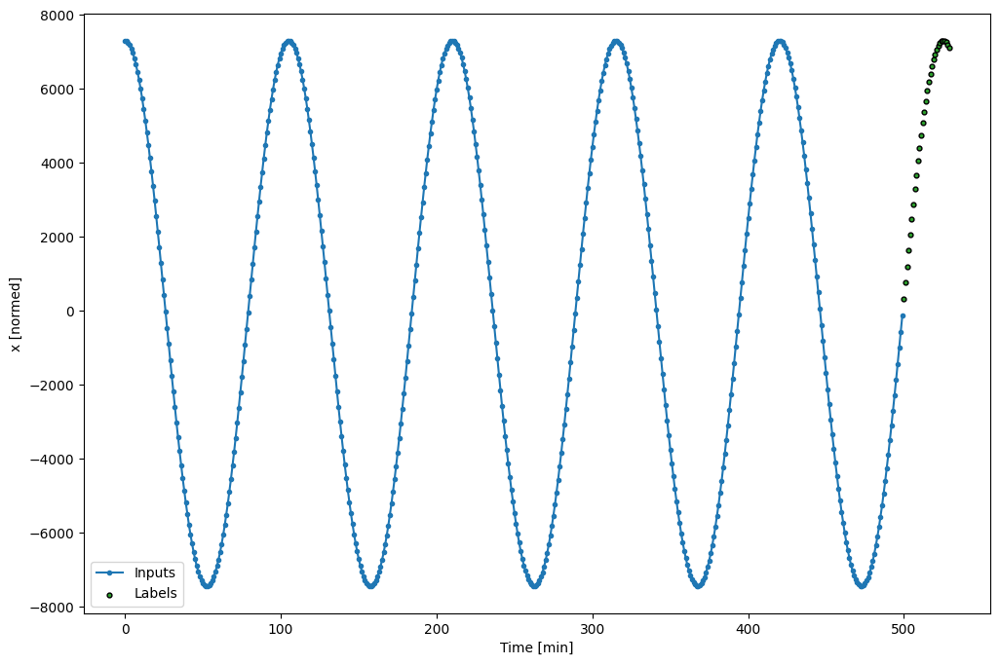

In [62]:
# multi_window_PINN.plot(max_subplots=1, plot_col='x')
multi_window_Dense.plot(max_subplots=1, plot_col='x')

# Normal Dense (non physically informed)

#### IN 1000 OUT 30, 16 8 16 DENSE

In [16]:
MAX_EPOCHS = 100

import tensorflow.keras.backend as K
import tensorflow as tf
from tensorflow.keras import callbacks

import tensorflow as tf
tf.config.run_functions_eagerly(True)


def compile_and_fit(model, window, epochs = MAX_EPOCHS, patience=15):
  early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                                    patience=patience,
                                                    mode='min')


  model.compile(loss=tf.keras.losses.MeanSquaredError(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=[tf.keras.metrics.MeanAbsoluteError()],)


  history = model.fit(window.train, epochs=epochs,
                      validation_data=window.val,
                      callbacks=[early_stopping])
  return history

multi_linear_model_Dense = tf.keras.Sequential([
    # Take the last time-step.
    # Shape [batch, time, features] => [batch, 1, features]
    tf.keras.layers.Lambda(lambda x: x[:, -INPUT_STEPS:, :]),
    # tf.keras.layers.Conv1D(filters=128,
    #                        kernel_size=(INPUT_STEPS,),
    #                        activation='relu'),

    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dense(8, activation='relu'),
    tf.keras.layers.Dense(16, activation='relu'),
    
    tf.keras.layers.Flatten(),
    # Shape => [batch, 1, out_steps*features]
    tf.keras.layers.Dense(OUT_STEPS*num_features_Dense,
                          kernel_initializer=tf.keras.initializers.HeNormal()),
    # Shape => [batch, out_steps, features]
    tf.keras.layers.Reshape([OUT_STEPS, num_features_Dense])
])


model = multi_linear_model_Dense
# model.build((None, None, 6))
dataset = multi_window_Dense

optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)
epochs = 100

# historyDense = compile_and_fit(model, dataset, epochs)

nrOfRuns = 7
all_losses_training = []
all_losses_validation = []
for i in range(nrOfRuns):
  print("Run: ", i)
  historyDense = compile_and_fit(model, dataset, epochs)
  # Collect the losses from each run
  all_losses_training.append(historyDense.history["loss"])
  all_losses_validation.append(historyDense.history["val_loss"])



Run:  0
Epoch 1/100


c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\tensorflow\python\data\ops\structured_function.py:256: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


346/346 [==============================] - 25s 71ms/step - loss: 0.0375 - mean_absolute_error: 0.0603 - val_loss: 0.1879 - val_mean_absolute_error: 0.3693
Epoch 2/100
346/346 [==============================] - 23s 66ms/step - loss: 0.0246 - mean_absolute_error: 0.0495 - val_loss: 0.3504 - val_mean_absolute_error: 0.4858
Epoch 3/100
346/346 [==============================] - 23s 67ms/step - loss: 0.0095 - mean_absolute_error: 0.0366 - val_loss: 0.4810 - val_mean_absolute_error: 0.5503
Epoch 4/100
346/346 [==============================] - 24s 69ms/step - loss: 0.0022 - mean_absolute_error: 0.0155 - val_loss: 0.6528 - val_mean_absolute_error: 0.5820
Epoch 5/100
346/346 [==============================] - 24s 71ms/step - loss: 0.0014 - mean_absolute_error: 0.0134 - val_loss: 0.4784 - val_mean_absolute_error: 0.5319
Epoch 6/100
210/346 [=================>............] - ETA: 9s - loss: 0.0060 - mean_absolute_error: 0.0282

C:\Users\jpfun\AppData\Local\Temp\ipykernel_58776\3014549408.py:9: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  all_losses_training = np.array(all_losses_training)
C:\Users\jpfun\AppData\Local\Temp\ipykernel_58776\3014549408.py:10: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  all_losses_validation = np.array(all_losses_validation)
c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\numpy\lib\nanfunctions.py:1670: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,

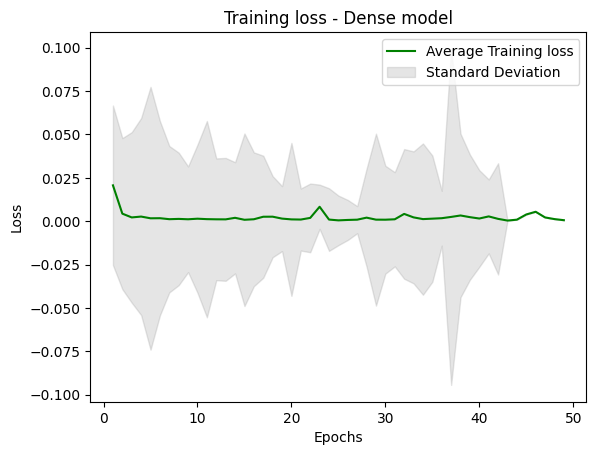

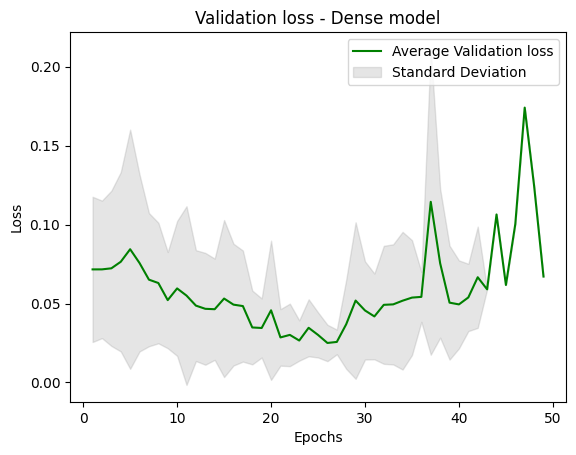

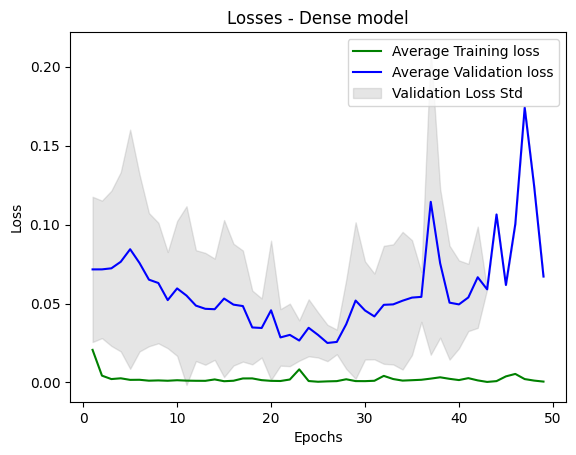

In [ ]:
from itertools import zip_longest
import os

current_dir = os.getcwd()
results_dir = os.path.join(current_dir, 'Dense/16816/In1000_Out30/')
if not os.path.isdir(results_dir):
    os.makedirs(results_dir)

all_losses_training = np.array(all_losses_training)
all_losses_validation = np.array(all_losses_validation)

avg_loss_training = [np.mean([x[i] for x in all_losses_training if len(x) > i]) for i in range(len(max(all_losses_training,key=len)))]
std_loss_training = np.nan_to_num(np.nanstd(np.array(list(zip_longest(*all_losses_training)),dtype=float),axis=1,ddof=1), copy=False)

avg_loss_validation = [np.mean([x[i] for x in all_losses_validation if len(x) > i]) for i in range(len(max(all_losses_validation,key=len)))]
std_loss_validation = np.nan_to_num(np.nanstd(np.array(list(zip_longest(*all_losses_validation)),dtype=float),axis=1,ddof=1), copy=False)

# Plot the average losses with shaded standard deviation
#create vector of 1 to length of avg_loss_training for x-axis
epochNrs = np.arange(1, len(avg_loss_training)+1, 1)
plt.plot(epochNrs, avg_loss_training, 'g', label='Average Training loss')
plt.fill_between(epochNrs, avg_loss_training - std_loss_validation, avg_loss_training + std_loss_validation, color='gray', alpha=0.2, label='Standard Deviation')
plt.title('Training loss - Dense model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig(results_dir + 'dense-training-loss-16816.pdf')  
plt.show()

epochNrs = np.arange(1, len(avg_loss_validation)+1, 1)
plt.plot(epochNrs, avg_loss_validation, 'g', label='Average Validation loss')
plt.fill_between(epochNrs, avg_loss_validation - std_loss_validation, avg_loss_validation + std_loss_validation, color='gray', alpha=0.2, label='Standard Deviation')
plt.title('Validation loss - Dense model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig(results_dir + 'dense-validation-loss-16816.pdf')  
plt.show()

epochNrs = np.arange(1, len(avg_loss_validation)+1, 1)
plt.plot(epochNrs, avg_loss_training, 'g', label='Average Training loss')
plt.plot(epochNrs, avg_loss_validation, 'b', label='Average Validation loss')
plt.fill_between(epochNrs, avg_loss_validation - std_loss_validation, avg_loss_validation + std_loss_validation, color='gray', alpha=0.2, label='Validation Loss Std')
plt.title('Losses - Dense model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig(results_dir + 'dense-allLosses-16816.pdf')  
plt.show()



<MapDataset element_spec=(TensorSpec(shape=(None, 1000, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>


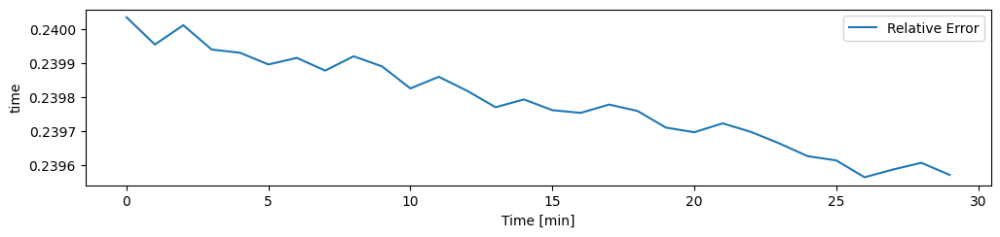

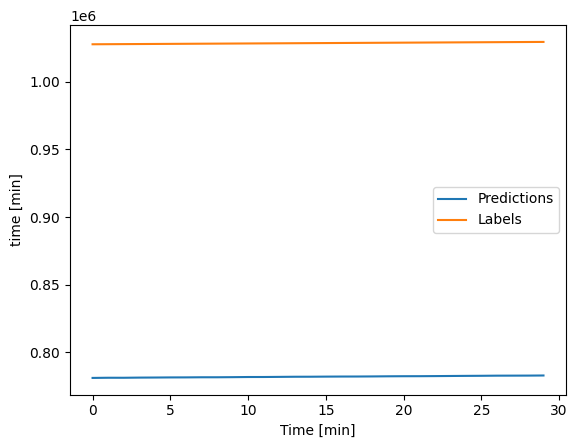

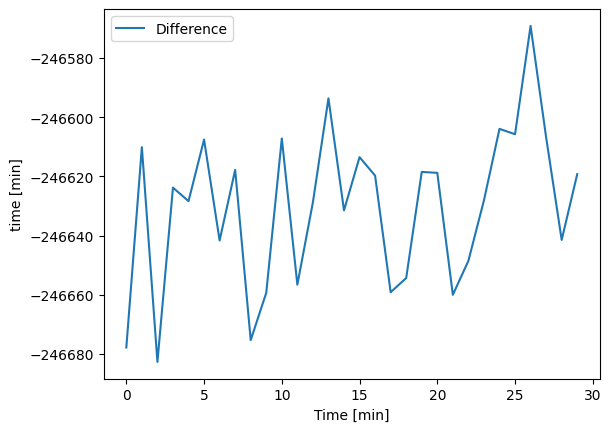

c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\tensorflow\python\data\ops\structured_function.py:256: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


<MapDataset element_spec=(TensorSpec(shape=(None, 1000, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>


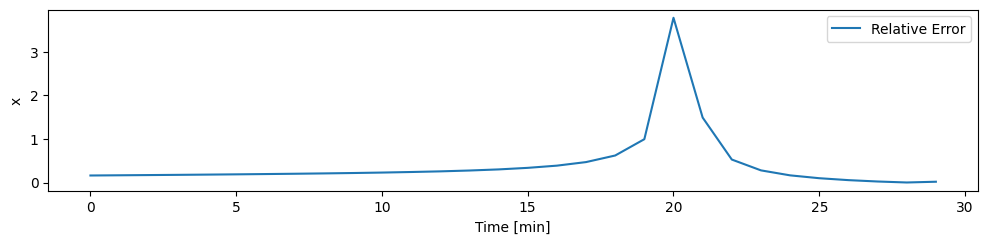

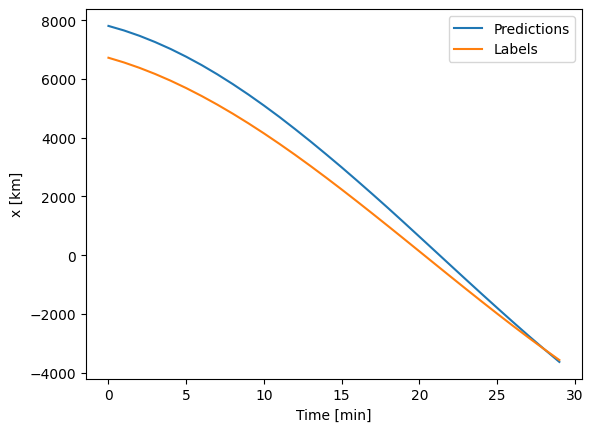

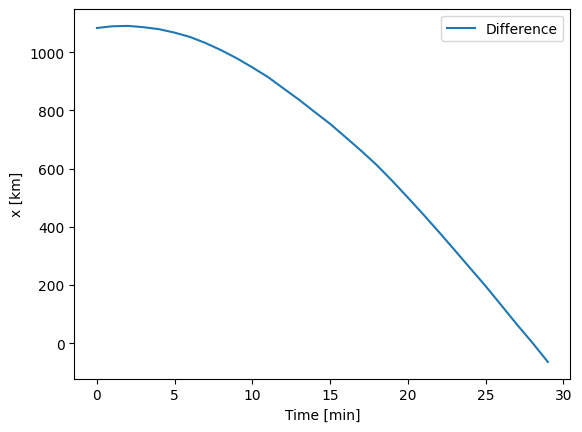

c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\tensorflow\python\data\ops\structured_function.py:256: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


<MapDataset element_spec=(TensorSpec(shape=(None, 1000, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>


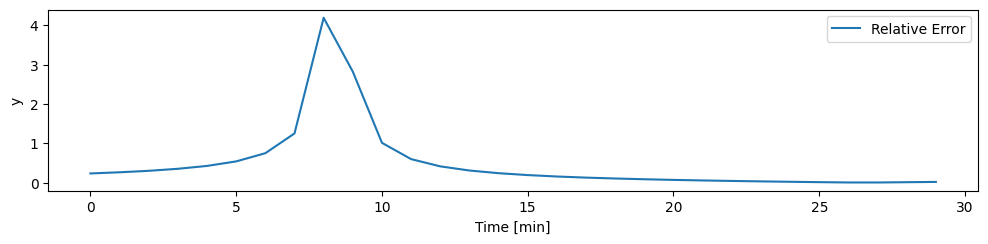

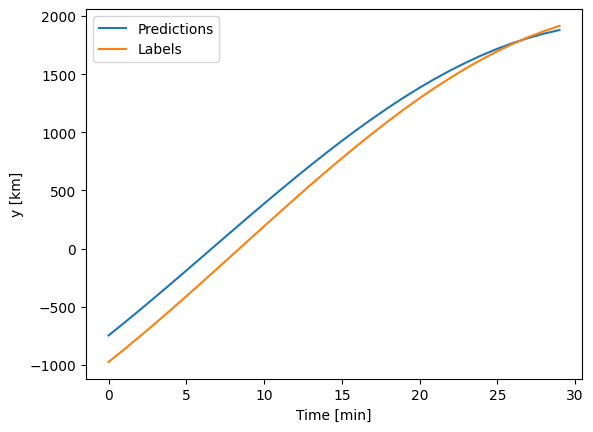

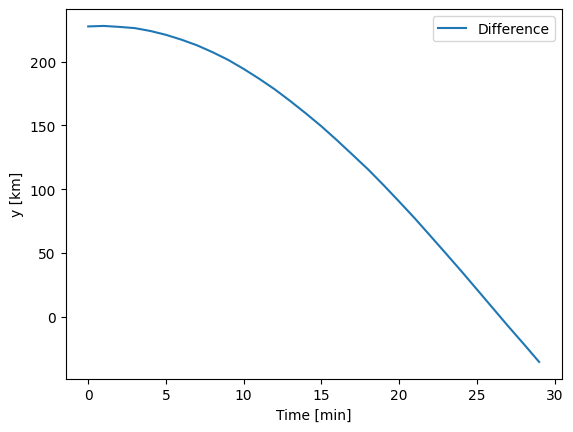

c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\tensorflow\python\data\ops\structured_function.py:256: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


<MapDataset element_spec=(TensorSpec(shape=(None, 1000, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>


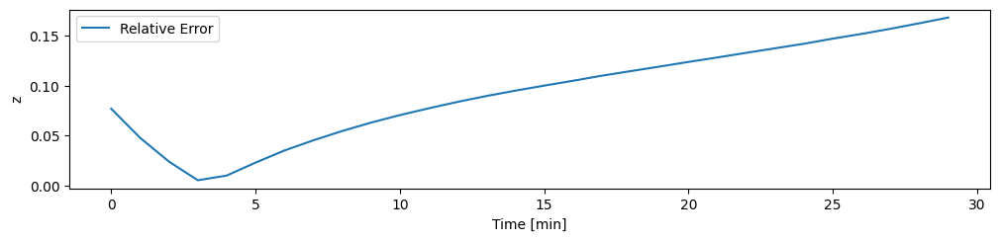

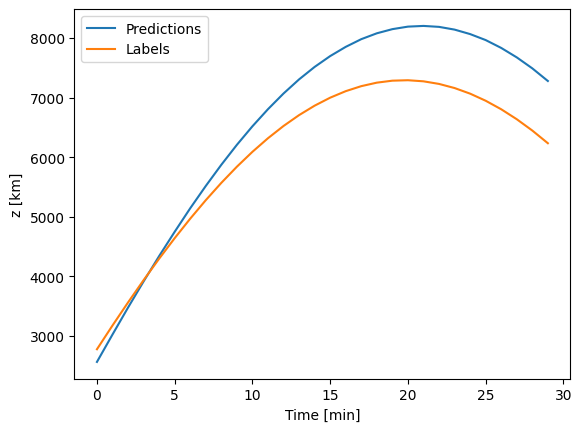

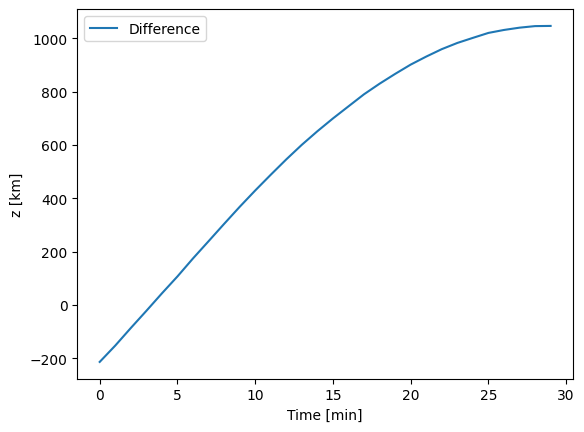

c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\tensorflow\python\data\ops\structured_function.py:256: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


<MapDataset element_spec=(TensorSpec(shape=(None, 1000, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>


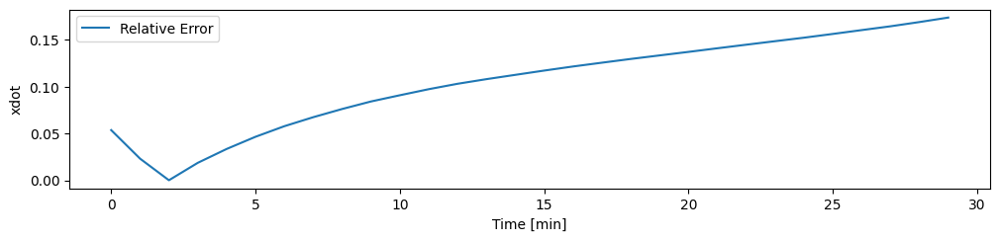

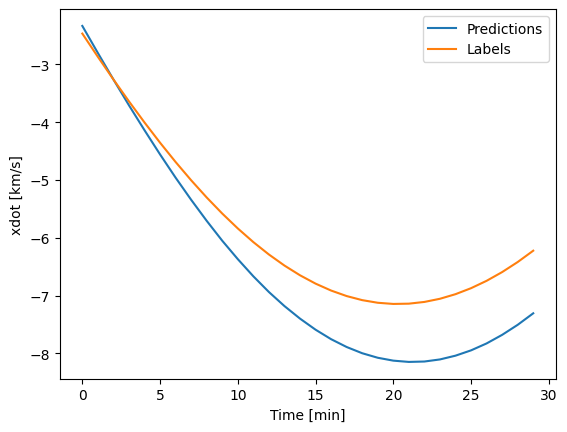

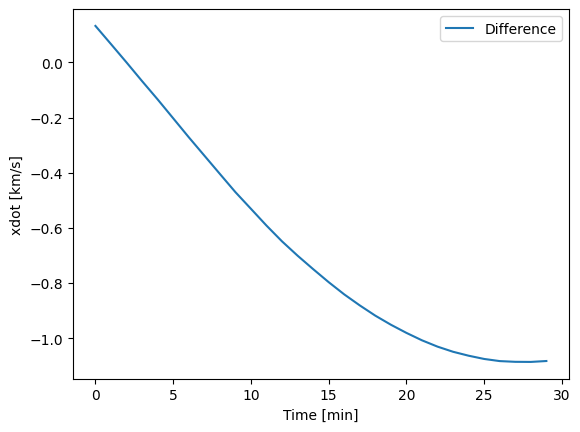

c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\tensorflow\python\data\ops\structured_function.py:256: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


<MapDataset element_spec=(TensorSpec(shape=(None, 1000, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>


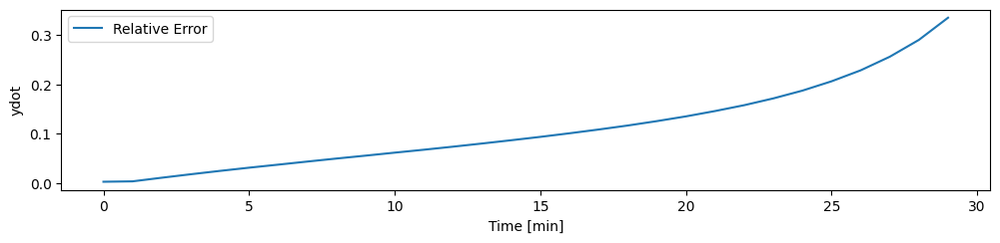

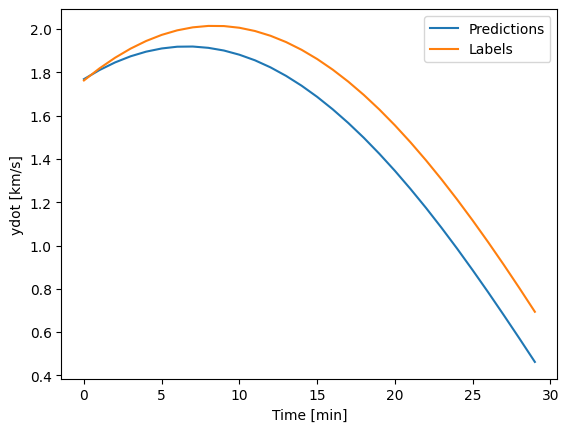

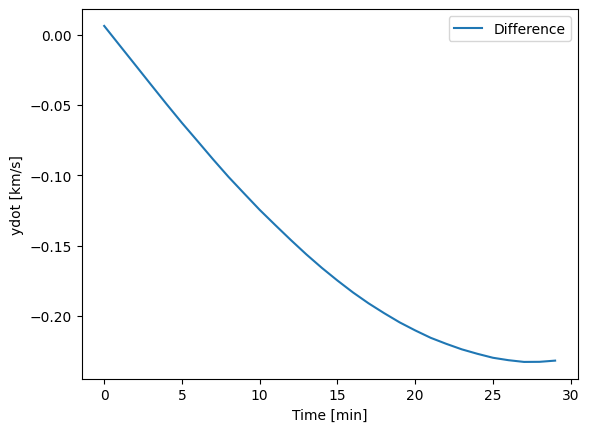

c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\tensorflow\python\data\ops\structured_function.py:256: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


<MapDataset element_spec=(TensorSpec(shape=(None, 1000, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>


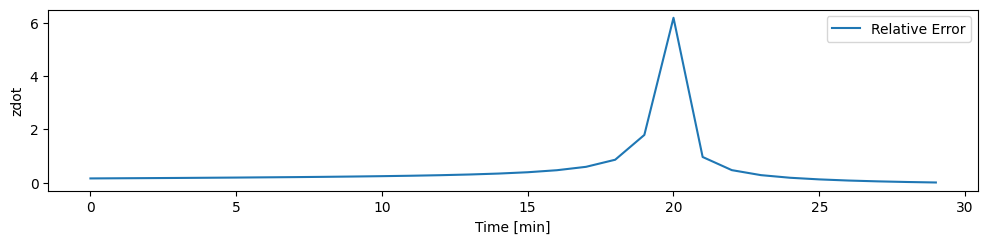

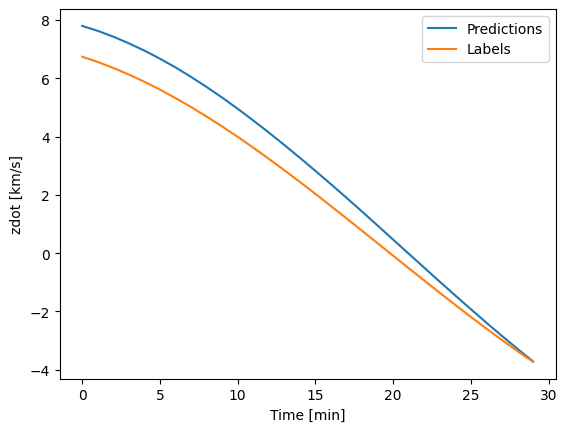

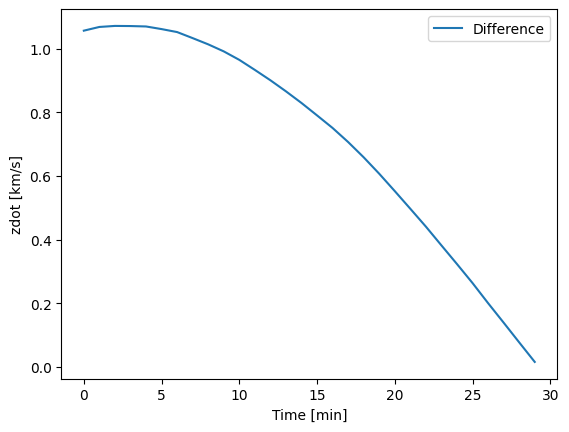

c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\tensorflow\python\data\ops\structured_function.py:256: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


Mean Errors: 
X:  564.8203735351562
Y:  125.55177307128906
Z:  802.890380859375
XDOT:  0.8297539949417114
YDOT:  0.17147712409496307
ZDOT:  0.5440608859062195


In [ ]:
import IPython
import IPython.display
import os

#plot the difference between the real and the predicted values with the column as a parameter
def plot_diff_Dense(model, window, max_subplots=1, column=0, plot_col = "x", plot_units = "[km]"):
    
    #window.test?
    print(window.test)
    inputs, labels = next(iter(window.test))
    
    inputs = inputs.numpy()
    labels = labels.numpy()
    predictions = model(inputs)
    predictions = predictions.numpy()
    
    inputs = inputs * train_std_Dense[column] + train_mean_Dense[column]
    labels = labels * train_std_Dense[column] + train_mean_Dense[column]
    predictions  = predictions * train_std_Dense[column] + train_mean_Dense[column]
    
    plt.figure(figsize=(12, 8))
    max_n = min(max_subplots, len(inputs))


    for n in range(max_n):
            plt.subplot(3, 1, n+1)

            #fazer legendas diferentes para as velocidades
            plt.ylabel(plot_col)
            plt.plot(np.abs((predictions[n, :, column] - labels[n, :, column])/ labels[n, :, column]) ,label='Relative Error')
            plt.xlabel('Time [min]')
            plt.legend()
            plt.savefig(results_dir + 'dense-training-relativeError-16816-' + plot_col + '.pdf')  
            plt.show()

            plt.ylabel(plot_col + ' ' + plot_units)
            plt.plot(predictions[n, :, column] ,label='Predictions')
            plt.plot(labels[n, :, column] ,label='Labels')
            plt.xlabel('Time [min]')
            plt.legend()
            plt.savefig(results_dir + 'dense-training-PredictionsVSLabels-16816-' + plot_col + '.pdf')  
            plt.show()

            plt.ylabel(plot_col + ' ' + plot_units)
            plt.plot((predictions[n, :, column] - labels[n, :, column]) ,label='Difference')
            plt.xlabel('Time [min]')
            plt.legend()
            plt.savefig(results_dir + 'dense-training-Difference-16816-' + plot_col + '.pdf')  
            plt.show()


plot_diff_Dense(model, multi_window_Dense, column=0, plot_col = "time", plot_units = "[min]")
plot_diff_Dense(model, multi_window_Dense, column=1, plot_col = "x", plot_units = "[km]")
plot_diff_Dense(model, multi_window_Dense, column=2, plot_col = "y", plot_units = "[km]")
plot_diff_Dense(model, multi_window_Dense, column=3, plot_col = "z", plot_units = "[km]")
plot_diff_Dense(model, multi_window_Dense, column=4, plot_col = "xdot", plot_units = "[km/s]")
plot_diff_Dense(model, multi_window_Dense, column=5, plot_col = "ydot", plot_units = "[km/s]")
plot_diff_Dense(model, multi_window_Dense, column=6, plot_col = "zdot", plot_units = "[km/s]")



#calculate the mean absolute error for each column
def calculateMeanErrors(model, window, max_subplots=1, column=0):
    #repeat this for 10 trials and calculate the mean error
    meanError = 0
    nrTrials = 7
    for i in range(nrTrials):
        inputs, labels = next(iter(window.test))
        inputs = inputs.numpy()
        labels = labels.numpy()
        predictions = model(inputs)
        predictions = predictions.numpy()
        
        inputs = inputs * train_std_Dense[column] + train_mean_Dense[column]
        labels = labels * train_std_Dense[column] + train_mean_Dense[column]
        predictions  = predictions * train_std_Dense[column] + train_mean_Dense[column]
        
        meanError += np.mean(np.abs(predictions[:, :, column] - labels[:, :, column]))
    meanError = meanError/nrTrials
    return meanError
    
    
    
meanErrorX = calculateMeanErrors(model, multi_window_Dense, column=1)
meanErrorY = calculateMeanErrors(model, multi_window_Dense, column=2)
meanErrorZ = calculateMeanErrors(model, multi_window_Dense, column=3)
meanErrorXDOT = calculateMeanErrors(model, multi_window_Dense, column=4)
meanErrorYDOT = calculateMeanErrors(model, multi_window_Dense, column=5)
meanErrorZDOT = calculateMeanErrors(model, multi_window_Dense, column=6)

print("Mean Errors: ")
print("X: ", meanErrorX)
print("Y: ", meanErrorY)
print("Z: ", meanErrorZ)
print("XDOT: ", meanErrorXDOT)
print("YDOT: ", meanErrorYDOT)
print("ZDOT: ", meanErrorZDOT)


#### IN 1000 OUT 30, 32 16 32 DENSE

In [ ]:
MAX_EPOCHS = 100

import tensorflow.keras.backend as K
import tensorflow as tf
from tensorflow.keras import callbacks

import tensorflow as tf
tf.config.run_functions_eagerly(True)


def compile_and_fit(model, window, epochs = MAX_EPOCHS, patience=15):
  early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                                    patience=patience,
                                                    mode='min')


  model.compile(loss=tf.keras.losses.MeanSquaredError(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=[tf.keras.metrics.MeanAbsoluteError()],)


  history = model.fit(window.train, epochs=epochs,
                      validation_data=window.val,
                      callbacks=[early_stopping])
  return history

multi_linear_model_Dense_in1000_out30_321632 = tf.keras.Sequential([
    # Take the last time-step.
    # Shape [batch, time, features] => [batch, 1, features]
    tf.keras.layers.Lambda(lambda x: x[:, -INPUT_STEPS:, :]),
    # tf.keras.layers.Conv1D(filters=128,
    #                        kernel_size=(INPUT_STEPS,),
    #                        activation='relu'),

    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),
    
    tf.keras.layers.Flatten(),
    # Shape => [batch, 1, out_steps*features]
    tf.keras.layers.Dense(OUT_STEPS*num_features_Dense,
                          kernel_initializer=tf.keras.initializers.HeNormal()),
    # Shape => [batch, out_steps, features]
    tf.keras.layers.Reshape([OUT_STEPS, num_features_Dense])
])


model_in1000_out30_321632 = multi_linear_model_Dense_in1000_out30_321632
# model.build((None, None, 6))
dataset = multi_window_Dense

optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)
epochs = 100

# historyDense = compile_and_fit(model, dataset, epochs)

nrOfRuns = 7
all_losses_training_in1000_out30_321632 = []
all_losses_validation_in1000_out30_321632 = []
for i in range(nrOfRuns):
  print("Run: ", i)
  historyDense_in1000_out30_321632 = compile_and_fit(model_in1000_out30_321632, dataset, epochs)
  # Collect the losses from each run
  all_losses_training_in1000_out30_321632.append(historyDense_in1000_out30_321632.history["loss"])
  all_losses_validation_in1000_out30_321632.append(historyDense_in1000_out30_321632.history["val_loss"])



Run:  0
Epoch 1/100
346/346 [==============================] - 38s 110ms/step - loss: 0.0766 - mean_absolute_error: 0.0957 - val_loss: 0.0361 - val_mean_absolute_error: 0.1558
Epoch 2/100
346/346 [==============================] - 38s 111ms/step - loss: 0.0094 - mean_absolute_error: 0.0345 - val_loss: 0.0458 - val_mean_absolute_error: 0.1791
Epoch 3/100
346/346 [==============================] - 38s 110ms/step - loss: 0.0034 - mean_absolute_error: 0.0155 - val_loss: 0.0817 - val_mean_absolute_error: 0.2289
Epoch 4/100
346/346 [==============================] - 39s 112ms/step - loss: 0.0030 - mean_absolute_error: 0.0182 - val_loss: 0.0665 - val_mean_absolute_error: 0.2162
Epoch 5/100
346/346 [==============================] - 38s 110ms/step - loss: 0.0029 - mean_absolute_error: 0.0163 - val_loss: 0.0637 - val_mean_absolute_error: 0.2080
Epoch 6/100
346/346 [==============================] - 38s 110ms/step - loss: 0.0020 - mean_absolute_error: 0.0201 - val_loss: 0.0480 - val_mean_absolut

C:\Users\jpfun\AppData\Local\Temp\ipykernel_58776\1796300756.py:9: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  all_losses_training_in1000_out30_321632 = np.array(all_losses_training_in1000_out30_321632)
C:\Users\jpfun\AppData\Local\Temp\ipykernel_58776\1796300756.py:10: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  all_losses_validation_in1000_out30_321632 = np.array(all_losses_validation_in1000_out30_321632)
c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\numpy\lib\nanfunctions.py:1670: RuntimeWarning: Degrees of freed

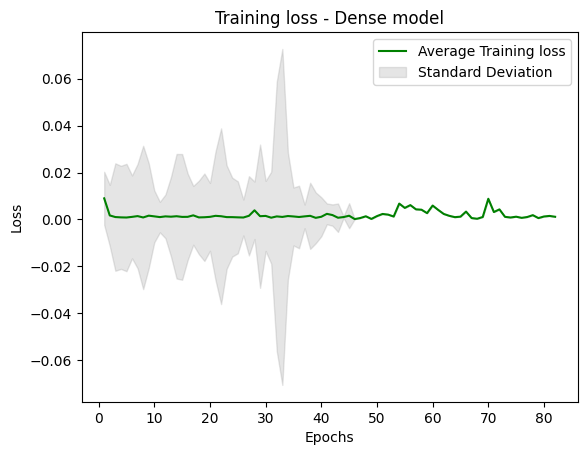

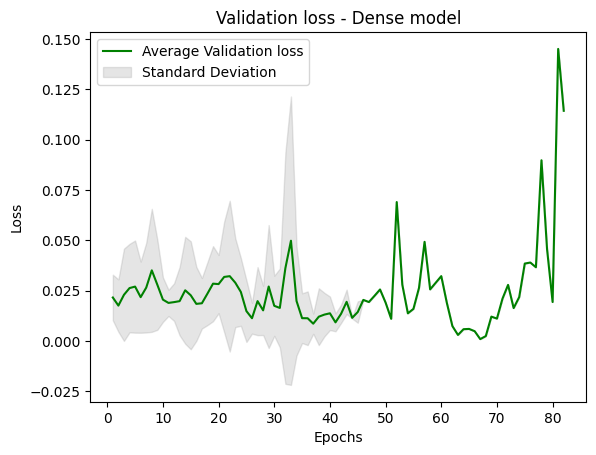

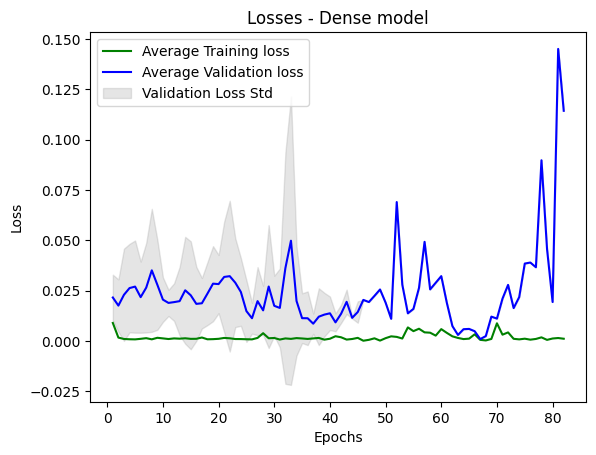

In [ ]:
from itertools import zip_longest
import os

current_dir = os.getcwd()
results_dir = os.path.join(current_dir, 'Dense/321632/In1000_Out30/')
if not os.path.isdir(results_dir):
    os.makedirs(results_dir)

all_losses_training_in1000_out30_321632 = np.array(all_losses_training_in1000_out30_321632)
all_losses_validation_in1000_out30_321632 = np.array(all_losses_validation_in1000_out30_321632)

avg_loss_training = [np.mean([x[i] for x in all_losses_training_in1000_out30_321632 if len(x) > i]) for i in range(len(max(all_losses_training_in1000_out30_321632,key=len)))]
std_loss_training = np.nan_to_num(np.nanstd(np.array(list(zip_longest(*all_losses_training_in1000_out30_321632)),dtype=float),axis=1,ddof=1), copy=False)

avg_loss_validation = [np.mean([x[i] for x in all_losses_validation_in1000_out30_321632 if len(x) > i]) for i in range(len(max(all_losses_validation_in1000_out30_321632,key=len)))]
std_loss_validation = np.nan_to_num(np.nanstd(np.array(list(zip_longest(*all_losses_validation_in1000_out30_321632)),dtype=float),axis=1,ddof=1), copy=False)

# Plot the average losses with shaded standard deviation
#create vector of 1 to length of avg_loss_training for x-axis
epochNrs = np.arange(1, len(avg_loss_training)+1, 1)
plt.plot(epochNrs, avg_loss_training, 'g', label='Average Training loss')
plt.fill_between(epochNrs, avg_loss_training - std_loss_validation, avg_loss_training + std_loss_validation, color='gray', alpha=0.2, label='Standard Deviation')
plt.title('Training loss - Dense model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig(results_dir + 'dense-training-loss-321632.pdf')  
plt.show()

epochNrs = np.arange(1, len(avg_loss_validation)+1, 1)
plt.plot(epochNrs, avg_loss_validation, 'g', label='Average Validation loss')
plt.fill_between(epochNrs, avg_loss_validation - std_loss_validation, avg_loss_validation + std_loss_validation, color='gray', alpha=0.2, label='Standard Deviation')
plt.title('Validation loss - Dense model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig(results_dir + 'dense-validation-loss-321632.pdf')  
plt.show()

epochNrs = np.arange(1, len(avg_loss_validation)+1, 1)
plt.plot(epochNrs, avg_loss_training, 'g', label='Average Training loss')
plt.plot(epochNrs, avg_loss_validation, 'b', label='Average Validation loss')
plt.fill_between(epochNrs, avg_loss_validation - std_loss_validation, avg_loss_validation + std_loss_validation, color='gray', alpha=0.2, label='Validation Loss Std')
plt.title('Losses - Dense model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig(results_dir + 'dense-allLosses-321632.pdf')  
plt.show()

c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\tensorflow\python\data\ops\structured_function.py:256: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


<MapDataset element_spec=(TensorSpec(shape=(None, 1000, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>


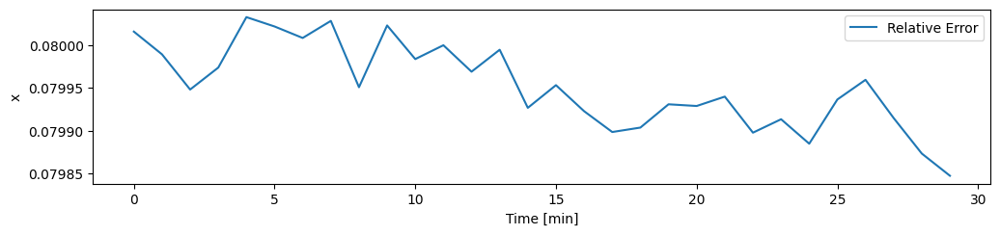

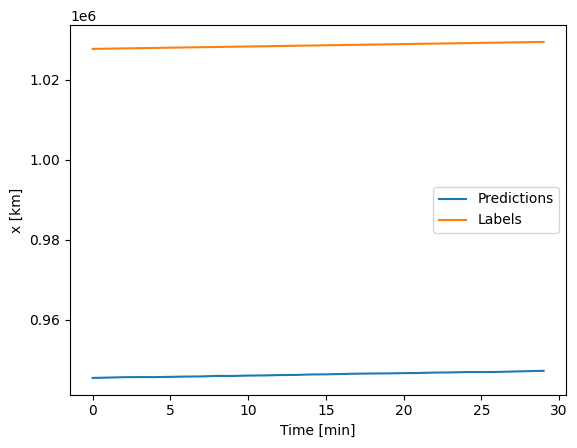

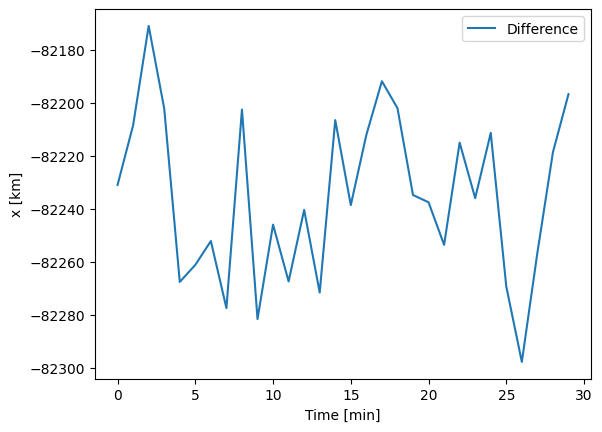

c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\tensorflow\python\data\ops\structured_function.py:256: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


<MapDataset element_spec=(TensorSpec(shape=(None, 1000, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>


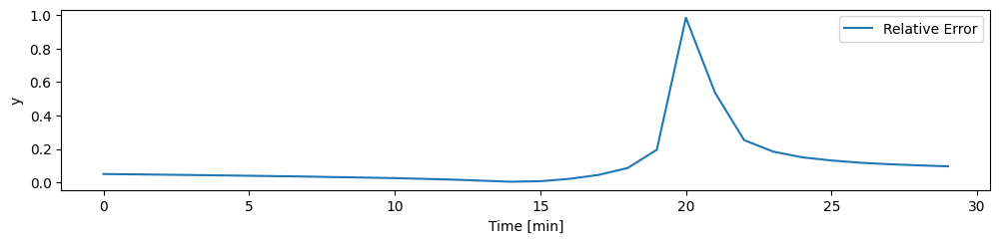

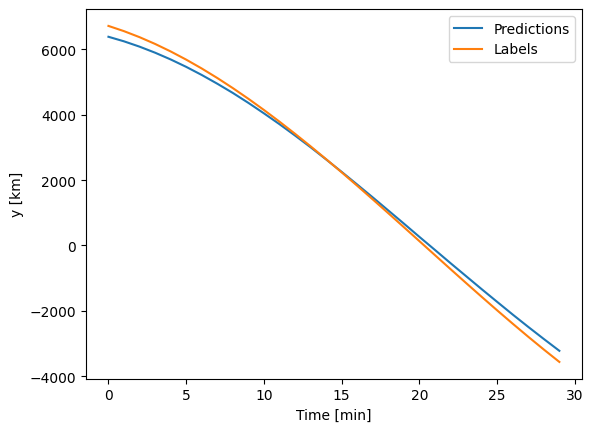

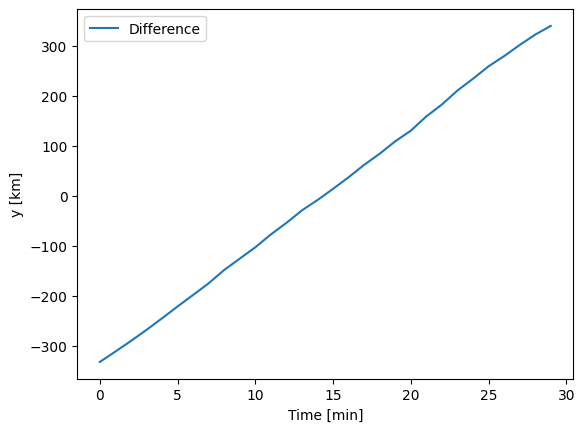

c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\tensorflow\python\data\ops\structured_function.py:256: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


<MapDataset element_spec=(TensorSpec(shape=(None, 1000, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>


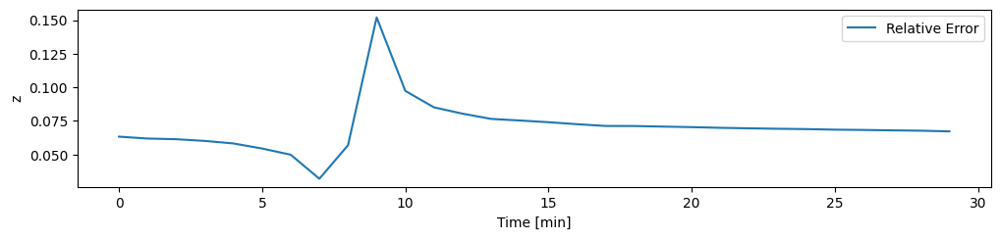

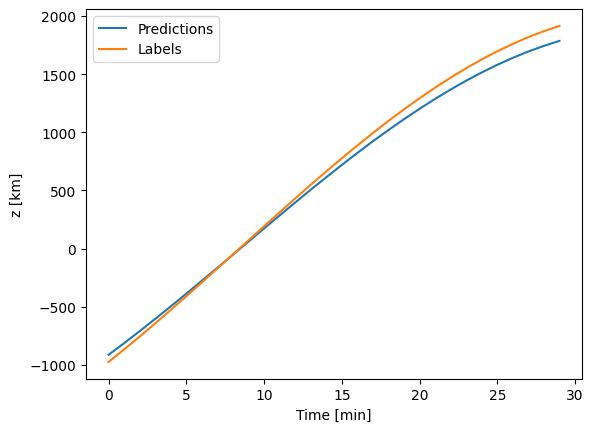

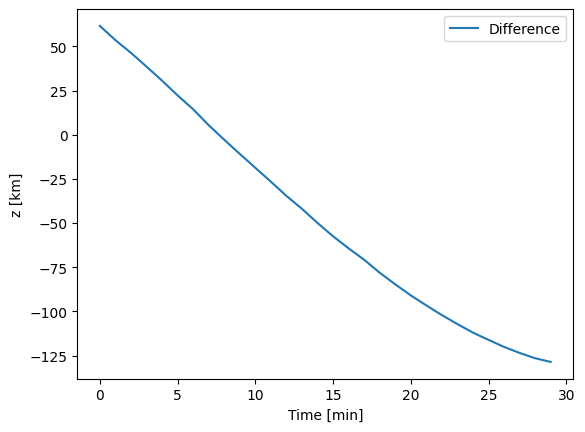

c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\tensorflow\python\data\ops\structured_function.py:256: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


<MapDataset element_spec=(TensorSpec(shape=(None, 1000, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>


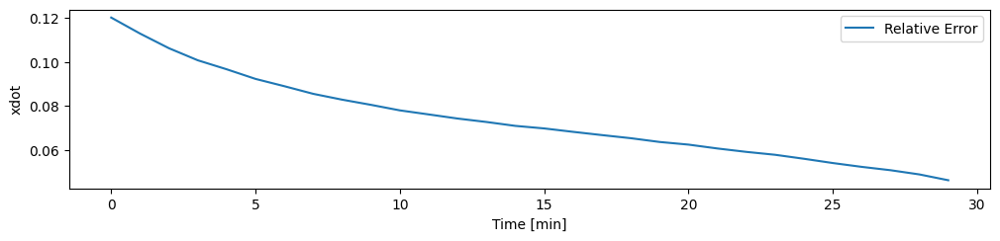

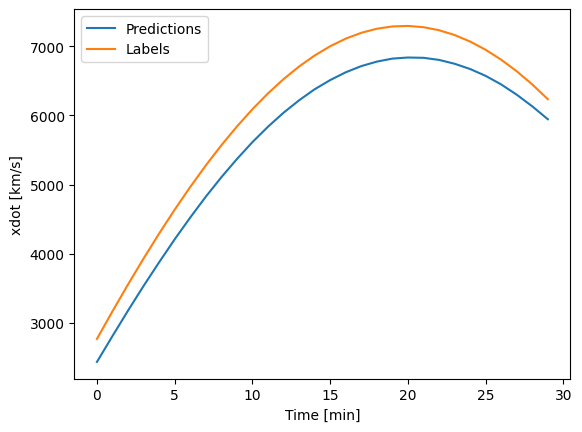

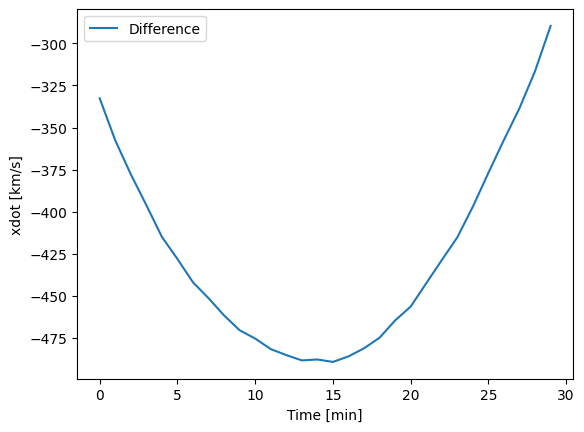

c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\tensorflow\python\data\ops\structured_function.py:256: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


<MapDataset element_spec=(TensorSpec(shape=(None, 1000, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>


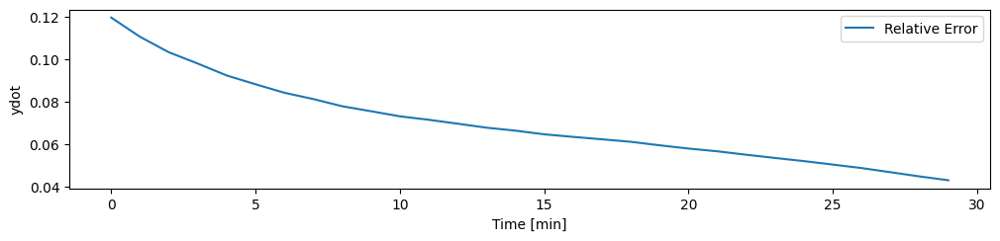

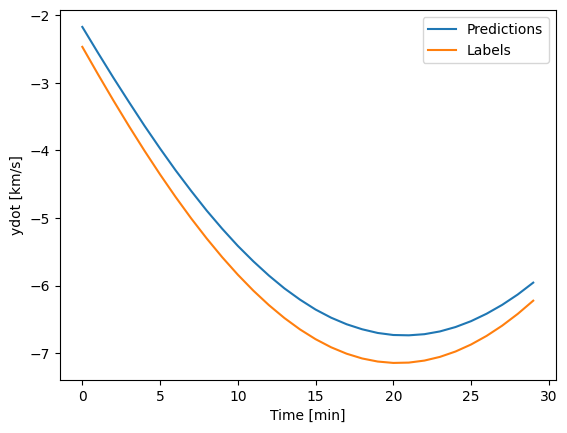

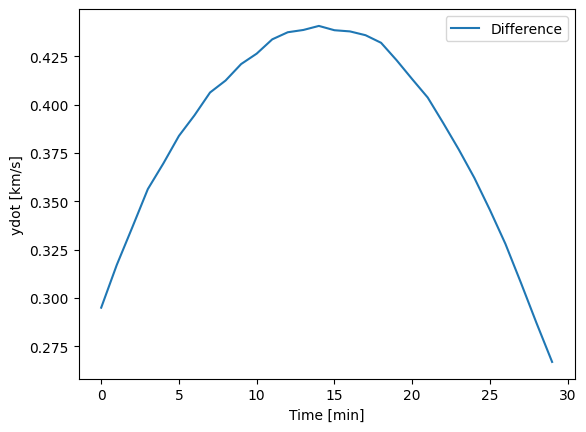

c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\tensorflow\python\data\ops\structured_function.py:256: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


<MapDataset element_spec=(TensorSpec(shape=(None, 1000, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>


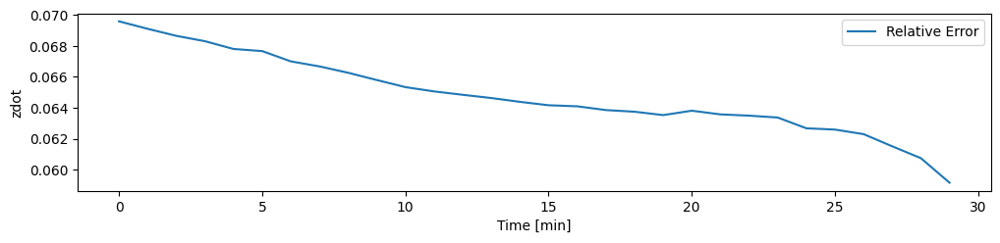

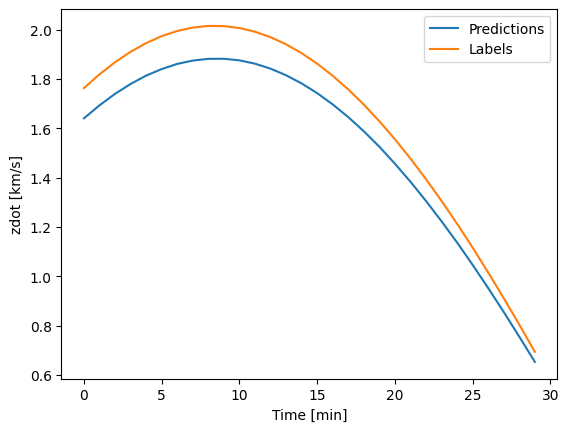

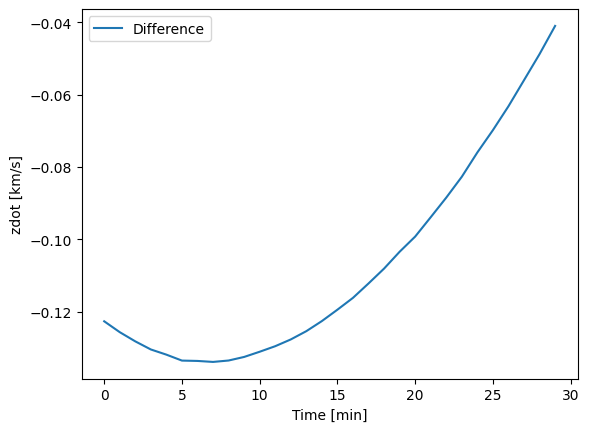

c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\tensorflow\python\data\ops\structured_function.py:256: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


<MapDataset element_spec=(TensorSpec(shape=(None, 1000, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>
<MapDataset element_spec=(TensorSpec(shape=(None, 1000, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>
<MapDataset element_spec=(TensorSpec(shape=(None, 1000, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>
<MapDataset element_spec=(TensorSpec(shape=(None, 1000, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>
<MapDataset element_spec=(TensorSpec(shape=(None, 1000, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>
<MapDataset element_spec=(TensorSpec(shape=(None, 1000, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>
Mean Errors: 
X:  82570.87
Y:  290.05942
Z:  102.853806
XDOT:  304.2308
YDOT:  0.2

In [ ]:
import IPython
import IPython.display
import os

#plot the difference between the real and the predicted values with the column as a parameter
def plot_diff_Dense(model, window, max_subplots=1, column=0, plot_col = "x", plot_units = "[km]"):
    
    #window.test?
    print(window.test)
    inputs, labels = next(iter(window.test))
    
    inputs = inputs.numpy()
    labels = labels.numpy()
    predictions = model(inputs)
    predictions = predictions.numpy()
    
    inputs = inputs * train_std_Dense[column] + train_mean_Dense[column]
    labels = labels * train_std_Dense[column] + train_mean_Dense[column]
    predictions  = predictions * train_std_Dense[column] + train_mean_Dense[column]
    
    plt.figure(figsize=(12, 8))
    max_n = min(max_subplots, len(inputs))


    for n in range(max_n):
            plt.subplot(3, 1, n+1)

            #fazer legendas diferentes para as velocidades
            plt.ylabel(plot_col)
            plt.plot(np.abs((predictions[n, :, column] - labels[n, :, column])/ labels[n, :, column]) ,label='Relative Error')
            plt.xlabel('Time [min]')
            plt.legend()
            plt.savefig(results_dir + 'dense-training-relativeError-321632-' + plot_col + '.pdf')  
            plt.show()

            plt.ylabel(plot_col + ' ' + plot_units)
            plt.plot(predictions[n, :, column] ,label='Predictions')
            plt.plot(labels[n, :, column] ,label='Labels')
            plt.xlabel('Time [min]')
            plt.legend()
            plt.savefig(results_dir + 'dense-training-PredictionsVSLabels-321632-' + plot_col + '.pdf')  
            plt.show()

            plt.ylabel(plot_col + ' ' + plot_units)
            plt.plot((predictions[n, :, column] - labels[n, :, column]) ,label='Difference')
            plt.xlabel('Time [min]')
            plt.legend()
            plt.savefig(results_dir + 'dense-training-Difference-321632-' + plot_col + '.pdf')  
            plt.show()

plot_diff_Dense(model_in1000_out30_321632, multi_window_Dense, column=0, plot_col = "time", plot_units = "[min]")
plot_diff_Dense(model_in1000_out30_321632, multi_window_Dense, column=1, plot_col = "x", plot_units = "[km]")
plot_diff_Dense(model_in1000_out30_321632, multi_window_Dense, column=2, plot_col = "y", plot_units = "[km]")
plot_diff_Dense(model_in1000_out30_321632, multi_window_Dense, column=3, plot_col = "z", plot_units = "[km]")
plot_diff_Dense(model_in1000_out30_321632, multi_window_Dense, column=4, plot_col = "xdot", plot_units = "[km/s]")
plot_diff_Dense(model_in1000_out30_321632, multi_window_Dense, column=5, plot_col = "ydot", plot_units = "[km/s]")
plot_diff_Dense(model_in1000_out30_321632, multi_window_Dense, column=6, plot_col = "zdot", plot_units = "[km/s]")



#calculate the mean absolute error for each column
def calculateMeanErrors(model, window, max_subplots=1, column=0):
    #repeat this for 10 trials and calculate the mean error
    meanError = 0
    nrTrials = 7
    for i in range(nrTrials):
        inputs, labels = next(iter(window.test))
        inputs = inputs.numpy()
        labels = labels.numpy()
        predictions = model(inputs)
        predictions = predictions.numpy()
        
        inputs = inputs * train_std_Dense[column] + train_mean_Dense[column]
        labels = labels * train_std_Dense[column] + train_mean_Dense[column]
        predictions  = predictions * train_std_Dense[column] + train_mean_Dense[column]
        
        meanError += np.mean(np.abs(predictions[:, :, column] - labels[:, :, column]))
    meanError = meanError/nrTrials
    return meanError
    
    
meanErrorX = calculateMeanErrors(model_in1000_out30_321632, multi_window_Dense, column=1)
meanErrorY = calculateMeanErrors(model_in1000_out30_321632, multi_window_Dense, column=2)
meanErrorZ = calculateMeanErrors(model_in1000_out30_321632, multi_window_Dense, column=3)
meanErrorXDOT = calculateMeanErrors(model_in1000_out30_321632, multi_window_Dense, column=4)
meanErrorYDOT = calculateMeanErrors(model_in1000_out30_321632, multi_window_Dense, column=5)
meanErrorZDOT = calculateMeanErrors(model_in1000_out30_321632, multi_window_Dense, column=6)

print("Mean Errors: ")
print("X: ", meanErrorX)
print("Y: ", meanErrorY)
print("Z: ", meanErrorZ)
print("XDOT: ", meanErrorXDOT)
print("YDOT: ", meanErrorYDOT)
print("ZDOT: ", meanErrorZDOT)


#### IN 1000 OUT 30, 32 8 32 DENSE

In [ ]:
MAX_EPOCHS = 100

import tensorflow.keras.backend as K
import tensorflow as tf
from tensorflow.keras import callbacks

import tensorflow as tf
tf.config.run_functions_eagerly(True)


def compile_and_fit(model, window, epochs = MAX_EPOCHS, patience=15):
  early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                                    patience=patience,
                                                    mode='min')


  model.compile(loss=tf.keras.losses.MeanSquaredError(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=[tf.keras.metrics.MeanAbsoluteError()],)


  history = model.fit(window.train, epochs=epochs,
                      validation_data=window.val,
                      callbacks=[early_stopping])
  return history

multi_linear_model_Dense_in1000_out30_32832 = tf.keras.Sequential([
    # Take the last time-step.
    # Shape [batch, time, features] => [batch, 1, features]
    tf.keras.layers.Lambda(lambda x: x[:, -INPUT_STEPS:, :]),
    # tf.keras.layers.Conv1D(filters=128,
    #                        kernel_size=(INPUT_STEPS,),
    #                        activation='relu'),

    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(8, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),
    
    tf.keras.layers.Flatten(),
    # Shape => [batch, 1, out_steps*features]
    tf.keras.layers.Dense(OUT_STEPS*num_features_Dense,
                          kernel_initializer=tf.keras.initializers.HeNormal()),
    # Shape => [batch, out_steps, features]
    tf.keras.layers.Reshape([OUT_STEPS, num_features_Dense])
])


model_in1000_out30_32832 = multi_linear_model_Dense_in1000_out30_32832
# model.build((None, None, 6))
dataset = multi_window_Dense

optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)
epochs = 100

# historyDense = compile_and_fit(model, dataset, epochs)

nrOfRuns = 7
all_losses_training_in1000_out30_32832 = []
all_losses_validation_in1000_out30_32832 = []
for i in range(nrOfRuns):
  print("Run: ", i)
  historyDense_in1000_out30_32832 = compile_and_fit(model_in1000_out30_32832, dataset, epochs)
  # Collect the losses from each run
  all_losses_training_in1000_out30_32832.append(historyDense_in1000_out30_32832.history["loss"])
  all_losses_validation_in1000_out30_32832.append(historyDense_in1000_out30_32832.history["val_loss"])



Run:  0
Epoch 1/100
346/346 [==============================] - 37s 108ms/step - loss: 0.0696 - mean_absolute_error: 0.1041 - val_loss: 0.0562 - val_mean_absolute_error: 0.1905
Epoch 2/100
346/346 [==============================] - 37s 108ms/step - loss: 0.0277 - mean_absolute_error: 0.0482 - val_loss: 0.8210 - val_mean_absolute_error: 0.7426
Epoch 3/100
346/346 [==============================] - 37s 108ms/step - loss: 0.0076 - mean_absolute_error: 0.0277 - val_loss: 0.1779 - val_mean_absolute_error: 0.3166
Epoch 4/100
346/346 [==============================] - 38s 108ms/step - loss: 0.0195 - mean_absolute_error: 0.0413 - val_loss: 0.1612 - val_mean_absolute_error: 0.3023
Epoch 5/100
346/346 [==============================] - 37s 108ms/step - loss: 0.1195 - mean_absolute_error: 0.1308 - val_loss: 0.5352 - val_mean_absolute_error: 0.5613
Epoch 6/100
346/346 [==============================] - 39s 112ms/step - loss: 0.0099 - mean_absolute_error: 0.0262 - val_loss: 0.5157 - val_mean_absolut

C:\Users\jpfun\AppData\Local\Temp\ipykernel_58776\1715408483.py:9: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  all_losses_training_in1000_out30_32832 = np.array(all_losses_training_in1000_out30_32832)
C:\Users\jpfun\AppData\Local\Temp\ipykernel_58776\1715408483.py:10: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  all_losses_validation_in1000_out30_32832 = np.array(all_losses_validation_in1000_out30_32832)
c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\numpy\lib\nanfunctions.py:1670: RuntimeWarning: Degrees of freedom <

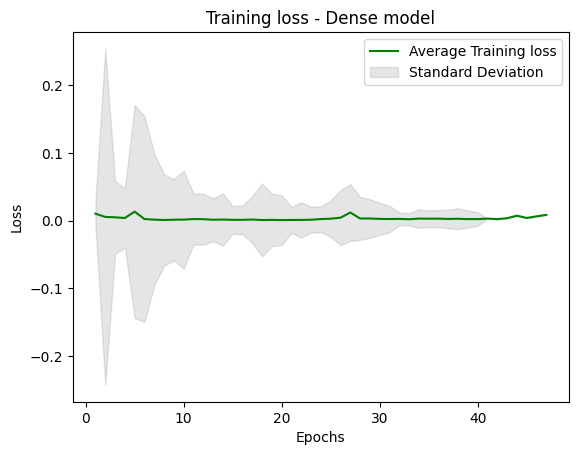

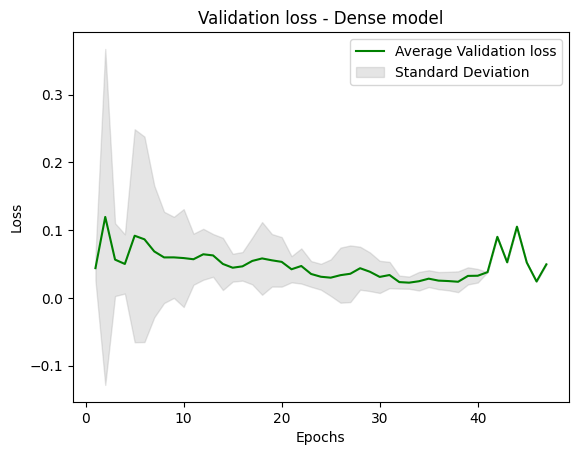

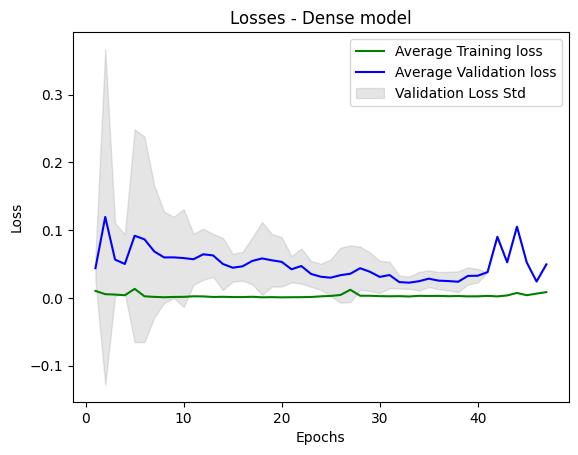

In [ ]:
from itertools import zip_longest
import os

current_dir = os.getcwd()
results_dir = os.path.join(current_dir, 'Dense/32832/In1000_Out30/')
if not os.path.isdir(results_dir):
    os.makedirs(results_dir)

all_losses_training_in1000_out30_32832 = np.array(all_losses_training_in1000_out30_32832)
all_losses_validation_in1000_out30_32832 = np.array(all_losses_validation_in1000_out30_32832)

avg_loss_training = [np.mean([x[i] for x in all_losses_training_in1000_out30_32832 if len(x) > i]) for i in range(len(max(all_losses_training_in1000_out30_32832,key=len)))]
std_loss_training = np.nan_to_num(np.nanstd(np.array(list(zip_longest(*all_losses_training_in1000_out30_32832)),dtype=float),axis=1,ddof=1), copy=False)

avg_loss_validation = [np.mean([x[i] for x in all_losses_validation_in1000_out30_32832 if len(x) > i]) for i in range(len(max(all_losses_validation_in1000_out30_32832,key=len)))]
std_loss_validation = np.nan_to_num(np.nanstd(np.array(list(zip_longest(*all_losses_validation_in1000_out30_32832)),dtype=float),axis=1,ddof=1), copy=False)

# Plot the average losses with shaded standard deviation
#create vector of 1 to length of avg_loss_training for x-axis
epochNrs = np.arange(1, len(avg_loss_training)+1, 1)
plt.plot(epochNrs, avg_loss_training, 'g', label='Average Training loss')
plt.fill_between(epochNrs, avg_loss_training - std_loss_validation, avg_loss_training + std_loss_validation, color='gray', alpha=0.2, label='Standard Deviation')
plt.title('Training loss - Dense model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig(results_dir + 'dense-training-loss-32832.pdf')  
plt.show()

epochNrs = np.arange(1, len(avg_loss_validation)+1, 1)
plt.plot(epochNrs, avg_loss_validation, 'g', label='Average Validation loss')
plt.fill_between(epochNrs, avg_loss_validation - std_loss_validation, avg_loss_validation + std_loss_validation, color='gray', alpha=0.2, label='Standard Deviation')
plt.title('Validation loss - Dense model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig(results_dir + 'dense-validation-loss-32832.pdf')  
plt.show()

epochNrs = np.arange(1, len(avg_loss_validation)+1, 1)
plt.plot(epochNrs, avg_loss_training, 'g', label='Average Training loss')
plt.plot(epochNrs, avg_loss_validation, 'b', label='Average Validation loss')
plt.fill_between(epochNrs, avg_loss_validation - std_loss_validation, avg_loss_validation + std_loss_validation, color='gray', alpha=0.2, label='Validation Loss Std')
plt.title('Losses - Dense model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig(results_dir + 'dense-allLosses-32832.pdf')  
plt.show()



c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\tensorflow\python\data\ops\structured_function.py:256: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


<MapDataset element_spec=(TensorSpec(shape=(None, 1000, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>


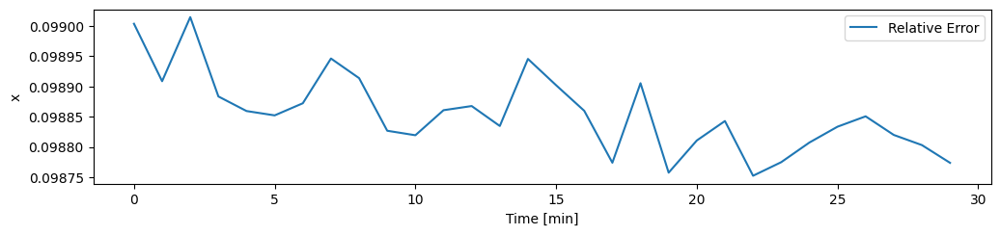

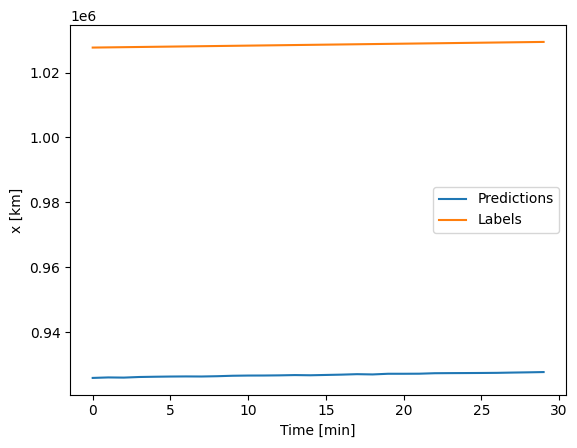

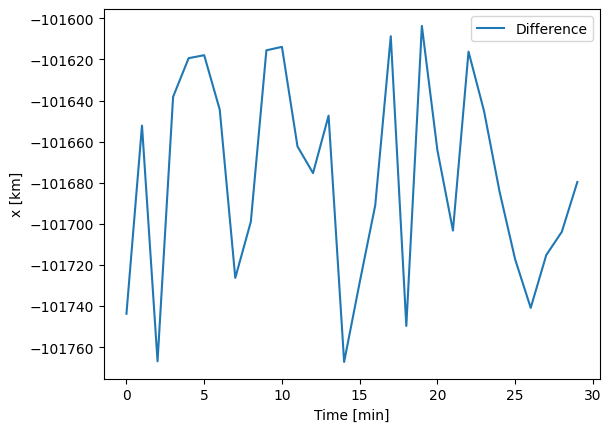

c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\tensorflow\python\data\ops\structured_function.py:256: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


<MapDataset element_spec=(TensorSpec(shape=(None, 1000, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>


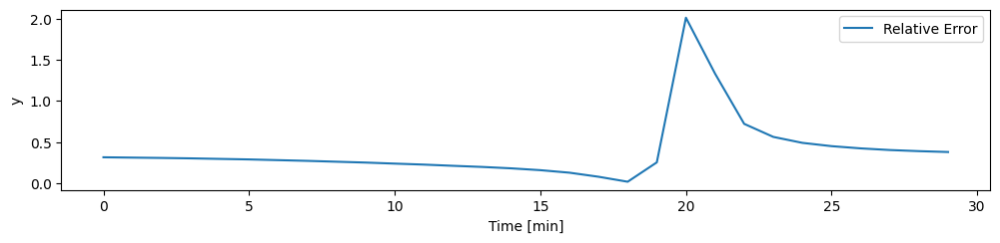

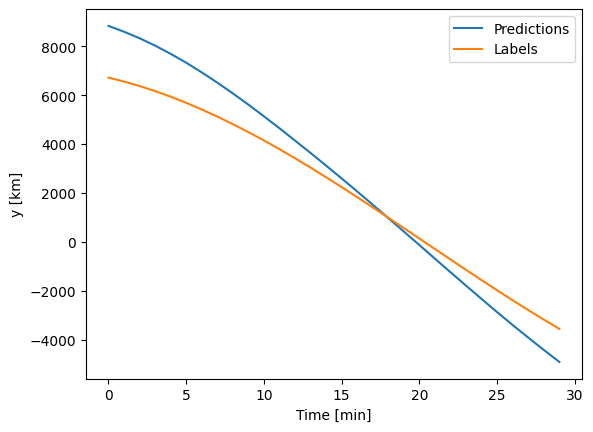

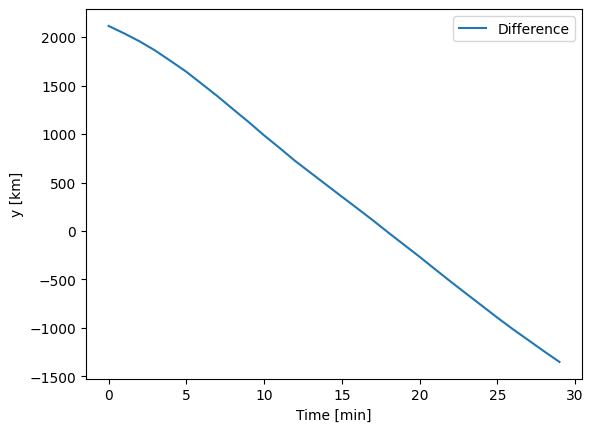

c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\tensorflow\python\data\ops\structured_function.py:256: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


<MapDataset element_spec=(TensorSpec(shape=(None, 1000, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>


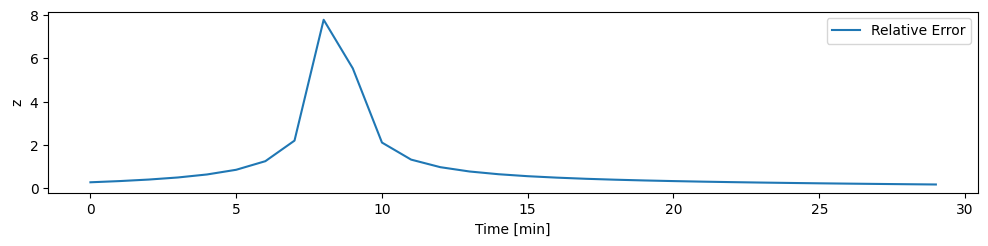

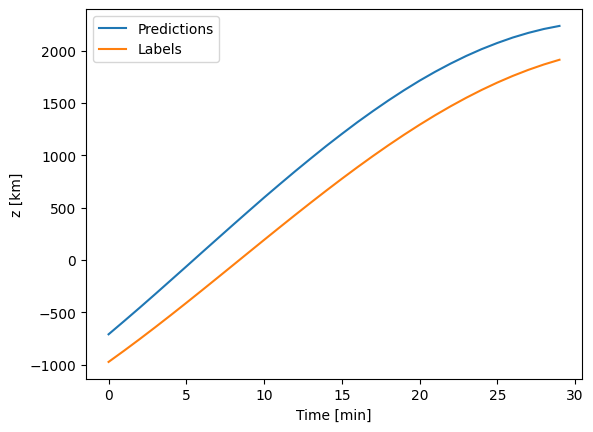

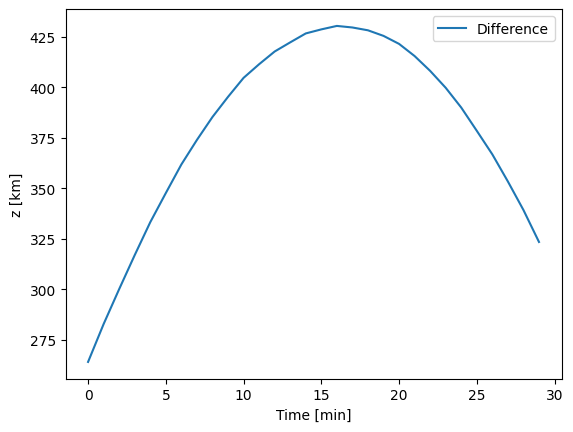

c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\tensorflow\python\data\ops\structured_function.py:256: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


<MapDataset element_spec=(TensorSpec(shape=(None, 1000, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>


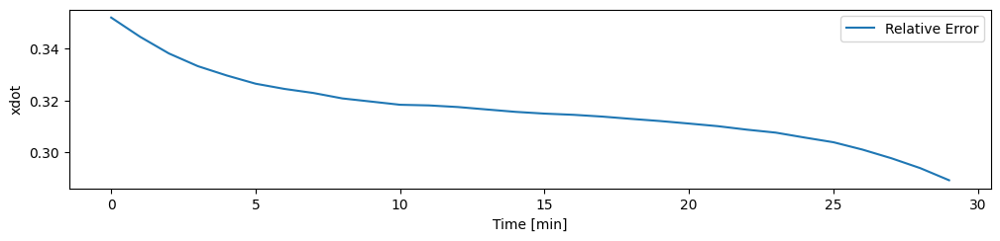

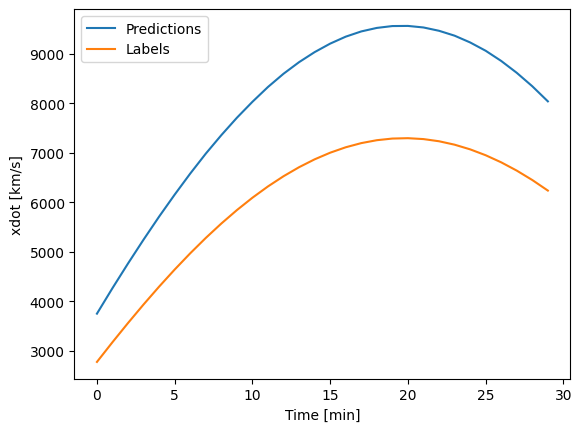

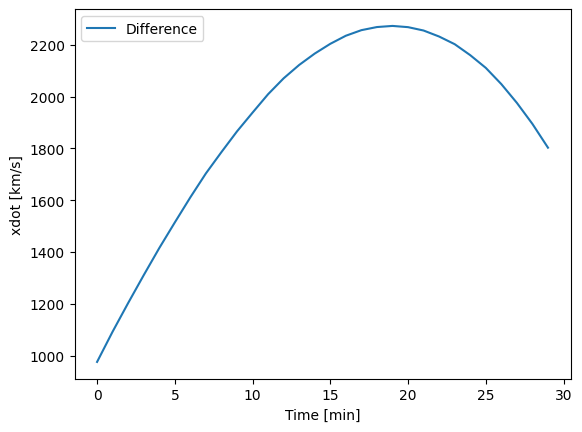

c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\tensorflow\python\data\ops\structured_function.py:256: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


<MapDataset element_spec=(TensorSpec(shape=(None, 1000, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>


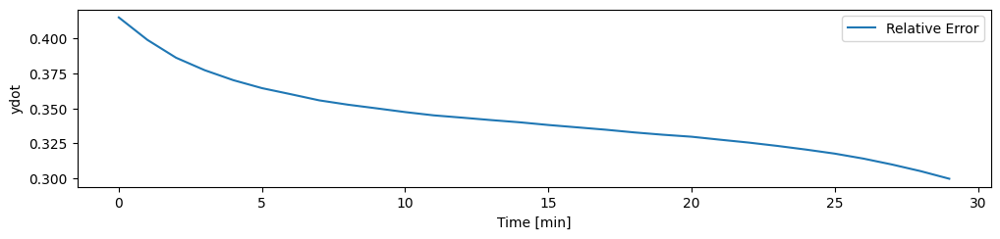

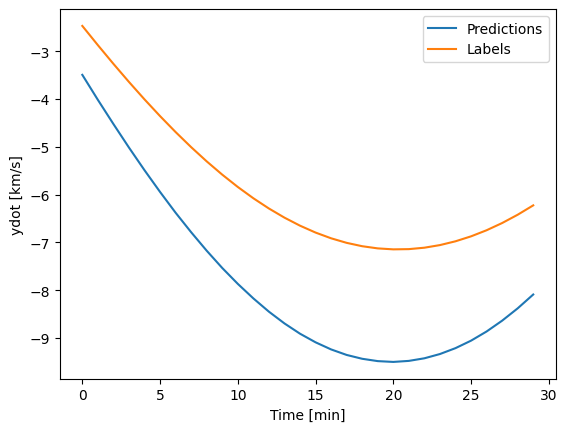

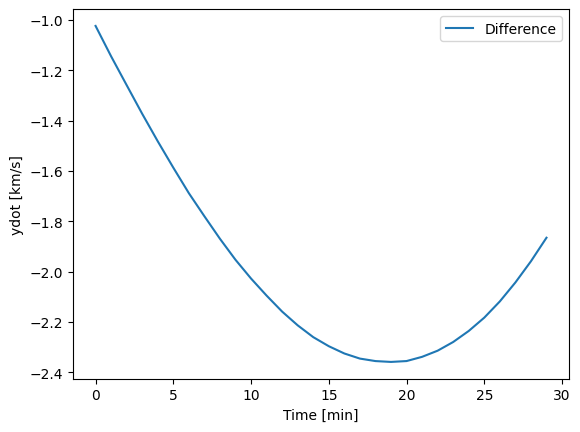

c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\tensorflow\python\data\ops\structured_function.py:256: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


<MapDataset element_spec=(TensorSpec(shape=(None, 1000, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>


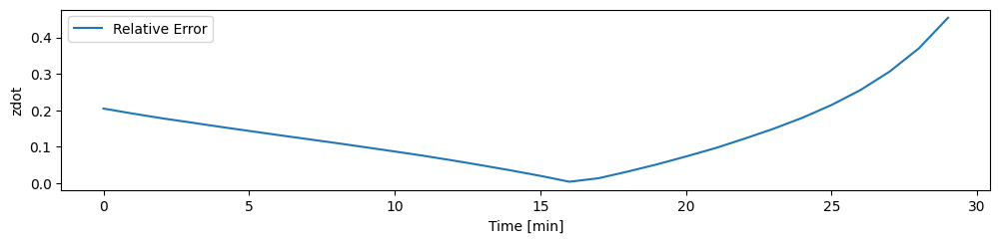

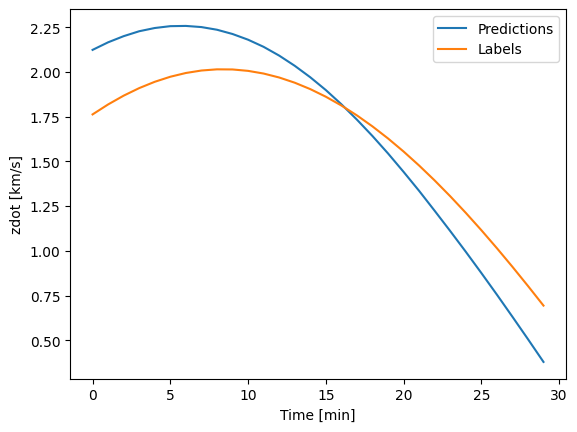

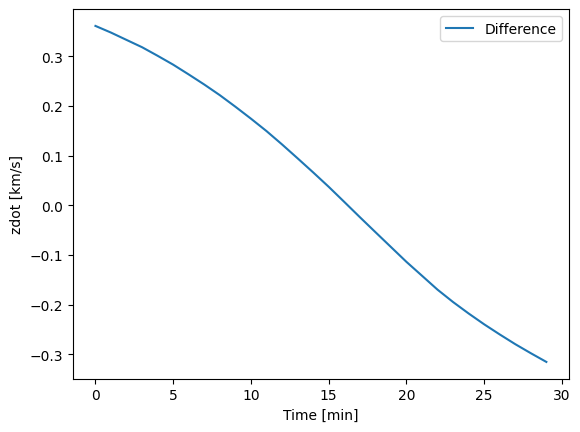

c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\tensorflow\python\data\ops\structured_function.py:256: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


<MapDataset element_spec=(TensorSpec(shape=(None, 1000, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>
<MapDataset element_spec=(TensorSpec(shape=(None, 1000, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>
<MapDataset element_spec=(TensorSpec(shape=(None, 1000, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>
<MapDataset element_spec=(TensorSpec(shape=(None, 1000, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>
<MapDataset element_spec=(TensorSpec(shape=(None, 1000, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>
<MapDataset element_spec=(TensorSpec(shape=(None, 1000, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>
Mean Errors: 
X:  100210.72
Y:  1578.1753
Z:  300.12064
XDOT:  1642.1135
YDOT:  1.

In [ ]:
import IPython
import IPython.display
import os

#plot the difference between the real and the predicted values with the column as a parameter
def plot_diff_Dense(model, window, max_subplots=1, column=0, plot_col = "x", plot_units = "[km]"):
    
    #window.test?
    print(window.test)
    inputs, labels = next(iter(window.test))
    
    inputs = inputs.numpy()
    labels = labels.numpy()
    predictions = model(inputs)
    predictions = predictions.numpy()
    
    inputs = inputs * train_std_Dense[column] + train_mean_Dense[column]
    labels = labels * train_std_Dense[column] + train_mean_Dense[column]
    predictions  = predictions * train_std_Dense[column] + train_mean_Dense[column]
    
    plt.figure(figsize=(12, 8))
    max_n = min(max_subplots, len(inputs))


    for n in range(max_n):
            plt.subplot(3, 1, n+1)

            #fazer legendas diferentes para as velocidades
            plt.ylabel(plot_col)
            plt.plot(np.abs((predictions[n, :, column] - labels[n, :, column])/ labels[n, :, column]) ,label='Relative Error')
            plt.xlabel('Time [min]')
            plt.legend()
            plt.savefig(results_dir + 'dense-training-relativeError-32832-' + plot_col + '.pdf')  
            plt.show()

            plt.ylabel(plot_col + ' ' + plot_units)
            plt.plot(predictions[n, :, column] ,label='Predictions')
            plt.plot(labels[n, :, column] ,label='Labels')
            plt.xlabel('Time [min]')
            plt.legend()
            plt.savefig(results_dir + 'dense-training-PredictionsVSLabels-32832-' + plot_col + '.pdf')  
            plt.show()

            plt.ylabel(plot_col + ' ' + plot_units)
            plt.plot((predictions[n, :, column] - labels[n, :, column]) ,label='Difference')
            plt.xlabel('Time [min]')
            plt.legend()
            plt.savefig(results_dir + 'dense-training-Difference-32832-' + plot_col + '.pdf')  
            plt.show()

plot_diff_Dense(model_in1000_out30_32832, multi_window_Dense, column=0, plot_col = "time", plot_units = "[min]")
plot_diff_Dense(model_in1000_out30_32832, multi_window_Dense, column=1, plot_col = "x", plot_units = "[km]")
plot_diff_Dense(model_in1000_out30_32832, multi_window_Dense, column=2, plot_col = "y", plot_units = "[km]")
plot_diff_Dense(model_in1000_out30_32832, multi_window_Dense, column=3, plot_col = "z", plot_units = "[km]")
plot_diff_Dense(model_in1000_out30_32832, multi_window_Dense, column=4, plot_col = "xdot", plot_units = "[km/s]")
plot_diff_Dense(model_in1000_out30_32832, multi_window_Dense, column=5, plot_col = "ydot", plot_units = "[km/s]")
plot_diff_Dense(model_in1000_out30_32832, multi_window_Dense, column=6, plot_col = "zdot", plot_units = "[km/s]")



#calculate the mean absolute error for each column
def calculateMeanErrors(model, window, max_subplots=1, column=0):
    #repeat this for 10 trials and calculate the mean error
    meanError = 0
    nrTrials = 7
    for i in range(nrTrials):
        inputs, labels = next(iter(window.test))
        inputs = inputs.numpy()
        labels = labels.numpy()
        predictions = model(inputs)
        predictions = predictions.numpy()
        
        inputs = inputs * train_std_Dense[column] + train_mean_Dense[column]
        labels = labels * train_std_Dense[column] + train_mean_Dense[column]
        predictions  = predictions * train_std_Dense[column] + train_mean_Dense[column]
        
        meanError += np.mean(np.abs(predictions[:, :, column] - labels[:, :, column]))
    meanError = meanError/nrTrials
    return meanError
    
    
meanErrorX = calculateMeanErrors(model_in1000_out30_32832, multi_window_Dense, column=1)
meanErrorY = calculateMeanErrors(model_in1000_out30_32832, multi_window_Dense, column=2)
meanErrorZ = calculateMeanErrors(model_in1000_out30_32832, multi_window_Dense, column=3)
meanErrorXDOT = calculateMeanErrors(model_in1000_out30_32832, multi_window_Dense, column=4)
meanErrorYDOT = calculateMeanErrors(model_in1000_out30_32832, multi_window_Dense, column=5)
meanErrorZDOT = calculateMeanErrors(model_in1000_out30_32832, multi_window_Dense, column=6)

print("Mean Errors: ")
print("X: ", meanErrorX)
print("Y: ", meanErrorY)
print("Z: ", meanErrorZ)
print("XDOT: ", meanErrorXDOT)
print("YDOT: ", meanErrorYDOT)
print("ZDOT: ", meanErrorZDOT)


#### IN 500 OUT 30, 16 8 16 DENSE

In [ ]:
INPUT_STEPS = 500
OUT_STEPS = 30
multi_window_PINN = WindowGenerator(input_width=INPUT_STEPS,
                               label_width=OUT_STEPS,
                               shift=OUT_STEPS,
                               label_columns=['time', 'x', 'y', 'z', 'xdot', 'ydot', 'zdot', 'xdotdot', 'ydotdot', 'zdotdot'],
                               train_df=train_df_PINN,
                               val_df=val_df_PINN,
                               test_df=test_df_PINN)

multi_window_Dense = WindowGenerator(input_width=INPUT_STEPS,
                                label_width=OUT_STEPS,
                                shift=OUT_STEPS,
                                label_columns=['time', 'x', 'y', 'z', 'xdot', 'ydot', 'zdot'],
                                train_df=train_df_Dense,
                                val_df=val_df_Dense,
                                test_df=test_df_Dense)

multi_val_performance_PINN = {}
multi_performance_PINN = {}

multi_val_performance_Dense = {}
multi_performance_Dense = {}

for example_inputs_PINN, example_labels_PINN in multi_window_PINN.train.take(1):
  print(f'Inputs shape (batch, time, features): {example_inputs_PINN.shape}')
  print(f'Labels shape (batch, time, features): {example_labels_PINN.shape}')

Inputs shape (batch, time, features): (32, 500, 10)
Labels shape (batch, time, features): (32, 30, 10)


c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\tensorflow\python\data\ops\structured_function.py:256: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


In [ ]:
MAX_EPOCHS = 100

import tensorflow.keras.backend as K
import tensorflow as tf
from tensorflow.keras import callbacks

import tensorflow as tf
tf.config.run_functions_eagerly(True)


def compile_and_fit(model, window, epochs = MAX_EPOCHS, patience=15):
  early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                                    patience=patience,
                                                    mode='min')


  model.compile(loss=tf.keras.losses.MeanSquaredError(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=[tf.keras.metrics.MeanAbsoluteError()],)


  history = model.fit(window.train, epochs=epochs,
                      validation_data=window.val,
                      callbacks=[early_stopping])
  return history

multi_linear_model_Dense_in500_out30_16816 = tf.keras.Sequential([
    # Take the last time-step.
    # Shape [batch, time, features] => [batch, 1, features]
    tf.keras.layers.Lambda(lambda x: x[:, -INPUT_STEPS:, :]),
    # tf.keras.layers.Conv1D(filters=128,
    #                        kernel_size=(INPUT_STEPS,),
    #                        activation='relu'),

    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dense(8, activation='relu'),
    tf.keras.layers.Dense(16, activation='relu'),
    
    tf.keras.layers.Flatten(),
    # Shape => [batch, 1, out_steps*features]
    tf.keras.layers.Dense(OUT_STEPS*num_features_Dense,
                          kernel_initializer=tf.keras.initializers.HeNormal()),
    # Shape => [batch, out_steps, features]
    tf.keras.layers.Reshape([OUT_STEPS, num_features_Dense])
])


model_in500_out30_16816 = multi_linear_model_Dense_in500_out30_16816
# model.build((None, None, 7))
dataset = multi_window_Dense

optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)
epochs = 100

# historyDense = compile_and_fit(model, dataset, epochs)

nrOfRuns = 7
all_losses_training_in500_out30_16816 = []
all_losses_validation_in500_out30_16816 = []
for i in range(nrOfRuns):
  print("Run: ", i)
  historyDense_in500_out30_16816 = compile_and_fit(model_in500_out30_16816, dataset, epochs)
  # Collect the losses from each run
  all_losses_training_in500_out30_16816.append(historyDense_in500_out30_16816.history["loss"])
  all_losses_validation_in500_out30_16816.append(historyDense_in500_out30_16816.history["val_loss"])



Run:  0
Epoch 1/100
362/362 [==============================] - 16s 45ms/step - loss: 0.0224 - mean_absolute_error: 0.0462 - val_loss: 0.0263 - val_mean_absolute_error: 0.1211
Epoch 2/100
362/362 [==============================] - 16s 45ms/step - loss: 0.0136 - mean_absolute_error: 0.0337 - val_loss: 0.8182 - val_mean_absolute_error: 0.4333
Epoch 3/100
362/362 [==============================] - 16s 44ms/step - loss: 0.0438 - mean_absolute_error: 0.0472 - val_loss: 0.1215 - val_mean_absolute_error: 0.2332
Epoch 4/100
362/362 [==============================] - 16s 45ms/step - loss: 0.0123 - mean_absolute_error: 0.0323 - val_loss: 0.2396 - val_mean_absolute_error: 0.2330
Epoch 5/100
362/362 [==============================] - 16s 43ms/step - loss: 0.0219 - mean_absolute_error: 0.0369 - val_loss: 0.0956 - val_mean_absolute_error: 0.2617
Epoch 6/100
362/362 [==============================] - 16s 44ms/step - loss: 0.0326 - mean_absolute_error: 0.0492 - val_loss: 0.2367 - val_mean_absolute_erro

C:\Users\jpfun\AppData\Local\Temp\ipykernel_58776\1202408780.py:9: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  all_losses_training_in500_out30_16816 = np.array(all_losses_training_in500_out30_16816)
C:\Users\jpfun\AppData\Local\Temp\ipykernel_58776\1202408780.py:10: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  all_losses_validation_in500_out30_16816 = np.array(all_losses_validation_in500_out30_16816)
c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\numpy\lib\nanfunctions.py:1670: RuntimeWarning: Degrees of freedom <= 0 

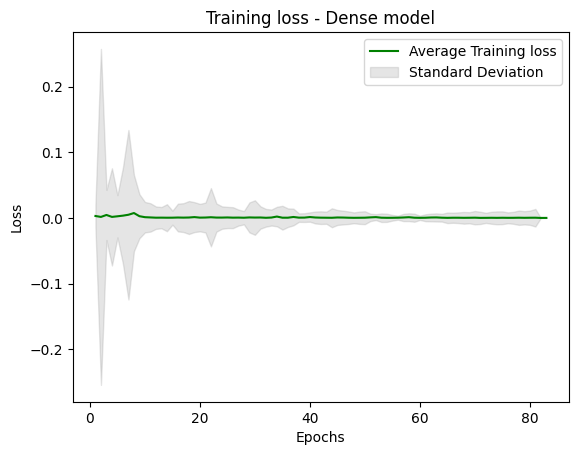

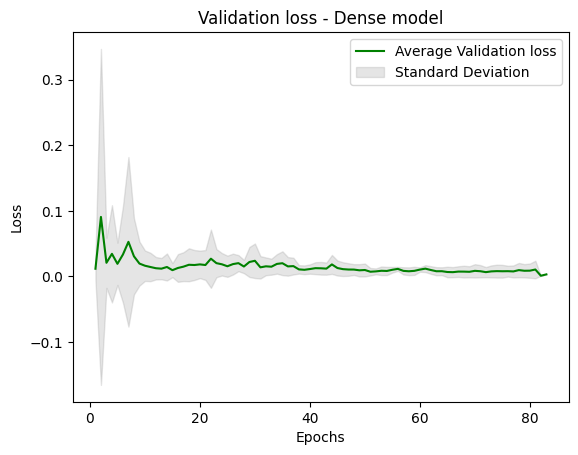

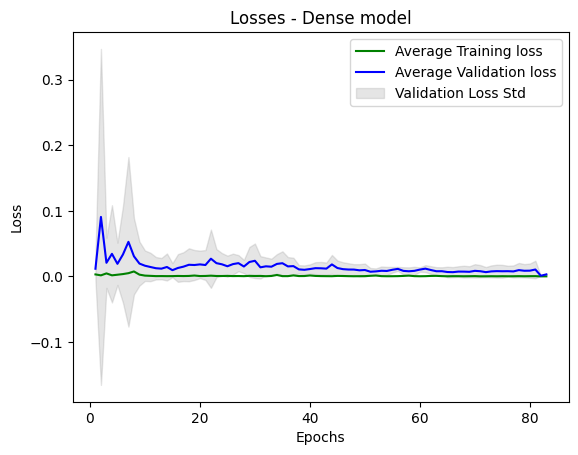

In [ ]:
from itertools import zip_longest
import os

current_dir = os.getcwd()
results_dir = os.path.join(current_dir, 'Dense/16816/In500_Out30/')
if not os.path.isdir(results_dir):
    os.makedirs(results_dir)

all_losses_training_in500_out30_16816 = np.array(all_losses_training_in500_out30_16816)
all_losses_validation_in500_out30_16816 = np.array(all_losses_validation_in500_out30_16816)

avg_loss_training = [np.mean([x[i] for x in all_losses_training_in500_out30_16816 if len(x) > i]) for i in range(len(max(all_losses_training_in500_out30_16816,key=len)))]
std_loss_training = np.nan_to_num(np.nanstd(np.array(list(zip_longest(*all_losses_training_in500_out30_16816)),dtype=float),axis=1,ddof=1), copy=False)

avg_loss_validation = [np.mean([x[i] for x in all_losses_validation_in500_out30_16816 if len(x) > i]) for i in range(len(max(all_losses_validation_in500_out30_16816,key=len)))]
std_loss_validation = np.nan_to_num(np.nanstd(np.array(list(zip_longest(*all_losses_validation_in500_out30_16816)),dtype=float),axis=1,ddof=1), copy=False)

# Plot the average losses with shaded standard deviation
#create vector of 1 to length of avg_loss_training for x-axis
epochNrs = np.arange(1, len(avg_loss_training)+1, 1)
plt.plot(epochNrs, avg_loss_training, 'g', label='Average Training loss')
plt.fill_between(epochNrs, avg_loss_training - std_loss_validation, avg_loss_training + std_loss_validation, color='gray', alpha=0.2, label='Standard Deviation')
plt.title('Training loss - Dense model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig(results_dir + 'dense-training-loss-16816.pdf')  
plt.show()

epochNrs = np.arange(1, len(avg_loss_validation)+1, 1)
plt.plot(epochNrs, avg_loss_validation, 'g', label='Average Validation loss')
plt.fill_between(epochNrs, avg_loss_validation - std_loss_validation, avg_loss_validation + std_loss_validation, color='gray', alpha=0.2, label='Standard Deviation')
plt.title('Validation loss - Dense model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig(results_dir + 'dense-validation-loss-16816.pdf')  
plt.show()

epochNrs = np.arange(1, len(avg_loss_validation)+1, 1)
plt.plot(epochNrs, avg_loss_training, 'g', label='Average Training loss')
plt.plot(epochNrs, avg_loss_validation, 'b', label='Average Validation loss')
plt.fill_between(epochNrs, avg_loss_validation - std_loss_validation, avg_loss_validation + std_loss_validation, color='gray', alpha=0.2, label='Validation Loss Std')
plt.title('Losses - Dense model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig(results_dir + 'dense-allLosses-16816.pdf')  
plt.show()

<MapDataset element_spec=(TensorSpec(shape=(None, 500, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>


c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\tensorflow\python\data\ops\structured_function.py:256: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


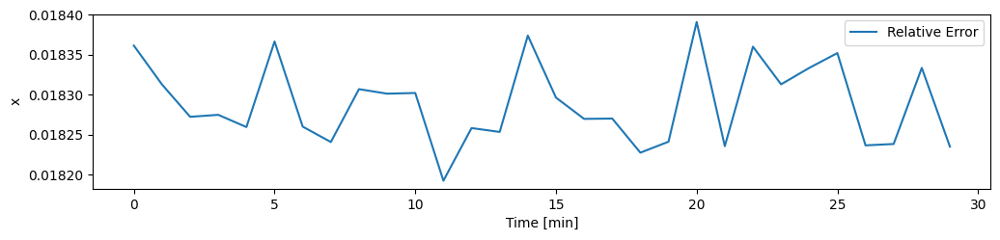

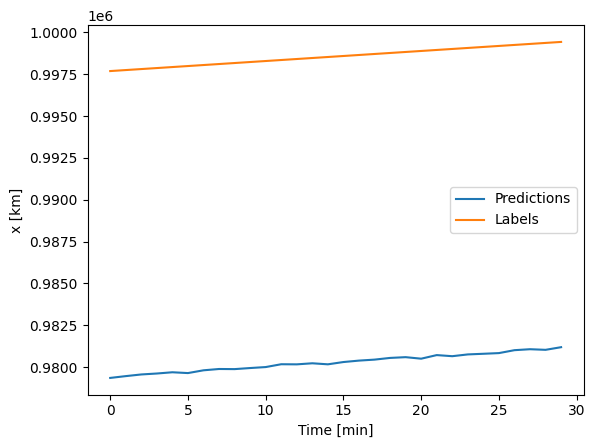

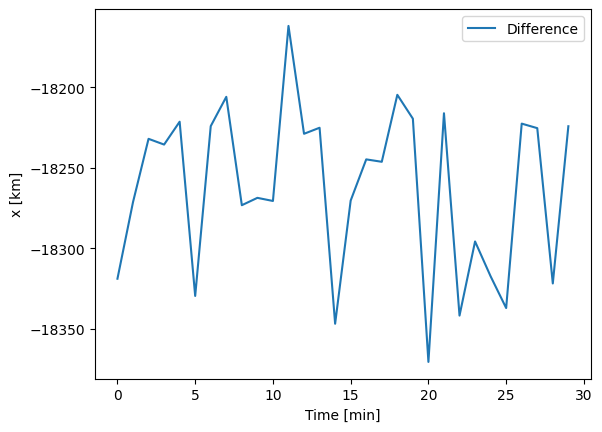

<MapDataset element_spec=(TensorSpec(shape=(None, 500, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>


c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\tensorflow\python\data\ops\structured_function.py:256: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


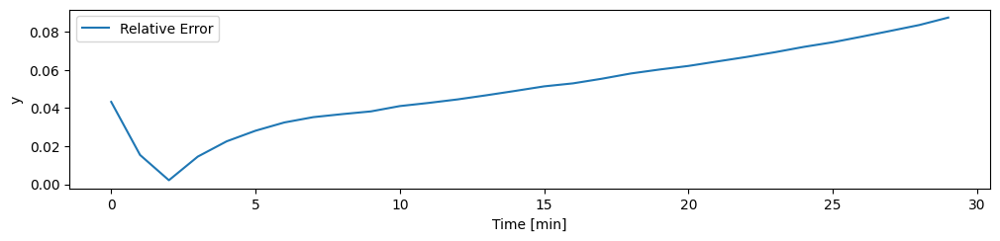

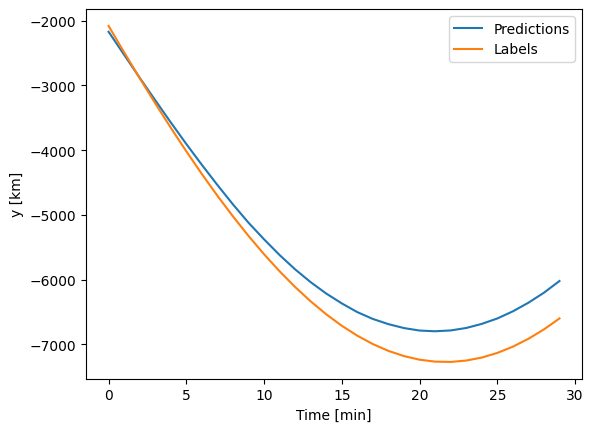

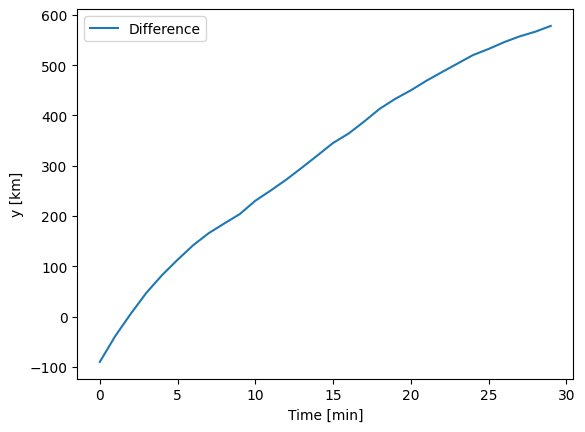

<MapDataset element_spec=(TensorSpec(shape=(None, 500, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>


c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\tensorflow\python\data\ops\structured_function.py:256: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


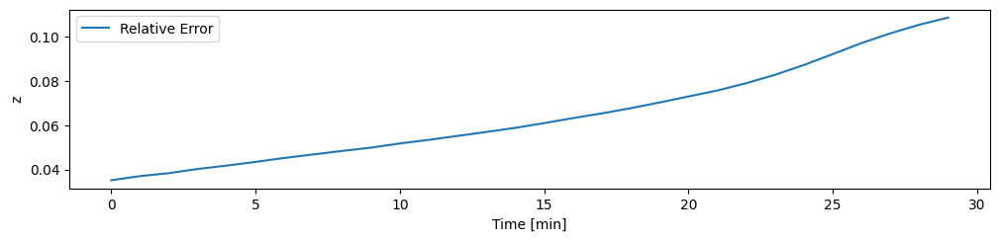

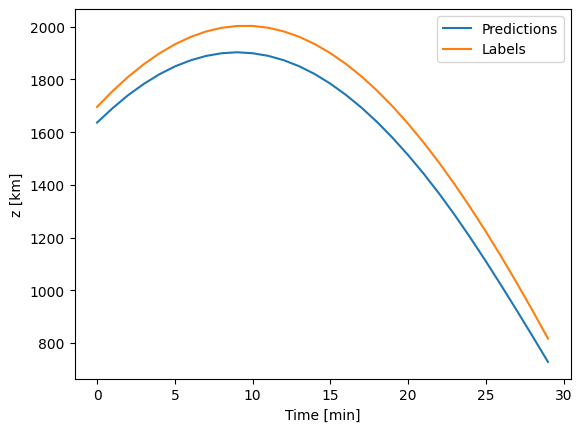

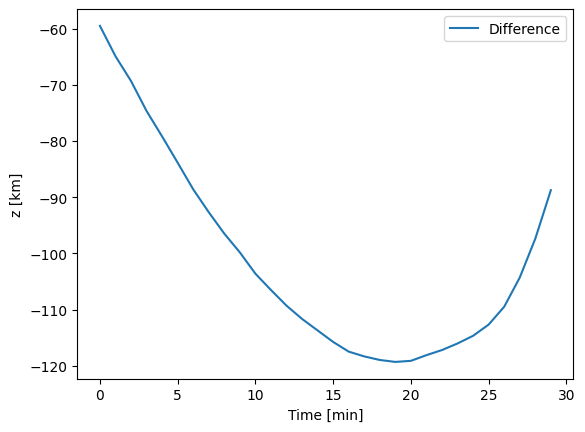

<MapDataset element_spec=(TensorSpec(shape=(None, 500, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>


c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\tensorflow\python\data\ops\structured_function.py:256: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


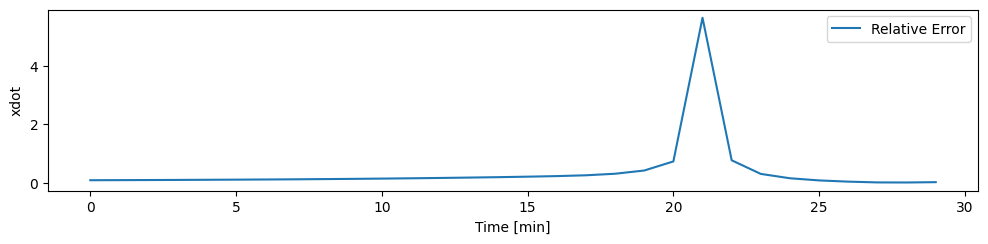

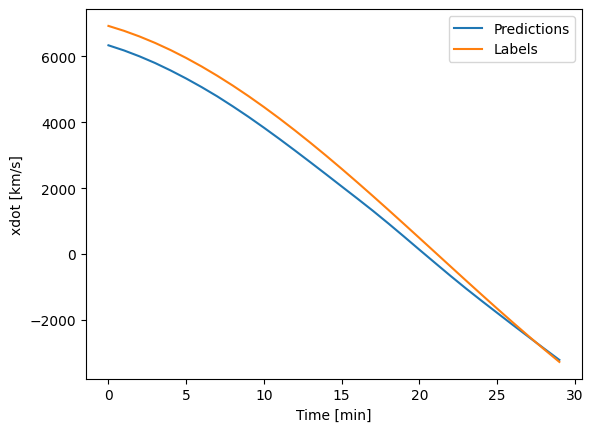

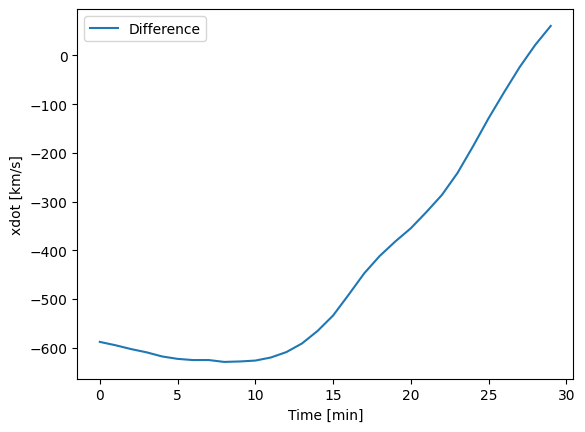

<MapDataset element_spec=(TensorSpec(shape=(None, 500, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>


c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\tensorflow\python\data\ops\structured_function.py:256: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


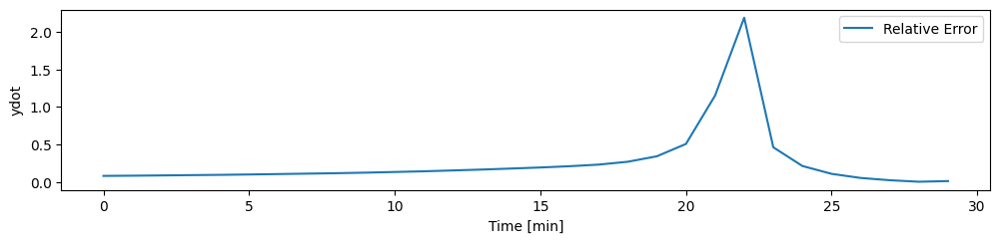

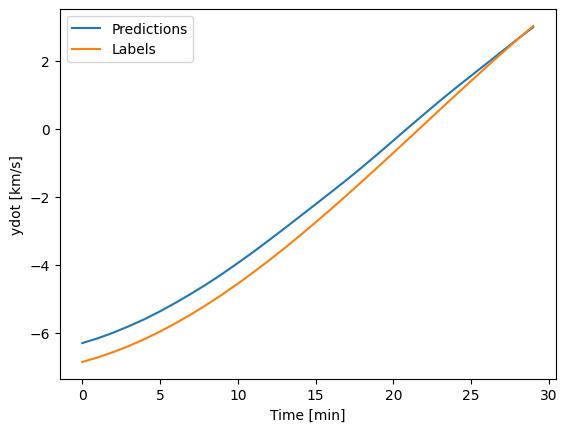

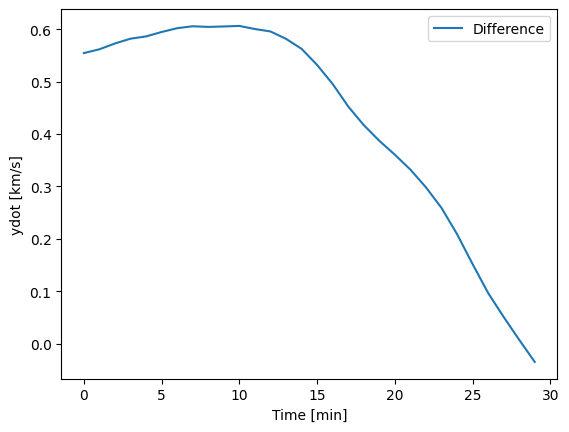

<MapDataset element_spec=(TensorSpec(shape=(None, 500, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>


c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\tensorflow\python\data\ops\structured_function.py:256: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


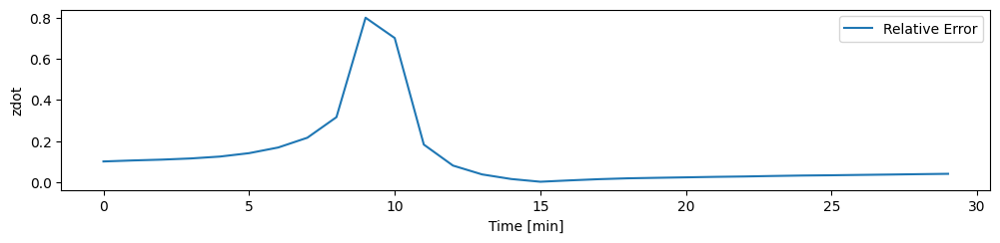

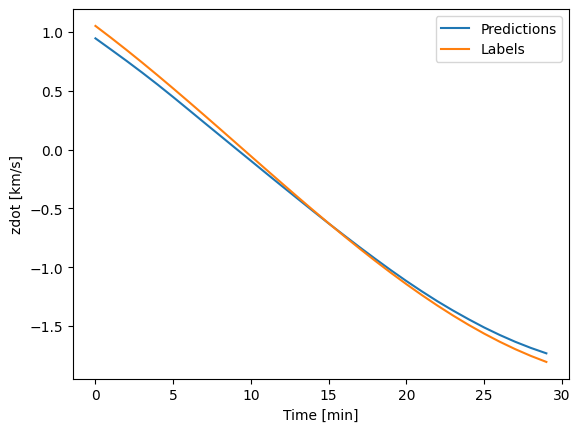

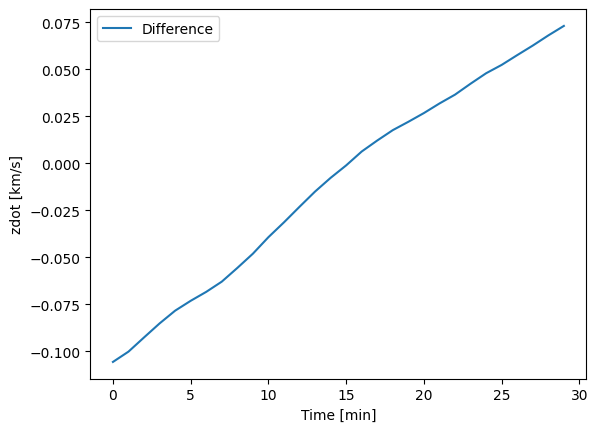

c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\tensorflow\python\data\ops\structured_function.py:256: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


<MapDataset element_spec=(TensorSpec(shape=(None, 500, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>
<MapDataset element_spec=(TensorSpec(shape=(None, 500, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>
<MapDataset element_spec=(TensorSpec(shape=(None, 500, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>
<MapDataset element_spec=(TensorSpec(shape=(None, 500, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>
<MapDataset element_spec=(TensorSpec(shape=(None, 500, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>
<MapDataset element_spec=(TensorSpec(shape=(None, 500, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>
Mean Errors: 
X:  19156.709
Y:  451.13123
Z:  74.79734
XDOT:  287.00018
YDOT:  0.2742013

In [ ]:
import IPython
import IPython.display
import os

#plot the difference between the real and the predicted values with the column as a parameter
def plot_diff_Dense(model, window, max_subplots=1, column=0, plot_col = "x", plot_units = "[km]"):
    
    #window.test?
    print(window.test)
    inputs, labels = next(iter(window.test))
    
    inputs = inputs.numpy()
    labels = labels.numpy()
    predictions = model(inputs)
    predictions = predictions.numpy()
    
    inputs = inputs * train_std_Dense[column] + train_mean_Dense[column]
    labels = labels * train_std_Dense[column] + train_mean_Dense[column]
    predictions  = predictions * train_std_Dense[column] + train_mean_Dense[column]
    
    plt.figure(figsize=(12, 8))
    max_n = min(max_subplots, len(inputs))


    for n in range(max_n):
            plt.subplot(3, 1, n+1)

            #fazer legendas diferentes para as velocidades
            plt.ylabel(plot_col)
            plt.plot(np.abs((predictions[n, :, column] - labels[n, :, column])/ labels[n, :, column]) ,label='Relative Error')
            plt.xlabel('Time [min]')
            plt.legend()
            plt.savefig(results_dir + 'dense-training-relativeError-16816-' + plot_col + '.pdf')  
            plt.show()

            plt.ylabel(plot_col + ' ' + plot_units)
            plt.plot(predictions[n, :, column] ,label='Predictions')
            plt.plot(labels[n, :, column] ,label='Labels')
            plt.xlabel('Time [min]')
            plt.legend()
            plt.savefig(results_dir + 'dense-training-PredictionsVSLabels-16816-' + plot_col + '.pdf')  
            plt.show()

            plt.ylabel(plot_col + ' ' + plot_units)
            plt.plot((predictions[n, :, column] - labels[n, :, column]) ,label='Difference')
            plt.xlabel('Time [min]')
            plt.legend()
            plt.savefig(results_dir + 'dense-training-Difference-16816-' + plot_col + '.pdf')  
            plt.show()

plot_diff_Dense(model_in500_out30_16816, multi_window_Dense, column=0, plot_col = "time", plot_units = "[min]")
plot_diff_Dense(model_in500_out30_16816, multi_window_Dense, column=1, plot_col = "x", plot_units = "[km]")
plot_diff_Dense(model_in500_out30_16816, multi_window_Dense, column=2, plot_col = "y", plot_units = "[km]")
plot_diff_Dense(model_in500_out30_16816, multi_window_Dense, column=3, plot_col = "z", plot_units = "[km]")
plot_diff_Dense(model_in500_out30_16816, multi_window_Dense, column=4, plot_col = "xdot", plot_units = "[km/s]")
plot_diff_Dense(model_in500_out30_16816, multi_window_Dense, column=5, plot_col = "ydot", plot_units = "[km/s]")
plot_diff_Dense(model_in500_out30_16816, multi_window_Dense, column=6, plot_col = "zdot", plot_units = "[km/s]")



#calculate the mean absolute error for each column
def calculateMeanErrors(model, window, max_subplots=1, column=0):

    #repeat this for 10 trials and calculate the mean error
    meanError = 0
    nrTrials = 7
    for i in range(nrTrials):
        inputs, labels = next(iter(window.test))
        inputs = inputs.numpy()
        labels = labels.numpy()
        predictions = model(inputs)
        predictions = predictions.numpy()
        
        inputs = inputs * train_std_Dense[column] + train_mean_Dense[column]
        labels = labels * train_std_Dense[column] + train_mean_Dense[column]
        predictions  = predictions * train_std_Dense[column] + train_mean_Dense[column]
        
        meanError += np.mean(np.abs(predictions[:, :, column] - labels[:, :, column]))
    meanError = meanError/nrTrials
    return meanError
    
    
meanErrorX = calculateMeanErrors(model_in500_out30_16816, multi_window_Dense, column=1)
meanErrorY = calculateMeanErrors(model_in500_out30_16816, multi_window_Dense, column=2)
meanErrorZ = calculateMeanErrors(model_in500_out30_16816, multi_window_Dense, column=3)
meanErrorXDOT = calculateMeanErrors(model_in500_out30_16816, multi_window_Dense, column=4)
meanErrorYDOT = calculateMeanErrors(model_in500_out30_16816, multi_window_Dense, column=5)
meanErrorZDOT = calculateMeanErrors(model_in500_out30_16816, multi_window_Dense, column=6)

print("Mean Errors: ")
print("X: ", meanErrorX)
print("Y: ", meanErrorY)
print("Z: ", meanErrorZ)
print("XDOT: ", meanErrorXDOT)
print("YDOT: ", meanErrorYDOT)
print("ZDOT: ", meanErrorZDOT)


#### IN 500 OUT 30, 32 16 32 DENSE

In [ ]:
MAX_EPOCHS = 100

import tensorflow.keras.backend as K
import tensorflow as tf
from tensorflow.keras import callbacks

import tensorflow as tf
tf.config.run_functions_eagerly(True)


def compile_and_fit(model, window, epochs = MAX_EPOCHS, patience=15):
  early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                                    patience=patience,
                                                    mode='min')


  model.compile(loss=tf.keras.losses.MeanSquaredError(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=[tf.keras.metrics.MeanAbsoluteError()],)


  history = model.fit(window.train, epochs=epochs,
                      validation_data=window.val,
                      callbacks=[early_stopping])
  return history

multi_linear_model_Dense_in500_out30_321632 = tf.keras.Sequential([
    # Take the last time-step.
    # Shape [batch, time, features] => [batch, 1, features]
    tf.keras.layers.Lambda(lambda x: x[:, -INPUT_STEPS:, :]),
    # tf.keras.layers.Conv1D(filters=128,
    #                        kernel_size=(INPUT_STEPS,),
    #                        activation='relu'),

    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),
    
    tf.keras.layers.Flatten(),
    # Shape => [batch, 1, out_steps*features]
    tf.keras.layers.Dense(OUT_STEPS*num_features_Dense,
                          kernel_initializer=tf.keras.initializers.HeNormal()),
    # Shape => [batch, out_steps, features]
    tf.keras.layers.Reshape([OUT_STEPS, num_features_Dense])
])


model_in500_out30_321632 = multi_linear_model_Dense_in500_out30_321632
# model.build((None, None, 6))
dataset = multi_window_Dense

optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)
epochs = 100

# historyDense = compile_and_fit(model, dataset, epochs)

nrOfRuns = 7
all_losses_training_in500_out30_321632 = []
all_losses_validation_in500_out30_321632 = []
for i in range(nrOfRuns):
  print("Run: ", i)
  historyDense_in500_out30_321632 = compile_and_fit(model_in500_out30_321632, dataset, epochs)
  # Collect the losses from each run
  all_losses_training_in500_out30_321632.append(historyDense_in500_out30_321632.history["loss"])
  all_losses_validation_in500_out30_321632.append(historyDense_in500_out30_321632.history["val_loss"])



Run:  0
Epoch 1/100
362/362 [==============================] - 24s 67ms/step - loss: 0.0756 - mean_absolute_error: 0.0793 - val_loss: 0.0558 - val_mean_absolute_error: 0.1888
Epoch 2/100
362/362 [==============================] - 24s 66ms/step - loss: 0.0063 - mean_absolute_error: 0.0248 - val_loss: 0.0313 - val_mean_absolute_error: 0.1353
Epoch 3/100
362/362 [==============================] - 24s 66ms/step - loss: 0.0072 - mean_absolute_error: 0.0342 - val_loss: 0.0175 - val_mean_absolute_error: 0.0906
Epoch 4/100
362/362 [==============================] - 25s 68ms/step - loss: 0.0041 - mean_absolute_error: 0.0179 - val_loss: 0.0156 - val_mean_absolute_error: 0.0892
Epoch 5/100
362/362 [==============================] - 24s 66ms/step - loss: 0.0023 - mean_absolute_error: 0.0183 - val_loss: 0.0179 - val_mean_absolute_error: 0.0999
Epoch 6/100
362/362 [==============================] - 24s 68ms/step - loss: 0.0016 - mean_absolute_error: 0.0125 - val_loss: 0.0264 - val_mean_absolute_erro

C:\Users\jpfun\AppData\Local\Temp\ipykernel_58776\595334158.py:9: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  all_losses_training_in500_out30_321632 = np.array(all_losses_training_in500_out30_321632)
C:\Users\jpfun\AppData\Local\Temp\ipykernel_58776\595334158.py:10: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  all_losses_validation_in500_out30_321632 = np.array(all_losses_validation_in500_out30_321632)
c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\numpy\lib\nanfunctions.py:1670: RuntimeWarning: Degrees of freedom <= 

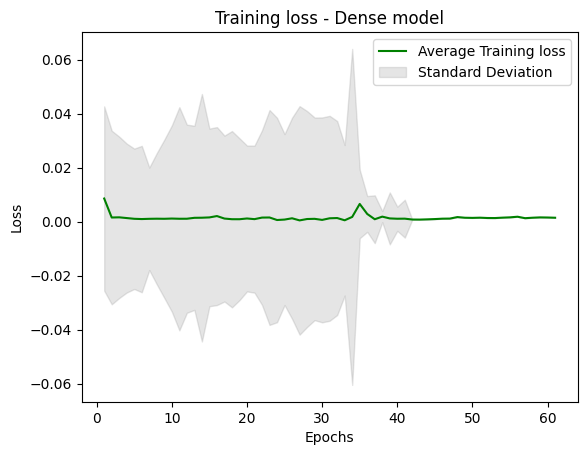

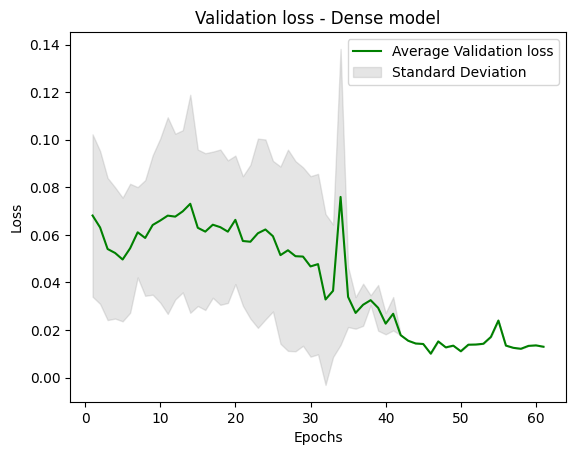

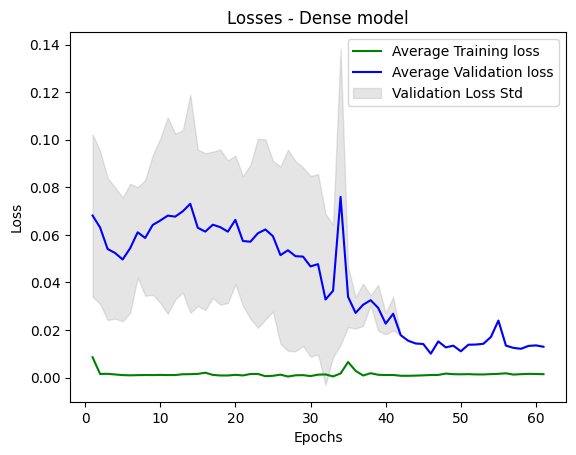

In [ ]:
from itertools import zip_longest
import os

current_dir = os.getcwd()
results_dir = os.path.join(current_dir, 'Dense/321632/In500_Out30/')
if not os.path.isdir(results_dir):
    os.makedirs(results_dir)

all_losses_training_in500_out30_321632 = np.array(all_losses_training_in500_out30_321632)
all_losses_validation_in500_out30_321632 = np.array(all_losses_validation_in500_out30_321632)

avg_loss_training = [np.mean([x[i] for x in all_losses_training_in500_out30_321632 if len(x) > i]) for i in range(len(max(all_losses_training_in500_out30_321632,key=len)))]
std_loss_training = np.nan_to_num(np.nanstd(np.array(list(zip_longest(*all_losses_training_in500_out30_321632)),dtype=float),axis=1,ddof=1), copy=False)

avg_loss_validation = [np.mean([x[i] for x in all_losses_validation_in500_out30_321632 if len(x) > i]) for i in range(len(max(all_losses_validation_in500_out30_321632,key=len)))]
std_loss_validation = np.nan_to_num(np.nanstd(np.array(list(zip_longest(*all_losses_validation_in500_out30_321632)),dtype=float),axis=1,ddof=1), copy=False)

# Plot the average losses with shaded standard deviation
#create vector of 1 to length of avg_loss_training for x-axis
epochNrs = np.arange(1, len(avg_loss_training)+1, 1)
plt.plot(epochNrs, avg_loss_training, 'g', label='Average Training loss')
plt.fill_between(epochNrs, avg_loss_training - std_loss_validation, avg_loss_training + std_loss_validation, color='gray', alpha=0.2, label='Standard Deviation')
plt.title('Training loss - Dense model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig(results_dir + 'dense-training-loss-321632.pdf')  
plt.show()

epochNrs = np.arange(1, len(avg_loss_validation)+1, 1)
plt.plot(epochNrs, avg_loss_validation, 'g', label='Average Validation loss')
plt.fill_between(epochNrs, avg_loss_validation - std_loss_validation, avg_loss_validation + std_loss_validation, color='gray', alpha=0.2, label='Standard Deviation')
plt.title('Validation loss - Dense model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig(results_dir + 'dense-validation-loss-321632.pdf')  
plt.show()

epochNrs = np.arange(1, len(avg_loss_validation)+1, 1)
plt.plot(epochNrs, avg_loss_training, 'g', label='Average Training loss')
plt.plot(epochNrs, avg_loss_validation, 'b', label='Average Validation loss')
plt.fill_between(epochNrs, avg_loss_validation - std_loss_validation, avg_loss_validation + std_loss_validation, color='gray', alpha=0.2, label='Validation Loss Std')
plt.title('Losses - Dense model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig(results_dir + 'dense-allLosses-321632.pdf')  
plt.show()

c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\tensorflow\python\data\ops\structured_function.py:256: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


<MapDataset element_spec=(TensorSpec(shape=(None, 500, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>


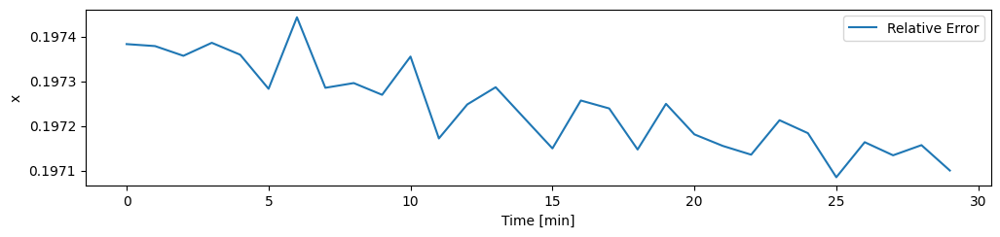

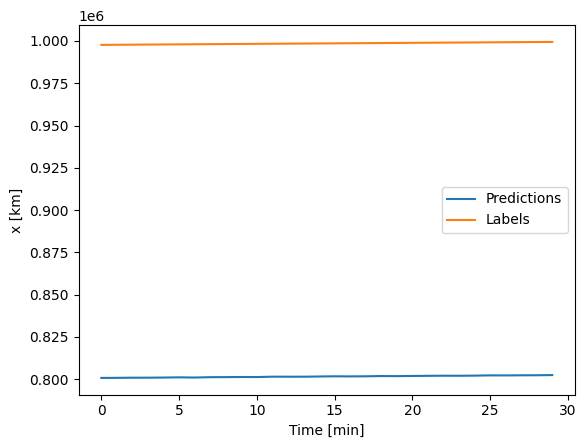

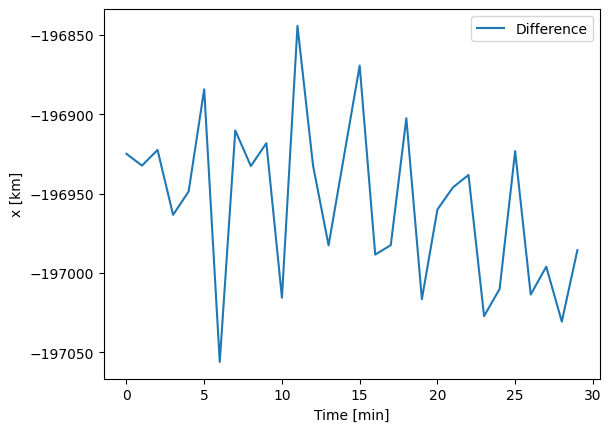

c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\tensorflow\python\data\ops\structured_function.py:256: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


<MapDataset element_spec=(TensorSpec(shape=(None, 500, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>


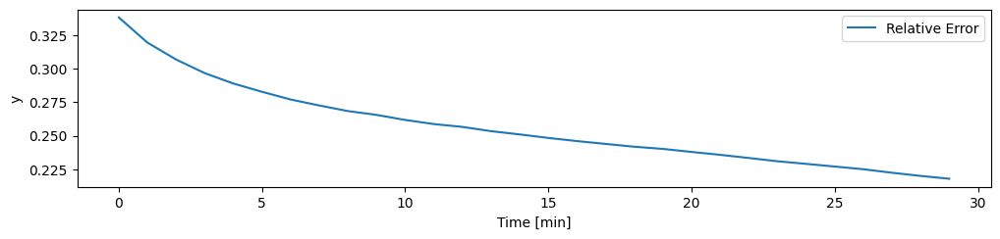

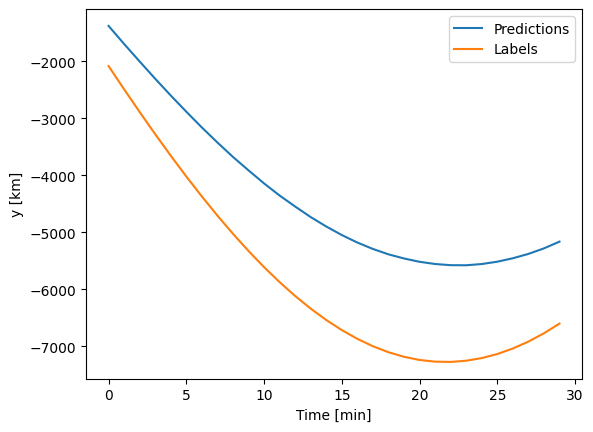

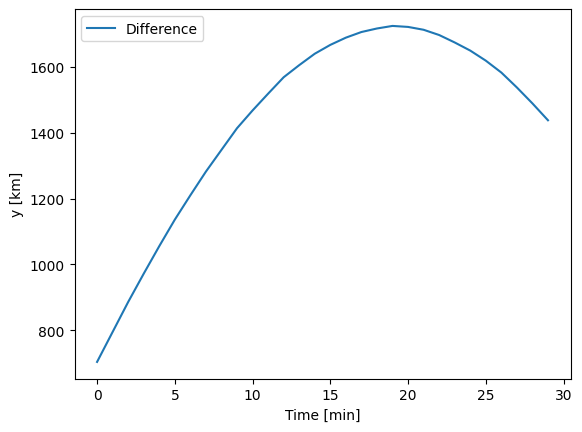

<MapDataset element_spec=(TensorSpec(shape=(None, 500, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>


c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\tensorflow\python\data\ops\structured_function.py:256: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


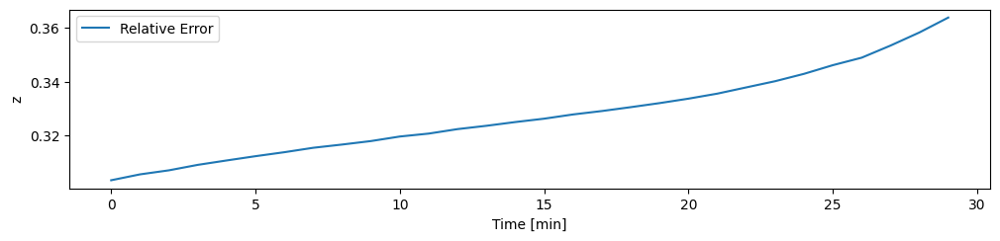

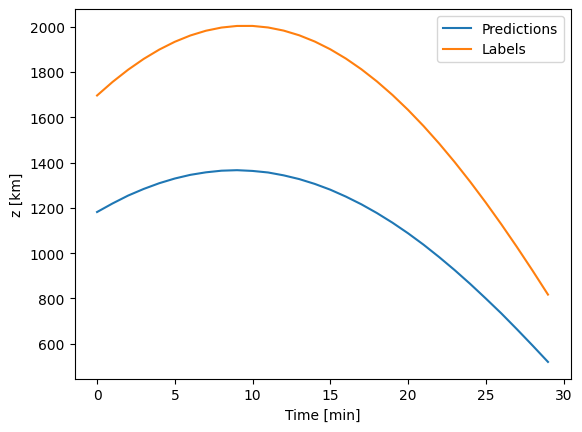

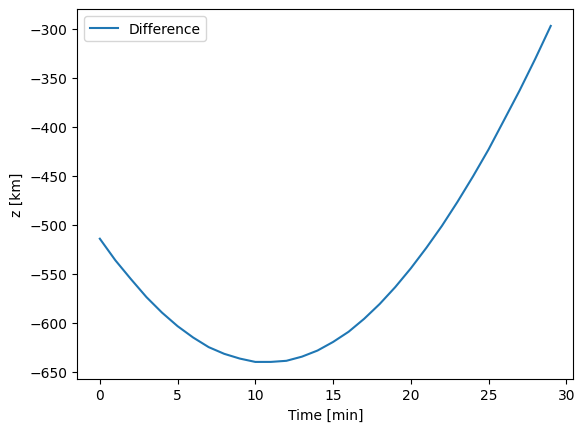

c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\tensorflow\python\data\ops\structured_function.py:256: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


<MapDataset element_spec=(TensorSpec(shape=(None, 500, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>


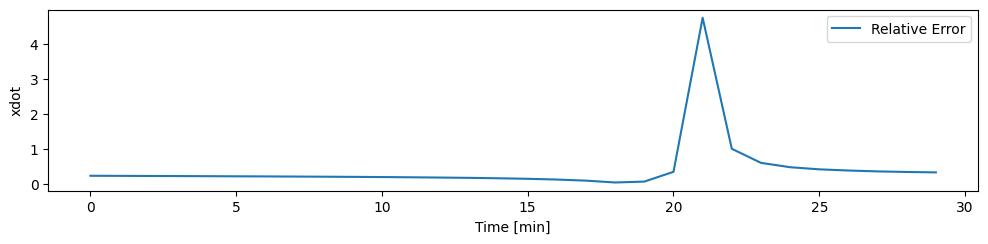

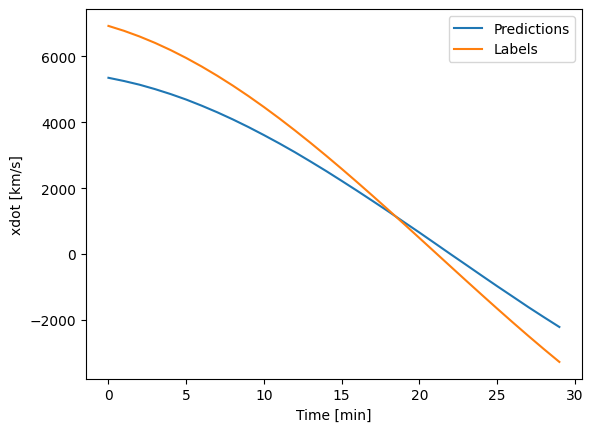

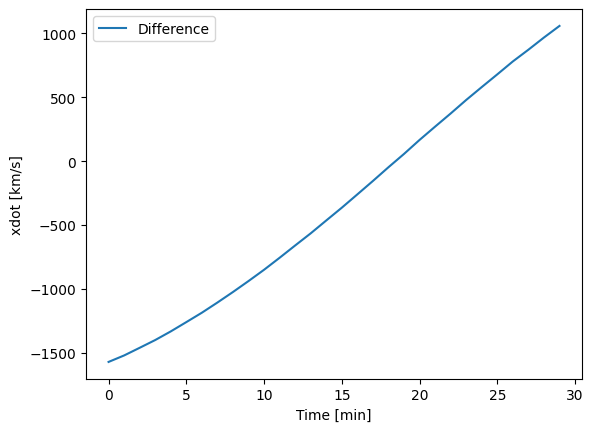

c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\tensorflow\python\data\ops\structured_function.py:256: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


<MapDataset element_spec=(TensorSpec(shape=(None, 500, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>


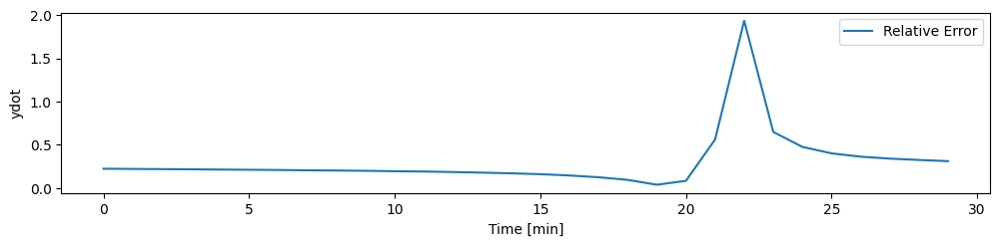

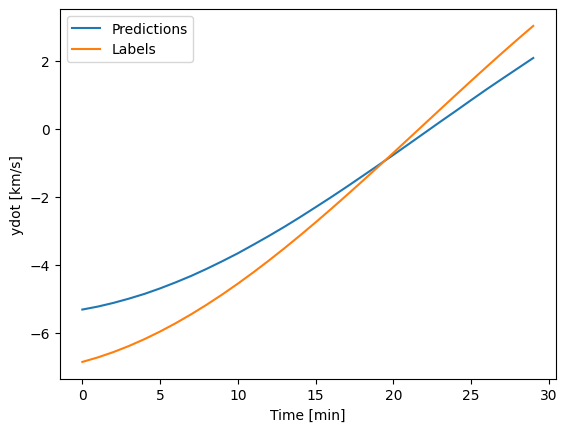

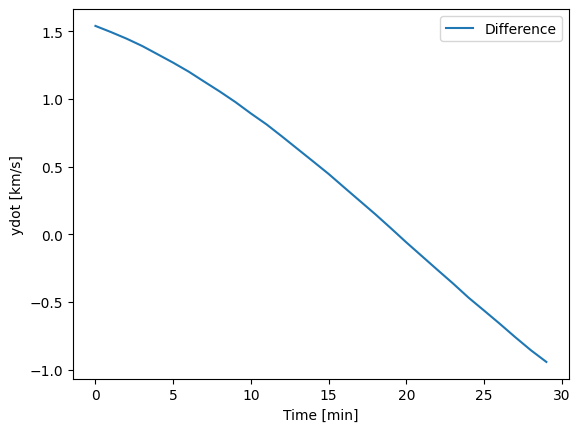

c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\tensorflow\python\data\ops\structured_function.py:256: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


<MapDataset element_spec=(TensorSpec(shape=(None, 500, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>


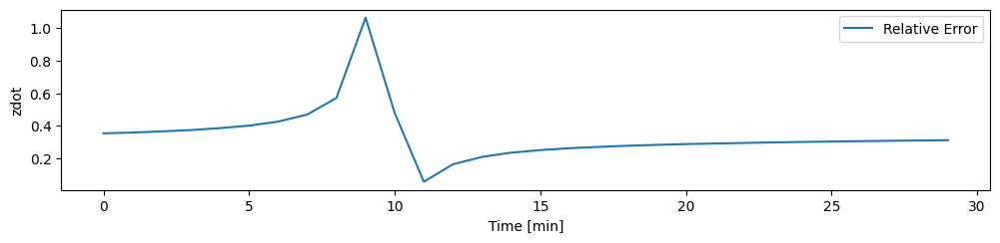

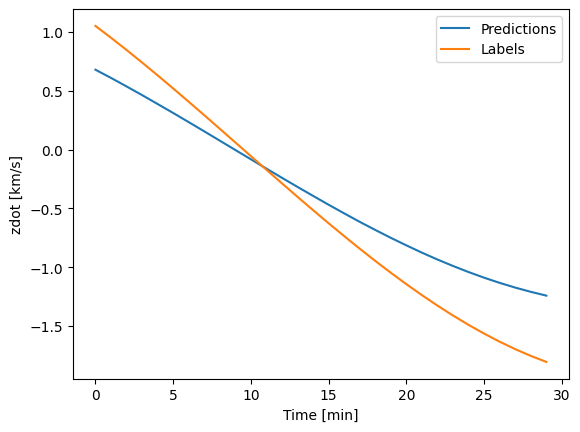

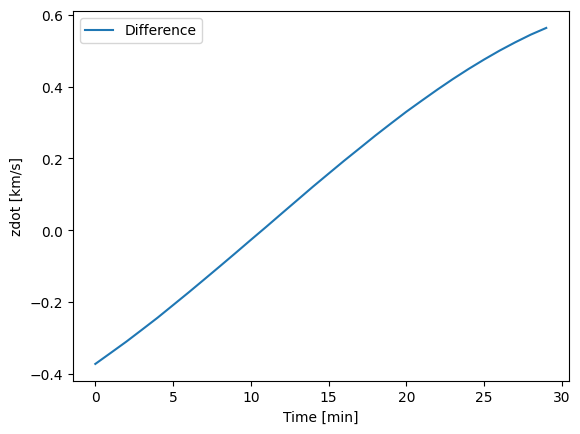

c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\tensorflow\python\data\ops\structured_function.py:256: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


<MapDataset element_spec=(TensorSpec(shape=(None, 500, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>
<MapDataset element_spec=(TensorSpec(shape=(None, 500, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>
<MapDataset element_spec=(TensorSpec(shape=(None, 500, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>
<MapDataset element_spec=(TensorSpec(shape=(None, 500, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>
<MapDataset element_spec=(TensorSpec(shape=(None, 500, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>
<MapDataset element_spec=(TensorSpec(shape=(None, 500, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>
Mean Errors: 
X:  196844.58
Y:  1161.0321
Z:  364.09906
XDOT:  1094.3947
YDOT:  1.041137

In [ ]:
import IPython
import IPython.display
import os

#plot the difference between the real and the predicted values with the column as a parameter
def plot_diff_Dense(model, window, max_subplots=1, column=0, plot_col = "x", plot_units = "[km]"):
    
    #window.test?
    print(window.test)
    inputs, labels = next(iter(window.test))
    
    inputs = inputs.numpy()
    labels = labels.numpy()
    predictions = model(inputs)
    predictions = predictions.numpy()
    
    inputs = inputs * train_std_Dense[column] + train_mean_Dense[column]
    labels = labels * train_std_Dense[column] + train_mean_Dense[column]
    predictions  = predictions * train_std_Dense[column] + train_mean_Dense[column]
    
    plt.figure(figsize=(12, 8))
    max_n = min(max_subplots, len(inputs))


    for n in range(max_n):
            plt.subplot(3, 1, n+1)

            #fazer legendas diferentes para as velocidades
            plt.ylabel(plot_col)
            plt.plot(np.abs((predictions[n, :, column] - labels[n, :, column])/ labels[n, :, column]) ,label='Relative Error')
            plt.xlabel('Time [min]')
            plt.legend()
            plt.savefig(results_dir + 'dense-training-relativeError-321632-' + plot_col + '.pdf')  
            plt.show()

            plt.ylabel(plot_col + ' ' + plot_units)
            plt.plot(predictions[n, :, column] ,label='Predictions')
            plt.plot(labels[n, :, column] ,label='Labels')
            plt.xlabel('Time [min]')
            plt.legend()
            plt.savefig(results_dir + 'dense-training-PredictionsVSLabels-321632-' + plot_col + '.pdf')  
            plt.show()

            plt.ylabel(plot_col + ' ' + plot_units)
            plt.plot((predictions[n, :, column] - labels[n, :, column]) ,label='Difference')
            plt.xlabel('Time [min]')
            plt.legend()
            plt.savefig(results_dir + 'dense-training-Difference-321632-' + plot_col + '.pdf')  
            plt.show()

plot_diff_Dense(model_in500_out30_321632, multi_window_Dense, column=0, plot_col = "time", plot_units = "[min]")
plot_diff_Dense(model_in500_out30_321632, multi_window_Dense, column=1, plot_col = "x", plot_units = "[km]")
plot_diff_Dense(model_in500_out30_321632, multi_window_Dense, column=2, plot_col = "y", plot_units = "[km]")
plot_diff_Dense(model_in500_out30_321632, multi_window_Dense, column=3, plot_col = "z", plot_units = "[km]")
plot_diff_Dense(model_in500_out30_321632, multi_window_Dense, column=4, plot_col = "xdot", plot_units = "[km/s]")
plot_diff_Dense(model_in500_out30_321632, multi_window_Dense, column=5, plot_col = "ydot", plot_units = "[km/s]")
plot_diff_Dense(model_in500_out30_321632, multi_window_Dense, column=6, plot_col = "zdot", plot_units = "[km/s]")



#calculate the mean absolute error for each column
def calculateMeanErrors(model, window, max_subplots=1, column=0):
    
    #repeat this for 10 trials and calculate the mean error
    meanError = 0
    nrTrials = 7
    for i in range(nrTrials):
        inputs, labels = next(iter(window.test))
        inputs = inputs.numpy()
        labels = labels.numpy()
        predictions = model(inputs)
        predictions = predictions.numpy()
        
        inputs = inputs * train_std_Dense[column] + train_mean_Dense[column]
        labels = labels * train_std_Dense[column] + train_mean_Dense[column]
        predictions  = predictions * train_std_Dense[column] + train_mean_Dense[column]
        
        meanError += np.mean(np.abs(predictions[:, :, column] - labels[:, :, column]))
    meanError = meanError/nrTrials
    return meanError
    
    
meanErrorX = calculateMeanErrors(model_in500_out30_321632, multi_window_Dense, column=1)
meanErrorY = calculateMeanErrors(model_in500_out30_321632, multi_window_Dense, column=2)
meanErrorZ = calculateMeanErrors(model_in500_out30_321632, multi_window_Dense, column=3)
meanErrorXDOT = calculateMeanErrors(model_in500_out30_321632, multi_window_Dense, column=4)
meanErrorYDOT = calculateMeanErrors(model_in500_out30_321632, multi_window_Dense, column=5)
meanErrorZDOT = calculateMeanErrors(model_in500_out30_321632, multi_window_Dense, column=6)

print("Mean Errors: ")
print("X: ", meanErrorX)
print("Y: ", meanErrorY)
print("Z: ", meanErrorZ)
print("XDOT: ", meanErrorXDOT)
print("YDOT: ", meanErrorYDOT)
print("ZDOT: ", meanErrorZDOT)


#### IN 500 OUT 30, 32 8 32 DENSE

In [ ]:
MAX_EPOCHS = 100

import tensorflow.keras.backend as K
import tensorflow as tf
from tensorflow.keras import callbacks

import tensorflow as tf
tf.config.run_functions_eagerly(True)


def compile_and_fit(model, window, epochs = MAX_EPOCHS, patience=15):
  early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                                    patience=patience,
                                                    mode='min')


  model.compile(loss=tf.keras.losses.MeanSquaredError(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=[tf.keras.metrics.MeanAbsoluteError()],)


  history = model.fit(window.train, epochs=epochs,
                      validation_data=window.val,
                      callbacks=[early_stopping])
  return history

multi_linear_model_Dense_in500_out30_32832 = tf.keras.Sequential([
    # Take the last time-step.
    # Shape [batch, time, features] => [batch, 1, features]
    tf.keras.layers.Lambda(lambda x: x[:, -INPUT_STEPS:, :]),
    # tf.keras.layers.Conv1D(filters=128,
    #                        kernel_size=(INPUT_STEPS,),
    #                        activation='relu'),

    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(8, activation='relu'),
    tf.keras.layers.Dense(32, activation='relu'),
    
    tf.keras.layers.Flatten(),
    # Shape => [batch, 1, out_steps*features]
    tf.keras.layers.Dense(OUT_STEPS*num_features_Dense,
                          kernel_initializer=tf.keras.initializers.HeNormal()),
    # Shape => [batch, out_steps, features]
    tf.keras.layers.Reshape([OUT_STEPS, num_features_Dense])
])


model_in500_out30_32832 = multi_linear_model_Dense_in500_out30_32832
# model.build((None, None, 6))
dataset = multi_window_Dense

optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)
epochs = 100

# historyDense = compile_and_fit(model, dataset, epochs)

nrOfRuns = 7
all_losses_training_in500_out30_32832 = []
all_losses_validation_in500_out30_32832 = []
for i in range(nrOfRuns):
  print("Run: ", i)
  historyDense_in500_out30_32832 = compile_and_fit(model_in500_out30_32832, dataset, epochs)
  # Collect the losses from each run
  all_losses_training_in500_out30_32832.append(historyDense_in500_out30_32832.history["loss"])
  all_losses_validation_in500_out30_32832.append(historyDense_in500_out30_32832.history["val_loss"])



Run:  0
Epoch 1/100
362/362 [==============================] - 25s 69ms/step - loss: 0.0336 - mean_absolute_error: 0.0590 - val_loss: 0.0103 - val_mean_absolute_error: 0.0763
Epoch 2/100
362/362 [==============================] - 24s 66ms/step - loss: 0.0062 - mean_absolute_error: 0.0205 - val_loss: 0.0098 - val_mean_absolute_error: 0.0728
Epoch 3/100
362/362 [==============================] - 24s 66ms/step - loss: 0.0072 - mean_absolute_error: 0.0240 - val_loss: 0.1127 - val_mean_absolute_error: 0.2473
Epoch 4/100
362/362 [==============================] - 24s 65ms/step - loss: 0.0195 - mean_absolute_error: 0.0319 - val_loss: 0.1154 - val_mean_absolute_error: 0.2511
Epoch 5/100
362/362 [==============================] - 24s 65ms/step - loss: 0.0133 - mean_absolute_error: 0.0271 - val_loss: 0.0224 - val_mean_absolute_error: 0.1171
Epoch 6/100
362/362 [==============================] - 24s 66ms/step - loss: 0.0143 - mean_absolute_error: 0.0261 - val_loss: 0.2476 - val_mean_absolute_erro

C:\Users\jpfun\AppData\Local\Temp\ipykernel_58776\1559299787.py:9: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  all_losses_training_in500_out30_32832 = np.array(all_losses_training_in500_out30_32832)
C:\Users\jpfun\AppData\Local\Temp\ipykernel_58776\1559299787.py:10: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  all_losses_validation_in500_out30_32832 = np.array(all_losses_validation_in500_out30_32832)
c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\numpy\lib\nanfunctions.py:1670: RuntimeWarning: Degrees of freedom <= 0 

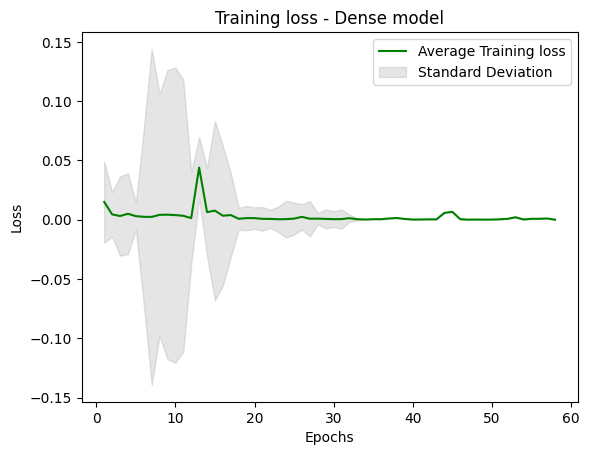

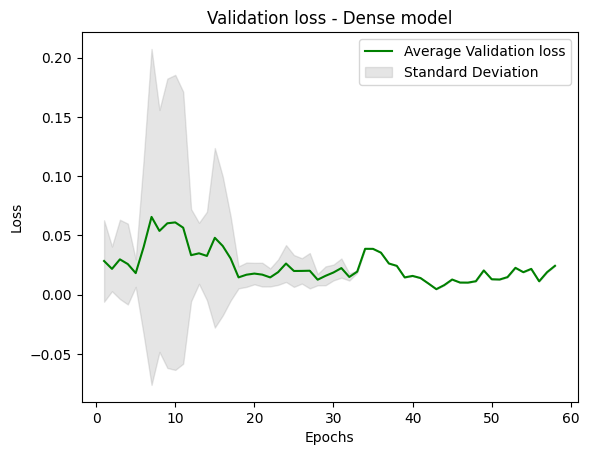

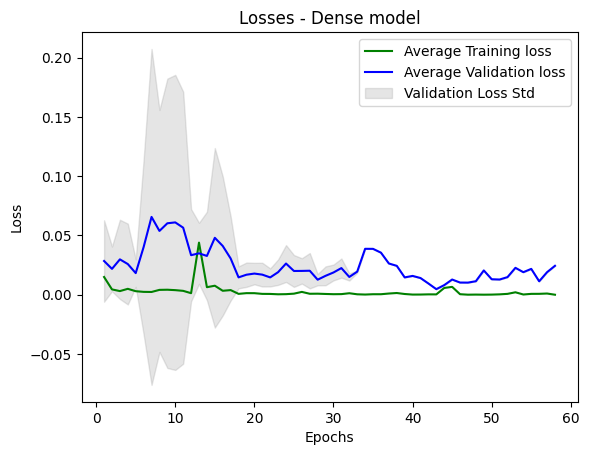

In [ ]:
from itertools import zip_longest
import os

current_dir = os.getcwd()
results_dir = os.path.join(current_dir, 'Dense/32832/In500_Out30/')
if not os.path.isdir(results_dir):
    os.makedirs(results_dir)

all_losses_training_in500_out30_32832 = np.array(all_losses_training_in500_out30_32832)
all_losses_validation_in500_out30_32832 = np.array(all_losses_validation_in500_out30_32832)

avg_loss_training = [np.mean([x[i] for x in all_losses_training_in500_out30_32832 if len(x) > i]) for i in range(len(max(all_losses_training_in500_out30_32832,key=len)))]
std_loss_training = np.nan_to_num(np.nanstd(np.array(list(zip_longest(*all_losses_training_in500_out30_32832)),dtype=float),axis=1,ddof=1), copy=False)

avg_loss_validation = [np.mean([x[i] for x in all_losses_validation_in500_out30_32832 if len(x) > i]) for i in range(len(max(all_losses_validation_in500_out30_32832,key=len)))]
std_loss_validation = np.nan_to_num(np.nanstd(np.array(list(zip_longest(*all_losses_validation_in500_out30_32832)),dtype=float),axis=1,ddof=1), copy=False)

# Plot the average losses with shaded standard deviation
#create vector of 1 to length of avg_loss_training for x-axis
epochNrs = np.arange(1, len(avg_loss_training)+1, 1)
plt.plot(epochNrs, avg_loss_training, 'g', label='Average Training loss')
plt.fill_between(epochNrs, avg_loss_training - std_loss_validation, avg_loss_training + std_loss_validation, color='gray', alpha=0.2, label='Standard Deviation')
plt.title('Training loss - Dense model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig(results_dir + 'dense-training-loss-32832.pdf')  
plt.show()

epochNrs = np.arange(1, len(avg_loss_validation)+1, 1)
plt.plot(epochNrs, avg_loss_validation, 'g', label='Average Validation loss')
plt.fill_between(epochNrs, avg_loss_validation - std_loss_validation, avg_loss_validation + std_loss_validation, color='gray', alpha=0.2, label='Standard Deviation')
plt.title('Validation loss - Dense model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig(results_dir + 'dense-validation-loss-32832.pdf')  
plt.show()

epochNrs = np.arange(1, len(avg_loss_validation)+1, 1)
plt.plot(epochNrs, avg_loss_training, 'g', label='Average Training loss')
plt.plot(epochNrs, avg_loss_validation, 'b', label='Average Validation loss')
plt.fill_between(epochNrs, avg_loss_validation - std_loss_validation, avg_loss_validation + std_loss_validation, color='gray', alpha=0.2, label='Validation Loss Std')
plt.title('Losses - Dense model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig(results_dir + 'dense-allLosses-32832.pdf')  
plt.show()

c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\tensorflow\python\data\ops\structured_function.py:256: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


<MapDataset element_spec=(TensorSpec(shape=(None, 500, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>


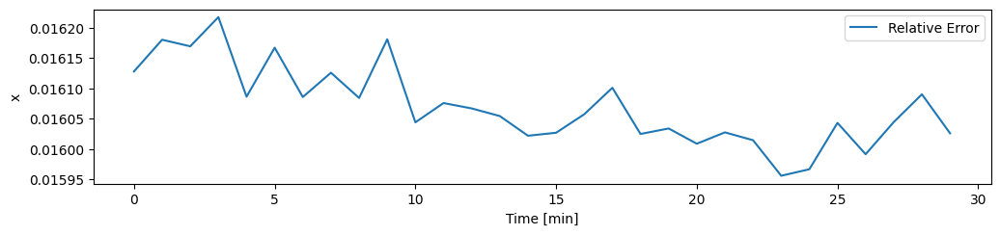

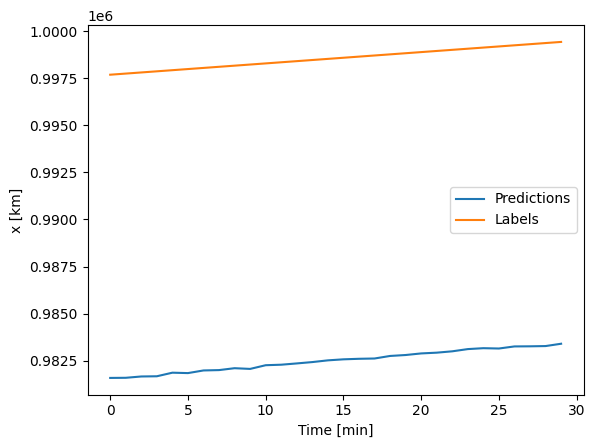

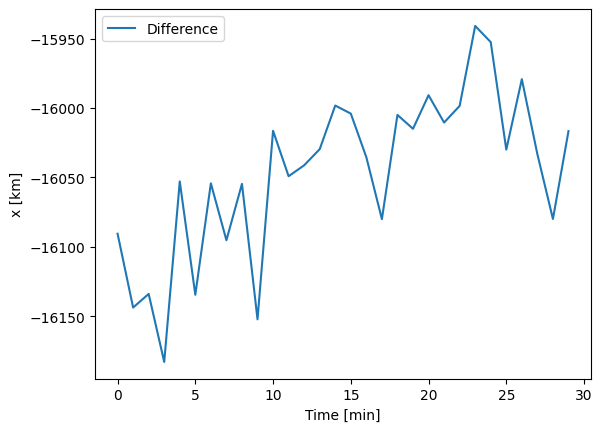

c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\tensorflow\python\data\ops\structured_function.py:256: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


<MapDataset element_spec=(TensorSpec(shape=(None, 500, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>


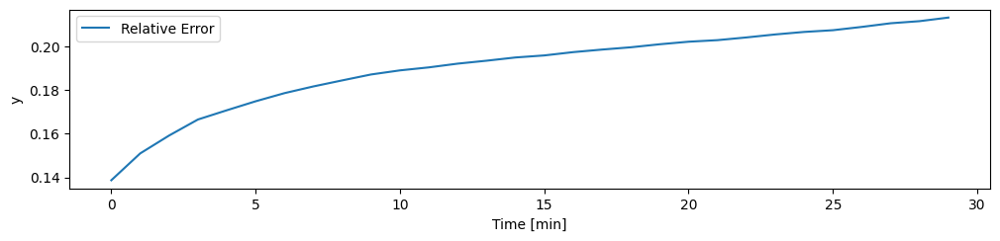

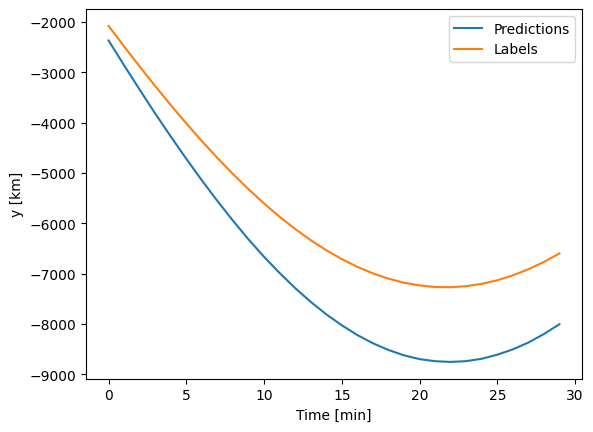

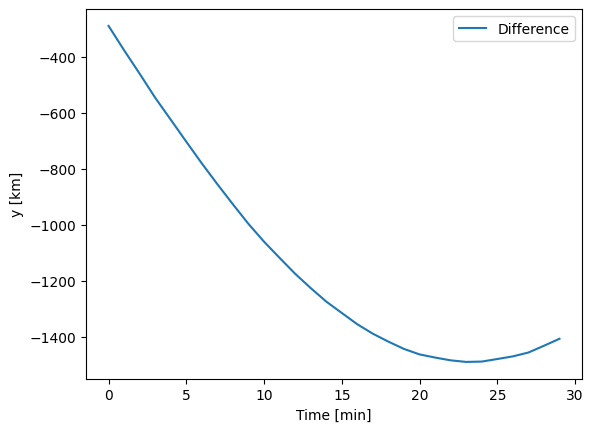

c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\tensorflow\python\data\ops\structured_function.py:256: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


<MapDataset element_spec=(TensorSpec(shape=(None, 500, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>


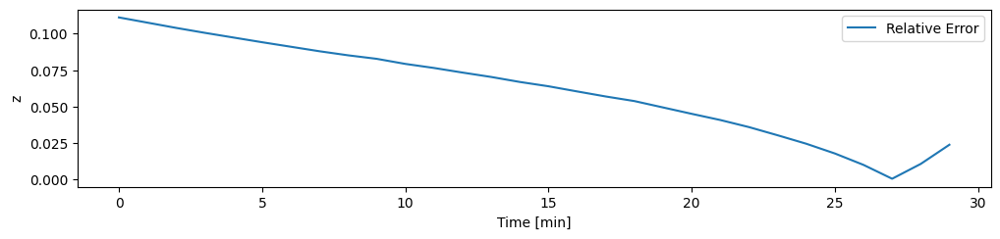

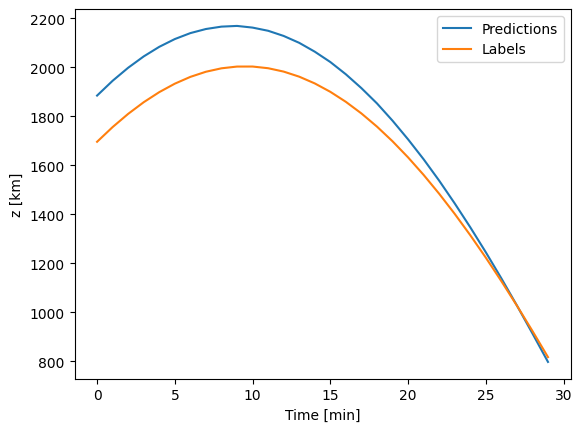

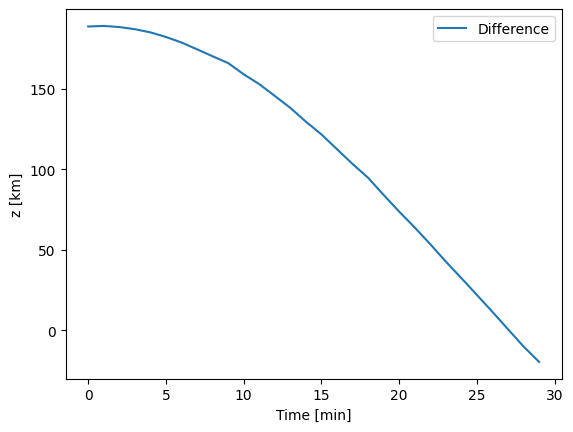

c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\tensorflow\python\data\ops\structured_function.py:256: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


<MapDataset element_spec=(TensorSpec(shape=(None, 500, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>


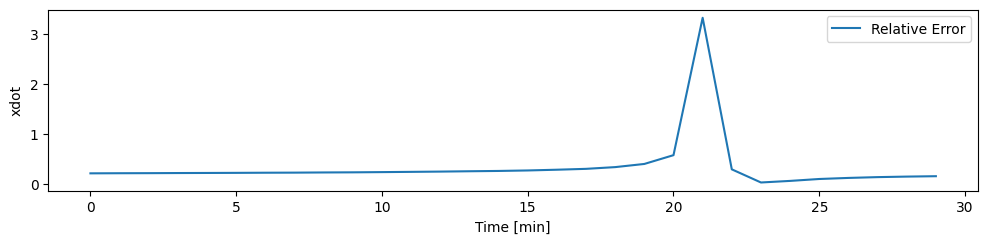

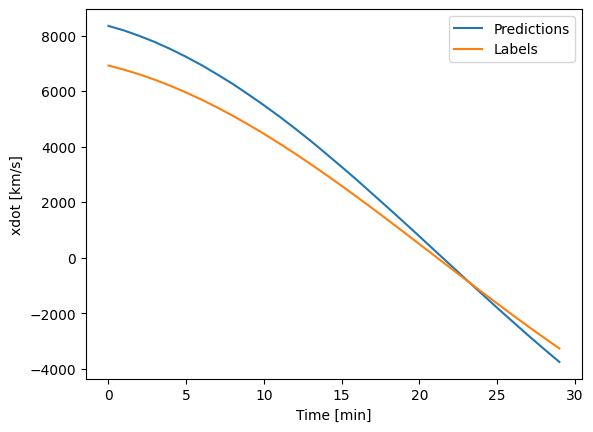

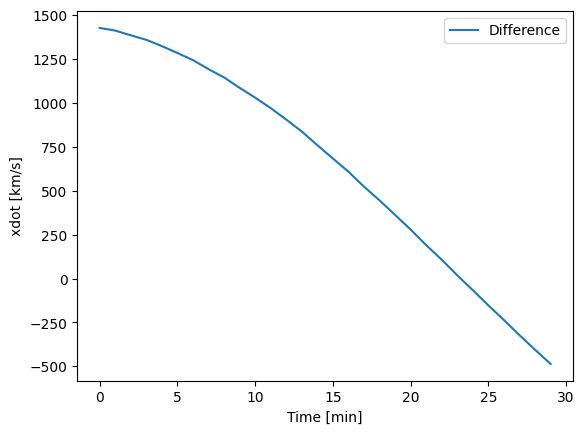

c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\tensorflow\python\data\ops\structured_function.py:256: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


<MapDataset element_spec=(TensorSpec(shape=(None, 500, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>


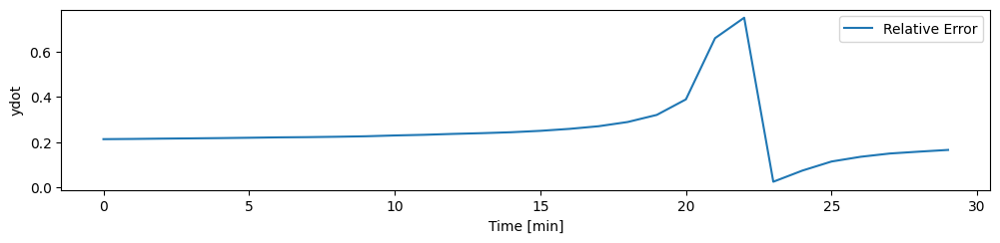

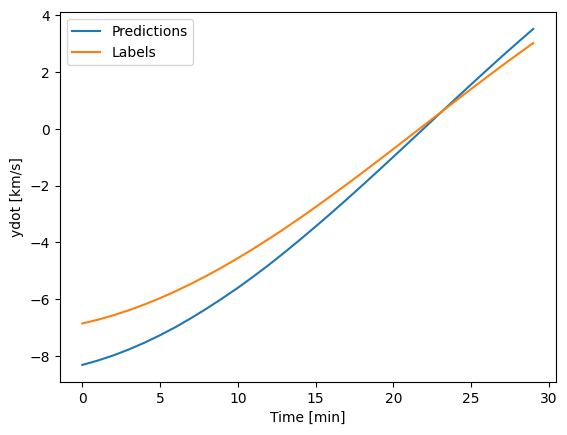

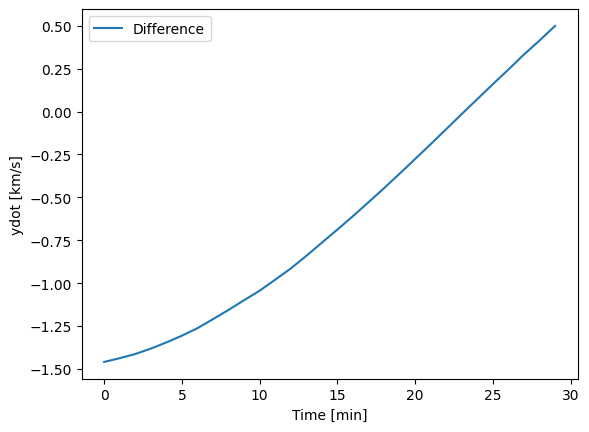

c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\tensorflow\python\data\ops\structured_function.py:256: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


<MapDataset element_spec=(TensorSpec(shape=(None, 500, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>


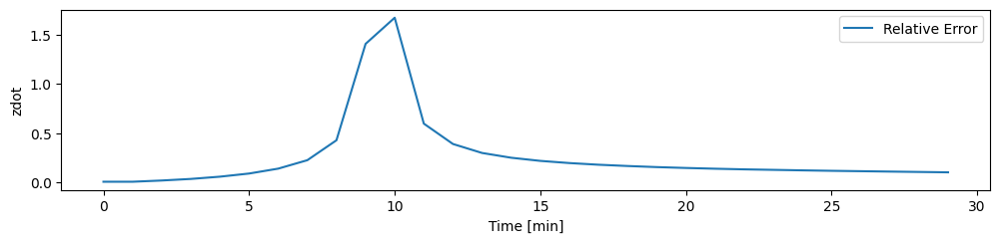

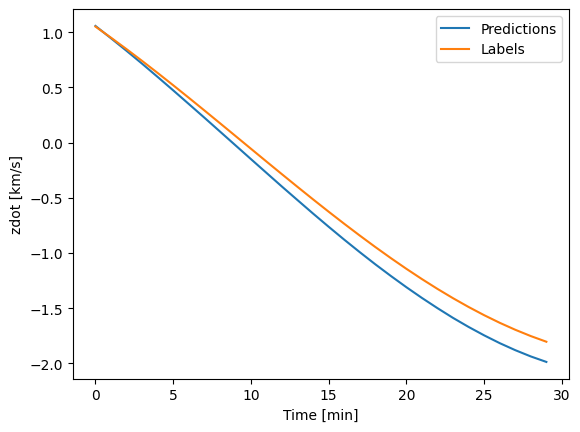

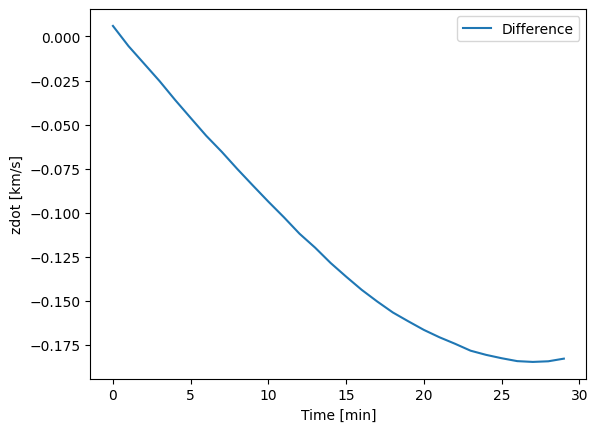

c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\tensorflow\python\data\ops\structured_function.py:256: UserWarning: Even though the `tf.config.experimental_run_functions_eagerly` option is set, this option does not apply to tf.data functions. To force eager execution of tf.data functions, please use `tf.data.experimental.enable_debug_mode()`.
  warnings.warn(


<MapDataset element_spec=(TensorSpec(shape=(None, 500, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>
<MapDataset element_spec=(TensorSpec(shape=(None, 500, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>
<MapDataset element_spec=(TensorSpec(shape=(None, 500, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>
<MapDataset element_spec=(TensorSpec(shape=(None, 500, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>
<MapDataset element_spec=(TensorSpec(shape=(None, 500, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>
<MapDataset element_spec=(TensorSpec(shape=(None, 500, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>
Mean Errors: 
X:  15834.364
Y:  1130.5709
Z:  100.73046
XDOT:  805.78973
YDOT:  0.822123

In [ ]:
import IPython
import IPython.display
import os

#plot the difference between the real and the predicted values with the column as a parameter
def plot_diff_Dense(model, window, max_subplots=1, column=0, plot_col = "x", plot_units = "[km]"):
    
    #window.test?
    print(window.test)
    inputs, labels = next(iter(window.test))
    
    inputs = inputs.numpy()
    labels = labels.numpy()
    predictions = model(inputs)
    predictions = predictions.numpy()
    
    inputs = inputs * train_std_Dense[column] + train_mean_Dense[column]
    labels = labels * train_std_Dense[column] + train_mean_Dense[column]
    predictions  = predictions * train_std_Dense[column] + train_mean_Dense[column]
    
    plt.figure(figsize=(12, 8))
    max_n = min(max_subplots, len(inputs))


    for n in range(max_n):
            plt.subplot(3, 1, n+1)

            #fazer legendas diferentes para as velocidades
            plt.ylabel(plot_col)
            plt.plot(np.abs((predictions[n, :, column] - labels[n, :, column])/ labels[n, :, column]) ,label='Relative Error')
            plt.xlabel('Time [min]')
            plt.legend()
            plt.savefig(results_dir + 'dense-training-relativeError-32832-' + plot_col + '.pdf')  
            plt.show()

            plt.ylabel(plot_col + ' ' + plot_units)
            plt.plot(predictions[n, :, column] ,label='Predictions')
            plt.plot(labels[n, :, column] ,label='Labels')
            plt.xlabel('Time [min]')
            plt.legend()
            plt.savefig(results_dir + 'dense-training-PredictionsVSLabels-32832-' + plot_col + '.pdf')  
            plt.show()

            plt.ylabel(plot_col + ' ' + plot_units)
            plt.plot((predictions[n, :, column] - labels[n, :, column]) ,label='Difference')
            plt.xlabel('Time [min]')
            plt.legend()
            plt.savefig(results_dir + 'dense-training-Difference-32832-' + plot_col + '.pdf')  
            plt.show()

plot_diff_Dense(model_in500_out30_32832, multi_window_Dense, column=0, plot_col = "time", plot_units = "[min]")
plot_diff_Dense(model_in500_out30_32832, multi_window_Dense, column=1, plot_col = "x", plot_units = "[km]")
plot_diff_Dense(model_in500_out30_32832, multi_window_Dense, column=2, plot_col = "y", plot_units = "[km]")
plot_diff_Dense(model_in500_out30_32832, multi_window_Dense, column=3, plot_col = "z", plot_units = "[km]")
plot_diff_Dense(model_in500_out30_32832, multi_window_Dense, column=4, plot_col = "xdot", plot_units = "[km/s]")
plot_diff_Dense(model_in500_out30_32832, multi_window_Dense, column=5, plot_col = "ydot", plot_units = "[km/s]")
plot_diff_Dense(model_in500_out30_32832, multi_window_Dense, column=6, plot_col = "zdot", plot_units = "[km/s]")



#calculate the mean absolute error for each column
def calculateMeanErrors(model, window, max_subplots=1, column=0):
    
    #repeat this for 10 trials and calculate the mean error
    meanError = 0
    nrTrials = 7
    for i in range(nrTrials):
        inputs, labels = next(iter(window.test))
        inputs = inputs.numpy()
        labels = labels.numpy()
        predictions = model(inputs)
        predictions = predictions.numpy()
        
        inputs = inputs * train_std_Dense[column] + train_mean_Dense[column]
        labels = labels * train_std_Dense[column] + train_mean_Dense[column]
        predictions  = predictions * train_std_Dense[column] + train_mean_Dense[column]
        
        meanError += np.mean(np.abs(predictions[:, :, column] - labels[:, :, column]))
    meanError = meanError/nrTrials
    return meanError
    
    
meanErrorX = calculateMeanErrors(model_in500_out30_32832, multi_window_Dense, column=1)
meanErrorY = calculateMeanErrors(model_in500_out30_32832, multi_window_Dense, column=2)
meanErrorZ = calculateMeanErrors(model_in500_out30_32832, multi_window_Dense, column=3)
meanErrorXDOT = calculateMeanErrors(model_in500_out30_32832, multi_window_Dense, column=4)
meanErrorYDOT = calculateMeanErrors(model_in500_out30_32832, multi_window_Dense, column=5)
meanErrorZDOT = calculateMeanErrors(model_in500_out30_32832, multi_window_Dense, column=6)

print("Mean Errors: ")
print("X: ", meanErrorX)
print("Y: ", meanErrorY)
print("Z: ", meanErrorZ)
print("XDOT: ", meanErrorXDOT)
print("YDOT: ", meanErrorYDOT)
print("ZDOT: ", meanErrorZDOT)


# SINDy test

In [ ]:
# #### SYNDy Model #####
# import pysindy as ps
# import re

# def getSindyEquations(trajectory, time, optimizer = ps.FROLS()):
#     polynomialLib = ps.PolynomialLibrary(degree=4)
#     model = ps.SINDy(feature_names=["posX", "posY", "posZ", "velX", "velY", "velZ"], optimizer= optimizer, feature_library= polynomialLib)
#     model.fit(trajectory, t=time, ensemble=True, quiet=True)
#     # model.print()
    
#     equations = transform_equations(model)
#     # print(equations)
#     return equations


# def transform_equations(model):
#     equations = model.print()
#     transformed_equations = []

#     for equation in equations:
#         # Replace "+-" with "-"
#         equation = equation.replace(" + -", "-")
#         # Replace "--" with "+"
#         equation = equation.replace(" - -", "+")
#         # Add multiplication sign between variables
#         equation = equation.replace(" ", "*")
#         equation = equation.replace("*+*", "+")

#         transformed_equations.append(equation)

#     return transformed_equations

In [ ]:
# #example of how to get the equations
# exampleTrainDf = train_df_PINN[0:32].copy().to_numpy()
# #separate the first column (time) from the rest
# exampleTime = exampleTrainDf[:,0]
# exampleTrainDf = exampleTrainDf[:,1:]

# equationsList = getSindyEquations(exampleTrainDf, exampleTime)
# print(equationsList)

# PINN (WITHOUT INITIAL STATE) 0.1

### PINN (without initial state) IN 500 OUT 30, 16 8 16 DENSE

In [15]:
class PhysicsInformedNN_noInitialState():
    def __init__(self, windowData, windowDataValidation):
        # data
        self.windowData = windowData
        self.windowDataValidation = windowDataValidation
        
        self.allLossesTraining = []
        self.allLossesValidation = []

        self.u_net_LossesTraining = []
        self.u_net_LossesValidation = []

        self.f_net_LossesTraining = []
        self.f_net_LossesValidation = []
        
        self.early_stopping_patience = 20 
        self.best_validation_loss = float('inf')

        # deep neural networks
        self.dnn = tf.keras.Sequential([
            # Shape [batch, time, features] => [batch, features]
            tf.keras.layers.Lambda(lambda x: x[:, -INPUT_STEPS:, :]),
            # tf.keras.layers.Flatten(input_shape=(1440, num_features)),
            
            # tf.keras.layers.Flatten(input_shape=(1440, 1)),
            
            tf.keras.layers.Dense(16, activation='LeakyReLU'),
            tf.keras.layers.Dense(8, activation='LeakyReLU'),
            tf.keras.layers.Dense(16, activation='LeakyReLU'),

            tf.keras.layers.Flatten(),
            # Shape => [batch, out_steps*num_outputs]
            tf.keras.layers.Dense(OUT_STEPS*num_features_Dense, kernel_initializer=tf.keras.initializers.HeNormal()),
            # Shape => [batch, out_steps, num_outputs]
            tf.keras.layers.Reshape([OUT_STEPS, num_features_Dense])
        ])
        
        # optimizers: using the same settings
        self.optimizer = tf.optimizers.Adam()
        
        self.iter = 0
        
    def net_u(self, windowData):  
        #remove the time
        # # windowData = windowData[:, :, :-1]
        # time = windowData[:, :, 0:1]
        # initial_state = windowData[:, :, 1:]
        #tf.concat([time, initial_state], axis=-1)
        u = self.dnn(windowData)
        # u = self.dnn(windowData)
        return u
    
    def net_f(self, time, data):
        """ The TensorFlow version of calculating residual """

        #change data to variable
        time = tf.Variable(time, dtype=tf.float32)
        data = tf.Variable(data, dtype=tf.float32)


        x = data[:, :, 0]
        y = data[:, :, 1]
        z = data[:, :, 2]
        xdot = data[:, :, 3]
        ydot = data[:, :, 4]
        zdot = data[:, :, 5]
        # xdotdot = data[:, :, 6]
        # ydotdot = data[:, :, 7]
        # zdotdot = data[:, :, 8]

        def calculate_velocity(positions, vel, t):
            with tf.GradientTape(persistent=True) as tape:
                tape.watch(t)
                output = (positions*t)/t # Perform computation involving positions tensor and time tensor
            
            velocity = tape.gradient(output, t)
            return velocity

        x_dot = calculate_velocity(x, xdot, time)
        y_dot = calculate_velocity(y, ydot, time)
        z_dot = calculate_velocity(z, zdot, time)
        x_dot_dot = calculate_velocity(x_dot, None, time)
        y_dot_dot = calculate_velocity(y_dot, None, time)
        z_dot_dot = calculate_velocity(z_dot, None, time)

        
        #call SINDy to get the equations
        # model = getSindyEquations(data[:, :, 1:], data[:, :, 0])

        #create a tuple with the residual for each axis
        res_px = x_dot - xdot
        res_py = y_dot - ydot
        res_pz = z_dot - zdot
        # standardGravitationalParameter = 3.986004418 * 10**(5), using standardized  
        r = tf.sqrt(x**2 + y**2 + z**2)
        res_vx = x_dot_dot + standardGravitationalParameter * x/(r**3) 
        res_vy = y_dot_dot + standardGravitationalParameter * y/(r**3) 
        res_vz = z_dot_dot + standardGravitationalParameter * z/(r**3) 

        # res_accX = x_dot_dot - xdotdot
        # res_accY = y_dot_dot - ydotdot
        # res_accZ = z_dot_dot - zdotdot


        #concatenate the residuals into a single tensor
        # res = tf.concat([res_px, res_py, res_pz, res_vx, res_vy, res_vz, res_accX, res_accY, res_accZ], axis=1)
        res = tf.concat([res_px, res_py, res_pz, res_vx, res_vy, res_vz], axis=1)

        return res
    
    def loss_func(self, inputs, labels, isTraining = True):
        with tf.GradientTape() as tape:
            tape.watch(self.dnn.trainable_variables)
            
            #separate the time from the rest of the data
            timeAux = tf.Variable(inputs[:, :, 0])
            # initial_state = inputs[:, 0, 1:]
            # inputs = inputs[:, :, 1:]
            # u_pred = self.net_u(timeAux)
            u_pred = self.net_u(inputs)
            #limit timeAux for each batch to the shape of the output of the neural network
            timeAux = timeAux[:, 0:labels.shape[1]]

            f_pred = self.net_f(timeAux, u_pred)

            #remove the time from the labels
            # labels = labels[:, :, 1:]
            loss_u = tf.reduce_mean(tf.square(labels - u_pred))
            loss_f = tf.reduce_mean(tf.square(f_pred))

            weightLoss = 0.1
            loss = (weightLoss * loss_u) + ((1-weightLoss) * loss_f)
        
        gradients = tape.gradient(loss, self.dnn.trainable_variables)
        self.optimizer.apply_gradients(zip(gradients, self.dnn.trainable_variables))
        
        self.iter += 1

        # if isTraining:
        #     self.allLossesTraining.append(loss.numpy())
        #     self.u_net_LossesTraining.append(loss_u.numpy())
        #     self.f_net_LossesTraining.append(loss_f.numpy())
        # else:
        #     self.allLossesValidation.append(loss.numpy())
        #     self.u_net_LossesValidation.append(loss_u.numpy())
        #     self.f_net_LossesValidation.append(loss_f.numpy())

        if self.iter % 100 == 0:
            print(
                'Iter %d, Loss: %.5e, Loss_u: %.5e, Loss_f: %.5e' % (self.iter, loss.numpy(), loss_u.numpy(), loss_f.numpy())
            )
            
        return loss.numpy(), loss_u.numpy(), loss_f.numpy()

    def validate(self):
        self.dnn.trainable = False
        loss_Aux = np.array([])
        lossU_Aux = np.array([])
        lossF_Aux = np.array([])
        for example_inputs, example_labels in self.windowDataValidation:
            loss, lossU, lossF = self.loss_func(example_inputs, example_labels, isTraining=False)
            
            loss_Aux = np.append(loss_Aux, loss)
            lossU_Aux = np.append(lossU_Aux, lossU)
            lossF_Aux = np.append(lossF_Aux, lossF)


        self.allLossesValidation.append(np.mean(loss_Aux))
        self.u_net_LossesValidation.append(np.mean(lossU_Aux))
        self.f_net_LossesValidation.append(np.mean(lossF_Aux))
    
    def build(self, input_shape):
        self.dnn.build(input_shape)

    def train(self):
        for epoch in range(200):
            print('EPOCH %d' % (epoch))
            print((np.array(self.windowData)))
            loss_Aux = np.array([])
            lossU_Aux = np.array([])
            lossF_Aux = np.array([])

            self.dnn.trainable = True
            for n, (example_inputs, example_labels) in enumerate(self.windowData):
                loss, lossU, lossF = self.loss_func(example_inputs, example_labels, isTraining=True)
                
                #store intermediate losses and then make mean to get the epoch loss
                loss_Aux = np.append(loss_Aux, loss)
                lossU_Aux = np.append(lossU_Aux, lossU)
                lossF_Aux = np.append(lossF_Aux, lossF)
            
            #first value was returning nan for the physical loss
            for i in range(0, len(loss_Aux)):
                if np.isnan(loss_Aux[i]):
                    loss_Aux[i] = loss_Aux[i + 1]
                if np.isnan(lossF_Aux[i]):
                    lossF_Aux[i] = lossF_Aux[i + 1]
                if np.isnan(lossU_Aux[i]):
                    lossU_Aux[i] = lossU_Aux[i + 1]
            
            self.allLossesTraining.append(np.mean(loss_Aux))
            self.u_net_LossesTraining.append(np.mean(lossU_Aux))
            self.f_net_LossesTraining.append(np.mean(lossF_Aux))
           
            self.validate()
            
            # Check if the validation loss has improved
            if self.allLossesValidation[-1] < self.best_validation_loss:
                self.best_validation_loss = self.allLossesValidation[-1]
                self.early_stopping_counter = 0
            else:
                self.early_stopping_counter += 1

            # Stop training if the validation loss hasn't improved for the specified patience
            if self.early_stopping_counter >= self.early_stopping_patience:
                print(f"Early stopping at epoch {epoch}")
                break

        self.dnn.trainable = False
                
    # def predict(self, X):
    #     self.dnn.trainable = False
    #     u = self.net_u(X)
    #     #select the time from the input
    #     time = X[:, :, 0]
    #     #60 = output steps da window
    #     time = time[:, 0:OUT_STEPS]
    #     f = self.net_f(time, u)
    #     u = u.numpy()
    #     f = f.numpy()
    #     return u, f

    def predict(self, X):
        self.dnn.trainable = False
        outputsU = []
        outputsF = []
        for inputs, labels in X:
            #separate the time from the rest of the data
            timeAux = tf.Variable(inputs[:, :, 0])
            u = self.net_u(inputs)
            time = timeAux[:, 0:OUT_STEPS]
            f = self.net_f(time, u)
            outputsU.append(u.numpy())
            outputsF.append(f.numpy())

        return np.concatenate(outputsU, axis=0), np.concatenate(outputsF, axis=0)

    def run_trial(self):
        self.allLossesTraining = []
        self.allLossesValidation = []
        self.best_validation_loss = float('inf')
        self.early_stopping_counter = 0
        self.build((32, INPUT_STEPS, 7))
        self.train()
        return self.allLossesTraining, self.allLossesValidation

    def plot_losses(self, graphics = "allLosses"):
        
        # allLossesTraining
        # u_net_LossesTraining
        # f_net_LossesTraining

        # allLossesValidation
        # u_net_LossesValidation
        # f_net_LossesValidation

        if graphics == "f_losses":
            plt.yscale('log')
            plt.plot(self.f_net_LossesTraining, label='Training Loss')
            plt.plot(self.f_net_LossesValidation, label='Validation Loss')
            plt.xlabel('Epoch')
            plt.ylabel('Loss')
            plt.title('Training and Validation Physical Loss')
            plt.legend()
            plt.show()
        elif graphics == "u_losses":
            plt.yscale('log')
            plt.plot(self.u_net_LossesTraining, label='Training Loss')
            plt.plot(self.u_net_LossesValidation, label='Validation Loss')
            plt.xlabel('Epoch')
            plt.ylabel('Loss')
            plt.title('Training and Validation Data Loss')
            plt.legend()
            plt.show()
        else:
            plt.yscale('log')
            plt.plot(self.allLossesTraining, label='Training Loss')
            plt.plot(self.allLossesValidation, label='Validation Loss')
            plt.xlabel('Epoch')
            plt.ylabel('Loss')
            plt.title('Training and Validation Total Loss')
            plt.legend()
            plt.show()

modelTest_noInitialState = PhysicsInformedNN_noInitialState(multi_window_Dense.train, multi_window_Dense.val)
#build the model
#subtract one from the shape because the time is not an input
# modelTest.build(multi_window.example[0].shape)
# modelTest_noInitialState.build((32, INPUT_STEPS, 7))
# modelTest_noInitialState.train()


nrOfRuns = 7
all_losses_training_in500_out30_16816_01 = []
all_losses_validation_in500_out30_16816_01 = []
for _ in range(nrOfRuns):
    losses_training, losses_validation = modelTest_noInitialState.run_trial()
    all_losses_training_in500_out30_16816_01.append(losses_training)
    all_losses_validation_in500_out30_16816_01.append(losses_validation)

EPOCH 0
<MapDataset element_spec=(TensorSpec(shape=(None, 500, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>
Iter 100, Loss: 1.94447e+02, Loss_u: 3.36008e-04, Loss_f: 2.16052e+02
Iter 200, Loss: 3.53612e+02, Loss_u: 2.57569e-04, Loss_f: 3.92902e+02
Iter 300, Loss: 1.01675e+02, Loss_u: 1.51881e-04, Loss_f: 1.12972e+02
Iter 400, Loss: 1.98256e+01, Loss_u: 6.03413e-03, Loss_f: 2.20278e+01
EPOCH 1
<MapDataset element_spec=(TensorSpec(shape=(None, 500, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 7), dtype=tf.float32, name=None))>
Iter 500, Loss: 7.15818e+01, Loss_u: 1.04346e-02, Loss_f: 7.95342e+01
Iter 600, Loss: 2.57289e+02, Loss_u: 1.13280e-04, Loss_f: 2.85877e+02
Iter 700, Loss: 2.71504e+02, Loss_u: 6.65021e-05, Loss_f: 3.01671e+02
Iter 800, Loss: 6.91845e+01, Loss_u: 1.04229e-04, Loss_f: 7.68716e+01
Iter 900, Loss: 2.03836e+01, Loss_u: 4.61623e-02, Loss_f: 2.26433e+01
EPOCH 2
<MapDataset element_spec=(TensorSpec(shape

KeyboardInterrupt: 

C:\Users\jpfun\AppData\Local\Temp\ipykernel_50240\543464363.py:9: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  all_losses_training_in500_out30_16816_01 = np.array(all_losses_training_in500_out30_16816_01)
C:\Users\jpfun\AppData\Local\Temp\ipykernel_50240\543464363.py:10: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  all_losses_validation_in500_out30_16816_01 = np.array(all_losses_validation_in500_out30_16816_01)
c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\numpy\lib\nanfunctions.py:1670: RuntimeWarning: Degrees of fre

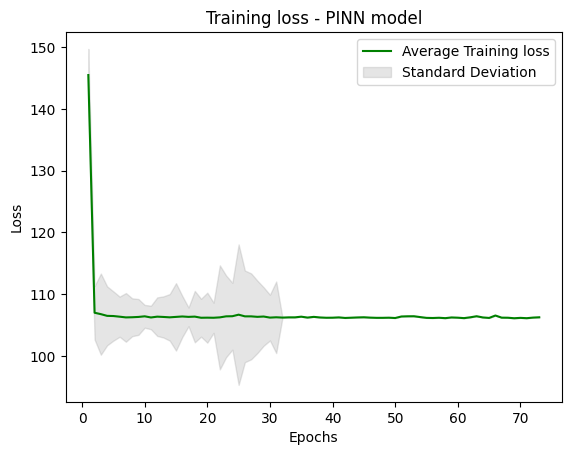

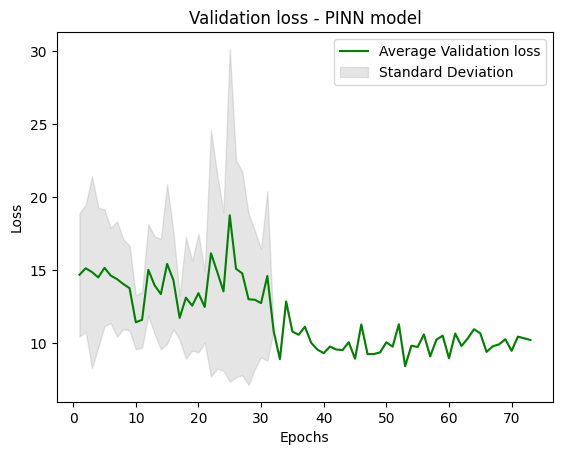

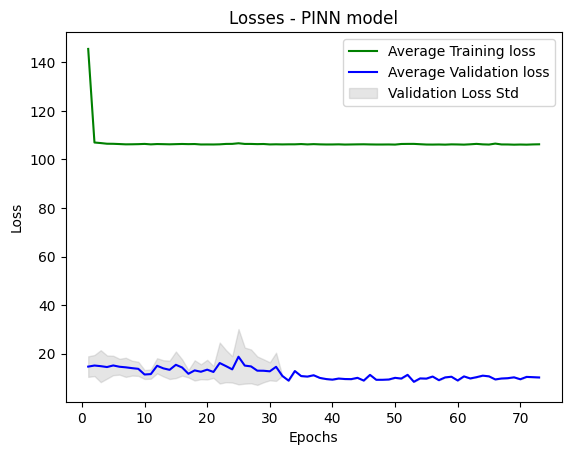

In [ ]:
from itertools import zip_longest
import os

current_dir = os.getcwd()
results_dir = os.path.join(current_dir, 'PINN/DefaultTest/16816/In500_Out30/01/')
if not os.path.isdir(results_dir):
    os.makedirs(results_dir)

all_losses_training_in500_out30_16816_01 = np.array(all_losses_training_in500_out30_16816_01)
all_losses_validation_in500_out30_16816_01 = np.array(all_losses_validation_in500_out30_16816_01)

avg_loss_training = [np.mean([x[i] for x in all_losses_training_in500_out30_16816_01 if len(x) > i]) for i in range(len(max(all_losses_training_in500_out30_16816_01,key=len)))]
std_loss_training = np.nan_to_num(np.nanstd(np.array(list(zip_longest(*all_losses_training_in500_out30_16816_01)),dtype=float),axis=1,ddof=1), copy=False)

avg_loss_validation = [np.mean([x[i] for x in all_losses_validation_in500_out30_16816_01 if len(x) > i]) for i in range(len(max(all_losses_validation_in500_out30_16816_01,key=len)))]
std_loss_validation = np.nan_to_num(np.nanstd(np.array(list(zip_longest(*all_losses_validation_in500_out30_16816_01)),dtype=float),axis=1,ddof=1), copy=False)

# Plot the average losses with shaded standard deviation
#create vector of 1 to length of avg_loss_training for x-axis
epochNrs = np.arange(1, len(avg_loss_training)+1, 1)
plt.plot(epochNrs, avg_loss_training, 'g', label='Average Training loss')
plt.fill_between(epochNrs, avg_loss_training - std_loss_validation, avg_loss_training + std_loss_validation, color='gray', alpha=0.2, label='Standard Deviation')
plt.title('Training loss - PINN model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig(results_dir + 'pinn-training-loss-16816.pdf')  
plt.show()

epochNrs = np.arange(1, len(avg_loss_validation)+1, 1)
plt.plot(epochNrs, avg_loss_validation, 'g', label='Average Validation loss')
plt.fill_between(epochNrs, avg_loss_validation - std_loss_validation, avg_loss_validation + std_loss_validation, color='gray', alpha=0.2, label='Standard Deviation')
plt.title('Validation loss - PINN model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig(results_dir + 'pinn-validation-loss-16816.pdf')  
plt.show()

epochNrs = np.arange(1, len(avg_loss_validation)+1, 1)
plt.plot(epochNrs, avg_loss_training, 'g', label='Average Training loss')
plt.plot(epochNrs, avg_loss_validation, 'b', label='Average Validation loss')
plt.fill_between(epochNrs, avg_loss_validation - std_loss_validation, avg_loss_validation + std_loss_validation, color='gray', alpha=0.2, label='Validation Loss Std')
plt.title('Losses - PINN model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig(results_dir + 'dense-allLosses-16816.pdf')  
plt.show()

(32, 500, 10)
(32, 30, 10)
(3504, 30, 10)


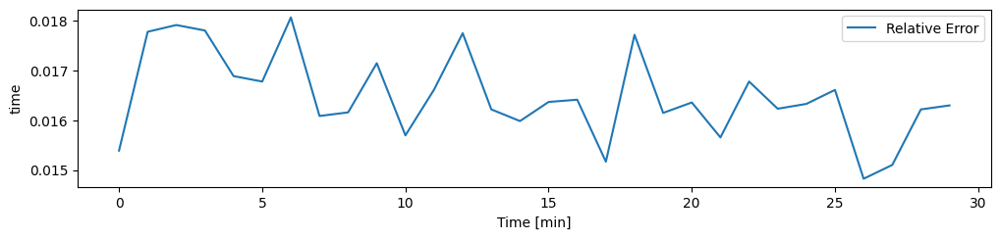

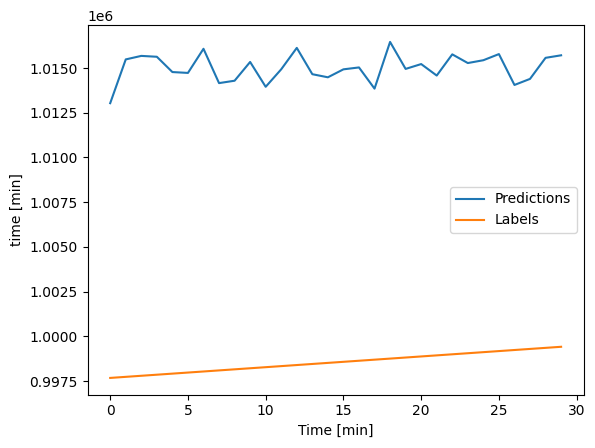

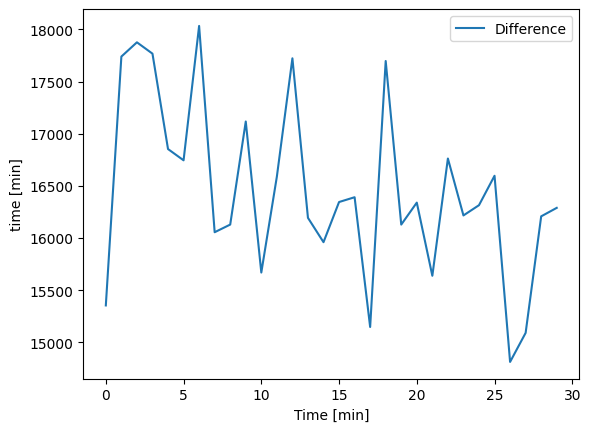

(32, 500, 10)
(32, 30, 10)
(3504, 30, 10)


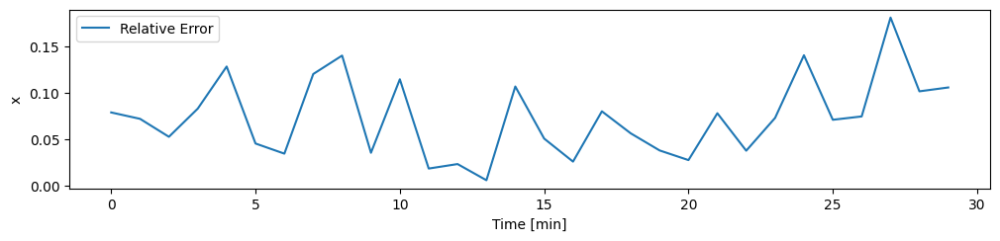

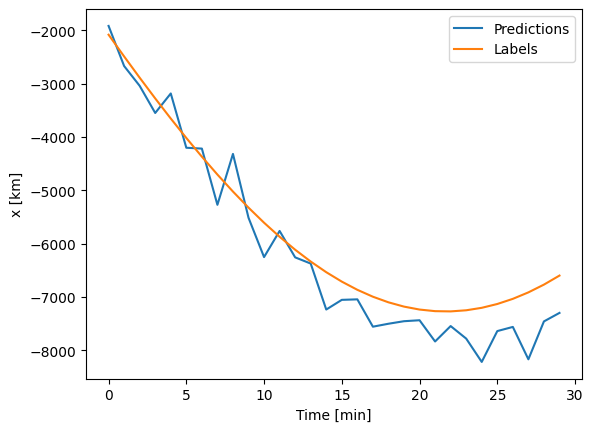

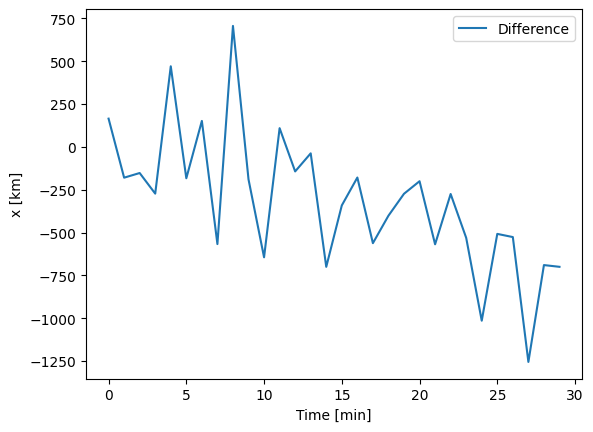

(32, 500, 10)
(32, 30, 10)
(3504, 30, 10)


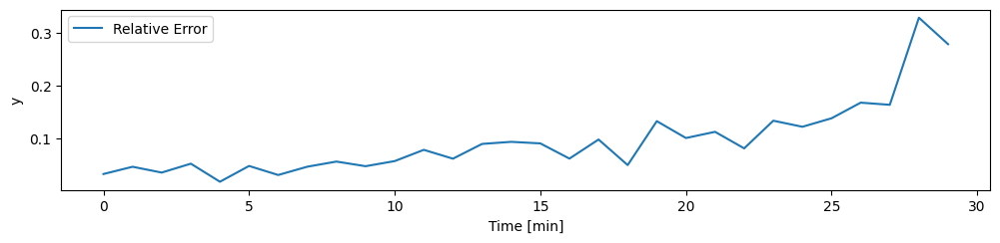

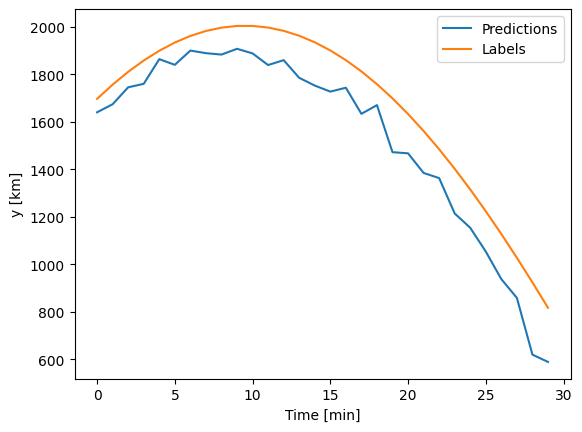

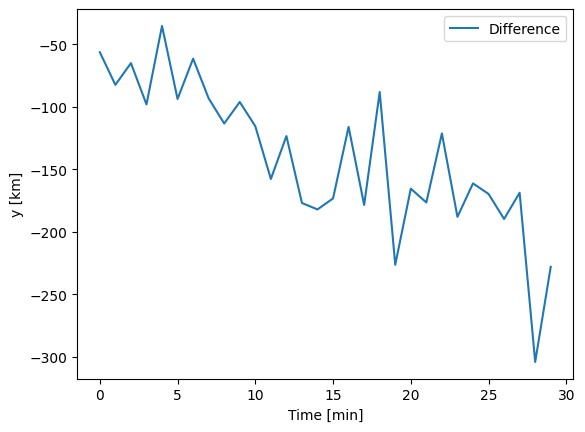

(32, 500, 10)
(32, 30, 10)
(3504, 30, 10)


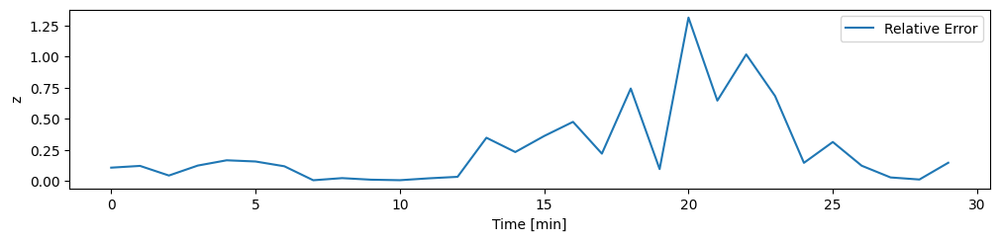

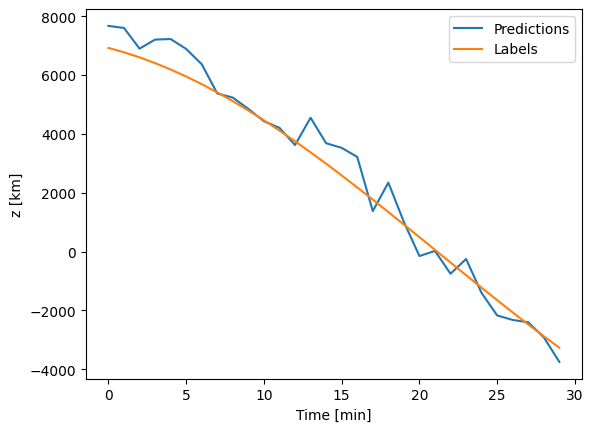

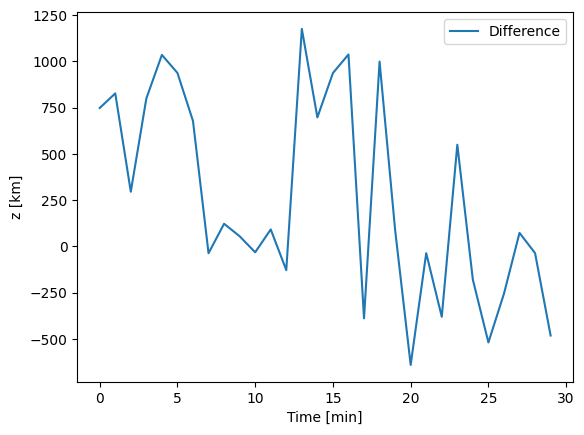

(32, 500, 10)
(32, 30, 10)
(3504, 30, 10)


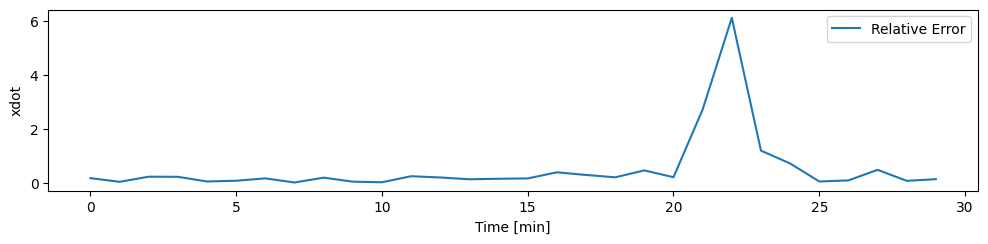

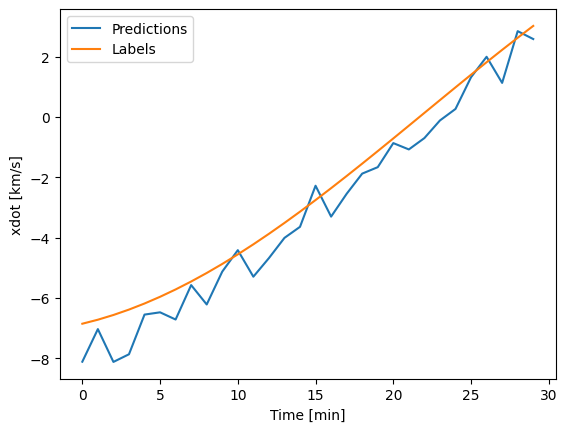

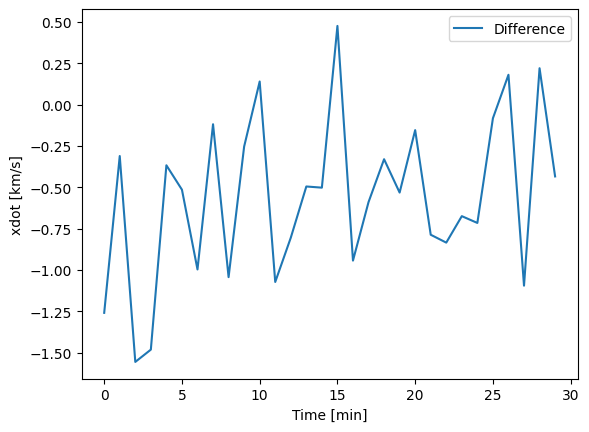

(32, 500, 10)
(32, 30, 10)
(3504, 30, 10)


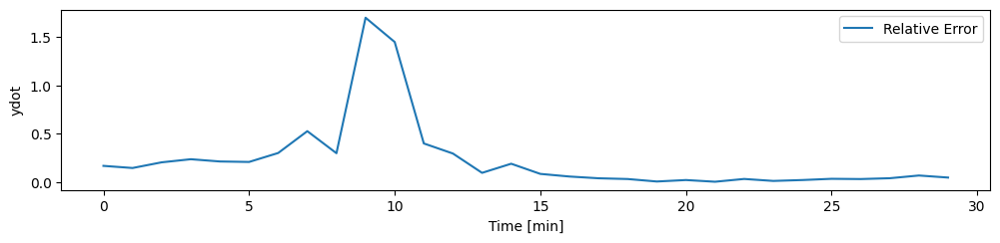

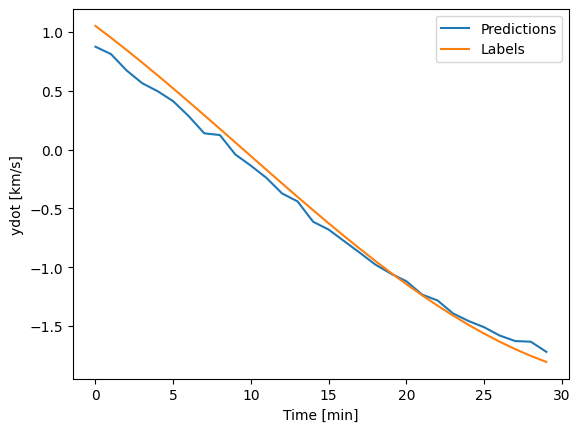

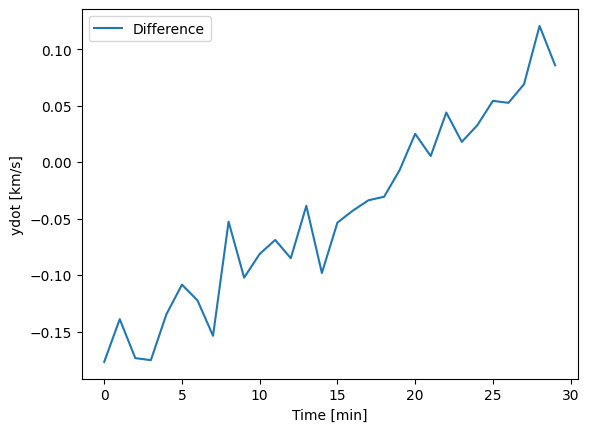

(32, 500, 10)
(32, 30, 10)
(3504, 30, 10)


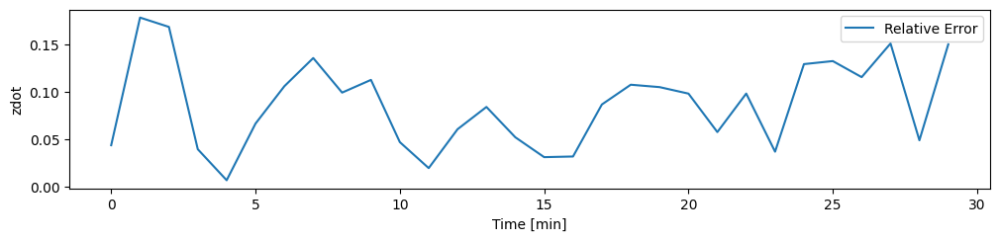

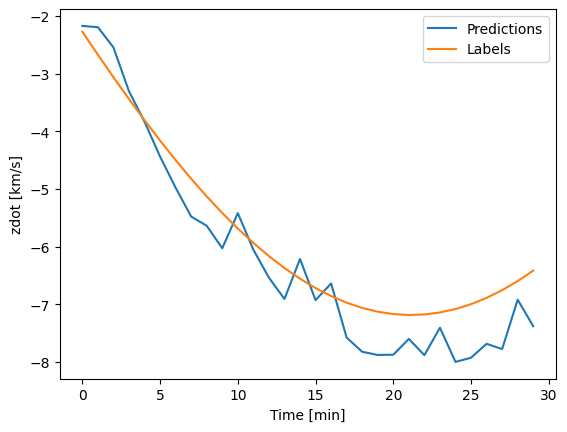

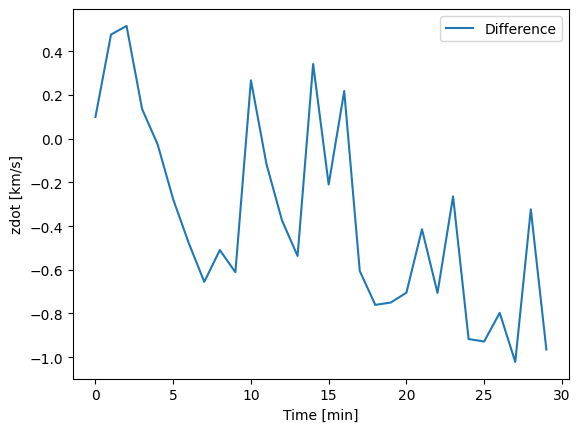

(32, 500, 10)
(32, 30, 10)
(3504, 30, 10)


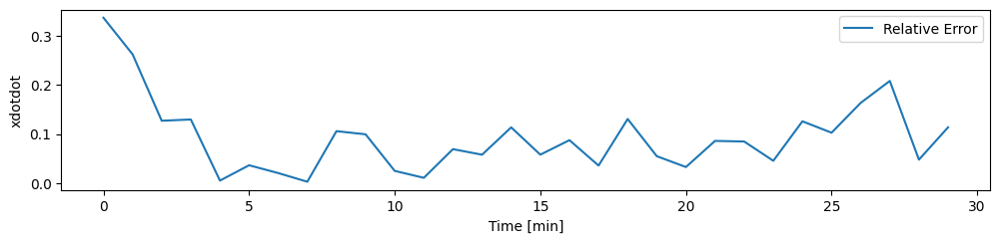

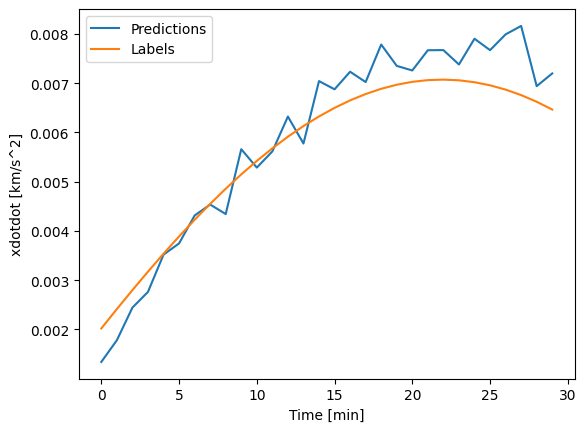

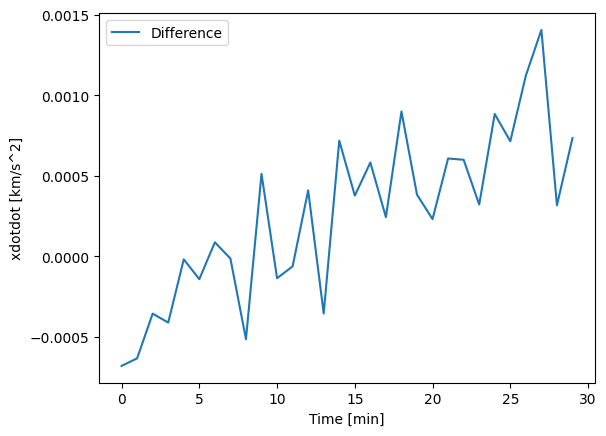

Mean Errors: 
X:  423.4123840332031
Y:  140.2322540283203
Z:  475.59405517578125
XDOT:  0.6325756907463074
YDOT:  0.07951298356056213
ZDOT:  0.5002707839012146
XDOTDOT:  0.00048194683040492237
YDOTDOT:  0.00011995419481536373
ZDOTDOT:  0.000614001473877579


In [ ]:
import IPython
import IPython.display
import os

#plot the difference between the real and the predicted values with the column as a parameter
def plot_diff_Dense(model, window, max_subplots=1, column=0, plot_col = "x", plot_units = "[km]"):
    
    #window.test?
    # print(window.test)
    inputs, labels = next(iter(window.test))
    
    inputs = inputs.numpy()
    labels = labels.numpy()
    predictions, physicalOutputs = model.predict(window.test)
    
    inputs = inputs * train_std_Dense[column] + train_mean_Dense[column]
    labels = labels * train_std_Dense[column] + train_mean_Dense[column]
    predictions  = predictions * train_std_Dense[column] + train_mean_Dense[column]
    
    print(inputs.shape)
    print(labels.shape)
    print(predictions.shape)

    plt.figure(figsize=(12, 8))
    max_n = min(max_subplots, len(inputs))


    for n in range(max_n):
            plt.subplot(3, 1, n+1)

            #fazer legendas diferentes para as velocidades
            plt.ylabel(plot_col)
            plt.plot(np.abs((predictions[n, :, column] - labels[n, :, column])/ labels[n, :, column]) ,label='Relative Error')
            plt.xlabel('Time [min]')
            plt.legend()
            plt.savefig(results_dir + 'pinn-training-relativeError-16816-' + plot_col + '.pdf')  
            plt.show()

            plt.ylabel(plot_col + ' ' + plot_units)
            plt.plot(predictions[n, :, column] ,label='Predictions')
            plt.plot(labels[n, :, column] ,label='Labels')
            plt.xlabel('Time [min]')
            plt.legend()
            plt.savefig(results_dir + 'pinn-training-PredictionsVSLabels-16816-' + plot_col + '.pdf')  
            plt.show()

            plt.ylabel(plot_col + ' ' + plot_units)
            plt.plot((predictions[n, :, column] - labels[n, :, column]) ,label='Difference')
            plt.xlabel('Time [min]')
            plt.legend()
            plt.savefig(results_dir + 'pinn-training-Difference-16816-' + plot_col + '.pdf')  
            plt.show()

plot_diff_Dense(modelTest_noInitialState, multi_window_Dense, column=0, plot_col = "time", plot_units = "[min]")
plot_diff_Dense(modelTest_noInitialState, multi_window_Dense, column=1, plot_col = "x", plot_units = "[km]")
plot_diff_Dense(modelTest_noInitialState, multi_window_Dense, column=2, plot_col = "y", plot_units = "[km]")
plot_diff_Dense(modelTest_noInitialState, multi_window_Dense, column=3, plot_col = "z", plot_units = "[km]")
plot_diff_Dense(modelTest_noInitialState, multi_window_Dense, column=4, plot_col = "xdot", plot_units = "[km/s]")
plot_diff_Dense(modelTest_noInitialState, multi_window_Dense, column=5, plot_col = "ydot", plot_units = "[km/s]")
plot_diff_Dense(modelTest_noInitialState, multi_window_Dense, column=6, plot_col = "zdot", plot_units = "[km/s]")



#calculate the mean absolute error for each column
def calculateMeanErrors(model, window, max_subplots=1, column=0):
    
    #repeat this for 10 trials and calculate the mean error
    meanError = 0
    nrTrials = 4
    for i in range(nrTrials):
        inputs, labels = next(iter(window.test))
        inputs = inputs.numpy()
        labels = labels.numpy()
        predictions, physicalOutputs = model.predict(window.test)
        
        inputs = inputs * train_std_Dense[column] + train_mean_Dense[column]
        labels = labels * train_std_Dense[column] + train_mean_Dense[column]
        predictions  = predictions * train_std_Dense[column] + train_mean_Dense[column]
        
        meanError += np.mean(np.abs(predictions[0, :, column] - labels[0, :, column]))
    meanError = meanError/nrTrials
    return meanError


    # inputs, labels = next(iter(window.test))
    
    # inputs = inputs.numpy()
    # labels = labels.numpy()
    # predictions, physicalOutputs = model.predict(window.test)
    
    # inputs = inputs * train_std_Dense[column] + train_mean_Dense[column]
    # labels = labels * train_std_Dense[column] + train_mean_Dense[column]
    # predictions  = predictions * train_std_Dense[column] + train_mean_Dense[column]
    
    
    # meanError = np.mean(np.abs(predictions[0, :, column] - labels[0, :, column]))
    # return meanError
    
    
meanErrorX = calculateMeanErrors(modelTest_noInitialState, multi_window_Dense, column=1)
meanErrorY = calculateMeanErrors(modelTest_noInitialState, multi_window_Dense, column=2)
meanErrorZ = calculateMeanErrors(modelTest_noInitialState, multi_window_Dense, column=3)
meanErrorXDOT = calculateMeanErrors(modelTest_noInitialState, multi_window_Dense, column=4)
meanErrorYDOT = calculateMeanErrors(modelTest_noInitialState, multi_window_Dense, column=5)
meanErrorZDOT = calculateMeanErrors(modelTest_noInitialState, multi_window_Dense, column=6)

print("Mean Errors: ")
print("X: ", meanErrorX)
print("Y: ", meanErrorY)
print("Z: ", meanErrorZ)
print("XDOT: ", meanErrorXDOT)
print("YDOT: ", meanErrorYDOT)
print("ZDOT: ", meanErrorZDOT)


In [20]:
#plot losses
# modelTest_noInitialState.plot_losses("allLosses")
# modelTest_noInitialState.plot_losses("u_losses")
# modelTest_noInitialState.plot_losses("f_losses")

### PINN (without initial state) IN 500 OUT 30, 32 16 32 DENSE

In [66]:
class PhysicsInformedNN_noInitialState():
    def __init__(self, windowData, windowDataValidation):
        # data
        self.windowData = windowData
        self.windowDataValidation = windowDataValidation
        
        self.allLossesTraining = []
        self.allLossesValidation = []

        self.u_net_LossesTraining = []
        self.u_net_LossesValidation = []

        self.f_net_LossesTraining = []
        self.f_net_LossesValidation = []
        
        self.early_stopping_patience = 20 
        self.best_validation_loss = float('inf')

        # deep neural networks
        self.dnn = tf.keras.Sequential([
            # Shape [batch, time, features] => [batch, features]
            tf.keras.layers.Lambda(lambda x: x[:, -INPUT_STEPS:, :]),
            # tf.keras.layers.Flatten(input_shape=(1440, num_features)),
            
            # tf.keras.layers.Flatten(input_shape=(1440, 1)),
            
            tf.keras.layers.Dense(32, activation='LeakyReLU'),
            tf.keras.layers.Dense(16, activation='LeakyReLU'),
            tf.keras.layers.Dense(32, activation='LeakyReLU'),

            tf.keras.layers.Flatten(),
            # Shape => [batch, out_steps*num_outputs]
            tf.keras.layers.Dense(OUT_STEPS*num_features_Dense, kernel_initializer=tf.keras.initializers.HeNormal()),
            # Shape => [batch, out_steps, num_outputs]
            tf.keras.layers.Reshape([OUT_STEPS, num_features_Dense])
        ])
        
        # optimizers: using the same settings
        self.optimizer = tf.optimizers.Adam()
        
        self.iter = 0
        
    def net_u(self, windowData):  
        #remove the time
        # # windowData = windowData[:, :, :-1]
        # time = windowData[:, :, 0:1]
        # initial_state = windowData[:, :, 1:]
        #tf.concat([time, initial_state], axis=-1)
        u = self.dnn(windowData)
        # u = self.dnn(windowData)
        return u
    
    def net_f(self, time, data):
        """ The TensorFlow version of calculating residual """

        #change data to variable
        time = tf.Variable(time, dtype=tf.float32)
        data = tf.Variable(data, dtype=tf.float32)


        x = data[:, :, 0]
        y = data[:, :, 1]
        z = data[:, :, 2]
        xdot = data[:, :, 3]
        ydot = data[:, :, 4]
        zdot = data[:, :, 5]
        xdotdot = data[:, :, 6]
        ydotdot = data[:, :, 7]
        zdotdot = data[:, :, 8]

        def calculate_velocity(positions, vel, t):
            with tf.GradientTape(persistent=True) as tape:
                tape.watch(t)
                output = (positions*t)/t # Perform computation involving positions tensor and time tensor
            
            velocity = tape.gradient(output, t)
            return velocity

        x_dot = calculate_velocity(x, xdot, time)
        y_dot = calculate_velocity(y, ydot, time)
        z_dot = calculate_velocity(z, zdot, time)
        x_dot_dot = calculate_velocity(x_dot, None, time)
        y_dot_dot = calculate_velocity(y_dot, None, time)
        z_dot_dot = calculate_velocity(z_dot, None, time)

        
        #call SINDy to get the equations
        # model = getSindyEquations(data[:, :, 1:], data[:, :, 0])

        #create a tuple with the residual for each axis
        res_px = x_dot - xdot
        res_py = y_dot - ydot
        res_pz = z_dot - zdot
        # standardGravitationalParameter = 3.986004418 * 10**(5), using standardized  
        r = tf.sqrt(x**2 + y**2 + z**2)
        res_vx = x_dot_dot + standardGravitationalParameter * x/(r**3) 
        res_vy = y_dot_dot + standardGravitationalParameter * y/(r**3) 
        res_vz = z_dot_dot + standardGravitationalParameter * z/(r**3) 

        res_accX = x_dot_dot - xdotdot
        res_accY = y_dot_dot - ydotdot
        res_accZ = z_dot_dot - zdotdot


        #concatenate the residuals into a single tensor
        res = tf.concat([res_px, res_py, res_pz, res_vx, res_vy, res_vz, res_accX, res_accY, res_accZ], axis=1)
        # res = tf.concat([res_px, res_py, res_pz, res_vx, res_vy, res_vz], axis=1)

        return res
    
    def loss_func(self, inputs, labels, isTraining = True):
        with tf.GradientTape() as tape:
            tape.watch(self.dnn.trainable_variables)
            
            #separate the time from the rest of the data
            timeAux = tf.Variable(inputs[:, :, 0])
            # initial_state = inputs[:, 0, 1:]
            # inputs = inputs[:, :, 1:]
            # u_pred = self.net_u(timeAux)
            u_pred = self.net_u(inputs)
            #limit timeAux for each batch to the shape of the output of the neural network
            timeAux = timeAux[:, 0:labels.shape[1]]

            f_pred = self.net_f(timeAux, u_pred)

            #remove the time from the labels
            # labels = labels[:, :, 1:]
            loss_u = tf.reduce_mean(tf.square(labels - u_pred))
            loss_f = tf.reduce_mean(tf.square(f_pred))

            weightLoss = 0.1
            loss = (weightLoss * loss_u) + ((1-weightLoss) * loss_f)
        
        gradients = tape.gradient(loss, self.dnn.trainable_variables)
        self.optimizer.apply_gradients(zip(gradients, self.dnn.trainable_variables))
        
        self.iter += 1

        # if isTraining:
        #     self.allLossesTraining.append(loss.numpy())
        #     self.u_net_LossesTraining.append(loss_u.numpy())
        #     self.f_net_LossesTraining.append(loss_f.numpy())
        # else:
        #     self.allLossesValidation.append(loss.numpy())
        #     self.u_net_LossesValidation.append(loss_u.numpy())
        #     self.f_net_LossesValidation.append(loss_f.numpy())

        if self.iter % 100 == 0:
            print(
                'Iter %d, Loss: %.5e, Loss_u: %.5e, Loss_f: %.5e' % (self.iter, loss.numpy(), loss_u.numpy(), loss_f.numpy())
            )
            
        return loss.numpy(), loss_u.numpy(), loss_f.numpy()

    def validate(self):
        self.dnn.trainable = False
        loss_Aux = np.array([])
        lossU_Aux = np.array([])
        lossF_Aux = np.array([])
        for example_inputs, example_labels in self.windowDataValidation:
            loss, lossU, lossF = self.loss_func(example_inputs, example_labels, isTraining=False)
            
            loss_Aux = np.append(loss_Aux, loss)
            lossU_Aux = np.append(lossU_Aux, lossU)
            lossF_Aux = np.append(lossF_Aux, lossF)


        self.allLossesValidation.append(np.mean(loss_Aux))
        self.u_net_LossesValidation.append(np.mean(lossU_Aux))
        self.f_net_LossesValidation.append(np.mean(lossF_Aux))
    
    def build(self, input_shape):
        self.dnn.build(input_shape)

    def train(self):
        for epoch in range(200):
            print('EPOCH %d' % (epoch))
            print((np.array(self.windowData)))
            loss_Aux = np.array([])
            lossU_Aux = np.array([])
            lossF_Aux = np.array([])

            self.dnn.trainable = True
            for n, (example_inputs, example_labels) in enumerate(self.windowData):
                loss, lossU, lossF = self.loss_func(example_inputs, example_labels, isTraining=True)
                
                #store intermediate losses and then make mean to get the epoch loss
                loss_Aux = np.append(loss_Aux, loss)
                lossU_Aux = np.append(lossU_Aux, lossU)
                lossF_Aux = np.append(lossF_Aux, lossF)
            
            #first value was returning nan for the physical loss
            for i in range(0, len(loss_Aux)):
                if np.isnan(loss_Aux[i]):
                    loss_Aux[i] = loss_Aux[i + 1]
                if np.isnan(lossF_Aux[i]):
                    lossF_Aux[i] = lossF_Aux[i + 1]
                if np.isnan(lossU_Aux[i]):
                    lossU_Aux[i] = lossU_Aux[i + 1]
            
            self.allLossesTraining.append(np.mean(loss_Aux))
            self.u_net_LossesTraining.append(np.mean(lossU_Aux))
            self.f_net_LossesTraining.append(np.mean(lossF_Aux))
           
            self.validate()
            
            # Check if the validation loss has improved
            if self.allLossesValidation[-1] < self.best_validation_loss:
                self.best_validation_loss = self.allLossesValidation[-1]
                self.early_stopping_counter = 0
            else:
                self.early_stopping_counter += 1

            # Stop training if the validation loss hasn't improved for the specified patience
            if self.early_stopping_counter >= self.early_stopping_patience:
                print(f"Early stopping at epoch {epoch}")
                break

        self.dnn.trainable = False
                
    # def predict(self, X):
    #     self.dnn.trainable = False
    #     u = self.net_u(X)
    #     #select the time from the input
    #     time = X[:, :, 0]
    #     #60 = output steps da window
    #     time = time[:, 0:OUT_STEPS]
    #     f = self.net_f(time, u)
    #     u = u.numpy()
    #     f = f.numpy()
    #     return u, f

    def predict(self, X):
        self.dnn.trainable = False
        outputsU = []
        outputsF = []
        for inputs, labels in X:
            #separate the time from the rest of the data
            timeAux = tf.Variable(inputs[:, :, 0])
            u = self.net_u(inputs)
            time = timeAux[:, 0:OUT_STEPS]
            f = self.net_f(time, u)
            outputsU.append(u.numpy())
            outputsF.append(f.numpy())

        return np.concatenate(outputsU, axis=0), np.concatenate(outputsF, axis=0)

    def run_trial(self):
        self.allLossesTraining = []
        self.allLossesValidation = []
        self.best_validation_loss = float('inf')
        self.early_stopping_counter = 0
        self.build((32, INPUT_STEPS, 10))
        self.train()
        return self.allLossesTraining, self.allLossesValidation

    def plot_losses(self, graphics = "allLosses"):
        
        # allLossesTraining
        # u_net_LossesTraining
        # f_net_LossesTraining

        # allLossesValidation
        # u_net_LossesValidation
        # f_net_LossesValidation

        if graphics == "f_losses":
            plt.yscale('log')
            plt.plot(self.f_net_LossesTraining, label='Training Loss')
            plt.plot(self.f_net_LossesValidation, label='Validation Loss')
            plt.xlabel('Epoch')
            plt.ylabel('Loss')
            plt.title('Training and Validation Physical Loss')
            plt.legend()
            plt.show()
        elif graphics == "u_losses":
            plt.yscale('log')
            plt.plot(self.u_net_LossesTraining, label='Training Loss')
            plt.plot(self.u_net_LossesValidation, label='Validation Loss')
            plt.xlabel('Epoch')
            plt.ylabel('Loss')
            plt.title('Training and Validation Data Loss')
            plt.legend()
            plt.show()
        else:
            plt.yscale('log')
            plt.plot(self.allLossesTraining, label='Training Loss')
            plt.plot(self.allLossesValidation, label='Validation Loss')
            plt.xlabel('Epoch')
            plt.ylabel('Loss')
            plt.title('Training and Validation Total Loss')
            plt.legend()
            plt.show()

modelTest_noInitialState_in500_out30_321632_01 = PhysicsInformedNN_noInitialState(multi_window_Dense.train, multi_window_Dense.val)
#build the model
#subtract one from the shape because the time is not an input
# modelTest.build(multi_window.example[0].shape)
# modelTest_noInitialState.build((32, INPUT_STEPS, 7))
# modelTest_noInitialState.train()


nrOfRuns = 4
all_losses_training_in500_out30_321632_01 = []
all_losses_validation_in500_out30_321632_01 = []
for _ in range(nrOfRuns):
    losses_training, losses_validation = modelTest_noInitialState_in500_out30_321632_01.run_trial()
    all_losses_training_in500_out30_321632_01.append(losses_training)
    all_losses_validation_in500_out30_321632_01.append(losses_validation)

EPOCH 0
<MapDataset element_spec=(TensorSpec(shape=(None, 500, 10), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 10), dtype=tf.float32, name=None))>
Iter 100, Loss: 1.29610e+02, Loss_u: 3.80962e-04, Loss_f: 1.44011e+02
Iter 200, Loss: 2.34402e+02, Loss_u: 2.23169e-04, Loss_f: 2.60446e+02
Iter 300, Loss: 6.68988e+01, Loss_u: 4.20235e-03, Loss_f: 7.43315e+01
Iter 400, Loss: 1.33829e+01, Loss_u: 9.74730e-03, Loss_f: 1.48688e+01
EPOCH 1
<MapDataset element_spec=(TensorSpec(shape=(None, 500, 10), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 10), dtype=tf.float32, name=None))>
Iter 500, Loss: 5.91008e+01, Loss_u: 4.53409e-03, Loss_f: 6.56671e+01
Iter 600, Loss: 1.72965e+02, Loss_u: 9.34735e-05, Loss_f: 1.92183e+02
Iter 700, Loss: 1.81494e+02, Loss_u: 7.05534e-05, Loss_f: 2.01660e+02
Iter 800, Loss: 4.59916e+01, Loss_u: 2.85276e-04, Loss_f: 5.11018e+01
Iter 900, Loss: 8.42739e+00, Loss_u: 3.98044e-02, Loss_f: 9.35934e+00
EPOCH 2
<MapDataset element_spec=(TensorSpec(s

C:\Users\jpfun\AppData\Local\Temp\ipykernel_50240\520405292.py:9: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  all_losses_training_in500_out30_321632_01 = np.array(all_losses_training_in500_out30_321632_01)
C:\Users\jpfun\AppData\Local\Temp\ipykernel_50240\520405292.py:10: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  all_losses_validation_in500_out30_321632_01 = np.array(all_losses_validation_in500_out30_321632_01)
c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\numpy\lib\nanfunctions.py:1670: RuntimeWarning: Degrees of

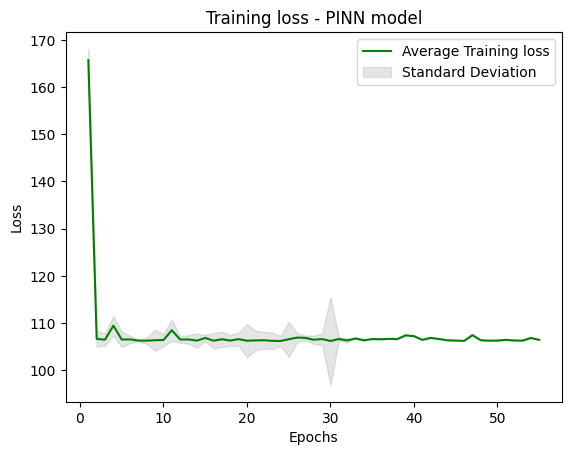

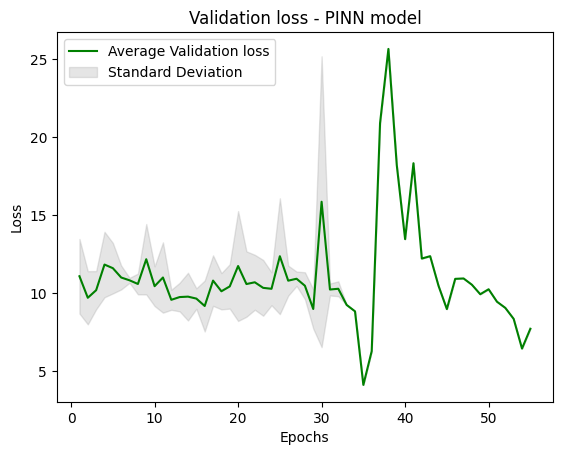

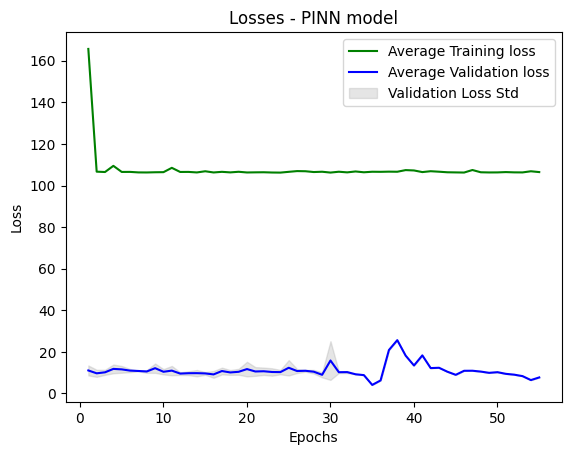

In [67]:
from itertools import zip_longest
import os

current_dir = os.getcwd()
results_dir = os.path.join(current_dir, 'PINN/wAccel/321632/In500_Out30/01/')
if not os.path.isdir(results_dir):
    os.makedirs(results_dir)

all_losses_training_in500_out30_321632_01 = np.array(all_losses_training_in500_out30_321632_01)
all_losses_validation_in500_out30_321632_01 = np.array(all_losses_validation_in500_out30_321632_01)

avg_loss_training = [np.mean([x[i] for x in all_losses_training_in500_out30_321632_01 if len(x) > i]) for i in range(len(max(all_losses_training_in500_out30_321632_01,key=len)))]
std_loss_training = np.nan_to_num(np.nanstd(np.array(list(zip_longest(*all_losses_training_in500_out30_321632_01)),dtype=float),axis=1,ddof=1), copy=False)

avg_loss_validation = [np.mean([x[i] for x in all_losses_validation_in500_out30_321632_01 if len(x) > i]) for i in range(len(max(all_losses_validation_in500_out30_321632_01,key=len)))]
std_loss_validation = np.nan_to_num(np.nanstd(np.array(list(zip_longest(*all_losses_validation_in500_out30_321632_01)),dtype=float),axis=1,ddof=1), copy=False)

# Plot the average losses with shaded standard deviation
#create vector of 1 to length of avg_loss_training for x-axis
epochNrs = np.arange(1, len(avg_loss_training)+1, 1)
plt.plot(epochNrs, avg_loss_training, 'g', label='Average Training loss')
plt.fill_between(epochNrs, avg_loss_training - std_loss_validation, avg_loss_training + std_loss_validation, color='gray', alpha=0.2, label='Standard Deviation')
plt.title('Training loss - PINN model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig(results_dir + 'pinn-training-loss-321632.pdf')  
plt.show()

epochNrs = np.arange(1, len(avg_loss_validation)+1, 1)
plt.plot(epochNrs, avg_loss_validation, 'g', label='Average Validation loss')
plt.fill_between(epochNrs, avg_loss_validation - std_loss_validation, avg_loss_validation + std_loss_validation, color='gray', alpha=0.2, label='Standard Deviation')
plt.title('Validation loss - PINN model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig(results_dir + 'pinn-validation-loss-321632.pdf')  
plt.show()

epochNrs = np.arange(1, len(avg_loss_validation)+1, 1)
plt.plot(epochNrs, avg_loss_training, 'g', label='Average Training loss')
plt.plot(epochNrs, avg_loss_validation, 'b', label='Average Validation loss')
plt.fill_between(epochNrs, avg_loss_validation - std_loss_validation, avg_loss_validation + std_loss_validation, color='gray', alpha=0.2, label='Validation Loss Std')
plt.title('Losses - PINN model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig(results_dir + 'dense-allLosses-321632.pdf')  
plt.show()

(32, 500, 10)
(32, 30, 10)
(3504, 30, 10)


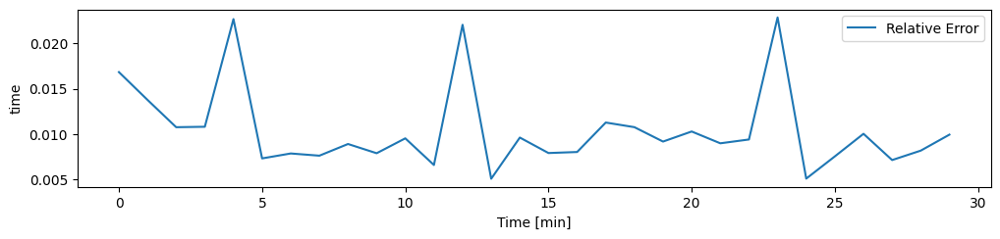

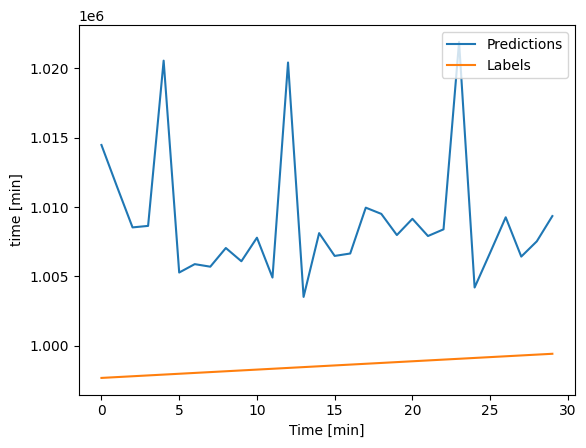

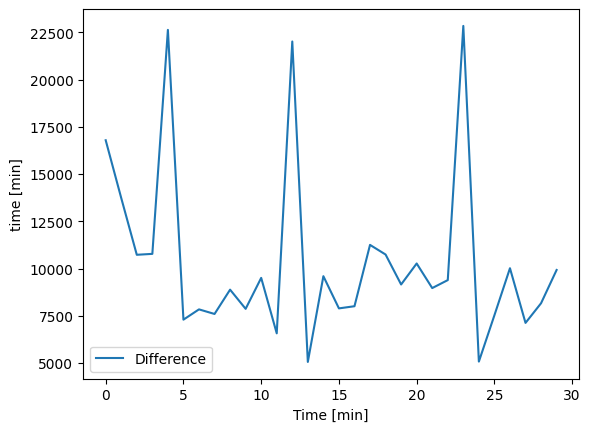

(32, 500, 10)
(32, 30, 10)
(3504, 30, 10)


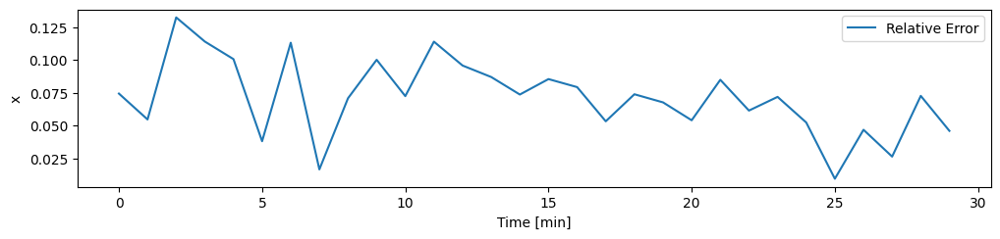

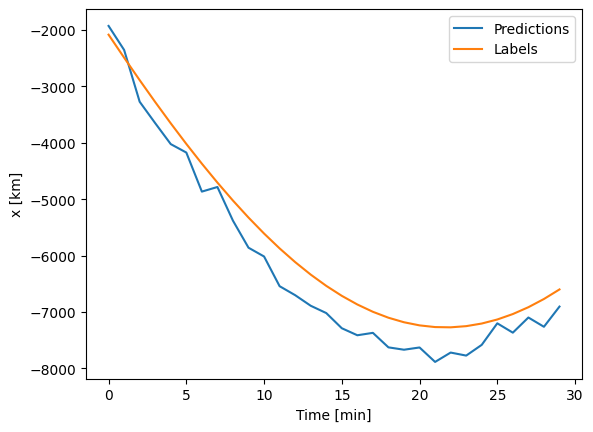

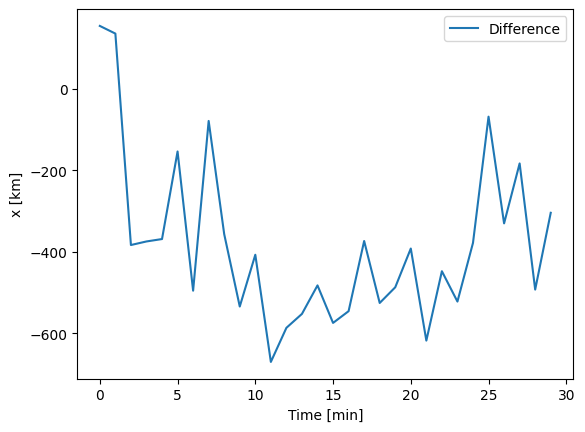

(32, 500, 10)
(32, 30, 10)
(3504, 30, 10)


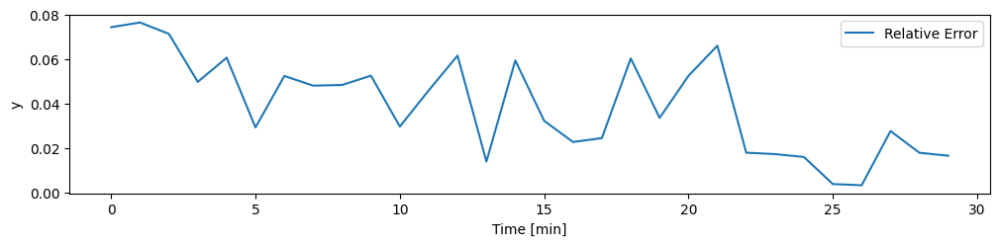

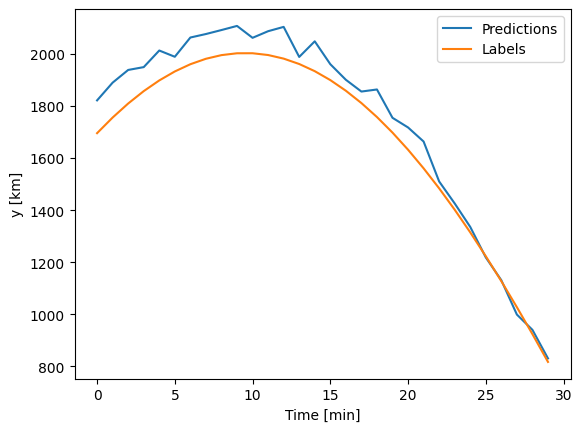

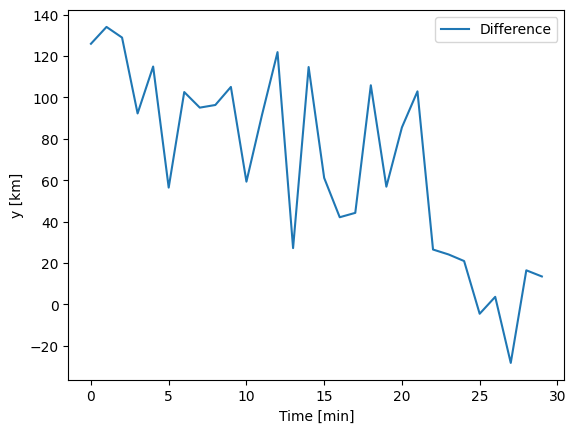

(32, 500, 10)
(32, 30, 10)
(3504, 30, 10)


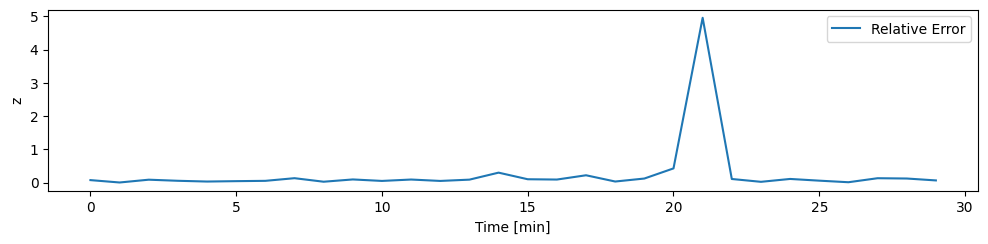

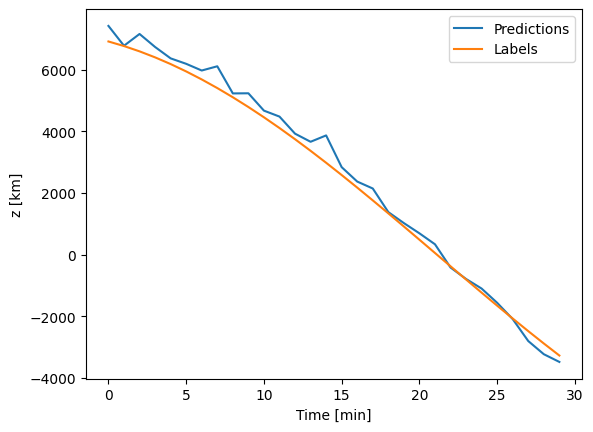

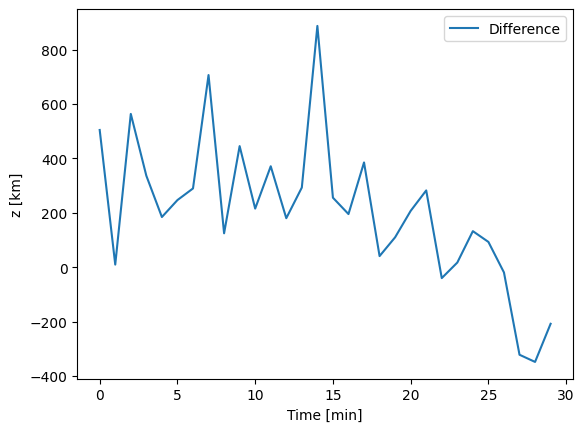

(32, 500, 10)
(32, 30, 10)
(3504, 30, 10)


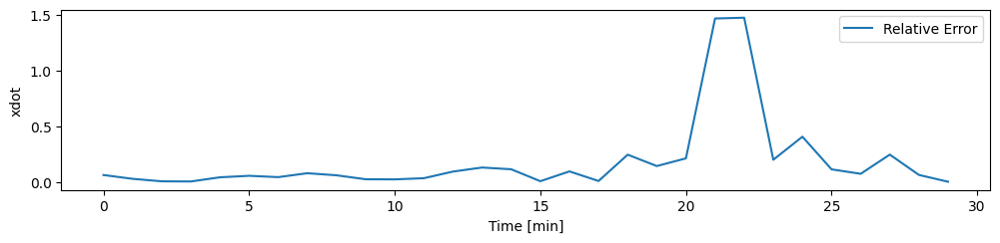

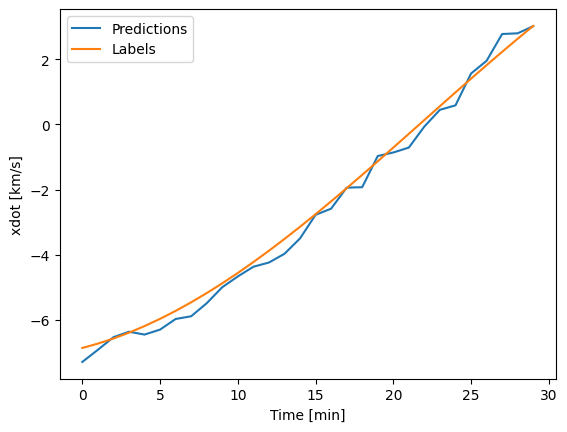

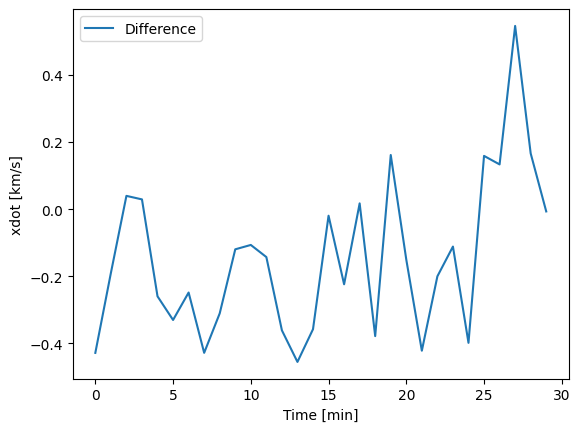

(32, 500, 10)
(32, 30, 10)
(3504, 30, 10)


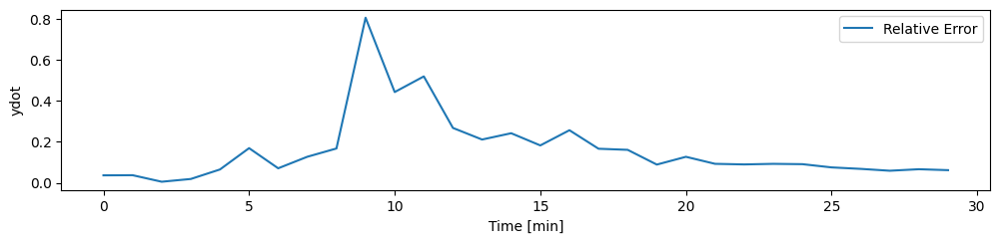

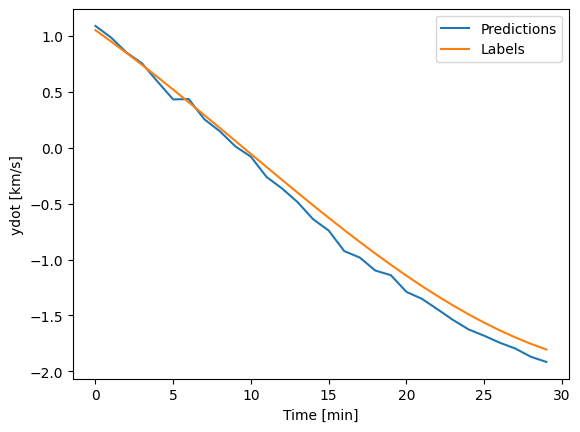

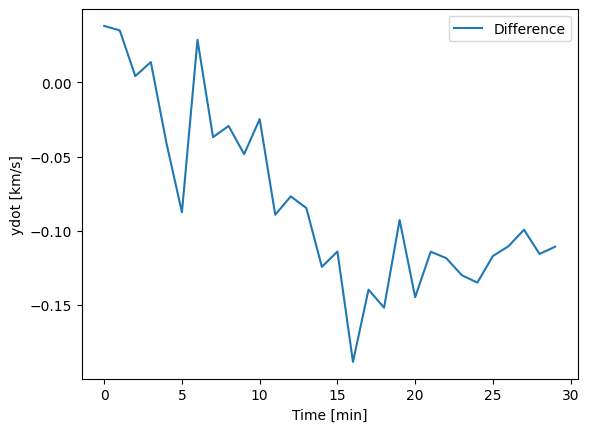

(32, 500, 10)
(32, 30, 10)
(3504, 30, 10)


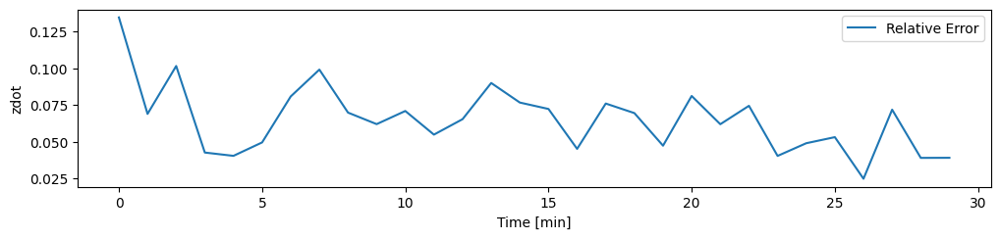

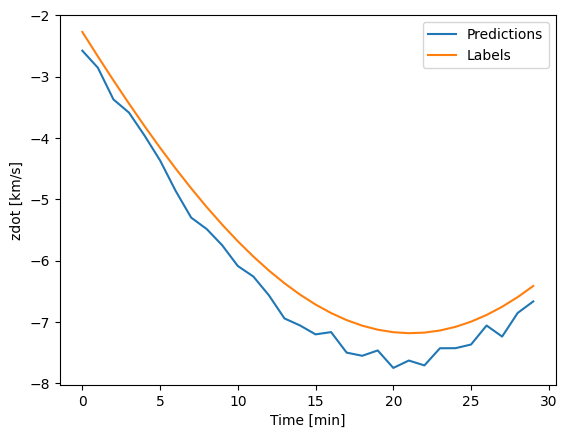

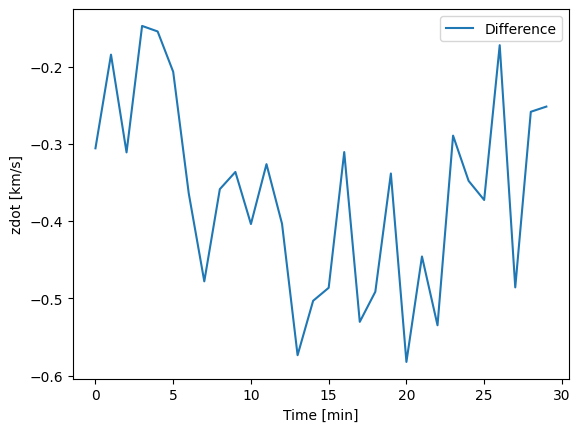

(32, 500, 10)
(32, 30, 10)
(3504, 30, 10)


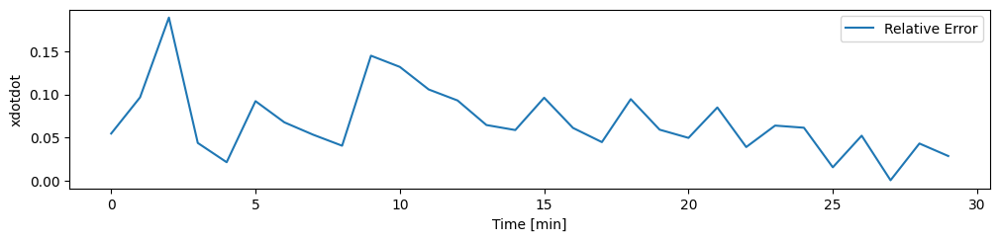

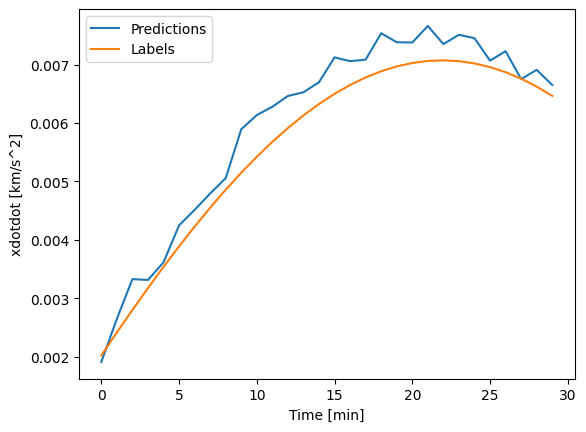

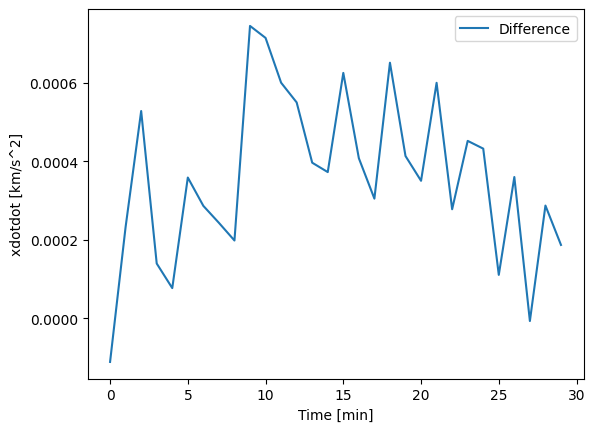

(32, 500, 10)
(32, 30, 10)
(3504, 30, 10)


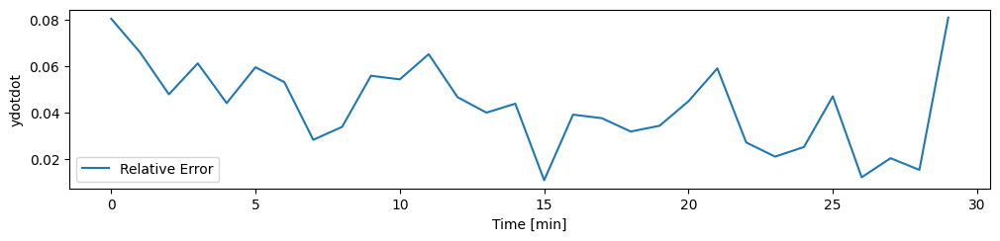

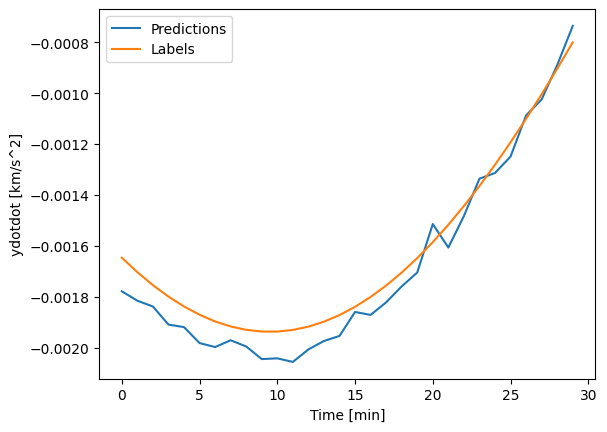

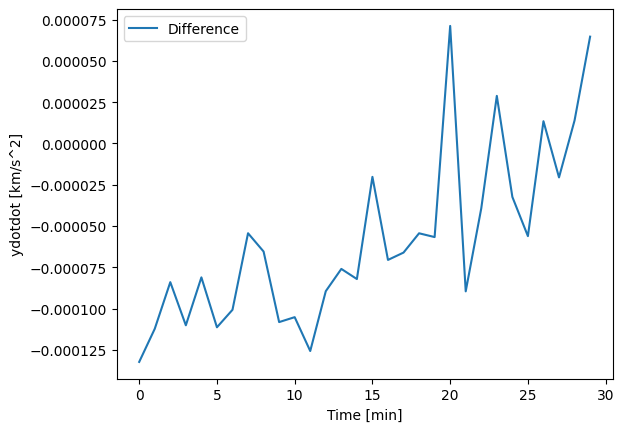

(32, 500, 10)
(32, 30, 10)
(3504, 30, 10)


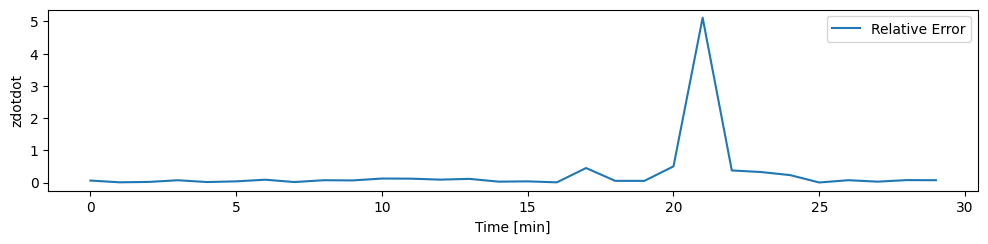

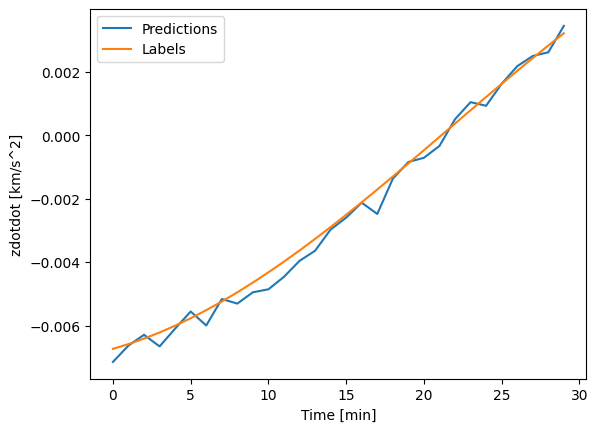

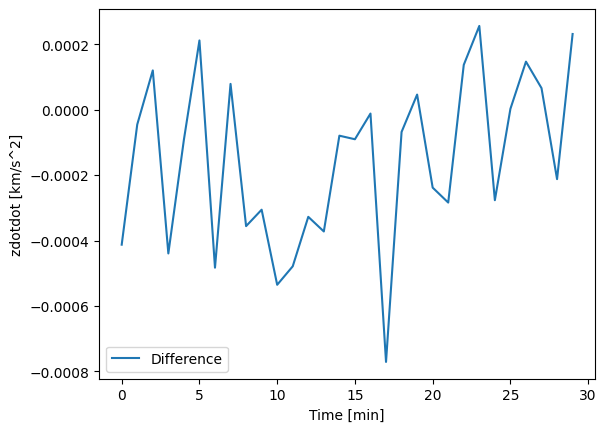

Mean Errors: 
X:  399.1412048339844
Y:  70.09541320800781
Z:  267.30926513671875
XDOT:  0.23006172478199005
YDOT:  0.0881798043847084
ZDOT:  0.3651684820652008
XDOTDOT:  0.0003671862941700965
YDOTDOT:  7.117462519090623e-05
ZDOTDOT:  0.0002392119640717283


In [68]:
import IPython
import IPython.display
import os

#plot the difference between the real and the predicted values with the column as a parameter
def plot_diff_Dense(model, window, max_subplots=1, column=0, plot_col = "x", plot_units = "[km]"):
    
    #window.test?
    # print(window.test)
    inputs, labels = next(iter(window.test))
    
    inputs = inputs.numpy()
    labels = labels.numpy()
    predictions, physicalOutputs = model.predict(window.test)
    
    inputs = inputs * train_std_Dense[column] + train_mean_Dense[column]
    labels = labels * train_std_Dense[column] + train_mean_Dense[column]
    predictions  = predictions * train_std_Dense[column] + train_mean_Dense[column]
    
    print(inputs.shape)
    print(labels.shape)
    print(predictions.shape)

    plt.figure(figsize=(12, 8))
    max_n = min(max_subplots, len(inputs))


    for n in range(max_n):
            plt.subplot(3, 1, n+1)

            #fazer legendas diferentes para as velocidades
            plt.ylabel(plot_col)
            plt.plot(np.abs((predictions[n, :, column] - labels[n, :, column])/ labels[n, :, column]) ,label='Relative Error')
            plt.xlabel('Time [min]')
            plt.legend()
            plt.savefig(results_dir + 'pinn-training-relativeError-321632-' + plot_col + '.pdf')  
            plt.show()

            plt.ylabel(plot_col + ' ' + plot_units)
            plt.plot(predictions[n, :, column] ,label='Predictions')
            plt.plot(labels[n, :, column] ,label='Labels')
            plt.xlabel('Time [min]')
            plt.legend()
            plt.savefig(results_dir + 'pinn-training-PredictionsVSLabels-321632-' + plot_col + '.pdf')  
            plt.show()

            plt.ylabel(plot_col + ' ' + plot_units)
            plt.plot((predictions[n, :, column] - labels[n, :, column]) ,label='Difference')
            plt.xlabel('Time [min]')
            plt.legend()
            plt.savefig(results_dir + 'pinn-training-Difference-321632-' + plot_col + '.pdf')  
            plt.show()

plot_diff_Dense(modelTest_noInitialState_in500_out30_321632_01, multi_window_Dense, column=0, plot_col = "time", plot_units = "[min]")
plot_diff_Dense(modelTest_noInitialState_in500_out30_321632_01, multi_window_Dense, column=1, plot_col = "x", plot_units = "[km]")
plot_diff_Dense(modelTest_noInitialState_in500_out30_321632_01, multi_window_Dense, column=2, plot_col = "y", plot_units = "[km]")
plot_diff_Dense(modelTest_noInitialState_in500_out30_321632_01, multi_window_Dense, column=3, plot_col = "z", plot_units = "[km]")
plot_diff_Dense(modelTest_noInitialState_in500_out30_321632_01, multi_window_Dense, column=4, plot_col = "xdot", plot_units = "[km/s]")
plot_diff_Dense(modelTest_noInitialState_in500_out30_321632_01, multi_window_Dense, column=5, plot_col = "ydot", plot_units = "[km/s]")
plot_diff_Dense(modelTest_noInitialState_in500_out30_321632_01, multi_window_Dense, column=6, plot_col = "zdot", plot_units = "[km/s]")
plot_diff_Dense(modelTest_noInitialState_in500_out30_321632_01, multi_window_Dense, column=7, plot_col = "xdotdot", plot_units = "[km/s^2]")
plot_diff_Dense(modelTest_noInitialState_in500_out30_321632_01, multi_window_Dense, column=8, plot_col = "ydotdot", plot_units = "[km/s^2]")
plot_diff_Dense(modelTest_noInitialState_in500_out30_321632_01, multi_window_Dense, column=9, plot_col = "zdotdot", plot_units = "[km/s^2]")



#calculate the mean absolute error for each column
def calculateMeanErrors(model, window, max_subplots=1, column=0):
    
    #repeat this for 10 trials and calculate the mean error
    meanError = 0
    nrTrials = 7
    for i in range(nrTrials):
        inputs, labels = next(iter(window.test))
        inputs = inputs.numpy()
        labels = labels.numpy()
        predictions, physicalOutputs = model.predict(window.test)
        
        inputs = inputs * train_std_Dense[column] + train_mean_Dense[column]
        labels = labels * train_std_Dense[column] + train_mean_Dense[column]
        predictions  = predictions * train_std_Dense[column] + train_mean_Dense[column]
        
        meanError += np.mean(np.abs(predictions[0, :, column] - labels[0, :, column]))
    meanError = meanError/nrTrials
    return meanError


    # inputs, labels = next(iter(window.test))
    
    # inputs = inputs.numpy()
    # labels = labels.numpy()
    # predictions, physicalOutputs = model.predict(window.test)
    
    # inputs = inputs * train_std_Dense[column] + train_mean_Dense[column]
    # labels = labels * train_std_Dense[column] + train_mean_Dense[column]
    # predictions  = predictions * train_std_Dense[column] + train_mean_Dense[column]
    
    
    # meanError = np.mean(np.abs(predictions[0, :, column] - labels[0, :, column]))
    # return meanError
    
    
meanErrorX = calculateMeanErrors(modelTest_noInitialState_in500_out30_321632_01, multi_window_Dense, column=1)
meanErrorY = calculateMeanErrors(modelTest_noInitialState_in500_out30_321632_01, multi_window_Dense, column=2)
meanErrorZ = calculateMeanErrors(modelTest_noInitialState_in500_out30_321632_01, multi_window_Dense, column=3)
meanErrorXDOT = calculateMeanErrors(modelTest_noInitialState_in500_out30_321632_01, multi_window_Dense, column=4)
meanErrorYDOT = calculateMeanErrors(modelTest_noInitialState_in500_out30_321632_01, multi_window_Dense, column=5)
meanErrorZDOT = calculateMeanErrors(modelTest_noInitialState_in500_out30_321632_01, multi_window_Dense, column=6)
meanErrorXDOTDOT = calculateMeanErrors(modelTest_noInitialState_in500_out30_321632_01, multi_window_Dense, column=7)
meanErrorYDOTDOT = calculateMeanErrors(modelTest_noInitialState_in500_out30_321632_01, multi_window_Dense, column=8)
meanErrorZDOTDOT = calculateMeanErrors(modelTest_noInitialState_in500_out30_321632_01, multi_window_Dense, column=9)


print("Mean Errors: ")
print("X: ", meanErrorX)
print("Y: ", meanErrorY)
print("Z: ", meanErrorZ)
print("XDOT: ", meanErrorXDOT)
print("YDOT: ", meanErrorYDOT)
print("ZDOT: ", meanErrorZDOT)
print("XDOTDOT: ", meanErrorXDOTDOT)
print("YDOTDOT: ", meanErrorYDOTDOT)
print("ZDOTDOT: ", meanErrorZDOTDOT)


### PINN (without initial state) IN 500 OUT 30, 32 8 32 DENSE

In [69]:
class PhysicsInformedNN_noInitialState():
    def __init__(self, windowData, windowDataValidation):
        # data
        self.windowData = windowData
        self.windowDataValidation = windowDataValidation
        
        self.allLossesTraining = []
        self.allLossesValidation = []

        self.u_net_LossesTraining = []
        self.u_net_LossesValidation = []

        self.f_net_LossesTraining = []
        self.f_net_LossesValidation = []
        
        self.early_stopping_patience = 20 
        self.best_validation_loss = float('inf')

        # deep neural networks
        self.dnn = tf.keras.Sequential([
            # Shape [batch, time, features] => [batch, features]
            tf.keras.layers.Lambda(lambda x: x[:, -INPUT_STEPS:, :]),
            # tf.keras.layers.Flatten(input_shape=(1440, num_features)),
            
            # tf.keras.layers.Flatten(input_shape=(1440, 1)),
            
            tf.keras.layers.Dense(32, activation='LeakyReLU'),
            tf.keras.layers.Dense(8, activation='LeakyReLU'),
            tf.keras.layers.Dense(32, activation='LeakyReLU'),

            tf.keras.layers.Flatten(),
            # Shape => [batch, out_steps*num_outputs]
            tf.keras.layers.Dense(OUT_STEPS*num_features_Dense, kernel_initializer=tf.keras.initializers.HeNormal()),
            # Shape => [batch, out_steps, num_outputs]
            tf.keras.layers.Reshape([OUT_STEPS, num_features_Dense])
        ])
        
        # optimizers: using the same settings
        self.optimizer = tf.optimizers.Adam()
        
        self.iter = 0
        
    def net_u(self, windowData):  
        #remove the time
        # # windowData = windowData[:, :, :-1]
        # time = windowData[:, :, 0:1]
        # initial_state = windowData[:, :, 1:]
        #tf.concat([time, initial_state], axis=-1)
        u = self.dnn(windowData)
        # u = self.dnn(windowData)
        return u
    
    def net_f(self, time, data):
        """ The TensorFlow version of calculating residual """

        #change data to variable
        time = tf.Variable(time, dtype=tf.float32)
        data = tf.Variable(data, dtype=tf.float32)


        x = data[:, :, 0]
        y = data[:, :, 1]
        z = data[:, :, 2]
        xdot = data[:, :, 3]
        ydot = data[:, :, 4]
        zdot = data[:, :, 5]
        xdotdot = data[:, :, 6]
        ydotdot = data[:, :, 7]
        zdotdot = data[:, :, 8]

        def calculate_velocity(positions, vel, t):
            with tf.GradientTape(persistent=True) as tape:
                tape.watch(t)
                output = (positions*t)/t # Perform computation involving positions tensor and time tensor
            
            velocity = tape.gradient(output, t)
            return velocity

        x_dot = calculate_velocity(x, xdot, time)
        y_dot = calculate_velocity(y, ydot, time)
        z_dot = calculate_velocity(z, zdot, time)
        x_dot_dot = calculate_velocity(x_dot, None, time)
        y_dot_dot = calculate_velocity(y_dot, None, time)
        z_dot_dot = calculate_velocity(z_dot, None, time)

        
        #call SINDy to get the equations
        # model = getSindyEquations(data[:, :, 1:], data[:, :, 0])

        #create a tuple with the residual for each axis
        res_px = x_dot - xdot
        res_py = y_dot - ydot
        res_pz = z_dot - zdot
        # standardGravitationalParameter = 3.986004418 * 10**(5), using standardized  
        r = tf.sqrt(x**2 + y**2 + z**2)
        res_vx = x_dot_dot + standardGravitationalParameter * x/(r**3) 
        res_vy = y_dot_dot + standardGravitationalParameter * y/(r**3) 
        res_vz = z_dot_dot + standardGravitationalParameter * z/(r**3) 

        res_accX = x_dot_dot - xdotdot
        res_accY = y_dot_dot - ydotdot
        res_accZ = z_dot_dot - zdotdot


        #concatenate the residuals into a single tensor
        res = tf.concat([res_px, res_py, res_pz, res_vx, res_vy, res_vz, res_accX, res_accY, res_accZ], axis=1)
        # res = tf.concat([res_px, res_py, res_pz, res_vx, res_vy, res_vz], axis=1)

        return res
    
    def loss_func(self, inputs, labels, isTraining = True):
        with tf.GradientTape() as tape:
            tape.watch(self.dnn.trainable_variables)
            
            #separate the time from the rest of the data
            timeAux = tf.Variable(inputs[:, :, 0])
            # initial_state = inputs[:, 0, 1:]
            # inputs = inputs[:, :, 1:]
            # u_pred = self.net_u(timeAux)
            u_pred = self.net_u(inputs)
            #limit timeAux for each batch to the shape of the output of the neural network
            timeAux = timeAux[:, 0:labels.shape[1]]

            f_pred = self.net_f(timeAux, u_pred)

            #remove the time from the labels
            # labels = labels[:, :, 1:]
            loss_u = tf.reduce_mean(tf.square(labels - u_pred))
            loss_f = tf.reduce_mean(tf.square(f_pred))

            weightLoss = 0.1
            loss = (weightLoss * loss_u) + ((1-weightLoss) * loss_f)
        
        gradients = tape.gradient(loss, self.dnn.trainable_variables)
        self.optimizer.apply_gradients(zip(gradients, self.dnn.trainable_variables))
        
        self.iter += 1

        # if isTraining:
        #     self.allLossesTraining.append(loss.numpy())
        #     self.u_net_LossesTraining.append(loss_u.numpy())
        #     self.f_net_LossesTraining.append(loss_f.numpy())
        # else:
        #     self.allLossesValidation.append(loss.numpy())
        #     self.u_net_LossesValidation.append(loss_u.numpy())
        #     self.f_net_LossesValidation.append(loss_f.numpy())

        if self.iter % 100 == 0:
            print(
                'Iter %d, Loss: %.5e, Loss_u: %.5e, Loss_f: %.5e' % (self.iter, loss.numpy(), loss_u.numpy(), loss_f.numpy())
            )
            
        return loss.numpy(), loss_u.numpy(), loss_f.numpy()

    def validate(self):
        self.dnn.trainable = False
        loss_Aux = np.array([])
        lossU_Aux = np.array([])
        lossF_Aux = np.array([])
        for example_inputs, example_labels in self.windowDataValidation:
            loss, lossU, lossF = self.loss_func(example_inputs, example_labels, isTraining=False)
            
            loss_Aux = np.append(loss_Aux, loss)
            lossU_Aux = np.append(lossU_Aux, lossU)
            lossF_Aux = np.append(lossF_Aux, lossF)


        self.allLossesValidation.append(np.mean(loss_Aux))
        self.u_net_LossesValidation.append(np.mean(lossU_Aux))
        self.f_net_LossesValidation.append(np.mean(lossF_Aux))
    
    def build(self, input_shape):
        self.dnn.build(input_shape)

    def train(self):
        for epoch in range(200):
            print('EPOCH %d' % (epoch))
            print((np.array(self.windowData)))
            loss_Aux = np.array([])
            lossU_Aux = np.array([])
            lossF_Aux = np.array([])

            self.dnn.trainable = True
            for n, (example_inputs, example_labels) in enumerate(self.windowData):
                loss, lossU, lossF = self.loss_func(example_inputs, example_labels, isTraining=True)
                
                #store intermediate losses and then make mean to get the epoch loss
                loss_Aux = np.append(loss_Aux, loss)
                lossU_Aux = np.append(lossU_Aux, lossU)
                lossF_Aux = np.append(lossF_Aux, lossF)
            
            #first value was returning nan for the physical loss
            for i in range(0, len(loss_Aux)):
                if np.isnan(loss_Aux[i]):
                    loss_Aux[i] = loss_Aux[i + 1]
                if np.isnan(lossF_Aux[i]):
                    lossF_Aux[i] = lossF_Aux[i + 1]
                if np.isnan(lossU_Aux[i]):
                    lossU_Aux[i] = lossU_Aux[i + 1]
            
            self.allLossesTraining.append(np.mean(loss_Aux))
            self.u_net_LossesTraining.append(np.mean(lossU_Aux))
            self.f_net_LossesTraining.append(np.mean(lossF_Aux))
           
            self.validate()
            
            # Check if the validation loss has improved
            if self.allLossesValidation[-1] < self.best_validation_loss:
                self.best_validation_loss = self.allLossesValidation[-1]
                self.early_stopping_counter = 0
            else:
                self.early_stopping_counter += 1

            # Stop training if the validation loss hasn't improved for the specified patience
            if self.early_stopping_counter >= self.early_stopping_patience:
                print(f"Early stopping at epoch {epoch}")
                break

        self.dnn.trainable = False
                
    # def predict(self, X):
    #     self.dnn.trainable = False
    #     u = self.net_u(X)
    #     #select the time from the input
    #     time = X[:, :, 0]
    #     #60 = output steps da window
    #     time = time[:, 0:OUT_STEPS]
    #     f = self.net_f(time, u)
    #     u = u.numpy()
    #     f = f.numpy()
    #     return u, f

    def predict(self, X):
        self.dnn.trainable = False
        outputsU = []
        outputsF = []
        for inputs, labels in X:
            #separate the time from the rest of the data
            timeAux = tf.Variable(inputs[:, :, 0])
            u = self.net_u(inputs)
            time = timeAux[:, 0:OUT_STEPS]
            f = self.net_f(time, u)
            outputsU.append(u.numpy())
            outputsF.append(f.numpy())

        return np.concatenate(outputsU, axis=0), np.concatenate(outputsF, axis=0)

    def run_trial(self):
        self.allLossesTraining = []
        self.allLossesValidation = []
        self.best_validation_loss = float('inf')
        self.early_stopping_counter = 0
        self.build((32, INPUT_STEPS, 10))
        self.train()
        return self.allLossesTraining, self.allLossesValidation

    def plot_losses(self, graphics = "allLosses"):
        
        # allLossesTraining
        # u_net_LossesTraining
        # f_net_LossesTraining

        # allLossesValidation
        # u_net_LossesValidation
        # f_net_LossesValidation

        if graphics == "f_losses":
            plt.yscale('log')
            plt.plot(self.f_net_LossesTraining, label='Training Loss')
            plt.plot(self.f_net_LossesValidation, label='Validation Loss')
            plt.xlabel('Epoch')
            plt.ylabel('Loss')
            plt.title('Training and Validation Physical Loss')
            plt.legend()
            plt.show()
        elif graphics == "u_losses":
            plt.yscale('log')
            plt.plot(self.u_net_LossesTraining, label='Training Loss')
            plt.plot(self.u_net_LossesValidation, label='Validation Loss')
            plt.xlabel('Epoch')
            plt.ylabel('Loss')
            plt.title('Training and Validation Data Loss')
            plt.legend()
            plt.show()
        else:
            plt.yscale('log')
            plt.plot(self.allLossesTraining, label='Training Loss')
            plt.plot(self.allLossesValidation, label='Validation Loss')
            plt.xlabel('Epoch')
            plt.ylabel('Loss')
            plt.title('Training and Validation Total Loss')
            plt.legend()
            plt.show()

modelTest_noInitialState_in500_out30_32832_01 = PhysicsInformedNN_noInitialState(multi_window_Dense.train, multi_window_Dense.val)
#build the model
#subtract one from the shape because the time is not an input
# modelTest.build(multi_window.example[0].shape)
# modelTest_noInitialState.build((32, INPUT_STEPS, 7))
# modelTest_noInitialState.train()


nrOfRuns = 4
all_losses_training_in500_out30_32832_01 = []
all_losses_validation_in500_out30_32832_01 = []
for _ in range(nrOfRuns):
    losses_training, losses_validation = modelTest_noInitialState_in500_out30_32832_01.run_trial()
    all_losses_training_in500_out30_32832_01.append(losses_training)
    all_losses_validation_in500_out30_32832_01.append(losses_validation)

EPOCH 0
<MapDataset element_spec=(TensorSpec(shape=(None, 500, 10), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 10), dtype=tf.float32, name=None))>
Iter 100, Loss: 1.27292e+02, Loss_u: 2.04174e-04, Loss_f: 1.41436e+02
Iter 200, Loss: 2.32334e+02, Loss_u: 8.42252e-05, Loss_f: 2.58149e+02
Iter 300, Loss: 6.73477e+01, Loss_u: 1.56536e-04, Loss_f: 7.48308e+01
Iter 400, Loss: 1.17188e+01, Loss_u: 1.40940e-01, Loss_f: 1.30052e+01
EPOCH 1
<MapDataset element_spec=(TensorSpec(shape=(None, 500, 10), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 10), dtype=tf.float32, name=None))>
Iter 500, Loss: 6.08857e+01, Loss_u: 7.04471e-03, Loss_f: 6.76500e+01
Iter 600, Loss: 1.71040e+02, Loss_u: 4.65407e-05, Loss_f: 1.90044e+02
Iter 700, Loss: 1.83480e+02, Loss_u: 3.85940e-05, Loss_f: 2.03866e+02
Iter 800, Loss: 4.58120e+01, Loss_u: 3.57557e-05, Loss_f: 5.09023e+01
Iter 900, Loss: 9.51169e+00, Loss_u: 3.43175e-02, Loss_f: 1.05647e+01
EPOCH 2
<MapDataset element_spec=(TensorSpec(s

C:\Users\jpfun\AppData\Local\Temp\ipykernel_50240\1731583738.py:9: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  all_losses_training_in500_out30_32832_01 = np.array(all_losses_training_in500_out30_32832_01)
C:\Users\jpfun\AppData\Local\Temp\ipykernel_50240\1731583738.py:10: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  all_losses_validation_in500_out30_32832_01 = np.array(all_losses_validation_in500_out30_32832_01)
c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\numpy\lib\nanfunctions.py:1670: RuntimeWarning: Degrees of f

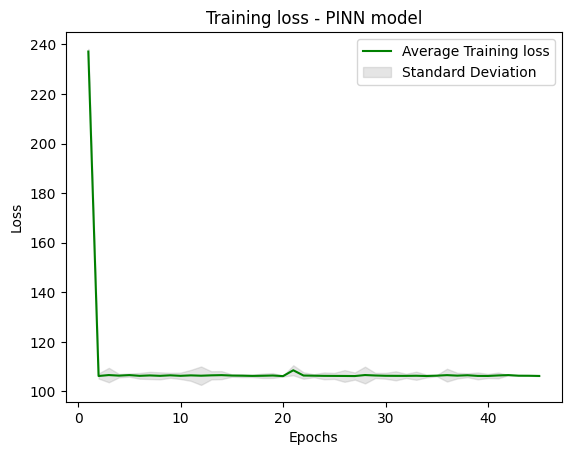

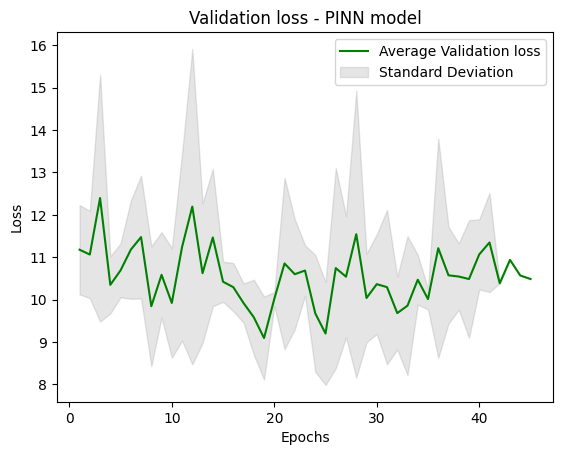

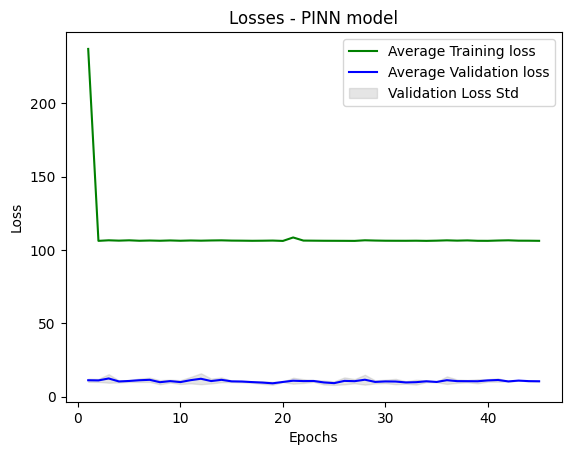

In [70]:
from itertools import zip_longest
import os

current_dir = os.getcwd()
results_dir = os.path.join(current_dir, 'PINN/wAccel/32832/In500_Out30/01/')
if not os.path.isdir(results_dir):
    os.makedirs(results_dir)

all_losses_training_in500_out30_32832_01 = np.array(all_losses_training_in500_out30_32832_01)
all_losses_validation_in500_out30_32832_01 = np.array(all_losses_validation_in500_out30_32832_01)

avg_loss_training = [np.mean([x[i] for x in all_losses_training_in500_out30_32832_01 if len(x) > i]) for i in range(len(max(all_losses_training_in500_out30_32832_01,key=len)))]
std_loss_training = np.nan_to_num(np.nanstd(np.array(list(zip_longest(*all_losses_training_in500_out30_32832_01)),dtype=float),axis=1,ddof=1), copy=False)

avg_loss_validation = [np.mean([x[i] for x in all_losses_validation_in500_out30_32832_01 if len(x) > i]) for i in range(len(max(all_losses_validation_in500_out30_32832_01,key=len)))]
std_loss_validation = np.nan_to_num(np.nanstd(np.array(list(zip_longest(*all_losses_validation_in500_out30_32832_01)),dtype=float),axis=1,ddof=1), copy=False)

# Plot the average losses with shaded standard deviation
#create vector of 1 to length of avg_loss_training for x-axis
epochNrs = np.arange(1, len(avg_loss_training)+1, 1)
plt.plot(epochNrs, avg_loss_training, 'g', label='Average Training loss')
plt.fill_between(epochNrs, avg_loss_training - std_loss_validation, avg_loss_training + std_loss_validation, color='gray', alpha=0.2, label='Standard Deviation')
plt.title('Training loss - PINN model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig(results_dir + 'pinn-training-loss-32832.pdf')  
plt.show()

epochNrs = np.arange(1, len(avg_loss_validation)+1, 1)
plt.plot(epochNrs, avg_loss_validation, 'g', label='Average Validation loss')
plt.fill_between(epochNrs, avg_loss_validation - std_loss_validation, avg_loss_validation + std_loss_validation, color='gray', alpha=0.2, label='Standard Deviation')
plt.title('Validation loss - PINN model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig(results_dir + 'pinn-validation-loss-32832.pdf')  
plt.show()

epochNrs = np.arange(1, len(avg_loss_validation)+1, 1)
plt.plot(epochNrs, avg_loss_training, 'g', label='Average Training loss')
plt.plot(epochNrs, avg_loss_validation, 'b', label='Average Validation loss')
plt.fill_between(epochNrs, avg_loss_validation - std_loss_validation, avg_loss_validation + std_loss_validation, color='gray', alpha=0.2, label='Validation Loss Std')
plt.title('Losses - PINN model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig(results_dir + 'dense-allLosses-32832.pdf')  
plt.show()

(32, 500, 10)
(32, 30, 10)
(3504, 30, 10)


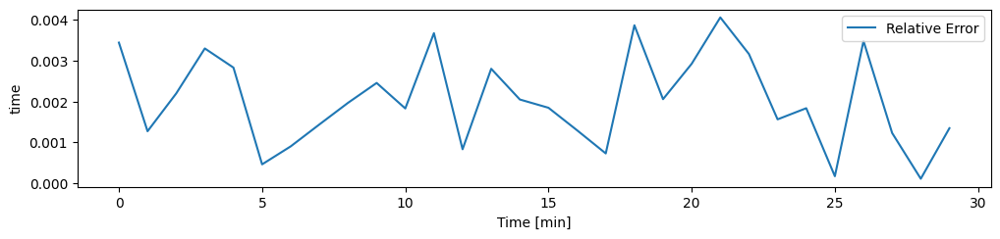

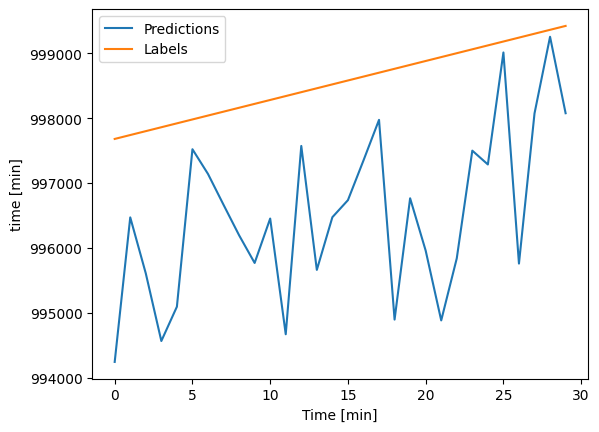

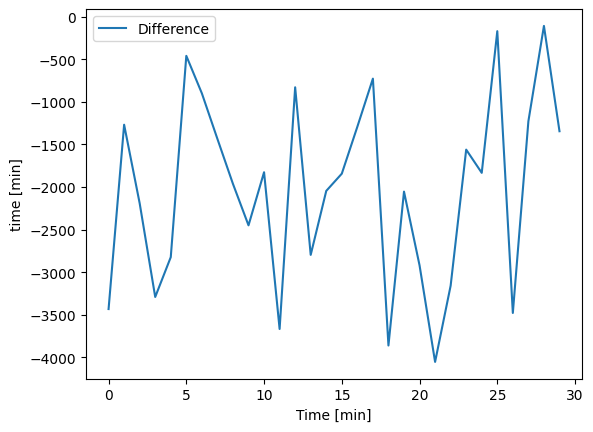

(32, 500, 10)
(32, 30, 10)
(3504, 30, 10)


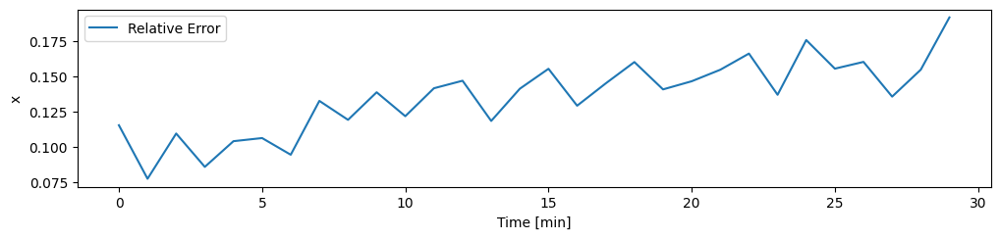

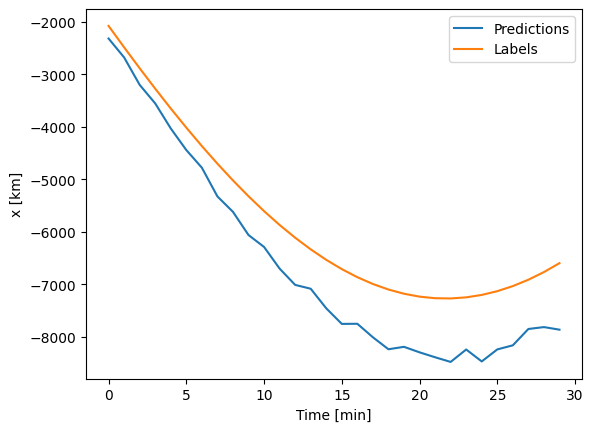

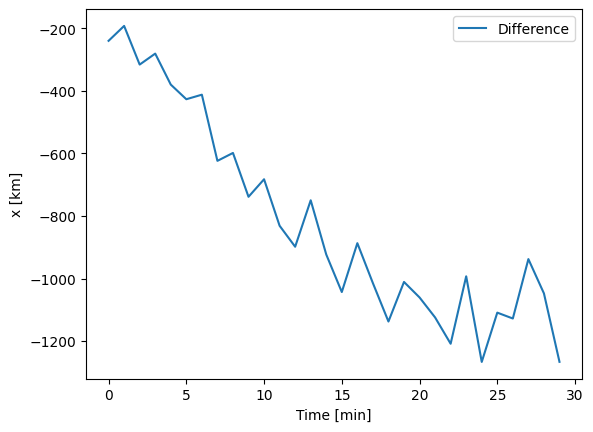

(32, 500, 10)
(32, 30, 10)
(3504, 30, 10)


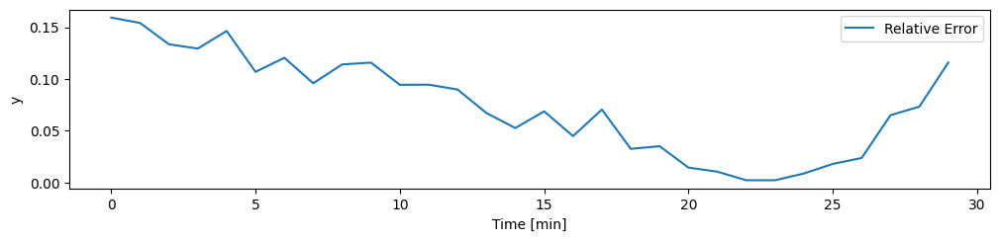

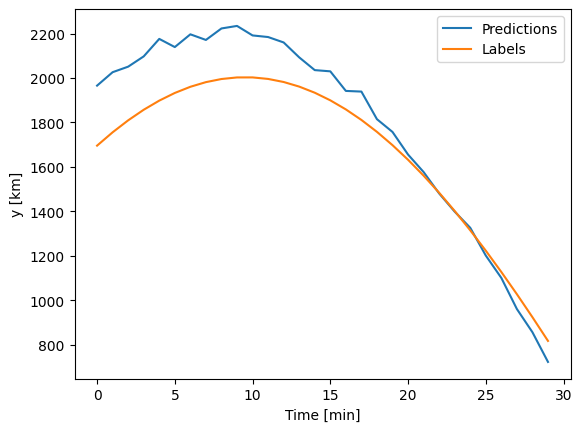

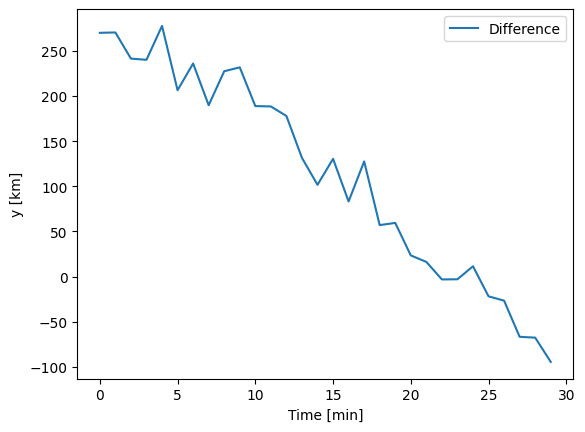

(32, 500, 10)
(32, 30, 10)
(3504, 30, 10)


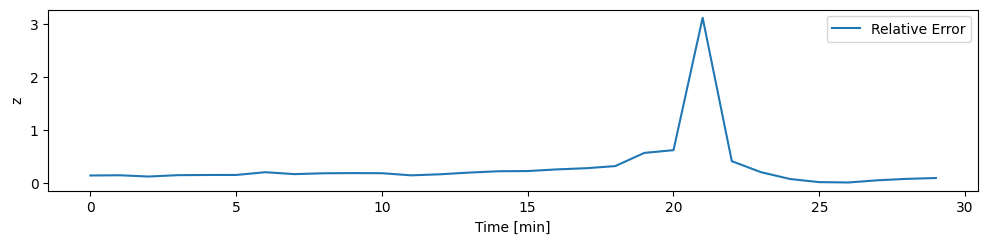

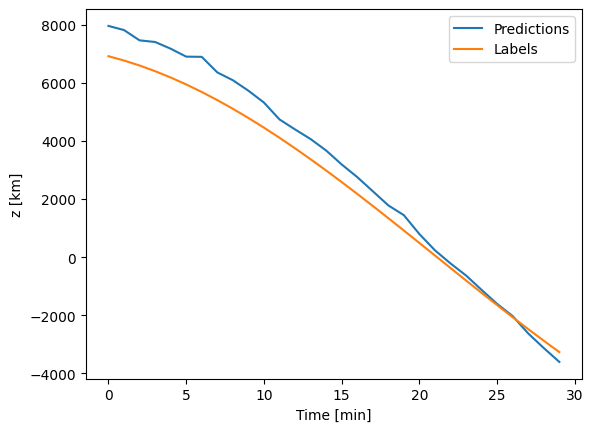

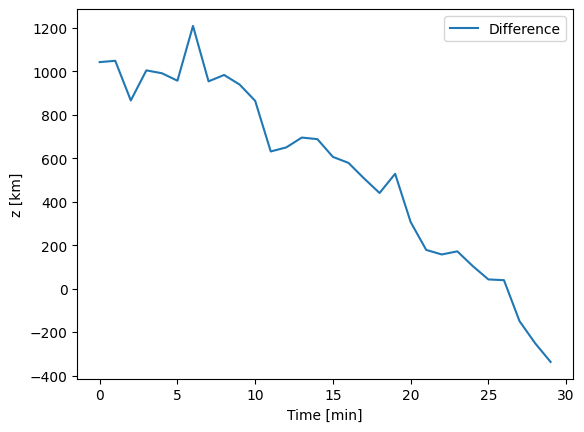

(32, 500, 10)
(32, 30, 10)
(3504, 30, 10)


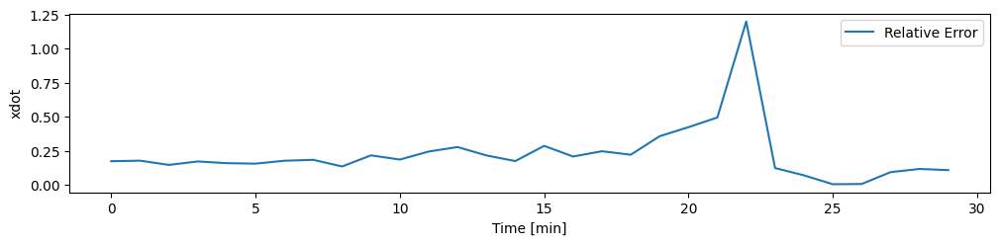

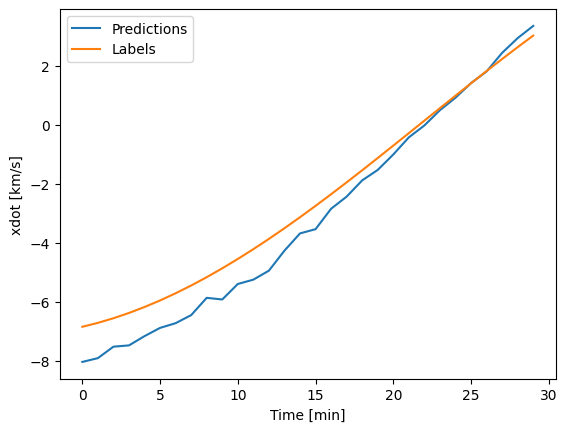

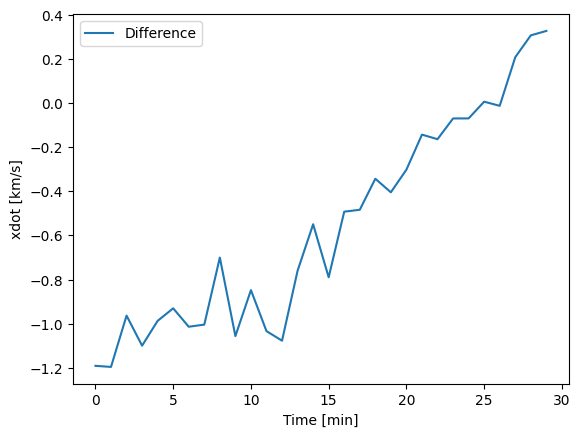

(32, 500, 10)
(32, 30, 10)
(3504, 30, 10)


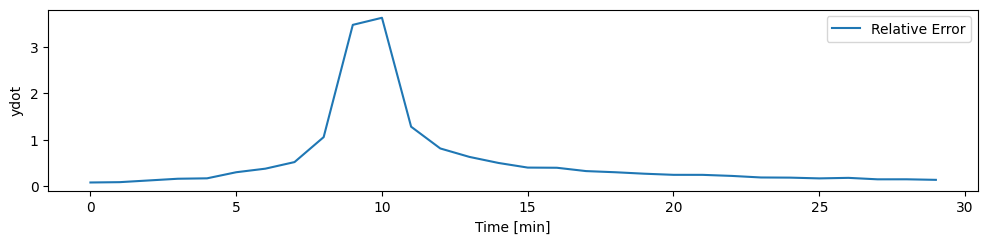

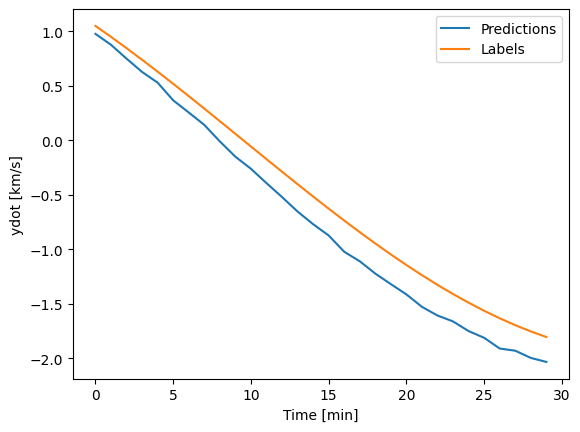

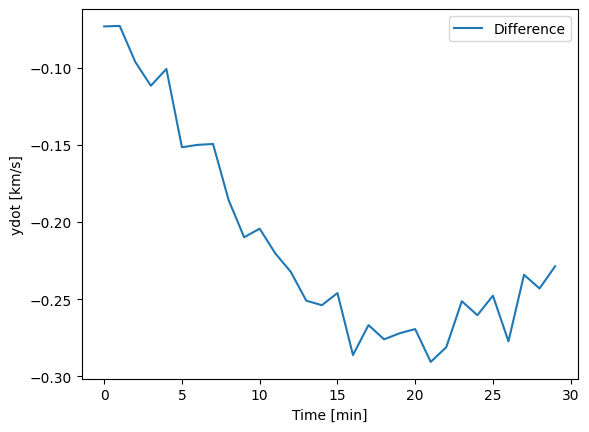

(32, 500, 10)
(32, 30, 10)
(3504, 30, 10)


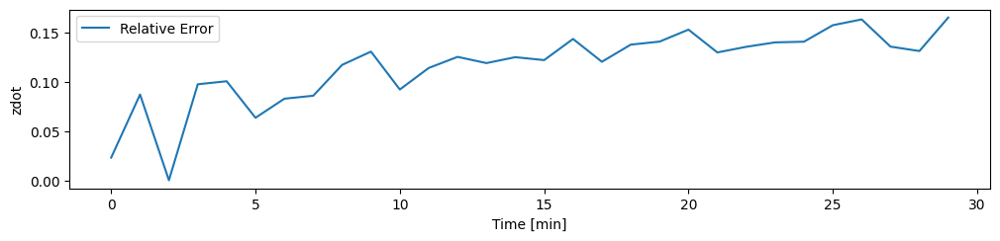

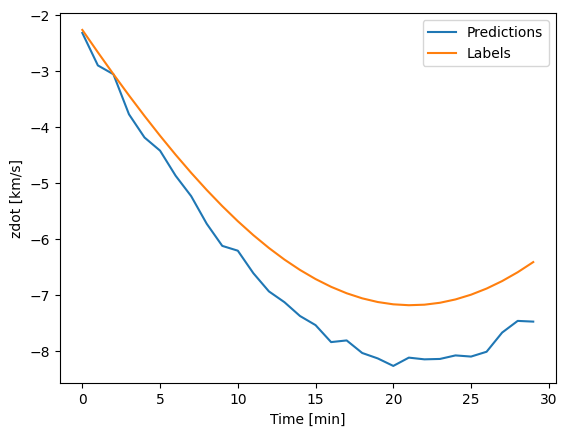

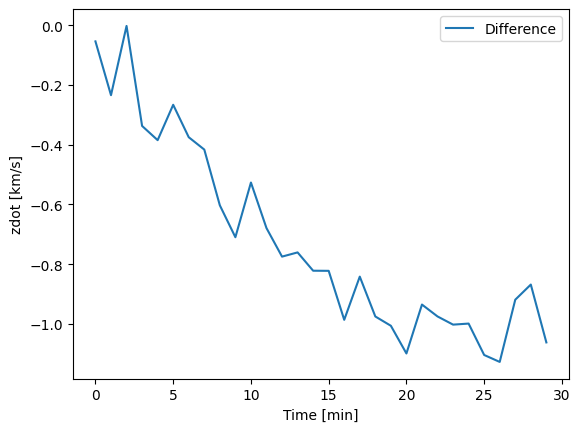

(32, 500, 10)
(32, 30, 10)
(3504, 30, 10)


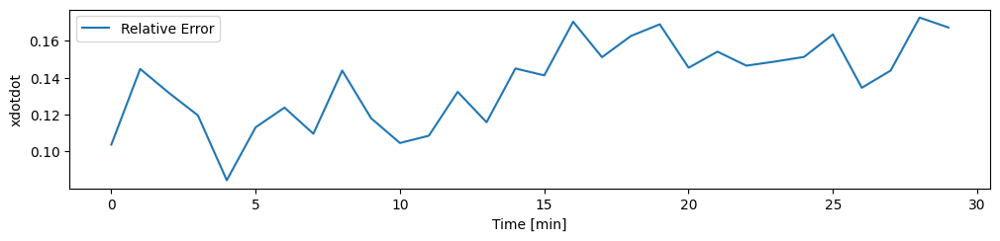

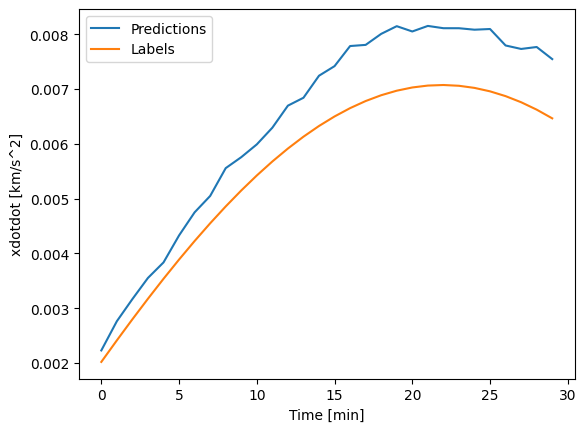

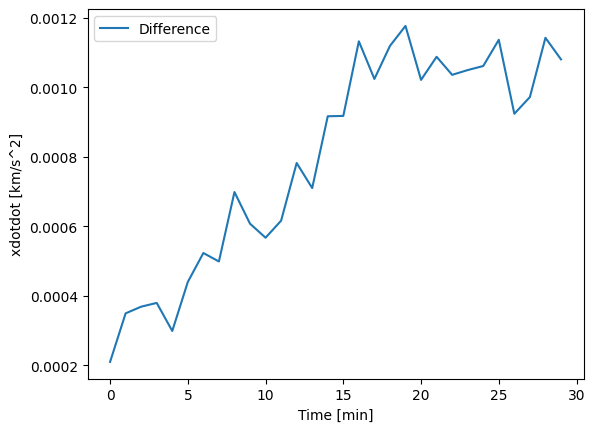

(32, 500, 10)
(32, 30, 10)
(3504, 30, 10)


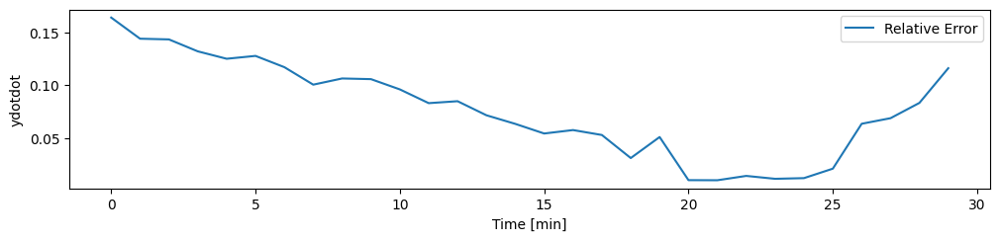

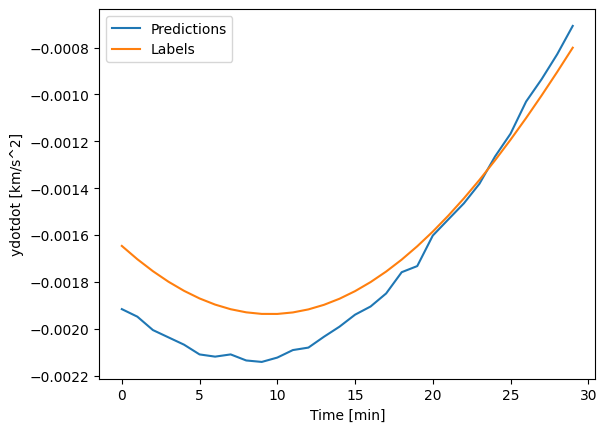

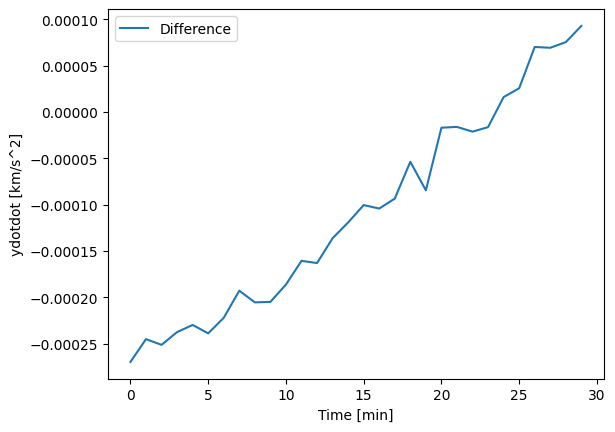

(32, 500, 10)
(32, 30, 10)
(3504, 30, 10)


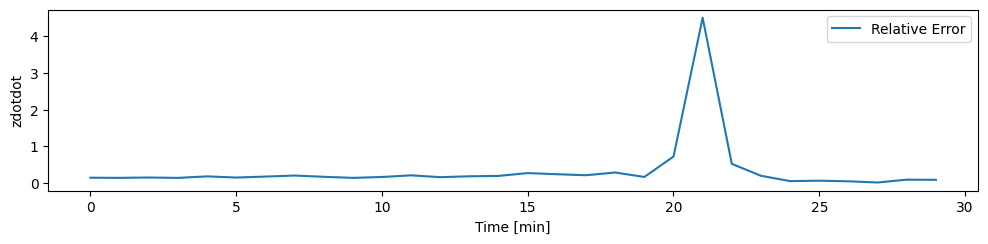

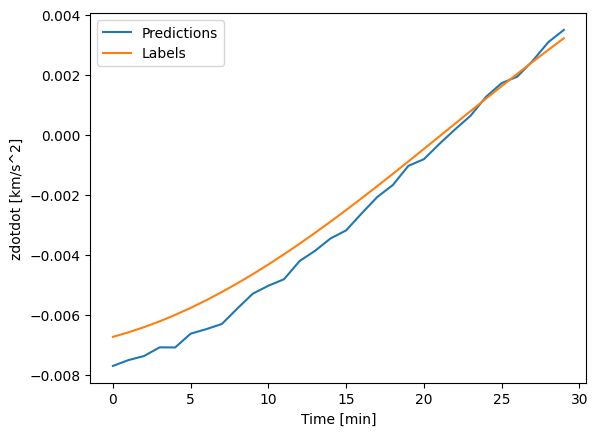

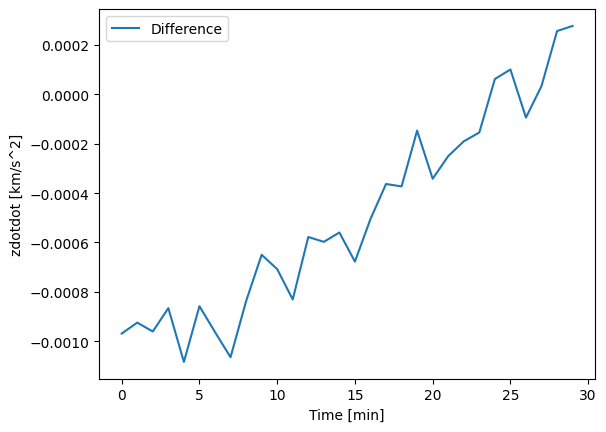

Mean Errors: 
X:  817.5956420898438
Y:  132.449951171875
Z:  597.4647216796875
XDOT:  0.6178503036499023
YDOT:  0.21310237050056458
ZDOT:  0.7223176956176758
XDOTDOT:  0.0007951902807690203
YDOTDOT:  0.00013065640814602375
ZDOTDOT:  0.000542661000508815


In [71]:
import IPython
import IPython.display
import os

#plot the difference between the real and the predicted values with the column as a parameter
def plot_diff_Dense(model, window, max_subplots=1, column=0, plot_col = "x", plot_units = "[km]"):
    
    #window.test?
    # print(window.test)
    inputs, labels = next(iter(window.test))
    
    inputs = inputs.numpy()
    labels = labels.numpy()
    predictions, physicalOutputs = model.predict(window.test)
    
    inputs = inputs * train_std_Dense[column] + train_mean_Dense[column]
    labels = labels * train_std_Dense[column] + train_mean_Dense[column]
    predictions  = predictions * train_std_Dense[column] + train_mean_Dense[column]
    
    print(inputs.shape)
    print(labels.shape)
    print(predictions.shape)

    plt.figure(figsize=(12, 8))
    max_n = min(max_subplots, len(inputs))


    for n in range(max_n):
            plt.subplot(3, 1, n+1)

            #fazer legendas diferentes para as velocidades
            plt.ylabel(plot_col)
            plt.plot(np.abs((predictions[n, :, column] - labels[n, :, column])/ labels[n, :, column]) ,label='Relative Error')
            plt.xlabel('Time [min]')
            plt.legend()
            plt.savefig(results_dir + 'pinn-training-relativeError-32832-' + plot_col + '.pdf')  
            plt.show()

            plt.ylabel(plot_col + ' ' + plot_units)
            plt.plot(predictions[n, :, column] ,label='Predictions')
            plt.plot(labels[n, :, column] ,label='Labels')
            plt.xlabel('Time [min]')
            plt.legend()
            plt.savefig(results_dir + 'pinn-training-PredictionsVSLabels-32832-' + plot_col + '.pdf')  
            plt.show()

            plt.ylabel(plot_col + ' ' + plot_units)
            plt.plot((predictions[n, :, column] - labels[n, :, column]) ,label='Difference')
            plt.xlabel('Time [min]')
            plt.legend()
            plt.savefig(results_dir + 'pinn-training-Difference-32832-' + plot_col + '.pdf')  
            plt.show()

plot_diff_Dense(modelTest_noInitialState_in500_out30_32832_01, multi_window_Dense, column=0, plot_col = "time", plot_units = "[min]")
plot_diff_Dense(modelTest_noInitialState_in500_out30_32832_01, multi_window_Dense, column=1, plot_col = "x", plot_units = "[km]")
plot_diff_Dense(modelTest_noInitialState_in500_out30_32832_01, multi_window_Dense, column=2, plot_col = "y", plot_units = "[km]")
plot_diff_Dense(modelTest_noInitialState_in500_out30_32832_01, multi_window_Dense, column=3, plot_col = "z", plot_units = "[km]")
plot_diff_Dense(modelTest_noInitialState_in500_out30_32832_01, multi_window_Dense, column=4, plot_col = "xdot", plot_units = "[km/s]")
plot_diff_Dense(modelTest_noInitialState_in500_out30_32832_01, multi_window_Dense, column=5, plot_col = "ydot", plot_units = "[km/s]")
plot_diff_Dense(modelTest_noInitialState_in500_out30_32832_01, multi_window_Dense, column=6, plot_col = "zdot", plot_units = "[km/s]")
plot_diff_Dense(modelTest_noInitialState_in500_out30_32832_01, multi_window_Dense, column=7, plot_col = "xdotdot", plot_units = "[km/s^2]")
plot_diff_Dense(modelTest_noInitialState_in500_out30_32832_01, multi_window_Dense, column=8, plot_col = "ydotdot", plot_units = "[km/s^2]")
plot_diff_Dense(modelTest_noInitialState_in500_out30_32832_01, multi_window_Dense, column=9, plot_col = "zdotdot", plot_units = "[km/s^2]")



#calculate the mean absolute error for each column
def calculateMeanErrors(model, window, max_subplots=1, column=0):
    
    #repeat this for 10 trials and calculate the mean error
    meanError = 0
    nrTrials = 7
    for i in range(nrTrials):
        inputs, labels = next(iter(window.test))
        inputs = inputs.numpy()
        labels = labels.numpy()
        predictions, physicalOutputs = model.predict(window.test)
        
        inputs = inputs * train_std_Dense[column] + train_mean_Dense[column]
        labels = labels * train_std_Dense[column] + train_mean_Dense[column]
        predictions  = predictions * train_std_Dense[column] + train_mean_Dense[column]
        
        meanError += np.mean(np.abs(predictions[0, :, column] - labels[0, :, column]))
    meanError = meanError/nrTrials
    return meanError


    # inputs, labels = next(iter(window.test))
    
    # inputs = inputs.numpy()
    # labels = labels.numpy()
    # predictions, physicalOutputs = model.predict(window.test)
    
    # inputs = inputs * train_std_Dense[column] + train_mean_Dense[column]
    # labels = labels * train_std_Dense[column] + train_mean_Dense[column]
    # predictions  = predictions * train_std_Dense[column] + train_mean_Dense[column]
    
    
    # meanError = np.mean(np.abs(predictions[0, :, column] - labels[0, :, column]))
    # return meanError
    
    
meanErrorX = calculateMeanErrors(modelTest_noInitialState_in500_out30_32832_01, multi_window_Dense, column=1)
meanErrorY = calculateMeanErrors(modelTest_noInitialState_in500_out30_32832_01, multi_window_Dense, column=2)
meanErrorZ = calculateMeanErrors(modelTest_noInitialState_in500_out30_32832_01, multi_window_Dense, column=3)
meanErrorXDOT = calculateMeanErrors(modelTest_noInitialState_in500_out30_32832_01, multi_window_Dense, column=4)
meanErrorYDOT = calculateMeanErrors(modelTest_noInitialState_in500_out30_32832_01, multi_window_Dense, column=5)
meanErrorZDOT = calculateMeanErrors(modelTest_noInitialState_in500_out30_32832_01, multi_window_Dense, column=6)
meanErrorXDOTDOT = calculateMeanErrors(modelTest_noInitialState_in500_out30_32832_01, multi_window_Dense, column=7)
meanErrorYDOTDOT = calculateMeanErrors(modelTest_noInitialState_in500_out30_32832_01, multi_window_Dense, column=8)
meanErrorZDOTDOT = calculateMeanErrors(modelTest_noInitialState_in500_out30_32832_01, multi_window_Dense, column=9)

print("Mean Errors: ")
print("X: ", meanErrorX)
print("Y: ", meanErrorY)
print("Z: ", meanErrorZ)
print("XDOT: ", meanErrorXDOT)
print("YDOT: ", meanErrorYDOT)
print("ZDOT: ", meanErrorZDOT)
print("XDOTDOT: ", meanErrorXDOTDOT)
print("YDOTDOT: ", meanErrorYDOTDOT)
print("ZDOTDOT: ", meanErrorZDOTDOT)


### PINN (without initial state) IN 1000 OUT 30, 16 8 16 DENSE

In [72]:
INPUT_STEPS = 1000
OUT_STEPS = 30
multi_window_PINN = WindowGenerator(input_width=INPUT_STEPS,
                               label_width=OUT_STEPS,
                               shift=OUT_STEPS,
                               label_columns=['time', 'x', 'y', 'z', 'xdot', 'ydot', 'zdot', 'xdotdot', 'ydotdot', 'zdotdot'],
                               train_df=train_df_PINN,
                               val_df=val_df_PINN,
                               test_df=test_df_PINN)

multi_window_Dense = WindowGenerator(input_width=INPUT_STEPS,
                                label_width=OUT_STEPS,
                                shift=OUT_STEPS,
                                label_columns=['time', 'x', 'y', 'z', 'xdot', 'ydot', 'zdot', 'xdotdot', 'ydotdot', 'zdotdot'],
                                train_df=train_df_Dense,
                                val_df=val_df_Dense,
                                test_df=test_df_Dense)

multi_val_performance_PINN = {}
multi_performance_PINN = {}

multi_val_performance_Dense = {}
multi_performance_Dense = {}

for example_inputs_PINN, example_labels_PINN in multi_window_PINN.train.take(1):
  print(f'Inputs shape (batch, time, features): {example_inputs_PINN.shape}')
  print(f'Labels shape (batch, time, features): {example_labels_PINN.shape}')

Inputs shape (batch, time, features): (32, 1000, 10)
Labels shape (batch, time, features): (32, 30, 10)


In [73]:
class PhysicsInformedNN_noInitialState():
    def __init__(self, windowData, windowDataValidation):
        # data
        self.windowData = windowData
        self.windowDataValidation = windowDataValidation
        
        self.allLossesTraining = []
        self.allLossesValidation = []

        self.u_net_LossesTraining = []
        self.u_net_LossesValidation = []

        self.f_net_LossesTraining = []
        self.f_net_LossesValidation = []
        
        self.early_stopping_patience = 20 
        self.best_validation_loss = float('inf')

        # deep neural networks
        self.dnn = tf.keras.Sequential([
            # Shape [batch, time, features] => [batch, features]
            tf.keras.layers.Lambda(lambda x: x[:, -INPUT_STEPS:, :]),
            # tf.keras.layers.Flatten(input_shape=(1440, num_features)),
            
            # tf.keras.layers.Flatten(input_shape=(1440, 1)),
            
            tf.keras.layers.Dense(16, activation='LeakyReLU'),
            tf.keras.layers.Dense(8, activation='LeakyReLU'),
            tf.keras.layers.Dense(16, activation='LeakyReLU'),

            tf.keras.layers.Flatten(),
            # Shape => [batch, out_steps*num_outputs]
            tf.keras.layers.Dense(OUT_STEPS*num_features_Dense, kernel_initializer=tf.keras.initializers.HeNormal()),
            # Shape => [batch, out_steps, num_outputs]
            tf.keras.layers.Reshape([OUT_STEPS, num_features_Dense])
        ])
        
        # optimizers: using the same settings
        self.optimizer = tf.optimizers.Adam()
        
        self.iter = 0
        
    def net_u(self, windowData):  
        #remove the time
        # # windowData = windowData[:, :, :-1]
        # time = windowData[:, :, 0:1]
        # initial_state = windowData[:, :, 1:]
        #tf.concat([time, initial_state], axis=-1)
        u = self.dnn(windowData)
        # u = self.dnn(windowData)
        return u
    
    def net_f(self, time, data):
        """ The TensorFlow version of calculating residual """

        #change data to variable
        time = tf.Variable(time, dtype=tf.float32)
        data = tf.Variable(data, dtype=tf.float32)


        x = data[:, :, 0]
        y = data[:, :, 1]
        z = data[:, :, 2]
        xdot = data[:, :, 3]
        ydot = data[:, :, 4]
        zdot = data[:, :, 5]
        xdotdot = data[:, :, 6]
        ydotdot = data[:, :, 7]
        zdotdot = data[:, :, 8]

        def calculate_velocity(positions, vel, t):
            with tf.GradientTape(persistent=True) as tape:
                tape.watch(t)
                output = (positions*t)/t # Perform computation involving positions tensor and time tensor
            
            velocity = tape.gradient(output, t)
            return velocity

        x_dot = calculate_velocity(x, xdot, time)
        y_dot = calculate_velocity(y, ydot, time)
        z_dot = calculate_velocity(z, zdot, time)
        x_dot_dot = calculate_velocity(x_dot, None, time)
        y_dot_dot = calculate_velocity(y_dot, None, time)
        z_dot_dot = calculate_velocity(z_dot, None, time)

        
        #call SINDy to get the equations
        # model = getSindyEquations(data[:, :, 1:], data[:, :, 0])

        #create a tuple with the residual for each axis
        res_px = x_dot - xdot
        res_py = y_dot - ydot
        res_pz = z_dot - zdot
        # standardGravitationalParameter = 3.986004418 * 10**(5), using standardized  
        r = tf.sqrt(x**2 + y**2 + z**2)
        res_vx = x_dot_dot + standardGravitationalParameter * x/(r**3) 
        res_vy = y_dot_dot + standardGravitationalParameter * y/(r**3) 
        res_vz = z_dot_dot + standardGravitationalParameter * z/(r**3) 

        res_accX = x_dot_dot - xdotdot
        res_accY = y_dot_dot - ydotdot
        res_accZ = z_dot_dot - zdotdot


        #concatenate the residuals into a single tensor
        res = tf.concat([res_px, res_py, res_pz, res_vx, res_vy, res_vz, res_accX, res_accY, res_accZ], axis=1)
        # res = tf.concat([res_px, res_py, res_pz, res_vx, res_vy, res_vz], axis=1)

        return res
    
    def loss_func(self, inputs, labels, isTraining = True):
        with tf.GradientTape() as tape:
            tape.watch(self.dnn.trainable_variables)
            
            #separate the time from the rest of the data
            timeAux = tf.Variable(inputs[:, :, 0])
            # initial_state = inputs[:, 0, 1:]
            # inputs = inputs[:, :, 1:]
            # u_pred = self.net_u(timeAux)
            u_pred = self.net_u(inputs)
            #limit timeAux for each batch to the shape of the output of the neural network
            timeAux = timeAux[:, 0:labels.shape[1]]

            f_pred = self.net_f(timeAux, u_pred)

            #remove the time from the labels
            # labels = labels[:, :, 1:]
            loss_u = tf.reduce_mean(tf.square(labels - u_pred))
            loss_f = tf.reduce_mean(tf.square(f_pred))

            weightLoss = 0.1
            loss = (weightLoss * loss_u) + ((1-weightLoss) * loss_f)
        
        gradients = tape.gradient(loss, self.dnn.trainable_variables)
        self.optimizer.apply_gradients(zip(gradients, self.dnn.trainable_variables))
        
        self.iter += 1

        # if isTraining:
        #     self.allLossesTraining.append(loss.numpy())
        #     self.u_net_LossesTraining.append(loss_u.numpy())
        #     self.f_net_LossesTraining.append(loss_f.numpy())
        # else:
        #     self.allLossesValidation.append(loss.numpy())
        #     self.u_net_LossesValidation.append(loss_u.numpy())
        #     self.f_net_LossesValidation.append(loss_f.numpy())

        if self.iter % 100 == 0:
            print(
                'Iter %d, Loss: %.5e, Loss_u: %.5e, Loss_f: %.5e' % (self.iter, loss.numpy(), loss_u.numpy(), loss_f.numpy())
            )
            
        return loss.numpy(), loss_u.numpy(), loss_f.numpy()

    def validate(self):
        self.dnn.trainable = False
        loss_Aux = np.array([])
        lossU_Aux = np.array([])
        lossF_Aux = np.array([])
        for example_inputs, example_labels in self.windowDataValidation:
            loss, lossU, lossF = self.loss_func(example_inputs, example_labels, isTraining=False)
            
            loss_Aux = np.append(loss_Aux, loss)
            lossU_Aux = np.append(lossU_Aux, lossU)
            lossF_Aux = np.append(lossF_Aux, lossF)


        self.allLossesValidation.append(np.mean(loss_Aux))
        self.u_net_LossesValidation.append(np.mean(lossU_Aux))
        self.f_net_LossesValidation.append(np.mean(lossF_Aux))
    
    def build(self, input_shape):
        self.dnn.build(input_shape)

    def train(self):
        for epoch in range(200):
            print('EPOCH %d' % (epoch))
            print((np.array(self.windowData)))
            loss_Aux = np.array([])
            lossU_Aux = np.array([])
            lossF_Aux = np.array([])

            self.dnn.trainable = True
            for n, (example_inputs, example_labels) in enumerate(self.windowData):
                loss, lossU, lossF = self.loss_func(example_inputs, example_labels, isTraining=True)
                
                #store intermediate losses and then make mean to get the epoch loss
                loss_Aux = np.append(loss_Aux, loss)
                lossU_Aux = np.append(lossU_Aux, lossU)
                lossF_Aux = np.append(lossF_Aux, lossF)
            
            #first value was returning nan for the physical loss
            for i in range(0, len(loss_Aux)):
                if np.isnan(loss_Aux[i]):
                    loss_Aux[i] = loss_Aux[i + 1]
                if np.isnan(lossF_Aux[i]):
                    lossF_Aux[i] = lossF_Aux[i + 1]
                if np.isnan(lossU_Aux[i]):
                    lossU_Aux[i] = lossU_Aux[i + 1]
            
            self.allLossesTraining.append(np.mean(loss_Aux))
            self.u_net_LossesTraining.append(np.mean(lossU_Aux))
            self.f_net_LossesTraining.append(np.mean(lossF_Aux))
           
            self.validate()
            
            # Check if the validation loss has improved
            if self.allLossesValidation[-1] < self.best_validation_loss:
                self.best_validation_loss = self.allLossesValidation[-1]
                self.early_stopping_counter = 0
            else:
                self.early_stopping_counter += 1

            # Stop training if the validation loss hasn't improved for the specified patience
            if self.early_stopping_counter >= self.early_stopping_patience:
                print(f"Early stopping at epoch {epoch}")
                break

        self.dnn.trainable = False
                
    # def predict(self, X):
    #     self.dnn.trainable = False
    #     u = self.net_u(X)
    #     #select the time from the input
    #     time = X[:, :, 0]
    #     #60 = output steps da window
    #     time = time[:, 0:OUT_STEPS]
    #     f = self.net_f(time, u)
    #     u = u.numpy()
    #     f = f.numpy()
    #     return u, f

    def predict(self, X):
        self.dnn.trainable = False
        outputsU = []
        outputsF = []
        for inputs, labels in X:
            #separate the time from the rest of the data
            timeAux = tf.Variable(inputs[:, :, 0])
            u = self.net_u(inputs)
            time = timeAux[:, 0:OUT_STEPS]
            f = self.net_f(time, u)
            outputsU.append(u.numpy())
            outputsF.append(f.numpy())

        return np.concatenate(outputsU, axis=0), np.concatenate(outputsF, axis=0)

    def run_trial(self):
        self.allLossesTraining = []
        self.allLossesValidation = []
        self.best_validation_loss = float('inf')
        self.early_stopping_counter = 0
        self.build((32, INPUT_STEPS, 10))
        self.train()
        return self.allLossesTraining, self.allLossesValidation

    def plot_losses(self, graphics = "allLosses"):
        
        # allLossesTraining
        # u_net_LossesTraining
        # f_net_LossesTraining

        # allLossesValidation
        # u_net_LossesValidation
        # f_net_LossesValidation

        if graphics == "f_losses":
            plt.yscale('log')
            plt.plot(self.f_net_LossesTraining, label='Training Loss')
            plt.plot(self.f_net_LossesValidation, label='Validation Loss')
            plt.xlabel('Epoch')
            plt.ylabel('Loss')
            plt.title('Training and Validation Physical Loss')
            plt.legend()
            plt.show()
        elif graphics == "u_losses":
            plt.yscale('log')
            plt.plot(self.u_net_LossesTraining, label='Training Loss')
            plt.plot(self.u_net_LossesValidation, label='Validation Loss')
            plt.xlabel('Epoch')
            plt.ylabel('Loss')
            plt.title('Training and Validation Data Loss')
            plt.legend()
            plt.show()
        else:
            plt.yscale('log')
            plt.plot(self.allLossesTraining, label='Training Loss')
            plt.plot(self.allLossesValidation, label='Validation Loss')
            plt.xlabel('Epoch')
            plt.ylabel('Loss')
            plt.title('Training and Validation Total Loss')
            plt.legend()
            plt.show()

modelTest_noInitialState_in1000_out30_16816_01 = PhysicsInformedNN_noInitialState(multi_window_Dense.train, multi_window_Dense.val)
#build the model
#subtract one from the shape because the time is not an input
# modelTest.build(multi_window.example[0].shape)
# modelTest_noInitialState.build((32, INPUT_STEPS, 7))
# modelTest_noInitialState.train()


nrOfRuns = 4
all_losses_training_in1000_out30_16816_01 = []
all_losses_validation_in1000_out30_16816_01 = []
for _ in range(nrOfRuns):
    losses_training, losses_validation = modelTest_noInitialState_in1000_out30_16816_01.run_trial()
    all_losses_training_in1000_out30_16816_01.append(losses_training)
    all_losses_validation_in1000_out30_16816_01.append(losses_validation)

EPOCH 0
<MapDataset element_spec=(TensorSpec(shape=(None, 1000, 10), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 10), dtype=tf.float32, name=None))>
Iter 100, Loss: 1.22414e+02, Loss_u: 9.62605e-04, Loss_f: 1.36016e+02
Iter 200, Loss: 1.31513e+02, Loss_u: 4.68754e-04, Loss_f: 1.46126e+02
Iter 300, Loss: 3.87537e+01, Loss_u: 2.72400e-04, Loss_f: 4.30596e+01
Iter 400, Loss: 1.65583e+01, Loss_u: 3.61316e-02, Loss_f: 1.83941e+01
EPOCH 1
<MapDataset element_spec=(TensorSpec(shape=(None, 1000, 10), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 10), dtype=tf.float32, name=None))>
Iter 500, Loss: 8.97973e+01, Loss_u: 9.85148e-04, Loss_f: 9.97747e+01
Iter 600, Loss: 2.20935e+02, Loss_u: 1.42332e-04, Loss_f: 2.45484e+02
Iter 700, Loss: 9.92703e+01, Loss_u: 1.45619e-04, Loss_f: 1.10300e+02
Iter 800, Loss: 1.35194e+01, Loss_u: 3.52133e-03, Loss_f: 1.50211e+01
EPOCH 2
<MapDataset element_spec=(TensorSpec(shape=(None, 1000, 10), dtype=tf.float32, name=None), TensorSpec(shap

C:\Users\jpfun\AppData\Local\Temp\ipykernel_50240\32697800.py:9: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  all_losses_training_in1000_out30_16816_01 = np.array(all_losses_training_in1000_out30_16816_01)
C:\Users\jpfun\AppData\Local\Temp\ipykernel_50240\32697800.py:10: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  all_losses_validation_in1000_out30_16816_01 = np.array(all_losses_validation_in1000_out30_16816_01)
c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\numpy\lib\nanfunctions.py:1670: RuntimeWarning: Degrees of f

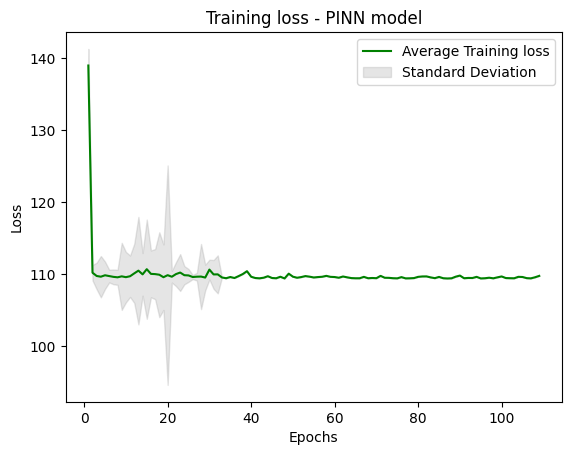

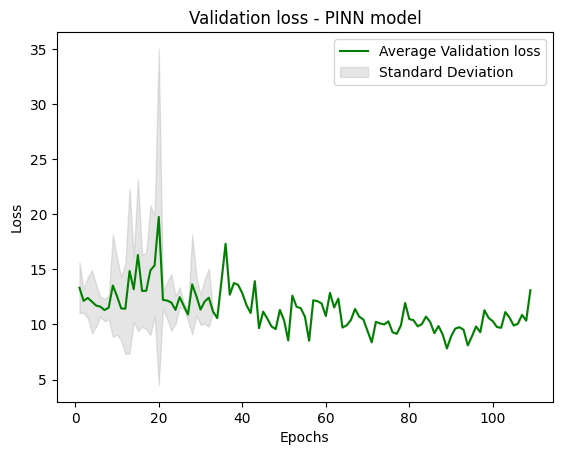

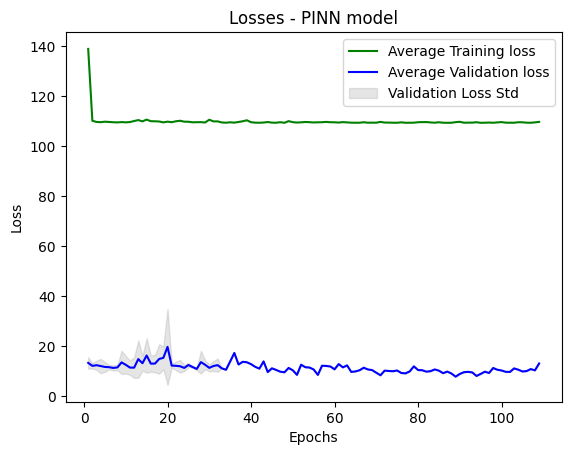

In [74]:
from itertools import zip_longest
import os

current_dir = os.getcwd()
results_dir = os.path.join(current_dir, 'PINN/wAccel/16816/In1000_Out30/01/')
if not os.path.isdir(results_dir):
    os.makedirs(results_dir)

all_losses_training_in1000_out30_16816_01 = np.array(all_losses_training_in1000_out30_16816_01)
all_losses_validation_in1000_out30_16816_01 = np.array(all_losses_validation_in1000_out30_16816_01)

avg_loss_training = [np.mean([x[i] for x in all_losses_training_in1000_out30_16816_01 if len(x) > i]) for i in range(len(max(all_losses_training_in1000_out30_16816_01,key=len)))]
std_loss_training = np.nan_to_num(np.nanstd(np.array(list(zip_longest(*all_losses_training_in1000_out30_16816_01)),dtype=float),axis=1,ddof=1), copy=False)

avg_loss_validation = [np.mean([x[i] for x in all_losses_validation_in1000_out30_16816_01 if len(x) > i]) for i in range(len(max(all_losses_validation_in1000_out30_16816_01,key=len)))]
std_loss_validation = np.nan_to_num(np.nanstd(np.array(list(zip_longest(*all_losses_validation_in1000_out30_16816_01)),dtype=float),axis=1,ddof=1), copy=False)

# Plot the average losses with shaded standard deviation
#create vector of 1 to length of avg_loss_training for x-axis
epochNrs = np.arange(1, len(avg_loss_training)+1, 1)
plt.plot(epochNrs, avg_loss_training, 'g', label='Average Training loss')
plt.fill_between(epochNrs, avg_loss_training - std_loss_validation, avg_loss_training + std_loss_validation, color='gray', alpha=0.2, label='Standard Deviation')
plt.title('Training loss - PINN model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig(results_dir + 'pinn-training-loss-16816.pdf')  
plt.show()

epochNrs = np.arange(1, len(avg_loss_validation)+1, 1)
plt.plot(epochNrs, avg_loss_validation, 'g', label='Average Validation loss')
plt.fill_between(epochNrs, avg_loss_validation - std_loss_validation, avg_loss_validation + std_loss_validation, color='gray', alpha=0.2, label='Standard Deviation')
plt.title('Validation loss - PINN model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig(results_dir + 'pinn-validation-loss-16816.pdf')  
plt.show()

epochNrs = np.arange(1, len(avg_loss_validation)+1, 1)
plt.plot(epochNrs, avg_loss_training, 'g', label='Average Training loss')
plt.plot(epochNrs, avg_loss_validation, 'b', label='Average Validation loss')
plt.fill_between(epochNrs, avg_loss_validation - std_loss_validation, avg_loss_validation + std_loss_validation, color='gray', alpha=0.2, label='Validation Loss Std')
plt.title('Losses - PINN model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig(results_dir + 'dense-allLosses-16816.pdf')  
plt.show()

(32, 1000, 10)
(32, 30, 10)
(3004, 30, 10)


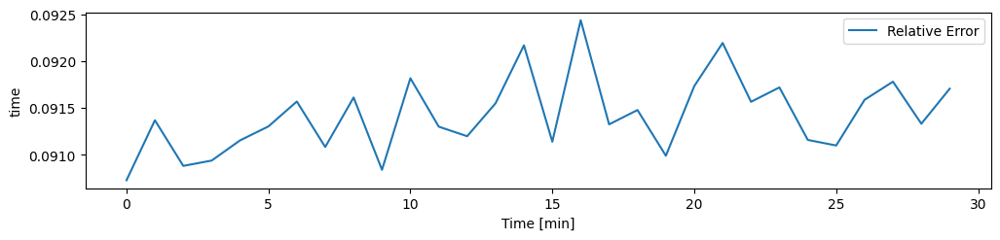

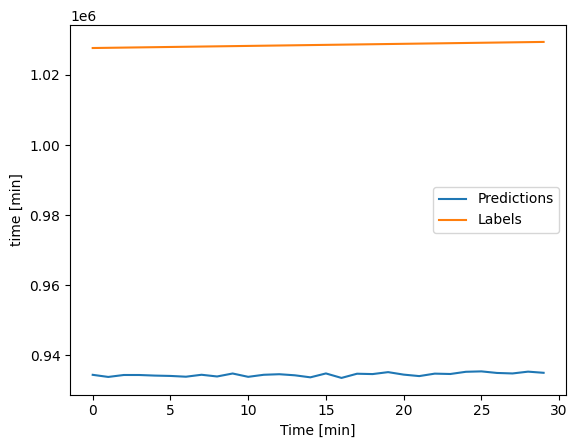

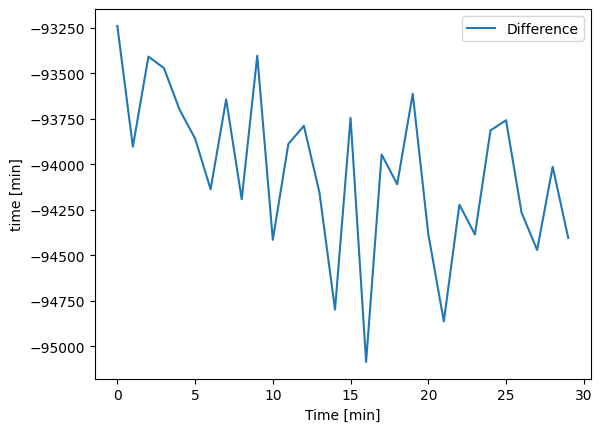

(32, 1000, 10)
(32, 30, 10)
(3004, 30, 10)


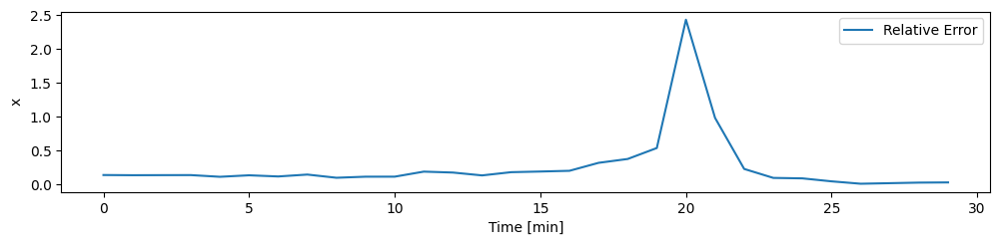

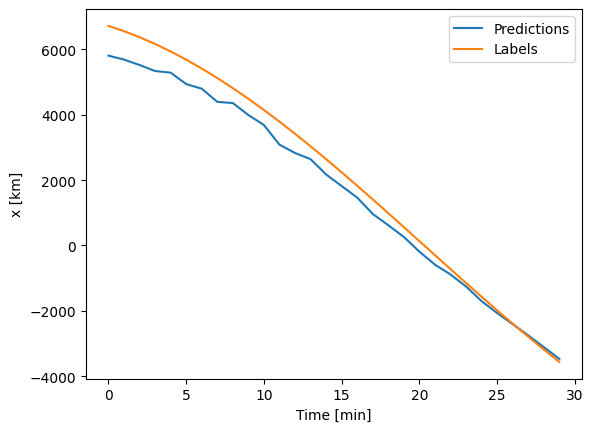

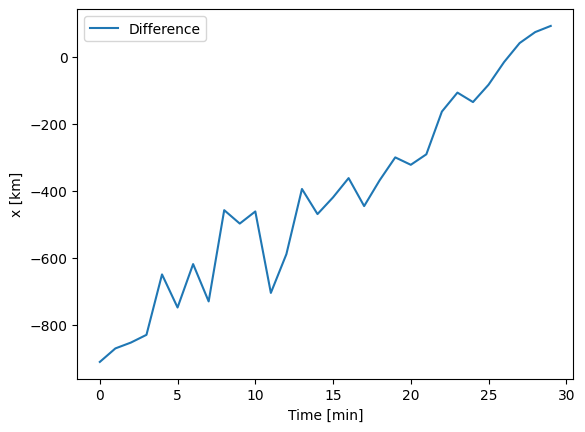

(32, 1000, 10)
(32, 30, 10)
(3004, 30, 10)


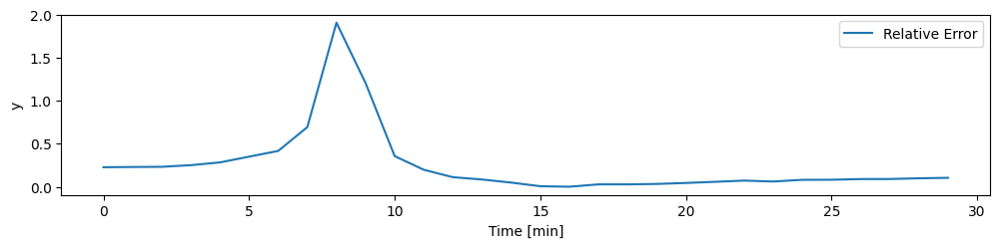

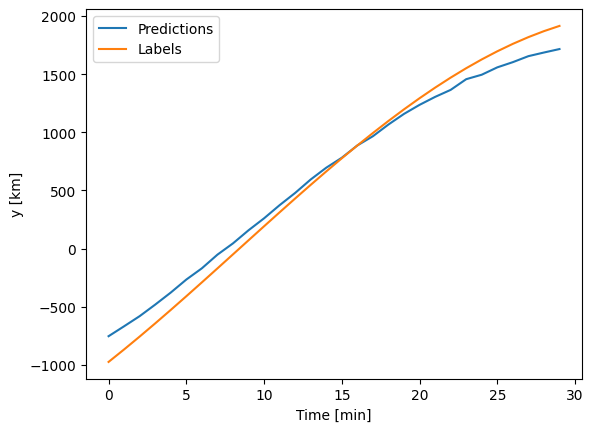

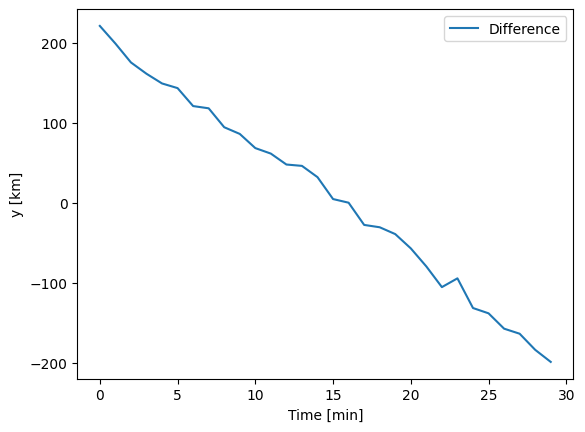

(32, 1000, 10)
(32, 30, 10)
(3004, 30, 10)


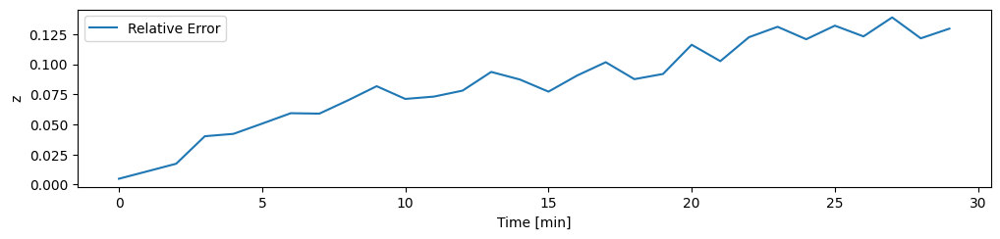

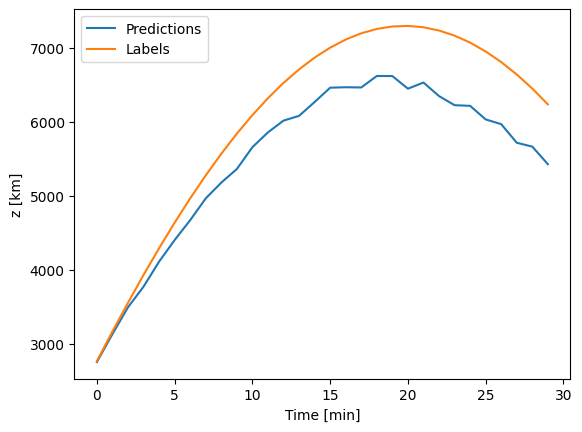

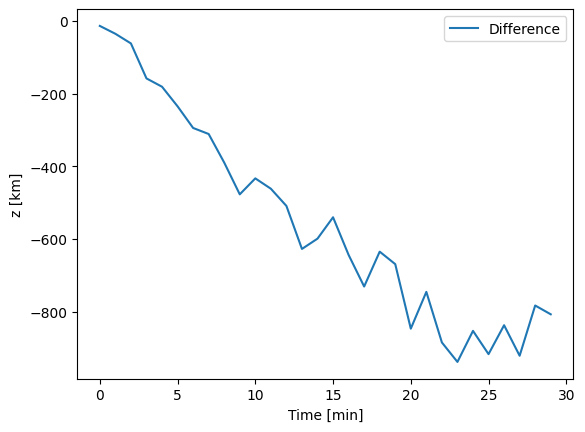

(32, 1000, 10)
(32, 30, 10)
(3004, 30, 10)


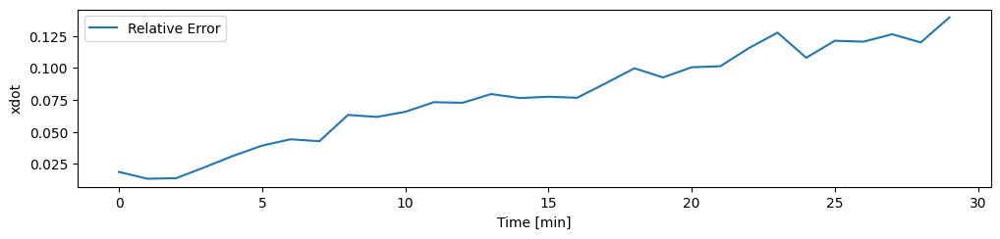

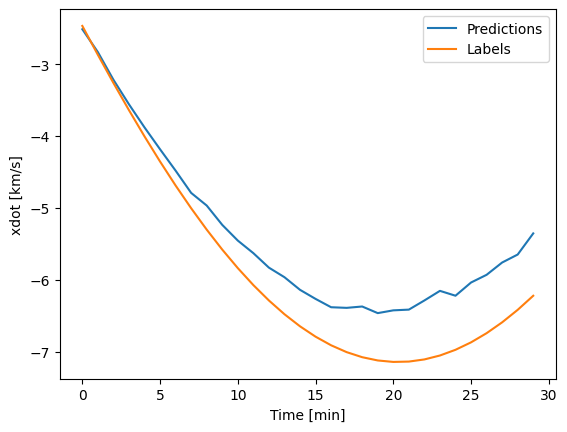

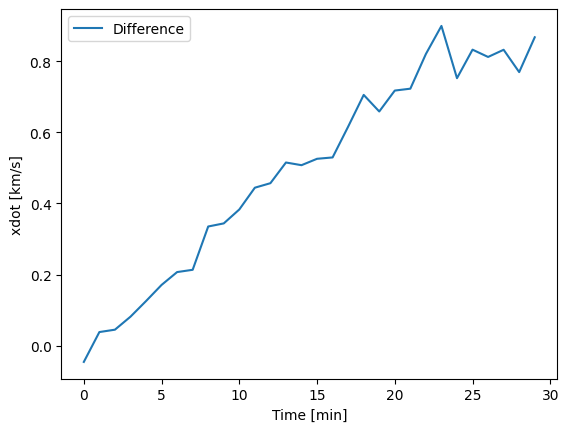

(32, 1000, 10)
(32, 30, 10)
(3004, 30, 10)


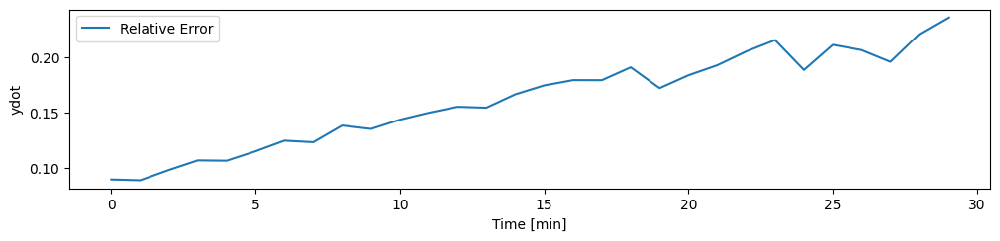

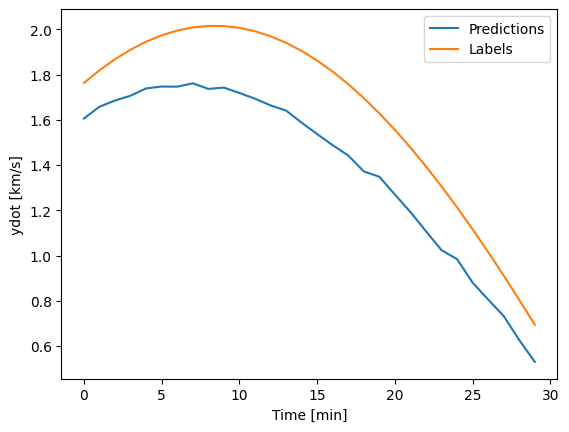

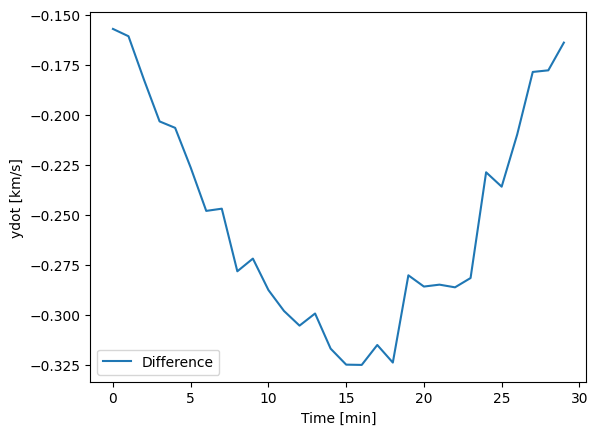

(32, 1000, 10)
(32, 30, 10)
(3004, 30, 10)


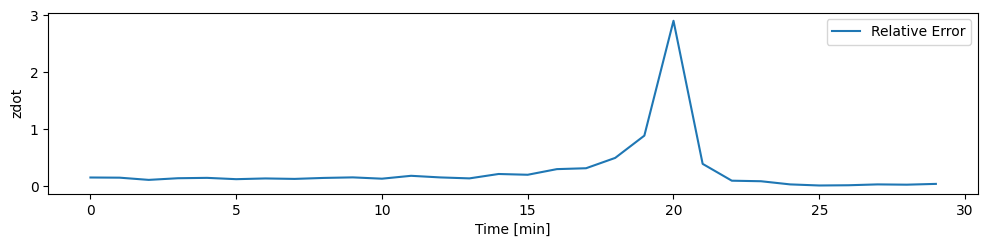

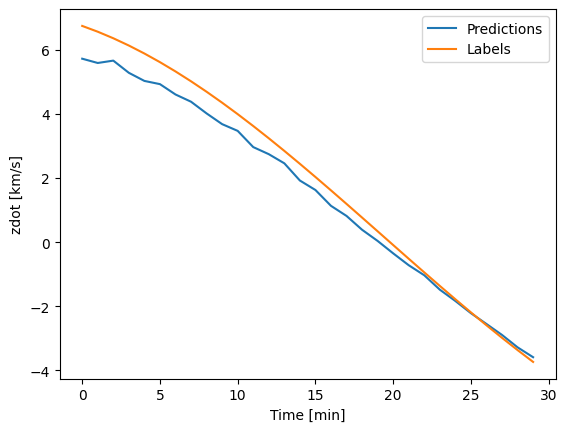

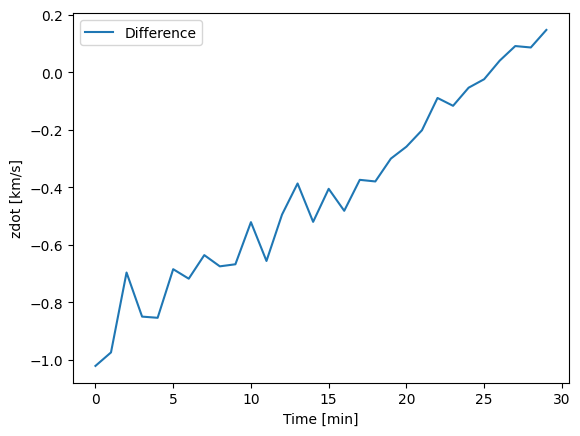

(32, 1000, 10)
(32, 30, 10)
(3004, 30, 10)


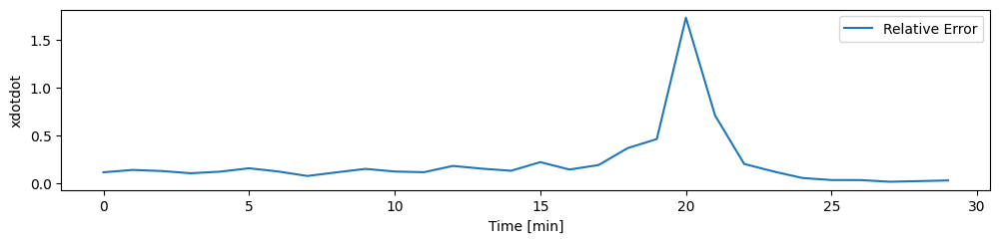

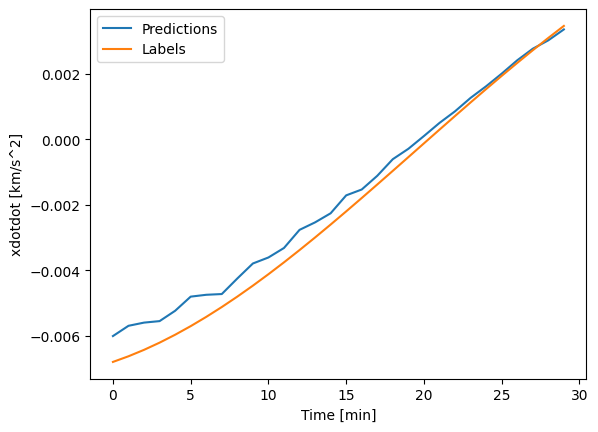

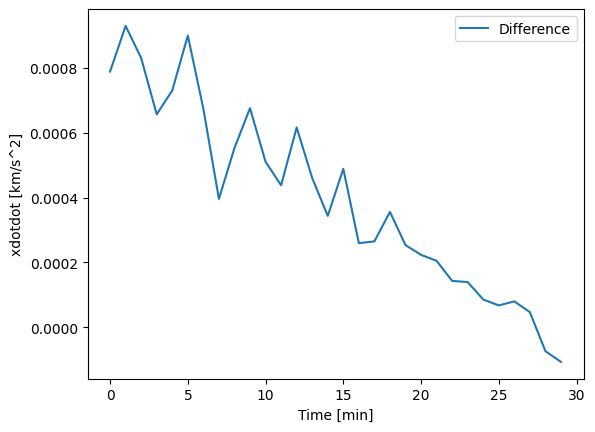

(32, 1000, 10)
(32, 30, 10)
(3004, 30, 10)


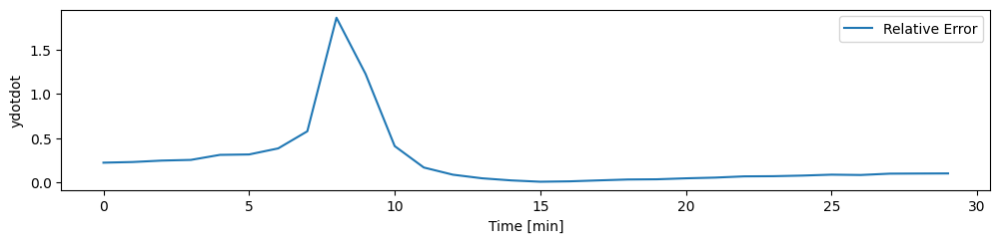

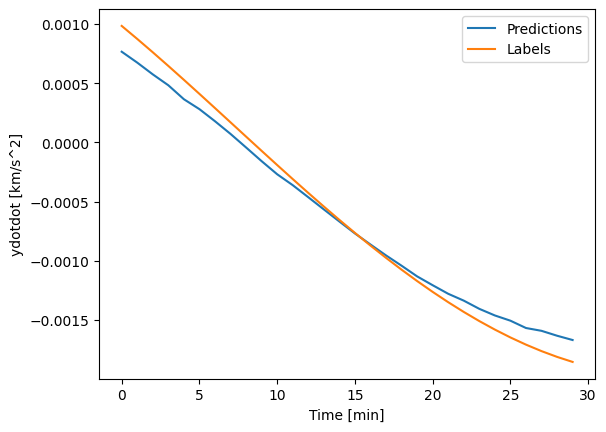

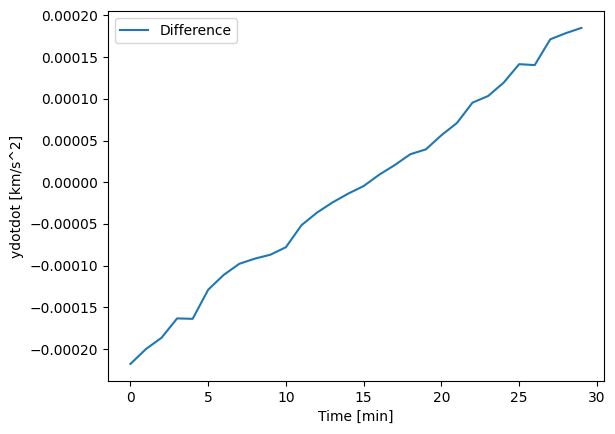

(32, 1000, 10)
(32, 30, 10)
(3004, 30, 10)


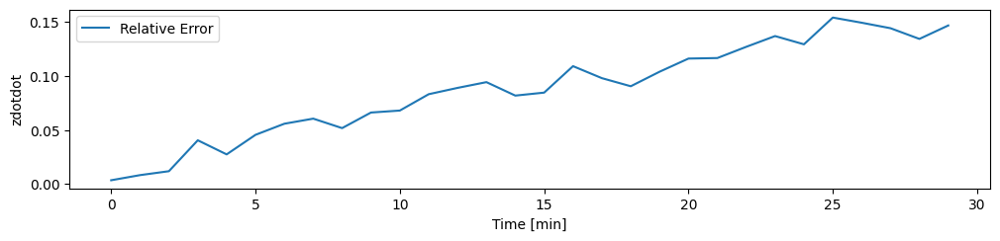

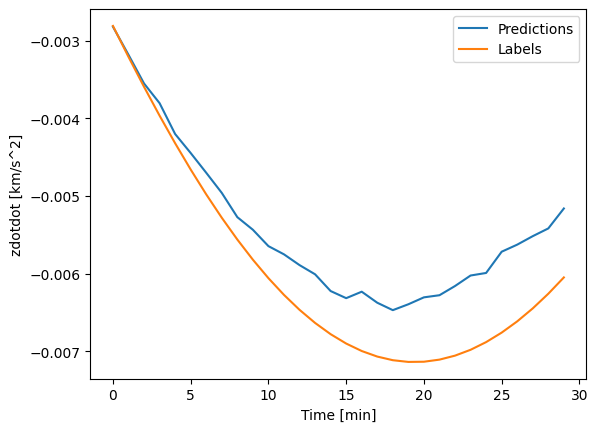

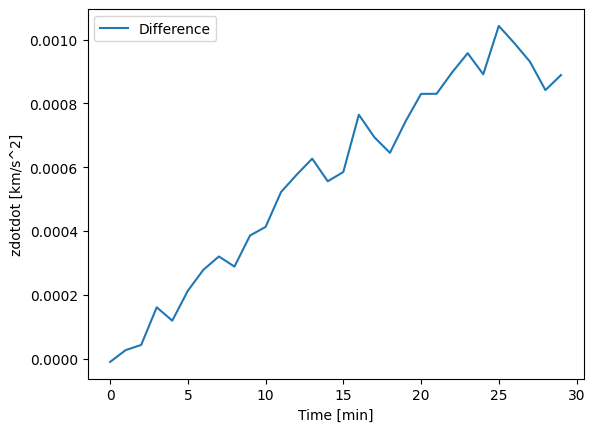

Mean Errors: 
X:  433.2014465332031
Y:  104.56230926513672
Z:  551.3331909179688
XDOT:  0.49931588768959045
YDOT:  0.2531137764453888
ZDOT:  0.4472944140434265
XDOTDOT:  0.00040977803291752934
YDOTDOT:  0.00010071932774735615
ZDOTDOT:  0.0005691949627362192


In [75]:
import IPython
import IPython.display
import os

#plot the difference between the real and the predicted values with the column as a parameter
def plot_diff_Dense(model, window, max_subplots=1, column=0, plot_col = "x", plot_units = "[km]"):
    
    #window.test?
    # print(window.test)
    inputs, labels = next(iter(window.test))
    
    inputs = inputs.numpy()
    labels = labels.numpy()
    predictions, physicalOutputs = model.predict(window.test)
    
    inputs = inputs * train_std_Dense[column] + train_mean_Dense[column]
    labels = labels * train_std_Dense[column] + train_mean_Dense[column]
    predictions  = predictions * train_std_Dense[column] + train_mean_Dense[column]
    
    print(inputs.shape)
    print(labels.shape)
    print(predictions.shape)

    plt.figure(figsize=(12, 8))
    max_n = min(max_subplots, len(inputs))


    for n in range(max_n):
            plt.subplot(3, 1, n+1)

            #fazer legendas diferentes para as velocidades
            plt.ylabel(plot_col)
            plt.plot(np.abs((predictions[n, :, column] - labels[n, :, column])/ labels[n, :, column]) ,label='Relative Error')
            plt.xlabel('Time [min]')
            plt.legend()
            plt.savefig(results_dir + 'pinn-training-relativeError-16816-' + plot_col + '.pdf')  
            plt.show()

            plt.ylabel(plot_col + ' ' + plot_units)
            plt.plot(predictions[n, :, column] ,label='Predictions')
            plt.plot(labels[n, :, column] ,label='Labels')
            plt.xlabel('Time [min]')
            plt.legend()
            plt.savefig(results_dir + 'pinn-training-PredictionsVSLabels-16816-' + plot_col + '.pdf')  
            plt.show()

            plt.ylabel(plot_col + ' ' + plot_units)
            plt.plot((predictions[n, :, column] - labels[n, :, column]) ,label='Difference')
            plt.xlabel('Time [min]')
            plt.legend()
            plt.savefig(results_dir + 'pinn-training-Difference-16816-' + plot_col + '.pdf')  
            plt.show()

plot_diff_Dense(modelTest_noInitialState_in1000_out30_16816_01, multi_window_Dense, column=0, plot_col = "time", plot_units = "[min]")
plot_diff_Dense(modelTest_noInitialState_in1000_out30_16816_01, multi_window_Dense, column=1, plot_col = "x", plot_units = "[km]")
plot_diff_Dense(modelTest_noInitialState_in1000_out30_16816_01, multi_window_Dense, column=2, plot_col = "y", plot_units = "[km]")
plot_diff_Dense(modelTest_noInitialState_in1000_out30_16816_01, multi_window_Dense, column=3, plot_col = "z", plot_units = "[km]")
plot_diff_Dense(modelTest_noInitialState_in1000_out30_16816_01, multi_window_Dense, column=4, plot_col = "xdot", plot_units = "[km/s]")
plot_diff_Dense(modelTest_noInitialState_in1000_out30_16816_01, multi_window_Dense, column=5, plot_col = "ydot", plot_units = "[km/s]")
plot_diff_Dense(modelTest_noInitialState_in1000_out30_16816_01, multi_window_Dense, column=6, plot_col = "zdot", plot_units = "[km/s]")
plot_diff_Dense(modelTest_noInitialState_in1000_out30_16816_01, multi_window_Dense, column=7, plot_col = "xdotdot", plot_units = "[km/s^2]")
plot_diff_Dense(modelTest_noInitialState_in1000_out30_16816_01, multi_window_Dense, column=8, plot_col = "ydotdot", plot_units = "[km/s^2]")
plot_diff_Dense(modelTest_noInitialState_in1000_out30_16816_01, multi_window_Dense, column=9, plot_col = "zdotdot", plot_units = "[km/s^2]")



#calculate the mean absolute error for each column
def calculateMeanErrors(model, window, max_subplots=1, column=0):
    
    #repeat this for 10 trials and calculate the mean error
    meanError = 0
    nrTrials = 7
    for i in range(nrTrials):
        inputs, labels = next(iter(window.test))
        inputs = inputs.numpy()
        labels = labels.numpy()
        predictions, physicalOutputs = model.predict(window.test)
        
        inputs = inputs * train_std_Dense[column] + train_mean_Dense[column]
        labels = labels * train_std_Dense[column] + train_mean_Dense[column]
        predictions  = predictions * train_std_Dense[column] + train_mean_Dense[column]
        
        meanError += np.mean(np.abs(predictions[0, :, column] - labels[0, :, column]))
    meanError = meanError/nrTrials
    return meanError


    # inputs, labels = next(iter(window.test))
    
    # inputs = inputs.numpy()
    # labels = labels.numpy()
    # predictions, physicalOutputs = model.predict(window.test)
    
    # inputs = inputs * train_std_Dense[column] + train_mean_Dense[column]
    # labels = labels * train_std_Dense[column] + train_mean_Dense[column]
    # predictions  = predictions * train_std_Dense[column] + train_mean_Dense[column]
    
    
    # meanError = np.mean(np.abs(predictions[0, :, column] - labels[0, :, column]))
    # return meanError
    
    
meanErrorX = calculateMeanErrors(modelTest_noInitialState_in1000_out30_16816_01, multi_window_Dense, column=1)
meanErrorY = calculateMeanErrors(modelTest_noInitialState_in1000_out30_16816_01, multi_window_Dense, column=2)
meanErrorZ = calculateMeanErrors(modelTest_noInitialState_in1000_out30_16816_01, multi_window_Dense, column=3)
meanErrorXDOT = calculateMeanErrors(modelTest_noInitialState_in1000_out30_16816_01, multi_window_Dense, column=4)
meanErrorYDOT = calculateMeanErrors(modelTest_noInitialState_in1000_out30_16816_01, multi_window_Dense, column=5)
meanErrorZDOT = calculateMeanErrors(modelTest_noInitialState_in1000_out30_16816_01, multi_window_Dense, column=6)
meanErrorXDOTDOT = calculateMeanErrors(modelTest_noInitialState_in1000_out30_16816_01, multi_window_Dense, column=7)
meanErrorYDOTDOT = calculateMeanErrors(modelTest_noInitialState_in1000_out30_16816_01, multi_window_Dense, column=8)
meanErrorZDOTDOT = calculateMeanErrors(modelTest_noInitialState_in1000_out30_16816_01, multi_window_Dense, column=9)

print("Mean Errors: ")
print("X: ", meanErrorX)
print("Y: ", meanErrorY)
print("Z: ", meanErrorZ)
print("XDOT: ", meanErrorXDOT)
print("YDOT: ", meanErrorYDOT)
print("ZDOT: ", meanErrorZDOT)
print("XDOTDOT: ", meanErrorXDOTDOT)
print("YDOTDOT: ", meanErrorYDOTDOT)
print("ZDOTDOT: ", meanErrorZDOTDOT)


### PINN (without initial state) IN 1000 OUT 30, 32 16 32 DENSE

In [76]:
class PhysicsInformedNN_noInitialState():
    def __init__(self, windowData, windowDataValidation):
        # data
        self.windowData = windowData
        self.windowDataValidation = windowDataValidation
        
        self.allLossesTraining = []
        self.allLossesValidation = []

        self.u_net_LossesTraining = []
        self.u_net_LossesValidation = []

        self.f_net_LossesTraining = []
        self.f_net_LossesValidation = []
        
        self.early_stopping_patience = 20 
        self.best_validation_loss = float('inf')

        # deep neural networks
        self.dnn = tf.keras.Sequential([
            # Shape [batch, time, features] => [batch, features]
            tf.keras.layers.Lambda(lambda x: x[:, -INPUT_STEPS:, :]),
            # tf.keras.layers.Flatten(input_shape=(1440, num_features)),
            
            # tf.keras.layers.Flatten(input_shape=(1440, 1)),
            
            tf.keras.layers.Dense(32, activation='LeakyReLU'),
            tf.keras.layers.Dense(16, activation='LeakyReLU'),
            tf.keras.layers.Dense(32, activation='LeakyReLU'),

            tf.keras.layers.Flatten(),
            # Shape => [batch, out_steps*num_outputs]
            tf.keras.layers.Dense(OUT_STEPS*num_features_Dense, kernel_initializer=tf.keras.initializers.HeNormal()),
            # Shape => [batch, out_steps, num_outputs]
            tf.keras.layers.Reshape([OUT_STEPS, num_features_Dense])
        ])
        
        # optimizers: using the same settings
        self.optimizer = tf.optimizers.Adam()
        
        self.iter = 0
        
    def net_u(self, windowData):  
        #remove the time
        # # windowData = windowData[:, :, :-1]
        # time = windowData[:, :, 0:1]
        # initial_state = windowData[:, :, 1:]
        #tf.concat([time, initial_state], axis=-1)
        u = self.dnn(windowData)
        # u = self.dnn(windowData)
        return u
    
    def net_f(self, time, data):
        """ The TensorFlow version of calculating residual """

        #change data to variable
        time = tf.Variable(time, dtype=tf.float32)
        data = tf.Variable(data, dtype=tf.float32)


        x = data[:, :, 0]
        y = data[:, :, 1]
        z = data[:, :, 2]
        xdot = data[:, :, 3]
        ydot = data[:, :, 4]
        zdot = data[:, :, 5]
        xdotdot = data[:, :, 6]
        ydotdot = data[:, :, 7]
        zdotdot = data[:, :, 8]

        def calculate_velocity(positions, vel, t):
            with tf.GradientTape(persistent=True) as tape:
                tape.watch(t)
                output = (positions*t)/t # Perform computation involving positions tensor and time tensor
            
            velocity = tape.gradient(output, t)
            return velocity

        x_dot = calculate_velocity(x, xdot, time)
        y_dot = calculate_velocity(y, ydot, time)
        z_dot = calculate_velocity(z, zdot, time)
        x_dot_dot = calculate_velocity(x_dot, None, time)
        y_dot_dot = calculate_velocity(y_dot, None, time)
        z_dot_dot = calculate_velocity(z_dot, None, time)

        
        #call SINDy to get the equations
        # model = getSindyEquations(data[:, :, 1:], data[:, :, 0])

        #create a tuple with the residual for each axis
        res_px = x_dot - xdot
        res_py = y_dot - ydot
        res_pz = z_dot - zdot
        # standardGravitationalParameter = 3.986004418 * 10**(5), using standardized  
        r = tf.sqrt(x**2 + y**2 + z**2)
        res_vx = x_dot_dot + standardGravitationalParameter * x/(r**3) 
        res_vy = y_dot_dot + standardGravitationalParameter * y/(r**3) 
        res_vz = z_dot_dot + standardGravitationalParameter * z/(r**3) 

        res_accX = x_dot_dot - xdotdot
        res_accY = y_dot_dot - ydotdot
        res_accZ = z_dot_dot - zdotdot


        #concatenate the residuals into a single tensor
        res = tf.concat([res_px, res_py, res_pz, res_vx, res_vy, res_vz, res_accX, res_accY, res_accZ], axis=1)
        # res = tf.concat([res_px, res_py, res_pz, res_vx, res_vy, res_vz], axis=1)

        return res
    
    def loss_func(self, inputs, labels, isTraining = True):
        with tf.GradientTape() as tape:
            tape.watch(self.dnn.trainable_variables)
            
            #separate the time from the rest of the data
            timeAux = tf.Variable(inputs[:, :, 0])
            # initial_state = inputs[:, 0, 1:]
            # inputs = inputs[:, :, 1:]
            # u_pred = self.net_u(timeAux)
            u_pred = self.net_u(inputs)
            #limit timeAux for each batch to the shape of the output of the neural network
            timeAux = timeAux[:, 0:labels.shape[1]]

            f_pred = self.net_f(timeAux, u_pred)

            #remove the time from the labels
            # labels = labels[:, :, 1:]
            loss_u = tf.reduce_mean(tf.square(labels - u_pred))
            loss_f = tf.reduce_mean(tf.square(f_pred))

            weightLoss = 0.1
            loss = (weightLoss * loss_u) + ((1-weightLoss) * loss_f)
        
        gradients = tape.gradient(loss, self.dnn.trainable_variables)
        self.optimizer.apply_gradients(zip(gradients, self.dnn.trainable_variables))
        
        self.iter += 1

        # if isTraining:
        #     self.allLossesTraining.append(loss.numpy())
        #     self.u_net_LossesTraining.append(loss_u.numpy())
        #     self.f_net_LossesTraining.append(loss_f.numpy())
        # else:
        #     self.allLossesValidation.append(loss.numpy())
        #     self.u_net_LossesValidation.append(loss_u.numpy())
        #     self.f_net_LossesValidation.append(loss_f.numpy())

        if self.iter % 100 == 0:
            print(
                'Iter %d, Loss: %.5e, Loss_u: %.5e, Loss_f: %.5e' % (self.iter, loss.numpy(), loss_u.numpy(), loss_f.numpy())
            )
            
        return loss.numpy(), loss_u.numpy(), loss_f.numpy()

    def validate(self):
        self.dnn.trainable = False
        loss_Aux = np.array([])
        lossU_Aux = np.array([])
        lossF_Aux = np.array([])
        for example_inputs, example_labels in self.windowDataValidation:
            loss, lossU, lossF = self.loss_func(example_inputs, example_labels, isTraining=False)
            
            loss_Aux = np.append(loss_Aux, loss)
            lossU_Aux = np.append(lossU_Aux, lossU)
            lossF_Aux = np.append(lossF_Aux, lossF)


        self.allLossesValidation.append(np.mean(loss_Aux))
        self.u_net_LossesValidation.append(np.mean(lossU_Aux))
        self.f_net_LossesValidation.append(np.mean(lossF_Aux))
    
    def build(self, input_shape):
        self.dnn.build(input_shape)

    def train(self):
        for epoch in range(200):
            print('EPOCH %d' % (epoch))
            print((np.array(self.windowData)))
            loss_Aux = np.array([])
            lossU_Aux = np.array([])
            lossF_Aux = np.array([])

            self.dnn.trainable = True
            for n, (example_inputs, example_labels) in enumerate(self.windowData):
                loss, lossU, lossF = self.loss_func(example_inputs, example_labels, isTraining=True)
                
                #store intermediate losses and then make mean to get the epoch loss
                loss_Aux = np.append(loss_Aux, loss)
                lossU_Aux = np.append(lossU_Aux, lossU)
                lossF_Aux = np.append(lossF_Aux, lossF)
            
            #first value was returning nan for the physical loss
            for i in range(0, len(loss_Aux)):
                if np.isnan(loss_Aux[i]):
                    loss_Aux[i] = loss_Aux[i + 1]
                if np.isnan(lossF_Aux[i]):
                    lossF_Aux[i] = lossF_Aux[i + 1]
                if np.isnan(lossU_Aux[i]):
                    lossU_Aux[i] = lossU_Aux[i + 1]
            
            self.allLossesTraining.append(np.mean(loss_Aux))
            self.u_net_LossesTraining.append(np.mean(lossU_Aux))
            self.f_net_LossesTraining.append(np.mean(lossF_Aux))
           
            self.validate()
            
            # Check if the validation loss has improved
            if self.allLossesValidation[-1] < self.best_validation_loss:
                self.best_validation_loss = self.allLossesValidation[-1]
                self.early_stopping_counter = 0
            else:
                self.early_stopping_counter += 1

            # Stop training if the validation loss hasn't improved for the specified patience
            if self.early_stopping_counter >= self.early_stopping_patience:
                print(f"Early stopping at epoch {epoch}")
                break

        self.dnn.trainable = False
                
    # def predict(self, X):
    #     self.dnn.trainable = False
    #     u = self.net_u(X)
    #     #select the time from the input
    #     time = X[:, :, 0]
    #     #60 = output steps da window
    #     time = time[:, 0:OUT_STEPS]
    #     f = self.net_f(time, u)
    #     u = u.numpy()
    #     f = f.numpy()
    #     return u, f

    def predict(self, X):
        self.dnn.trainable = False
        outputsU = []
        outputsF = []
        for inputs, labels in X:
            #separate the time from the rest of the data
            timeAux = tf.Variable(inputs[:, :, 0])
            u = self.net_u(inputs)
            time = timeAux[:, 0:OUT_STEPS]
            f = self.net_f(time, u)
            outputsU.append(u.numpy())
            outputsF.append(f.numpy())

        return np.concatenate(outputsU, axis=0), np.concatenate(outputsF, axis=0)

    def run_trial(self):
        self.allLossesTraining = []
        self.allLossesValidation = []
        self.best_validation_loss = float('inf')
        self.early_stopping_counter = 0
        self.build((32, INPUT_STEPS, 10))
        self.train()
        return self.allLossesTraining, self.allLossesValidation

    def plot_losses(self, graphics = "allLosses"):
        
        # allLossesTraining
        # u_net_LossesTraining
        # f_net_LossesTraining

        # allLossesValidation
        # u_net_LossesValidation
        # f_net_LossesValidation

        if graphics == "f_losses":
            plt.yscale('log')
            plt.plot(self.f_net_LossesTraining, label='Training Loss')
            plt.plot(self.f_net_LossesValidation, label='Validation Loss')
            plt.xlabel('Epoch')
            plt.ylabel('Loss')
            plt.title('Training and Validation Physical Loss')
            plt.legend()
            plt.show()
        elif graphics == "u_losses":
            plt.yscale('log')
            plt.plot(self.u_net_LossesTraining, label='Training Loss')
            plt.plot(self.u_net_LossesValidation, label='Validation Loss')
            plt.xlabel('Epoch')
            plt.ylabel('Loss')
            plt.title('Training and Validation Data Loss')
            plt.legend()
            plt.show()
        else:
            plt.yscale('log')
            plt.plot(self.allLossesTraining, label='Training Loss')
            plt.plot(self.allLossesValidation, label='Validation Loss')
            plt.xlabel('Epoch')
            plt.ylabel('Loss')
            plt.title('Training and Validation Total Loss')
            plt.legend()
            plt.show()

modelTest_noInitialState_in1000_out30_321632_01 = PhysicsInformedNN_noInitialState(multi_window_Dense.train, multi_window_Dense.val)
#build the model
#subtract one from the shape because the time is not an input
# modelTest.build(multi_window.example[0].shape)
# modelTest_noInitialState.build((32, INPUT_STEPS, 7))
# modelTest_noInitialState.train()


nrOfRuns = 4
all_losses_training_in1000_out30_321632_01 = []
all_losses_validation_in1000_out30_321632_01 = []
for _ in range(nrOfRuns):
    losses_training, losses_validation = modelTest_noInitialState_in1000_out30_321632_01.run_trial()
    all_losses_training_in1000_out30_321632_01.append(losses_training)
    all_losses_validation_in1000_out30_321632_01.append(losses_validation)

EPOCH 0
<MapDataset element_spec=(TensorSpec(shape=(None, 1000, 10), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 10), dtype=tf.float32, name=None))>
Iter 100, Loss: 1.27256e+02, Loss_u: 5.70162e-04, Loss_f: 1.41395e+02
Iter 200, Loss: 1.49047e+02, Loss_u: 1.55532e-01, Loss_f: 1.65591e+02
Iter 300, Loss: 4.73637e+01, Loss_u: 2.35265e-02, Loss_f: 5.26237e+01
Iter 400, Loss: 7.27409e+00, Loss_u: 1.28566e-02, Loss_f: 8.08090e+00
EPOCH 1
<MapDataset element_spec=(TensorSpec(shape=(None, 1000, 10), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 10), dtype=tf.float32, name=None))>
Iter 500, Loss: 9.05766e+01, Loss_u: 2.21937e-04, Loss_f: 1.00641e+02
Iter 600, Loss: 2.21304e+02, Loss_u: 6.31822e-05, Loss_f: 2.45894e+02
Iter 700, Loss: 9.86268e+01, Loss_u: 4.84703e-05, Loss_f: 1.09585e+02
Iter 800, Loss: 9.91810e+00, Loss_u: 3.59013e-03, Loss_f: 1.10197e+01
EPOCH 2
<MapDataset element_spec=(TensorSpec(shape=(None, 1000, 10), dtype=tf.float32, name=None), TensorSpec(shap

C:\Users\jpfun\AppData\Local\Temp\ipykernel_50240\2925663789.py:9: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  all_losses_training_in1000_out30_321632_01 = np.array(all_losses_training_in1000_out30_321632_01)
C:\Users\jpfun\AppData\Local\Temp\ipykernel_50240\2925663789.py:10: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  all_losses_validation_in1000_out30_321632_01 = np.array(all_losses_validation_in1000_out30_321632_01)
c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\numpy\lib\nanfunctions.py:1670: RuntimeWarning: Degr

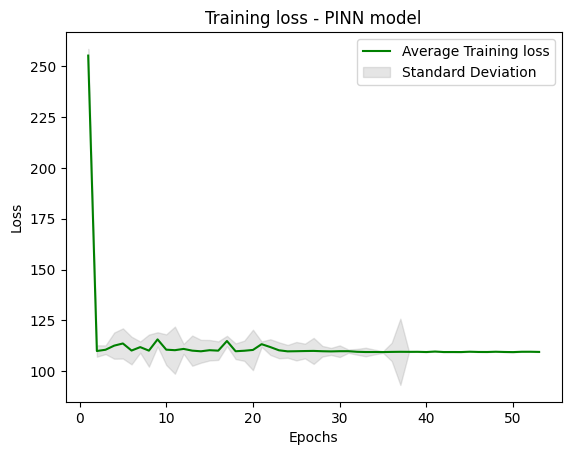

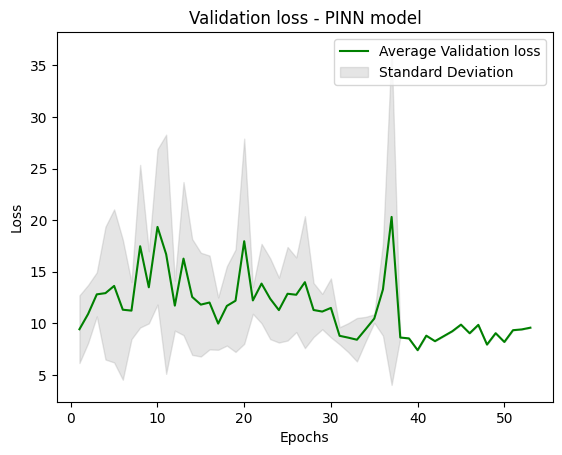

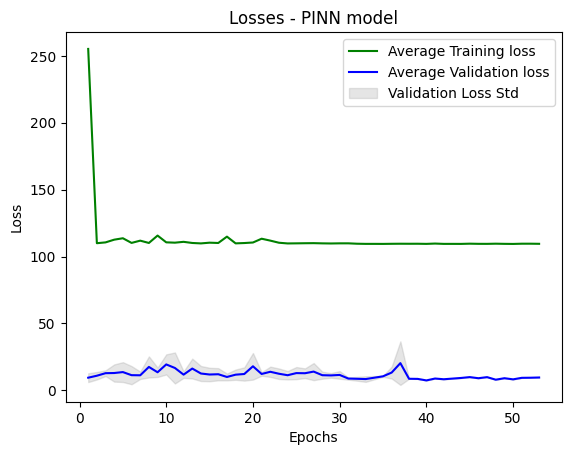

In [77]:
from itertools import zip_longest
import os

current_dir = os.getcwd()
results_dir = os.path.join(current_dir, 'PINN/wAccel/321632/In1000_Out30/01/')
if not os.path.isdir(results_dir):
    os.makedirs(results_dir)

all_losses_training_in1000_out30_321632_01 = np.array(all_losses_training_in1000_out30_321632_01)
all_losses_validation_in1000_out30_321632_01 = np.array(all_losses_validation_in1000_out30_321632_01)

avg_loss_training = [np.mean([x[i] for x in all_losses_training_in1000_out30_321632_01 if len(x) > i]) for i in range(len(max(all_losses_training_in1000_out30_321632_01,key=len)))]
std_loss_training = np.nan_to_num(np.nanstd(np.array(list(zip_longest(*all_losses_training_in1000_out30_321632_01)),dtype=float),axis=1,ddof=1), copy=False)

avg_loss_validation = [np.mean([x[i] for x in all_losses_validation_in1000_out30_321632_01 if len(x) > i]) for i in range(len(max(all_losses_validation_in1000_out30_321632_01,key=len)))]
std_loss_validation = np.nan_to_num(np.nanstd(np.array(list(zip_longest(*all_losses_validation_in1000_out30_321632_01)),dtype=float),axis=1,ddof=1), copy=False)

# Plot the average losses with shaded standard deviation
#create vector of 1 to length of avg_loss_training for x-axis
epochNrs = np.arange(1, len(avg_loss_training)+1, 1)
plt.plot(epochNrs, avg_loss_training, 'g', label='Average Training loss')
plt.fill_between(epochNrs, avg_loss_training - std_loss_validation, avg_loss_training + std_loss_validation, color='gray', alpha=0.2, label='Standard Deviation')
plt.title('Training loss - PINN model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig(results_dir + 'pinn-training-loss-321632.pdf')  
plt.show()

epochNrs = np.arange(1, len(avg_loss_validation)+1, 1)
plt.plot(epochNrs, avg_loss_validation, 'g', label='Average Validation loss')
plt.fill_between(epochNrs, avg_loss_validation - std_loss_validation, avg_loss_validation + std_loss_validation, color='gray', alpha=0.2, label='Standard Deviation')
plt.title('Validation loss - PINN model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig(results_dir + 'pinn-validation-loss-321632.pdf')  
plt.show()

epochNrs = np.arange(1, len(avg_loss_validation)+1, 1)
plt.plot(epochNrs, avg_loss_training, 'g', label='Average Training loss')
plt.plot(epochNrs, avg_loss_validation, 'b', label='Average Validation loss')
plt.fill_between(epochNrs, avg_loss_validation - std_loss_validation, avg_loss_validation + std_loss_validation, color='gray', alpha=0.2, label='Validation Loss Std')
plt.title('Losses - PINN model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig(results_dir + 'dense-allLosses-321632.pdf')  
plt.show()

(32, 1000, 10)
(32, 30, 10)
(3004, 30, 10)


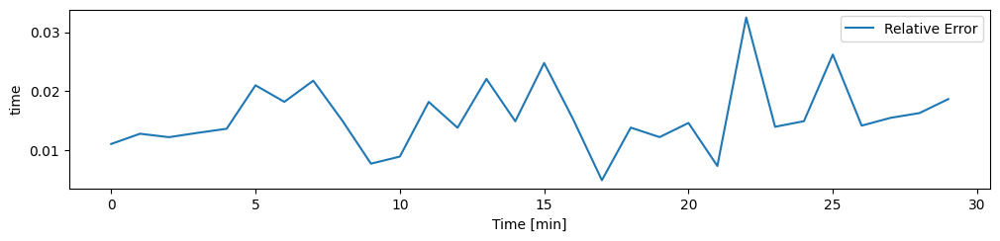

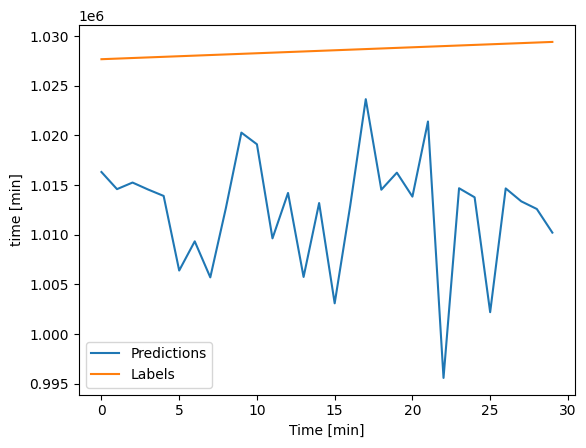

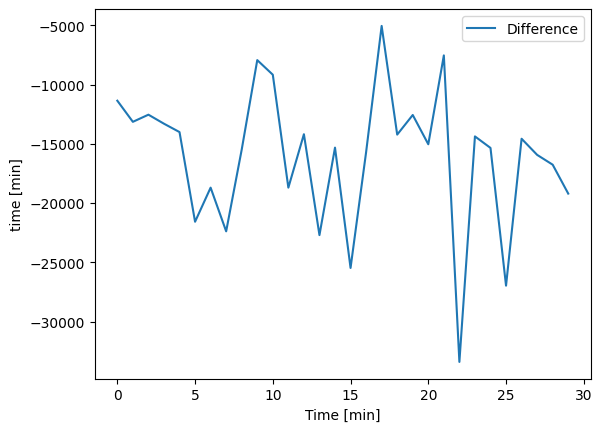

(32, 1000, 10)
(32, 30, 10)
(3004, 30, 10)


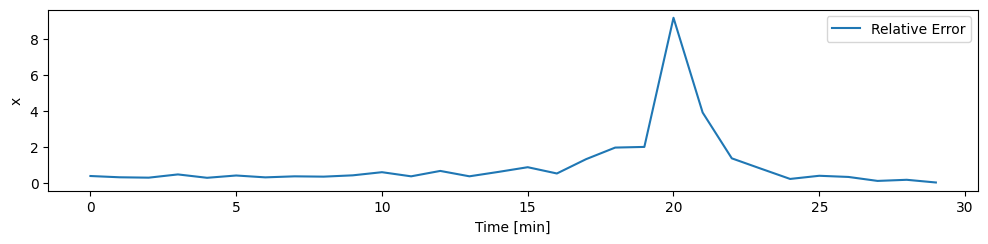

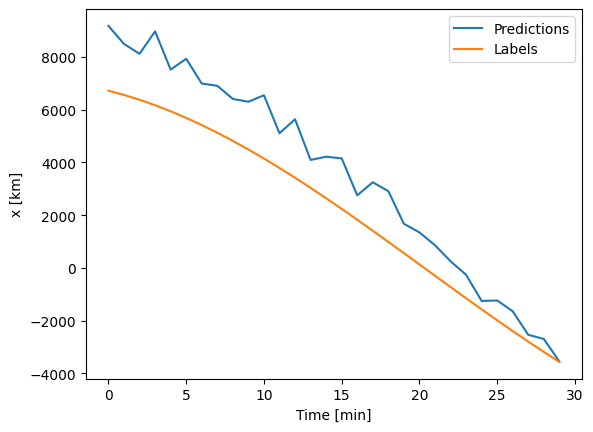

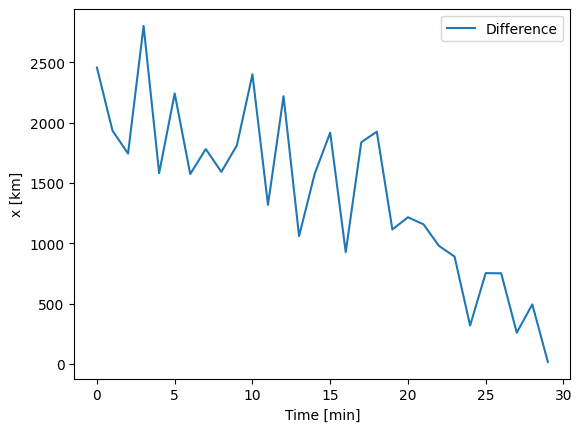

(32, 1000, 10)
(32, 30, 10)
(3004, 30, 10)


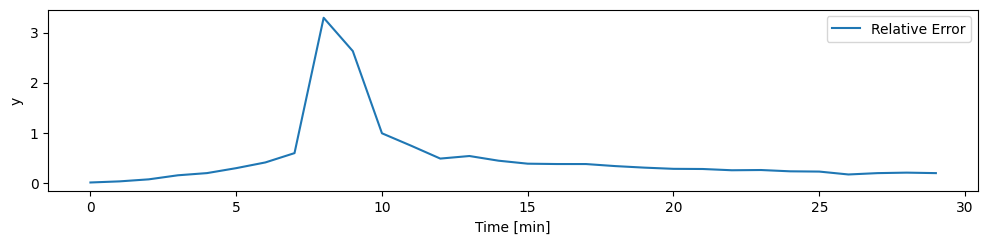

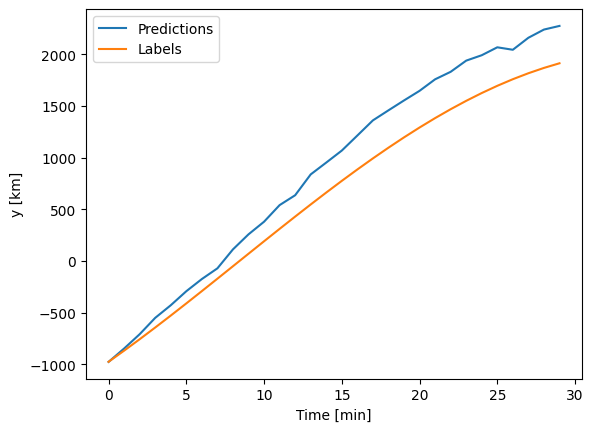

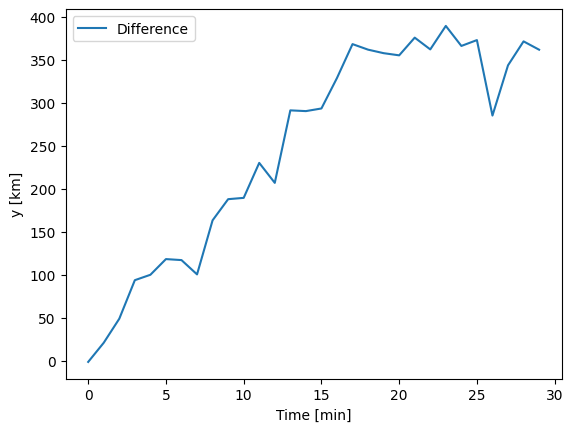

(32, 1000, 10)
(32, 30, 10)
(3004, 30, 10)


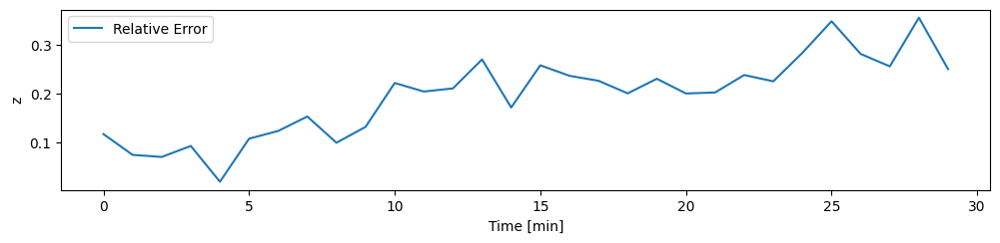

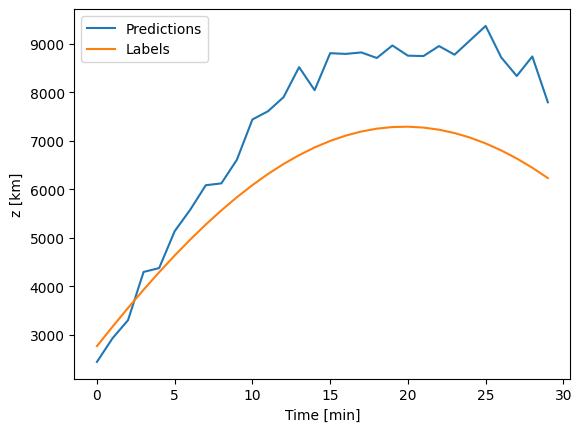

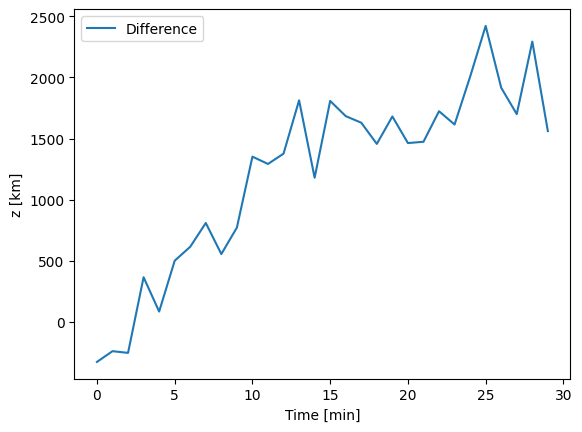

(32, 1000, 10)
(32, 30, 10)
(3004, 30, 10)


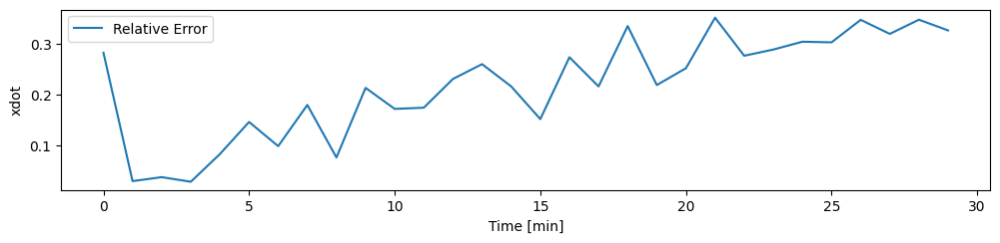

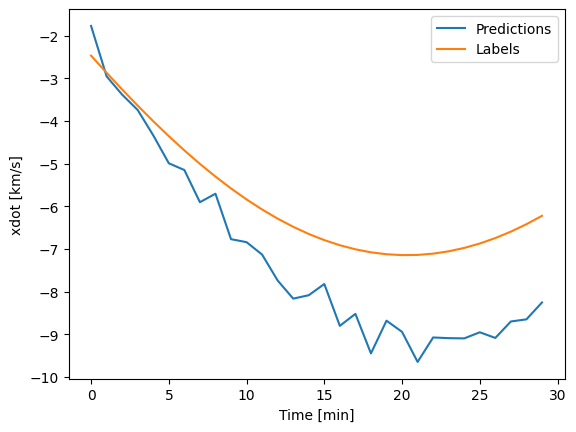

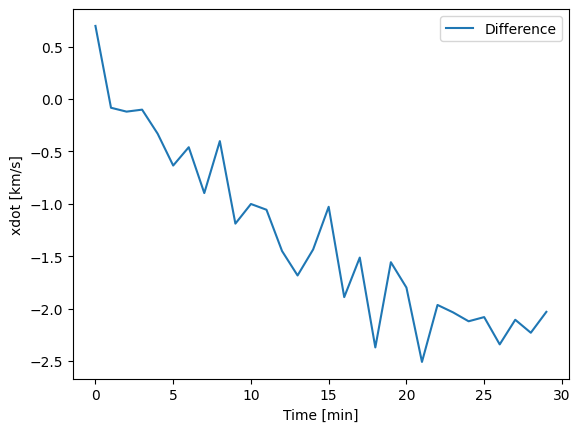

(32, 1000, 10)
(32, 30, 10)
(3004, 30, 10)


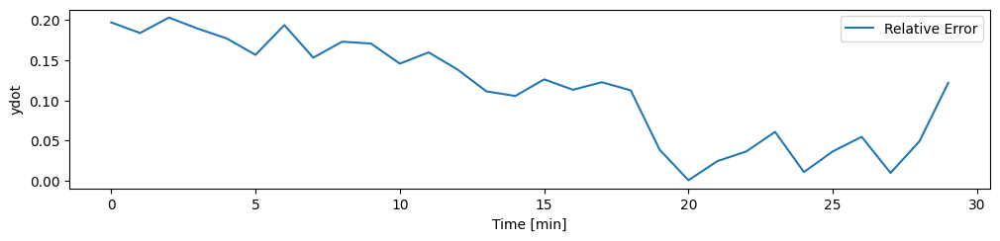

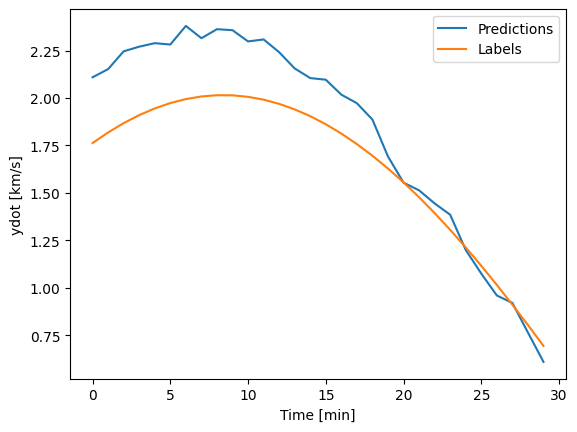

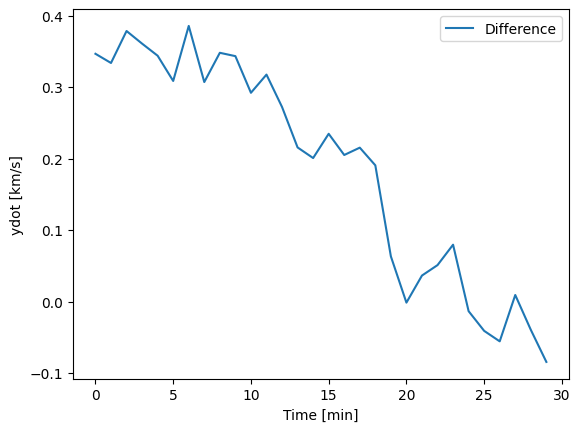

(32, 1000, 10)
(32, 30, 10)
(3004, 30, 10)


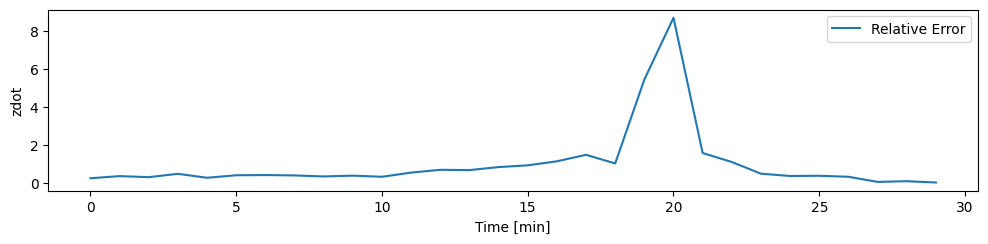

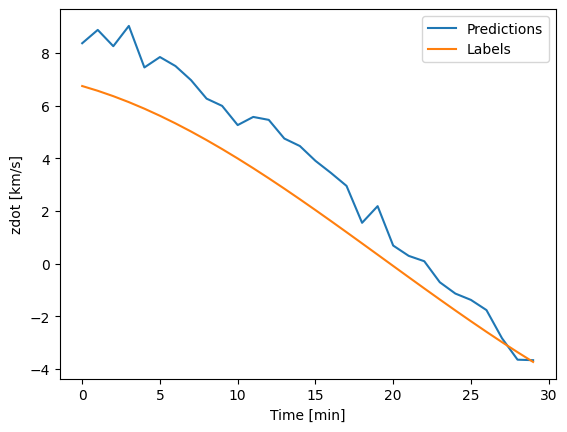

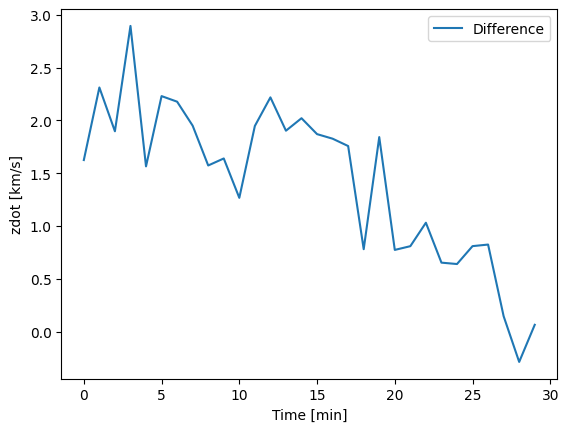

(32, 1000, 10)
(32, 30, 10)
(3004, 30, 10)


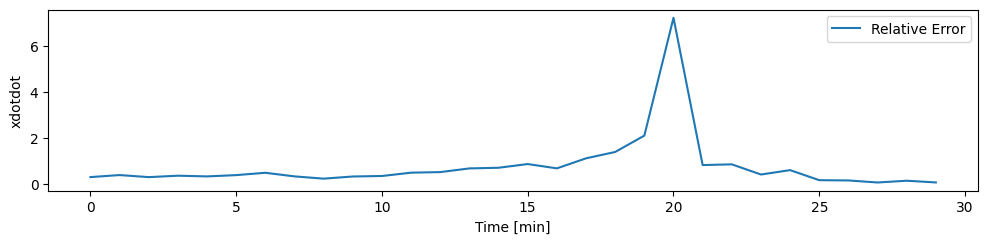

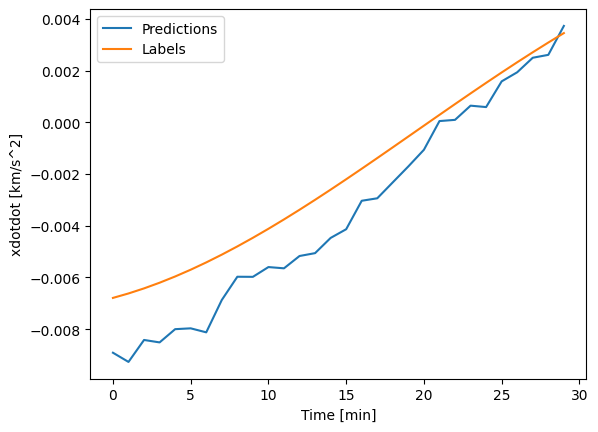

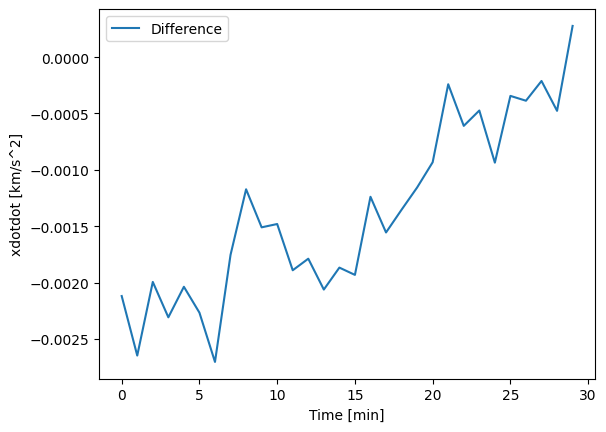

(32, 1000, 10)
(32, 30, 10)
(3004, 30, 10)


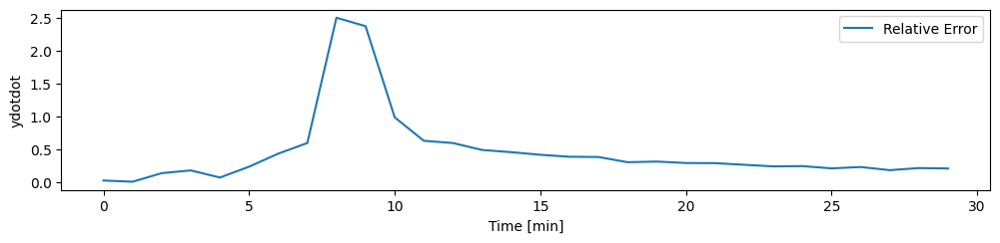

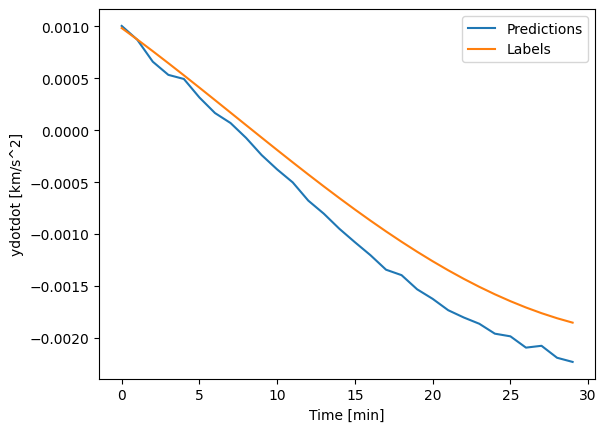

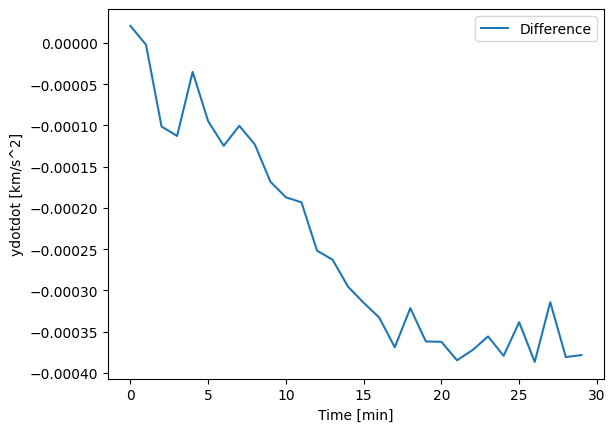

(32, 1000, 10)
(32, 30, 10)
(3004, 30, 10)


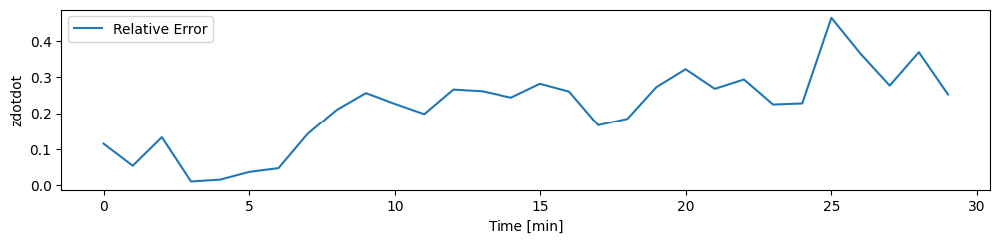

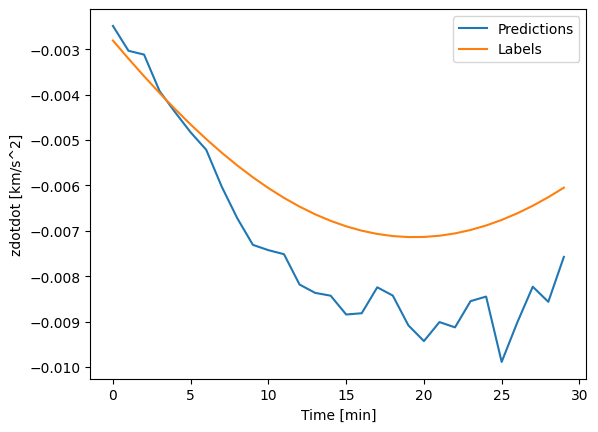

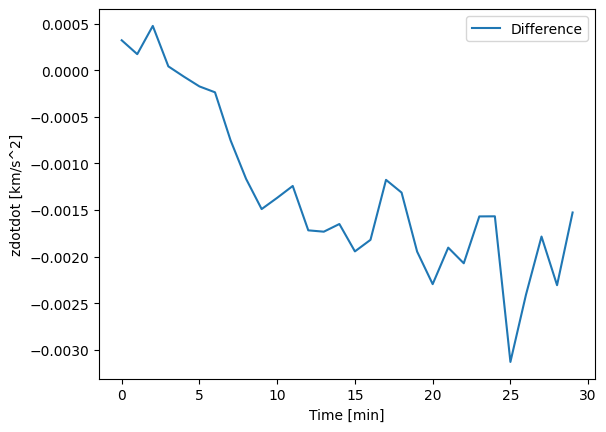

Mean Errors: 
X:  1420.8084716796875
Y:  248.23934936523438
Z:  1265.4935302734375
XDOT:  1.3710334300994873
YDOT:  0.20244400203227997
ZDOT:  1.4445394277572632
XDOTDOT:  0.0013911412097513676
YDOTDOT:  0.0002475773508194834
ZDOTDOT:  0.0013785531045868993


In [78]:
import IPython
import IPython.display
import os

#plot the difference between the real and the predicted values with the column as a parameter
def plot_diff_Dense(model, window, max_subplots=1, column=0, plot_col = "x", plot_units = "[km]"):
    
    #window.test?
    # print(window.test)
    inputs, labels = next(iter(window.test))
    
    inputs = inputs.numpy()
    labels = labels.numpy()
    predictions, physicalOutputs = model.predict(window.test)
    
    inputs = inputs * train_std_Dense[column] + train_mean_Dense[column]
    labels = labels * train_std_Dense[column] + train_mean_Dense[column]
    predictions  = predictions * train_std_Dense[column] + train_mean_Dense[column]
    
    print(inputs.shape)
    print(labels.shape)
    print(predictions.shape)

    plt.figure(figsize=(12, 8))
    max_n = min(max_subplots, len(inputs))


    for n in range(max_n):
            plt.subplot(3, 1, n+1)

            #fazer legendas diferentes para as velocidades
            plt.ylabel(plot_col)
            plt.plot(np.abs((predictions[n, :, column] - labels[n, :, column])/ labels[n, :, column]) ,label='Relative Error')
            plt.xlabel('Time [min]')
            plt.legend()
            plt.savefig(results_dir + 'pinn-training-relativeError-321632-' + plot_col + '.pdf')  
            plt.show()

            plt.ylabel(plot_col + ' ' + plot_units)
            plt.plot(predictions[n, :, column] ,label='Predictions')
            plt.plot(labels[n, :, column] ,label='Labels')
            plt.xlabel('Time [min]')
            plt.legend()
            plt.savefig(results_dir + 'pinn-training-PredictionsVSLabels-321632-' + plot_col + '.pdf')  
            plt.show()

            plt.ylabel(plot_col + ' ' + plot_units)
            plt.plot((predictions[n, :, column] - labels[n, :, column]) ,label='Difference')
            plt.xlabel('Time [min]')
            plt.legend()
            plt.savefig(results_dir + 'pinn-training-Difference-321632-' + plot_col + '.pdf')  
            plt.show()

plot_diff_Dense(modelTest_noInitialState_in1000_out30_321632_01, multi_window_Dense, column=0, plot_col = "time", plot_units = "[min]")
plot_diff_Dense(modelTest_noInitialState_in1000_out30_321632_01, multi_window_Dense, column=1, plot_col = "x", plot_units = "[km]")
plot_diff_Dense(modelTest_noInitialState_in1000_out30_321632_01, multi_window_Dense, column=2, plot_col = "y", plot_units = "[km]")
plot_diff_Dense(modelTest_noInitialState_in1000_out30_321632_01, multi_window_Dense, column=3, plot_col = "z", plot_units = "[km]")
plot_diff_Dense(modelTest_noInitialState_in1000_out30_321632_01, multi_window_Dense, column=4, plot_col = "xdot", plot_units = "[km/s]")
plot_diff_Dense(modelTest_noInitialState_in1000_out30_321632_01, multi_window_Dense, column=5, plot_col = "ydot", plot_units = "[km/s]")
plot_diff_Dense(modelTest_noInitialState_in1000_out30_321632_01, multi_window_Dense, column=6, plot_col = "zdot", plot_units = "[km/s]")
plot_diff_Dense(modelTest_noInitialState_in1000_out30_321632_01, multi_window_Dense, column=7, plot_col = "xdotdot", plot_units = "[km/s^2]")
plot_diff_Dense(modelTest_noInitialState_in1000_out30_321632_01, multi_window_Dense, column=8, plot_col = "ydotdot", plot_units = "[km/s^2]")
plot_diff_Dense(modelTest_noInitialState_in1000_out30_321632_01, multi_window_Dense, column=9, plot_col = "zdotdot", plot_units = "[km/s^2]")



#calculate the mean absolute error for each column
def calculateMeanErrors(model, window, max_subplots=1, column=0):
    
    #repeat this for 10 trials and calculate the mean error
    meanError = 0
    nrTrials = 7
    for i in range(nrTrials):
        inputs, labels = next(iter(window.test))
        inputs = inputs.numpy()
        labels = labels.numpy()
        predictions, physicalOutputs = model.predict(window.test)
        
        inputs = inputs * train_std_Dense[column] + train_mean_Dense[column]
        labels = labels * train_std_Dense[column] + train_mean_Dense[column]
        predictions  = predictions * train_std_Dense[column] + train_mean_Dense[column]
        
        meanError += np.mean(np.abs(predictions[0, :, column] - labels[0, :, column]))
    meanError = meanError/nrTrials
    return meanError


    # inputs, labels = next(iter(window.test))
    
    # inputs = inputs.numpy()
    # labels = labels.numpy()
    # predictions, physicalOutputs = model.predict(window.test)
    
    # inputs = inputs * train_std_Dense[column] + train_mean_Dense[column]
    # labels = labels * train_std_Dense[column] + train_mean_Dense[column]
    # predictions  = predictions * train_std_Dense[column] + train_mean_Dense[column]
    
    
    # meanError = np.mean(np.abs(predictions[0, :, column] - labels[0, :, column]))
    # return meanError
    
    
meanErrorX = calculateMeanErrors(modelTest_noInitialState_in1000_out30_321632_01, multi_window_Dense, column=1)
meanErrorY = calculateMeanErrors(modelTest_noInitialState_in1000_out30_321632_01, multi_window_Dense, column=2)
meanErrorZ = calculateMeanErrors(modelTest_noInitialState_in1000_out30_321632_01, multi_window_Dense, column=3)
meanErrorXDOT = calculateMeanErrors(modelTest_noInitialState_in1000_out30_321632_01, multi_window_Dense, column=4)
meanErrorYDOT = calculateMeanErrors(modelTest_noInitialState_in1000_out30_321632_01, multi_window_Dense, column=5)
meanErrorZDOT = calculateMeanErrors(modelTest_noInitialState_in1000_out30_321632_01, multi_window_Dense, column=6)
meanErrorXDOTDOT = calculateMeanErrors(modelTest_noInitialState_in1000_out30_321632_01, multi_window_Dense, column=7)
meanErrorYDOTDOT = calculateMeanErrors(modelTest_noInitialState_in1000_out30_321632_01, multi_window_Dense, column=8)
meanErrorZDOTDOT = calculateMeanErrors(modelTest_noInitialState_in1000_out30_321632_01, multi_window_Dense, column=9)

print("Mean Errors: ")
print("X: ", meanErrorX)
print("Y: ", meanErrorY)
print("Z: ", meanErrorZ)
print("XDOT: ", meanErrorXDOT)
print("YDOT: ", meanErrorYDOT)
print("ZDOT: ", meanErrorZDOT)
print("XDOTDOT: ", meanErrorXDOTDOT)
print("YDOTDOT: ", meanErrorYDOTDOT)
print("ZDOTDOT: ", meanErrorZDOTDOT)


### PINN (without initial state) IN 1000 OUT 30, 32 8 32 DENSE

In [79]:
class PhysicsInformedNN_noInitialState():
    def __init__(self, windowData, windowDataValidation):
        # data
        self.windowData = windowData
        self.windowDataValidation = windowDataValidation
        
        self.allLossesTraining = []
        self.allLossesValidation = []

        self.u_net_LossesTraining = []
        self.u_net_LossesValidation = []

        self.f_net_LossesTraining = []
        self.f_net_LossesValidation = []
        
        self.early_stopping_patience = 20 
        self.best_validation_loss = float('inf')

        # deep neural networks
        self.dnn = tf.keras.Sequential([
            # Shape [batch, time, features] => [batch, features]
            tf.keras.layers.Lambda(lambda x: x[:, -INPUT_STEPS:, :]),
            # tf.keras.layers.Flatten(input_shape=(1440, num_features)),
            
            # tf.keras.layers.Flatten(input_shape=(1440, 1)),
            
            tf.keras.layers.Dense(32, activation='LeakyReLU'),
            tf.keras.layers.Dense(8, activation='LeakyReLU'),
            tf.keras.layers.Dense(32, activation='LeakyReLU'),

            tf.keras.layers.Flatten(),
            # Shape => [batch, out_steps*num_outputs]
            tf.keras.layers.Dense(OUT_STEPS*num_features_Dense, kernel_initializer=tf.keras.initializers.HeNormal()),
            # Shape => [batch, out_steps, num_outputs]
            tf.keras.layers.Reshape([OUT_STEPS, num_features_Dense])
        ])
        
        # optimizers: using the same settings
        self.optimizer = tf.optimizers.Adam()
        
        self.iter = 0
        
    def net_u(self, windowData):  
        #remove the time
        # # windowData = windowData[:, :, :-1]
        # time = windowData[:, :, 0:1]
        # initial_state = windowData[:, :, 1:]
        #tf.concat([time, initial_state], axis=-1)
        u = self.dnn(windowData)
        # u = self.dnn(windowData)
        return u
    
    def net_f(self, time, data):
        """ The TensorFlow version of calculating residual """

        #change data to variable
        time = tf.Variable(time, dtype=tf.float32)
        data = tf.Variable(data, dtype=tf.float32)


        x = data[:, :, 0]
        y = data[:, :, 1]
        z = data[:, :, 2]
        xdot = data[:, :, 3]
        ydot = data[:, :, 4]
        zdot = data[:, :, 5]
        xdotdot = data[:, :, 6]
        ydotdot = data[:, :, 7]
        zdotdot = data[:, :, 8]

        def calculate_velocity(positions, vel, t):
            with tf.GradientTape(persistent=True) as tape:
                tape.watch(t)
                output = (positions*t)/t # Perform computation involving positions tensor and time tensor
            
            velocity = tape.gradient(output, t)
            return velocity

        x_dot = calculate_velocity(x, xdot, time)
        y_dot = calculate_velocity(y, ydot, time)
        z_dot = calculate_velocity(z, zdot, time)
        x_dot_dot = calculate_velocity(x_dot, None, time)
        y_dot_dot = calculate_velocity(y_dot, None, time)
        z_dot_dot = calculate_velocity(z_dot, None, time)

        
        #call SINDy to get the equations
        # model = getSindyEquations(data[:, :, 1:], data[:, :, 0])

        #create a tuple with the residual for each axis
        res_px = x_dot - xdot
        res_py = y_dot - ydot
        res_pz = z_dot - zdot
        # standardGravitationalParameter = 3.986004418 * 10**(5), using standardized  
        r = tf.sqrt(x**2 + y**2 + z**2)
        res_vx = x_dot_dot + standardGravitationalParameter * x/(r**3) 
        res_vy = y_dot_dot + standardGravitationalParameter * y/(r**3) 
        res_vz = z_dot_dot + standardGravitationalParameter * z/(r**3) 

        res_accX = x_dot_dot - xdotdot
        res_accY = y_dot_dot - ydotdot
        res_accZ = z_dot_dot - zdotdot


        #concatenate the residuals into a single tensor
        res = tf.concat([res_px, res_py, res_pz, res_vx, res_vy, res_vz, res_accX, res_accY, res_accZ], axis=1)
        # res = tf.concat([res_px, res_py, res_pz, res_vx, res_vy, res_vz], axis=1)

        return res
    
    def loss_func(self, inputs, labels, isTraining = True):
        with tf.GradientTape() as tape:
            tape.watch(self.dnn.trainable_variables)
            
            #separate the time from the rest of the data
            timeAux = tf.Variable(inputs[:, :, 0])
            # initial_state = inputs[:, 0, 1:]
            # inputs = inputs[:, :, 1:]
            # u_pred = self.net_u(timeAux)
            u_pred = self.net_u(inputs)
            #limit timeAux for each batch to the shape of the output of the neural network
            timeAux = timeAux[:, 0:labels.shape[1]]

            f_pred = self.net_f(timeAux, u_pred)

            #remove the time from the labels
            # labels = labels[:, :, 1:]
            loss_u = tf.reduce_mean(tf.square(labels - u_pred))
            loss_f = tf.reduce_mean(tf.square(f_pred))

            weightLoss = 0.1
            loss = (weightLoss * loss_u) + ((1-weightLoss) * loss_f)
        
        gradients = tape.gradient(loss, self.dnn.trainable_variables)
        self.optimizer.apply_gradients(zip(gradients, self.dnn.trainable_variables))
        
        self.iter += 1

        # if isTraining:
        #     self.allLossesTraining.append(loss.numpy())
        #     self.u_net_LossesTraining.append(loss_u.numpy())
        #     self.f_net_LossesTraining.append(loss_f.numpy())
        # else:
        #     self.allLossesValidation.append(loss.numpy())
        #     self.u_net_LossesValidation.append(loss_u.numpy())
        #     self.f_net_LossesValidation.append(loss_f.numpy())

        if self.iter % 100 == 0:
            print(
                'Iter %d, Loss: %.5e, Loss_u: %.5e, Loss_f: %.5e' % (self.iter, loss.numpy(), loss_u.numpy(), loss_f.numpy())
            )
            
        return loss.numpy(), loss_u.numpy(), loss_f.numpy()

    def validate(self):
        self.dnn.trainable = False
        loss_Aux = np.array([])
        lossU_Aux = np.array([])
        lossF_Aux = np.array([])
        for example_inputs, example_labels in self.windowDataValidation:
            loss, lossU, lossF = self.loss_func(example_inputs, example_labels, isTraining=False)
            
            loss_Aux = np.append(loss_Aux, loss)
            lossU_Aux = np.append(lossU_Aux, lossU)
            lossF_Aux = np.append(lossF_Aux, lossF)


        self.allLossesValidation.append(np.mean(loss_Aux))
        self.u_net_LossesValidation.append(np.mean(lossU_Aux))
        self.f_net_LossesValidation.append(np.mean(lossF_Aux))
    
    def build(self, input_shape):
        self.dnn.build(input_shape)

    def train(self):
        for epoch in range(200):
            print('EPOCH %d' % (epoch))
            print((np.array(self.windowData)))
            loss_Aux = np.array([])
            lossU_Aux = np.array([])
            lossF_Aux = np.array([])

            self.dnn.trainable = True
            for n, (example_inputs, example_labels) in enumerate(self.windowData):
                loss, lossU, lossF = self.loss_func(example_inputs, example_labels, isTraining=True)
                
                #store intermediate losses and then make mean to get the epoch loss
                loss_Aux = np.append(loss_Aux, loss)
                lossU_Aux = np.append(lossU_Aux, lossU)
                lossF_Aux = np.append(lossF_Aux, lossF)
            
            #first value was returning nan for the physical loss
            for i in range(0, len(loss_Aux)):
                if np.isnan(loss_Aux[i]):
                    loss_Aux[i] = loss_Aux[i + 1]
                if np.isnan(lossF_Aux[i]):
                    lossF_Aux[i] = lossF_Aux[i + 1]
                if np.isnan(lossU_Aux[i]):
                    lossU_Aux[i] = lossU_Aux[i + 1]
            
            self.allLossesTraining.append(np.mean(loss_Aux))
            self.u_net_LossesTraining.append(np.mean(lossU_Aux))
            self.f_net_LossesTraining.append(np.mean(lossF_Aux))
           
            self.validate()
            
            # Check if the validation loss has improved
            if self.allLossesValidation[-1] < self.best_validation_loss:
                self.best_validation_loss = self.allLossesValidation[-1]
                self.early_stopping_counter = 0
            else:
                self.early_stopping_counter += 1

            # Stop training if the validation loss hasn't improved for the specified patience
            if self.early_stopping_counter >= self.early_stopping_patience:
                print(f"Early stopping at epoch {epoch}")
                break

        self.dnn.trainable = False
                
    # def predict(self, X):
    #     self.dnn.trainable = False
    #     u = self.net_u(X)
    #     #select the time from the input
    #     time = X[:, :, 0]
    #     #60 = output steps da window
    #     time = time[:, 0:OUT_STEPS]
    #     f = self.net_f(time, u)
    #     u = u.numpy()
    #     f = f.numpy()
    #     return u, f

    def predict(self, X):
        self.dnn.trainable = False
        outputsU = []
        outputsF = []
        for inputs, labels in X:
            #separate the time from the rest of the data
            timeAux = tf.Variable(inputs[:, :, 0])
            u = self.net_u(inputs)
            time = timeAux[:, 0:OUT_STEPS]
            f = self.net_f(time, u)
            outputsU.append(u.numpy())
            outputsF.append(f.numpy())

        return np.concatenate(outputsU, axis=0), np.concatenate(outputsF, axis=0)

    def run_trial(self):
        self.allLossesTraining = []
        self.allLossesValidation = []
        self.best_validation_loss = float('inf')
        self.early_stopping_counter = 0
        self.build((32, INPUT_STEPS, 10))
        self.train()
        return self.allLossesTraining, self.allLossesValidation

    def plot_losses(self, graphics = "allLosses"):
        
        # allLossesTraining
        # u_net_LossesTraining
        # f_net_LossesTraining

        # allLossesValidation
        # u_net_LossesValidation
        # f_net_LossesValidation

        if graphics == "f_losses":
            plt.yscale('log')
            plt.plot(self.f_net_LossesTraining, label='Training Loss')
            plt.plot(self.f_net_LossesValidation, label='Validation Loss')
            plt.xlabel('Epoch')
            plt.ylabel('Loss')
            plt.title('Training and Validation Physical Loss')
            plt.legend()
            plt.show()
        elif graphics == "u_losses":
            plt.yscale('log')
            plt.plot(self.u_net_LossesTraining, label='Training Loss')
            plt.plot(self.u_net_LossesValidation, label='Validation Loss')
            plt.xlabel('Epoch')
            plt.ylabel('Loss')
            plt.title('Training and Validation Data Loss')
            plt.legend()
            plt.show()
        else:
            plt.yscale('log')
            plt.plot(self.allLossesTraining, label='Training Loss')
            plt.plot(self.allLossesValidation, label='Validation Loss')
            plt.xlabel('Epoch')
            plt.ylabel('Loss')
            plt.title('Training and Validation Total Loss')
            plt.legend()
            plt.show()

modelTest_noInitialState_in1000_out30_32832_01 = PhysicsInformedNN_noInitialState(multi_window_Dense.train, multi_window_Dense.val)
#build the model
#subtract one from the shape because the time is not an input
# modelTest.build(multi_window.example[0].shape)
# modelTest_noInitialState.build((32, INPUT_STEPS, 7))
# modelTest_noInitialState.train()


nrOfRuns = 4
all_losses_training_in1000_out30_32832_01 = []
all_losses_validation_in1000_out30_32832_01 = []
for _ in range(nrOfRuns):
    losses_training, losses_validation = modelTest_noInitialState_in1000_out30_32832_01.run_trial()
    all_losses_training_in1000_out30_32832_01.append(losses_training)
    all_losses_validation_in1000_out30_32832_01.append(losses_validation)

EPOCH 0
<MapDataset element_spec=(TensorSpec(shape=(None, 1000, 10), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 10), dtype=tf.float32, name=None))>
Iter 100, Loss: 1.21813e+02, Loss_u: 1.74494e-04, Loss_f: 1.35348e+02
Iter 200, Loss: 1.31986e+02, Loss_u: 1.03132e-04, Loss_f: 1.46652e+02
Iter 300, Loss: 3.78069e+01, Loss_u: 7.91291e-03, Loss_f: 4.20068e+01
Iter 400, Loss: 8.58836e+00, Loss_u: 7.62978e-03, Loss_f: 9.54178e+00
EPOCH 1
<MapDataset element_spec=(TensorSpec(shape=(None, 1000, 10), dtype=tf.float32, name=None), TensorSpec(shape=(None, 30, 10), dtype=tf.float32, name=None))>
Iter 500, Loss: 8.91631e+01, Loss_u: 2.25318e-04, Loss_f: 9.90701e+01
Iter 600, Loss: 2.20258e+02, Loss_u: 3.37302e-05, Loss_f: 2.44731e+02
Iter 700, Loss: 9.82973e+01, Loss_u: 2.69328e-05, Loss_f: 1.09219e+02
Iter 800, Loss: 1.40439e+01, Loss_u: 3.29104e-01, Loss_f: 1.55678e+01
EPOCH 2
<MapDataset element_spec=(TensorSpec(shape=(None, 1000, 10), dtype=tf.float32, name=None), TensorSpec(shap

C:\Users\jpfun\AppData\Local\Temp\ipykernel_50240\2831128618.py:9: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  all_losses_training_in1000_out30_32832_01 = np.array(all_losses_training_in1000_out30_32832_01)
C:\Users\jpfun\AppData\Local\Temp\ipykernel_50240\2831128618.py:10: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  all_losses_validation_in1000_out30_32832_01 = np.array(all_losses_validation_in1000_out30_32832_01)
c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\numpy\lib\nanfunctions.py:1670: RuntimeWarning: Degrees 

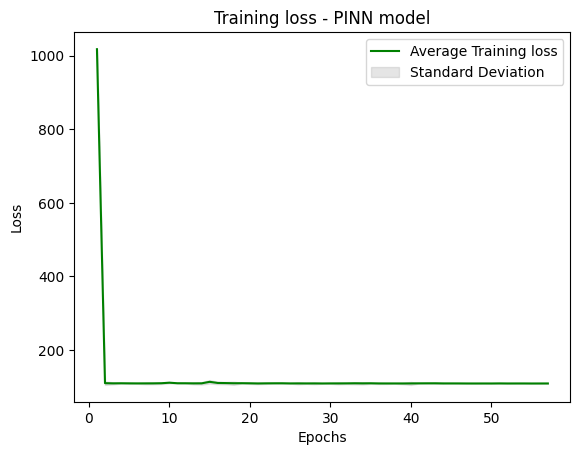

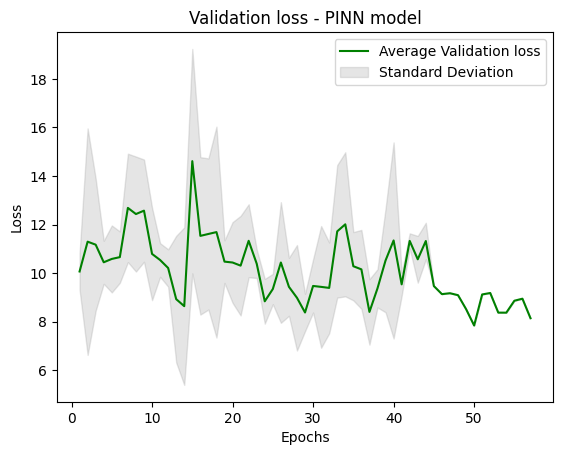

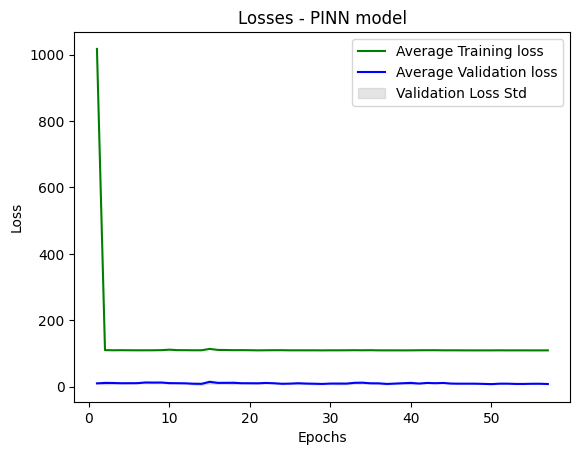

In [80]:
from itertools import zip_longest
import os

current_dir = os.getcwd()
results_dir = os.path.join(current_dir, 'PINN/wAccel/32832/In1000_Out30/01/')
if not os.path.isdir(results_dir):
    os.makedirs(results_dir)

all_losses_training_in1000_out30_32832_01 = np.array(all_losses_training_in1000_out30_32832_01)
all_losses_validation_in1000_out30_32832_01 = np.array(all_losses_validation_in1000_out30_32832_01)

avg_loss_training = [np.mean([x[i] for x in all_losses_training_in1000_out30_32832_01 if len(x) > i]) for i in range(len(max(all_losses_training_in1000_out30_32832_01,key=len)))]
std_loss_training = np.nan_to_num(np.nanstd(np.array(list(zip_longest(*all_losses_training_in1000_out30_32832_01)),dtype=float),axis=1,ddof=1), copy=False)

avg_loss_validation = [np.mean([x[i] for x in all_losses_validation_in1000_out30_32832_01 if len(x) > i]) for i in range(len(max(all_losses_validation_in1000_out30_32832_01,key=len)))]
std_loss_validation = np.nan_to_num(np.nanstd(np.array(list(zip_longest(*all_losses_validation_in1000_out30_32832_01)),dtype=float),axis=1,ddof=1), copy=False)

# Plot the average losses with shaded standard deviation
#create vector of 1 to length of avg_loss_training for x-axis
epochNrs = np.arange(1, len(avg_loss_training)+1, 1)
plt.plot(epochNrs, avg_loss_training, 'g', label='Average Training loss')
plt.fill_between(epochNrs, avg_loss_training - std_loss_validation, avg_loss_training + std_loss_validation, color='gray', alpha=0.2, label='Standard Deviation')
plt.title('Training loss - PINN model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig(results_dir + 'pinn-training-loss-32832.pdf')  
plt.show()

epochNrs = np.arange(1, len(avg_loss_validation)+1, 1)
plt.plot(epochNrs, avg_loss_validation, 'g', label='Average Validation loss')
plt.fill_between(epochNrs, avg_loss_validation - std_loss_validation, avg_loss_validation + std_loss_validation, color='gray', alpha=0.2, label='Standard Deviation')
plt.title('Validation loss - PINN model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig(results_dir + 'pinn-validation-loss-32832.pdf')  
plt.show()

epochNrs = np.arange(1, len(avg_loss_validation)+1, 1)
plt.plot(epochNrs, avg_loss_training, 'g', label='Average Training loss')
plt.plot(epochNrs, avg_loss_validation, 'b', label='Average Validation loss')
plt.fill_between(epochNrs, avg_loss_validation - std_loss_validation, avg_loss_validation + std_loss_validation, color='gray', alpha=0.2, label='Validation Loss Std')
plt.title('Losses - PINN model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig(results_dir + 'dense-allLosses-32832.pdf')  
plt.show()

(32, 1000, 10)
(32, 30, 10)
(3004, 30, 10)


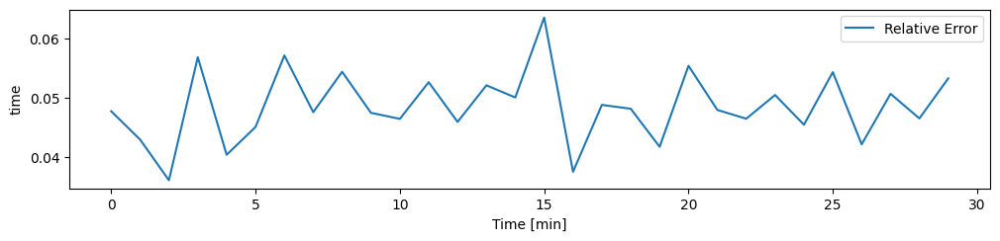

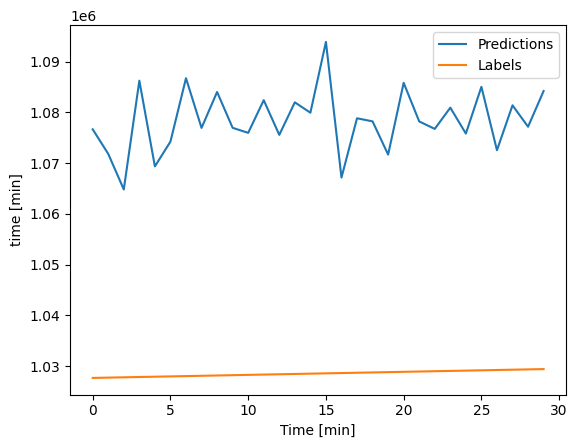

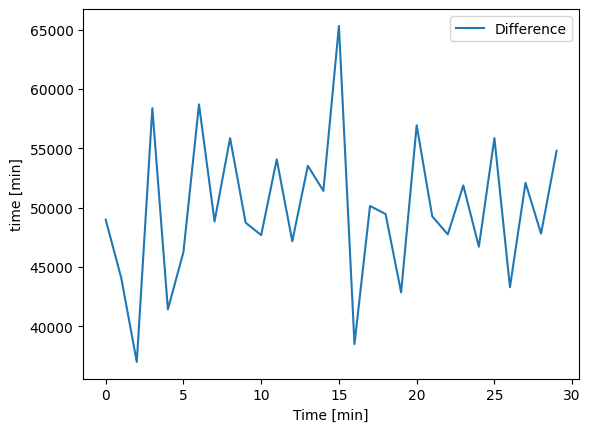

(32, 1000, 10)
(32, 30, 10)
(3004, 30, 10)


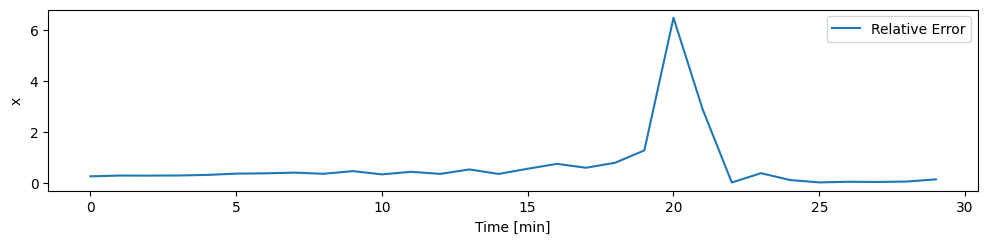

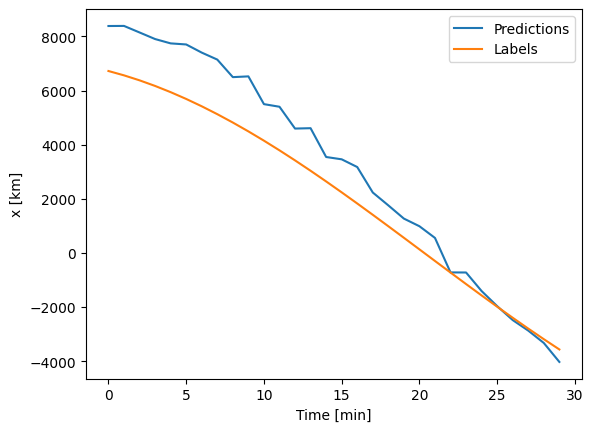

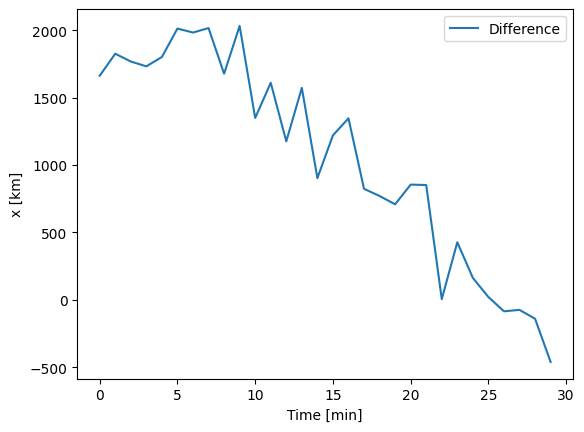

(32, 1000, 10)
(32, 30, 10)
(3004, 30, 10)


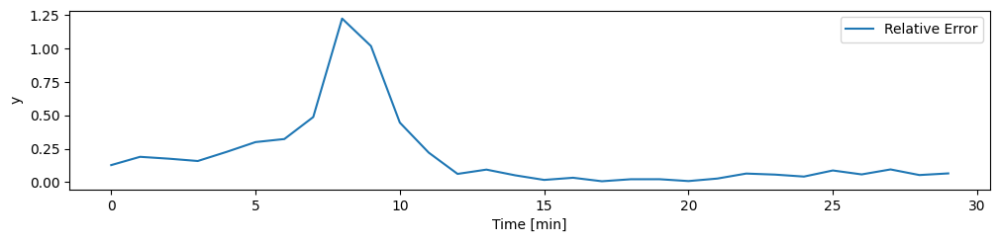

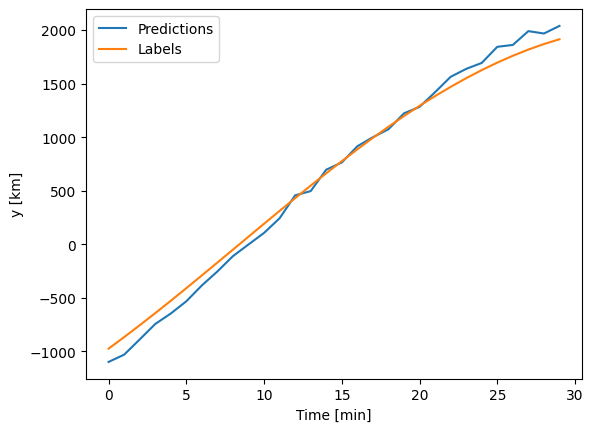

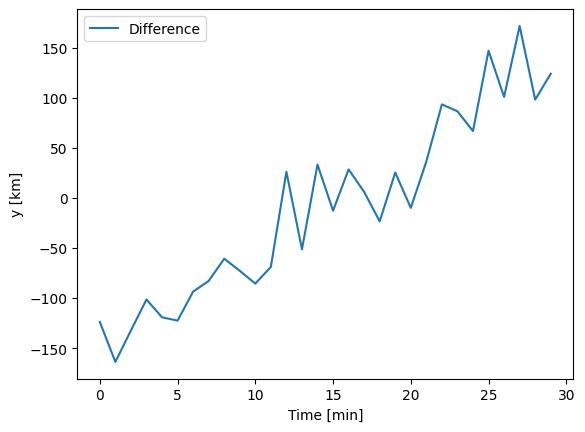

(32, 1000, 10)
(32, 30, 10)
(3004, 30, 10)


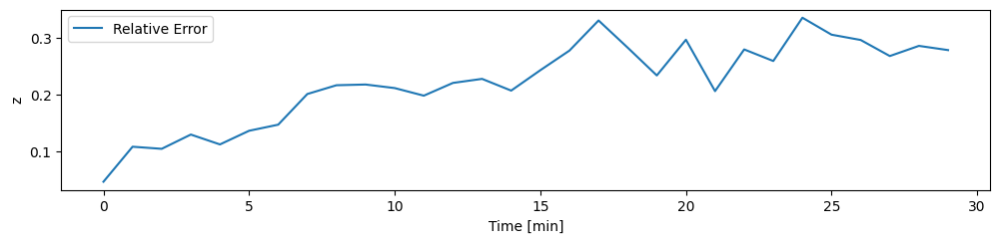

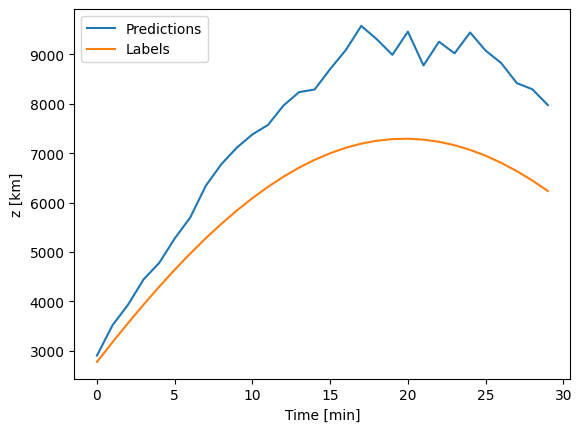

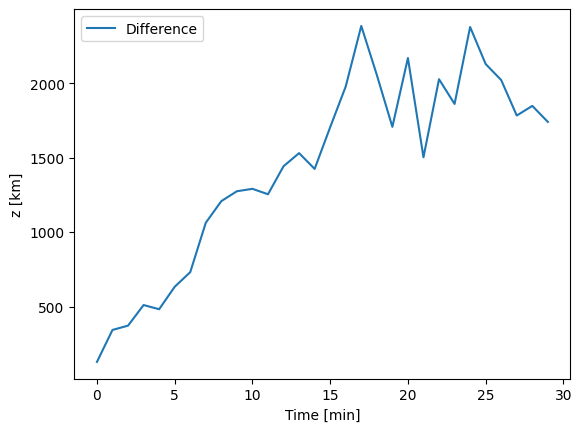

(32, 1000, 10)
(32, 30, 10)
(3004, 30, 10)


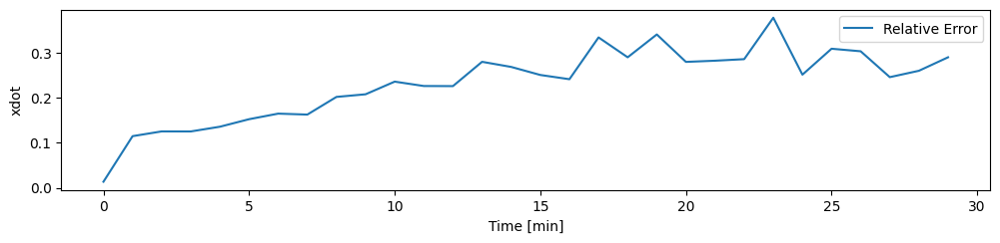

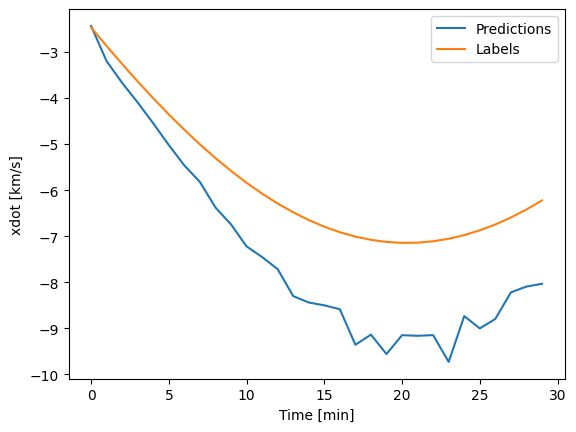

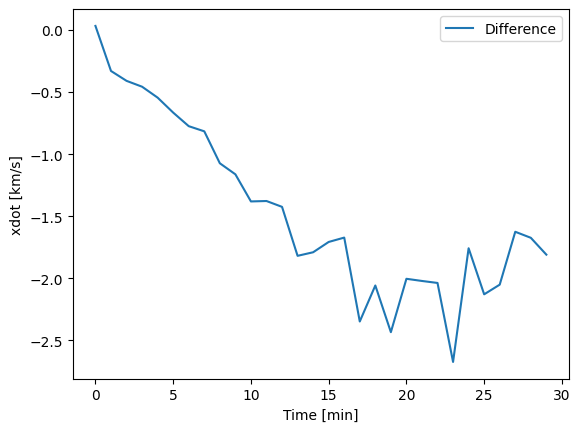

(32, 1000, 10)
(32, 30, 10)
(3004, 30, 10)


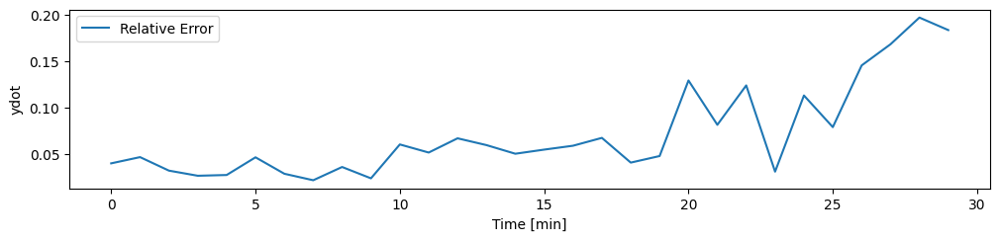

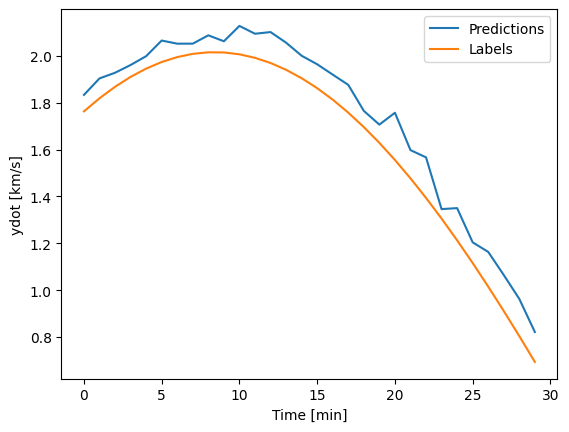

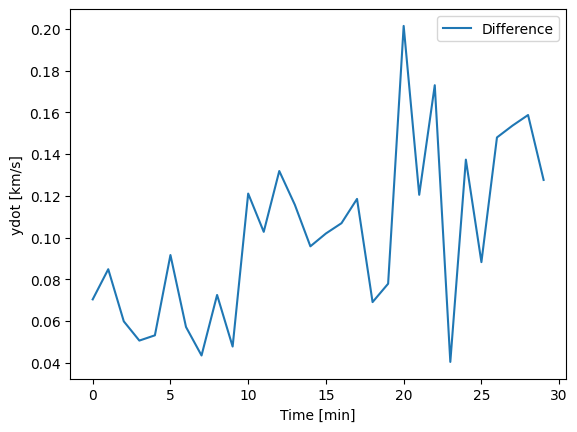

(32, 1000, 10)
(32, 30, 10)
(3004, 30, 10)


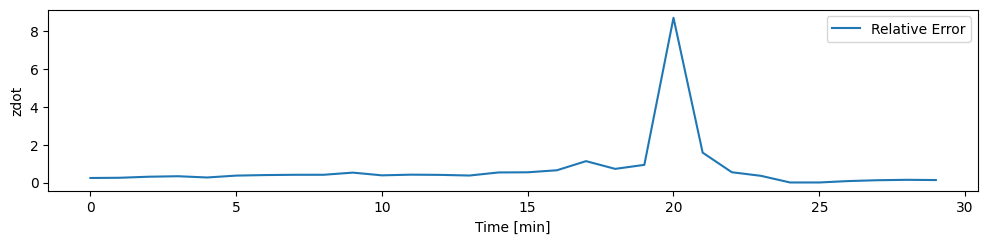

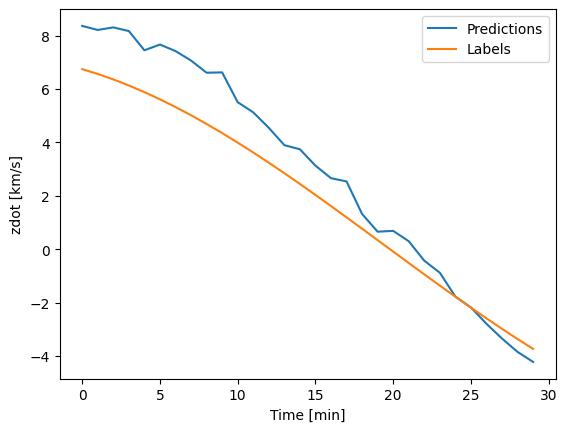

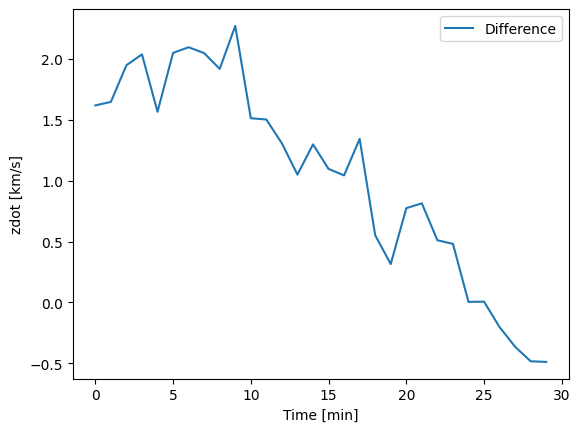

(32, 1000, 10)
(32, 30, 10)
(3004, 30, 10)


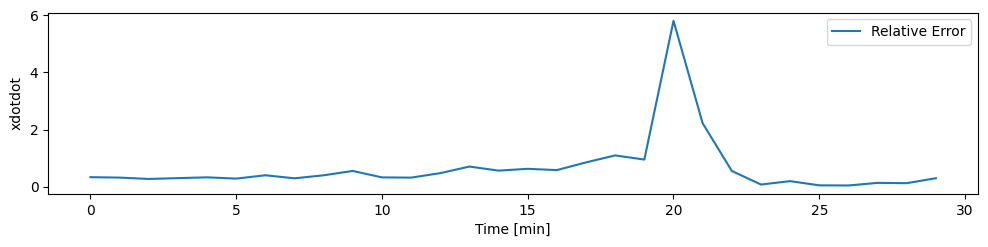

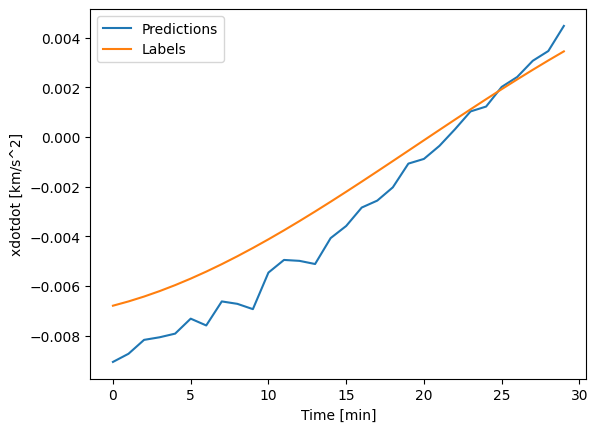

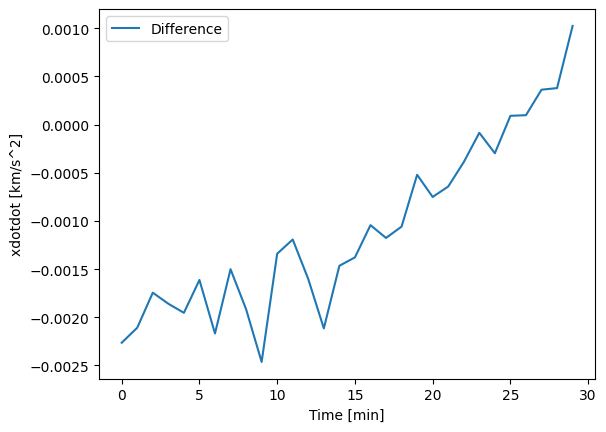

(32, 1000, 10)
(32, 30, 10)
(3004, 30, 10)


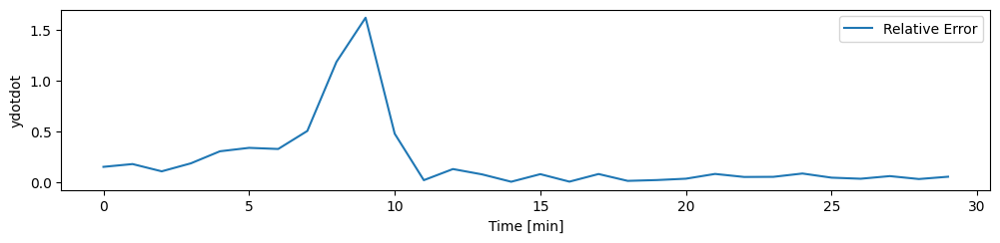

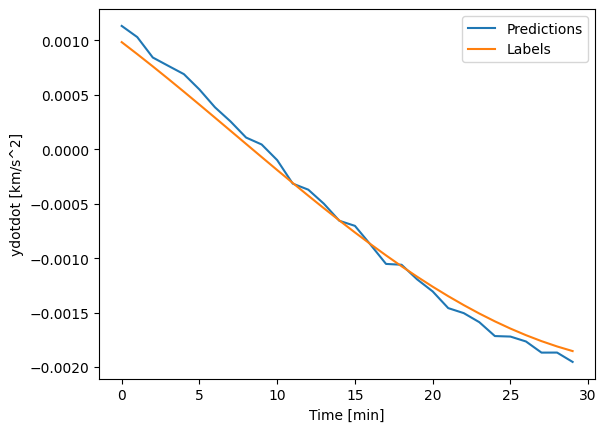

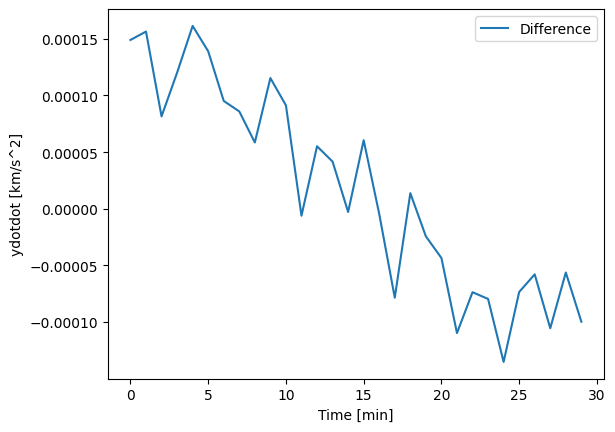

(32, 1000, 10)
(32, 30, 10)
(3004, 30, 10)


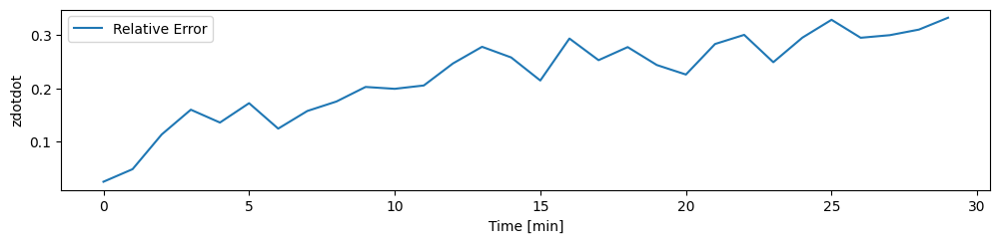

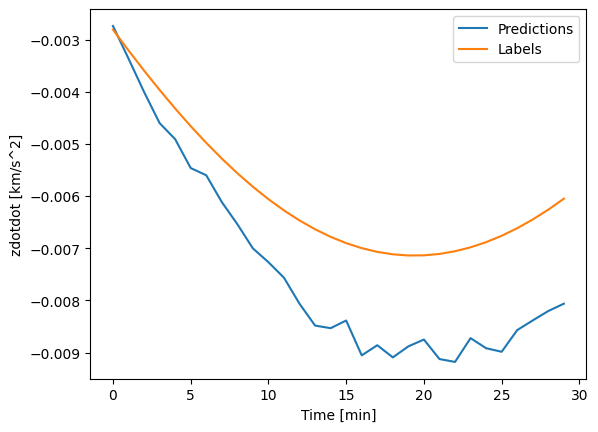

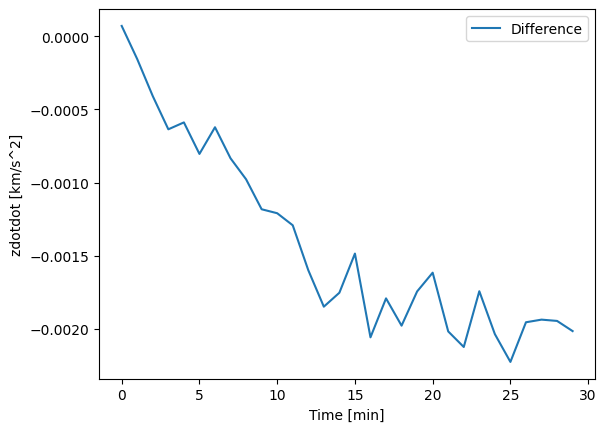

Mean Errors: 
X:  1102.52734375
Y:  79.06266784667969
Z:  1432.2193603515625
XDOT:  1.4684568643569946
YDOT:  0.10072933882474899
ZDOT:  1.1453455686569214
XDOTDOT:  0.0012201311765238643
YDOTDOT:  7.917677430668846e-05
ZDOTDOT:  0.001420766580849886


In [81]:
import IPython
import IPython.display
import os

#plot the difference between the real and the predicted values with the column as a parameter
def plot_diff_Dense(model, window, max_subplots=1, column=0, plot_col = "x", plot_units = "[km]"):
    
    #window.test?
    # print(window.test)
    inputs, labels = next(iter(window.test))
    
    inputs = inputs.numpy()
    labels = labels.numpy()
    predictions, physicalOutputs = model.predict(window.test)
    
    inputs = inputs * train_std_Dense[column] + train_mean_Dense[column]
    labels = labels * train_std_Dense[column] + train_mean_Dense[column]
    predictions  = predictions * train_std_Dense[column] + train_mean_Dense[column]
    
    print(inputs.shape)
    print(labels.shape)
    print(predictions.shape)

    plt.figure(figsize=(12, 8))
    max_n = min(max_subplots, len(inputs))


    for n in range(max_n):
            plt.subplot(3, 1, n+1)

            #fazer legendas diferentes para as velocidades
            plt.ylabel(plot_col)
            plt.plot(np.abs((predictions[n, :, column] - labels[n, :, column])/ labels[n, :, column]) ,label='Relative Error')
            plt.xlabel('Time [min]')
            plt.legend()
            plt.savefig(results_dir + 'pinn-training-relativeError-32832-' + plot_col + '.pdf')  
            plt.show()

            plt.ylabel(plot_col + ' ' + plot_units)
            plt.plot(predictions[n, :, column] ,label='Predictions')
            plt.plot(labels[n, :, column] ,label='Labels')
            plt.xlabel('Time [min]')
            plt.legend()
            plt.savefig(results_dir + 'pinn-training-PredictionsVSLabels-32832-' + plot_col + '.pdf')  
            plt.show()

            plt.ylabel(plot_col + ' ' + plot_units)
            plt.plot((predictions[n, :, column] - labels[n, :, column]) ,label='Difference')
            plt.xlabel('Time [min]')
            plt.legend()
            plt.savefig(results_dir + 'pinn-training-Difference-32832-' + plot_col + '.pdf')  
            plt.show()

plot_diff_Dense(modelTest_noInitialState_in1000_out30_32832_01, multi_window_Dense, column=0, plot_col = "time", plot_units = "[min]")
plot_diff_Dense(modelTest_noInitialState_in1000_out30_32832_01, multi_window_Dense, column=1, plot_col = "x", plot_units = "[km]")
plot_diff_Dense(modelTest_noInitialState_in1000_out30_32832_01, multi_window_Dense, column=2, plot_col = "y", plot_units = "[km]")
plot_diff_Dense(modelTest_noInitialState_in1000_out30_32832_01, multi_window_Dense, column=3, plot_col = "z", plot_units = "[km]")
plot_diff_Dense(modelTest_noInitialState_in1000_out30_32832_01, multi_window_Dense, column=4, plot_col = "xdot", plot_units = "[km/s]")
plot_diff_Dense(modelTest_noInitialState_in1000_out30_32832_01, multi_window_Dense, column=5, plot_col = "ydot", plot_units = "[km/s]")
plot_diff_Dense(modelTest_noInitialState_in1000_out30_32832_01, multi_window_Dense, column=6, plot_col = "zdot", plot_units = "[km/s]")
plot_diff_Dense(modelTest_noInitialState_in1000_out30_32832_01, multi_window_Dense, column=7, plot_col = "xdotdot", plot_units = "[km/s^2]")
plot_diff_Dense(modelTest_noInitialState_in1000_out30_32832_01, multi_window_Dense, column=8, plot_col = "ydotdot", plot_units = "[km/s^2]")
plot_diff_Dense(modelTest_noInitialState_in1000_out30_32832_01, multi_window_Dense, column=9, plot_col = "zdotdot", plot_units = "[km/s^2]")



#calculate the mean absolute error for each column
def calculateMeanErrors(model, window, max_subplots=1, column=0):
    
    #repeat this for 10 trials and calculate the mean error
    meanError = 0
    nrTrials = 7
    for i in range(nrTrials):
        inputs, labels = next(iter(window.test))
        inputs = inputs.numpy()
        labels = labels.numpy()
        predictions, physicalOutputs = model.predict(window.test)
        
        inputs = inputs * train_std_Dense[column] + train_mean_Dense[column]
        labels = labels * train_std_Dense[column] + train_mean_Dense[column]
        predictions  = predictions * train_std_Dense[column] + train_mean_Dense[column]
        
        meanError += np.mean(np.abs(predictions[0, :, column] - labels[0, :, column]))
    meanError = meanError/nrTrials
    return meanError


    # inputs, labels = next(iter(window.test))
    
    # inputs = inputs.numpy()
    # labels = labels.numpy()
    # predictions, physicalOutputs = model.predict(window.test)
    
    # inputs = inputs * train_std_Dense[column] + train_mean_Dense[column]
    # labels = labels * train_std_Dense[column] + train_mean_Dense[column]
    # predictions  = predictions * train_std_Dense[column] + train_mean_Dense[column]
    
    
    # meanError = np.mean(np.abs(predictions[0, :, column] - labels[0, :, column]))
    # return meanError
    
    
meanErrorX = calculateMeanErrors(modelTest_noInitialState_in1000_out30_32832_01, multi_window_Dense, column=1)
meanErrorY = calculateMeanErrors(modelTest_noInitialState_in1000_out30_32832_01, multi_window_Dense, column=2)
meanErrorZ = calculateMeanErrors(modelTest_noInitialState_in1000_out30_32832_01, multi_window_Dense, column=3)
meanErrorXDOT = calculateMeanErrors(modelTest_noInitialState_in1000_out30_32832_01, multi_window_Dense, column=4)
meanErrorYDOT = calculateMeanErrors(modelTest_noInitialState_in1000_out30_32832_01, multi_window_Dense, column=5)
meanErrorZDOT = calculateMeanErrors(modelTest_noInitialState_in1000_out30_32832_01, multi_window_Dense, column=6)
meanErrorXDOTDOT = calculateMeanErrors(modelTest_noInitialState_in1000_out30_32832_01, multi_window_Dense, column=7)
meanErrorYDOTDOT = calculateMeanErrors(modelTest_noInitialState_in1000_out30_32832_01, multi_window_Dense, column=8)
meanErrorZDOTDOT = calculateMeanErrors(modelTest_noInitialState_in1000_out30_32832_01, multi_window_Dense, column=9)

print("Mean Errors: ")
print("X: ", meanErrorX)
print("Y: ", meanErrorY)
print("Z: ", meanErrorZ)
print("XDOT: ", meanErrorXDOT)
print("YDOT: ", meanErrorYDOT)
print("ZDOT: ", meanErrorZDOT)
print("XDOTDOT: ", meanErrorXDOTDOT)
print("YDOTDOT: ", meanErrorYDOTDOT)
print("ZDOTDOT: ", meanErrorZDOTDOT)


# UPDATED MORE STEPS

### PINN IN 2000 OUT 240 32 16 32 0.1

In [41]:
#minutes in two days = 2880
#minutes in a day = 1440

#prev = 1000
INPUT_STEPS = 2000
OUT_STEPS = 240
multi_window_PINN = WindowGenerator(input_width=INPUT_STEPS,
                               label_width=OUT_STEPS,
                               shift=OUT_STEPS,
                               label_columns=['time', 'x', 'y', 'z', 'xdot', 'ydot', 'zdot', 'xdotdot', 'ydotdot', 'zdotdot'],
                               train_df=train_df_PINN,
                               val_df=val_df_PINN,
                               test_df=test_df_PINN)

multi_window_Dense = WindowGenerator(input_width=INPUT_STEPS,
                                label_width=OUT_STEPS,
                                shift=OUT_STEPS,
                                label_columns=['time', 'x', 'y', 'z', 'xdot', 'ydot', 'zdot'],
                                train_df=train_df_Dense,
                                val_df=val_df_Dense,
                                test_df=test_df_Dense)

multi_val_performance_PINN = {}
multi_performance_PINN = {}

multi_val_performance_Dense = {}
multi_performance_Dense = {}


In [42]:
class PhysicsInformedNN_noInitialState():
    def __init__(self, windowData, windowDataValidation):
        # data
        self.windowData = windowData
        self.windowDataValidation = windowDataValidation
        
        self.allLossesTraining = []
        self.allLossesValidation = []

        self.u_net_LossesTraining = []
        self.u_net_LossesValidation = []

        self.f_net_LossesTraining = []
        self.f_net_LossesValidation = []
        
        self.early_stopping_patience = 20 
        self.best_validation_loss = float('inf')

        # deep neural networks
        self.dnn = tf.keras.Sequential([
            # Shape [batch, time, features] => [batch, features]
            tf.keras.layers.Lambda(lambda x: x[:, -INPUT_STEPS:, :]),
            # tf.keras.layers.Flatten(input_shape=(1440, num_features)),
            
            # tf.keras.layers.Flatten(input_shape=(1440, 1)),
            
            tf.keras.layers.Dense(32, activation='LeakyReLU'),
            tf.keras.layers.Dense(16, activation='LeakyReLU'),
            tf.keras.layers.Dense(32, activation='LeakyReLU'),

            tf.keras.layers.Flatten(),
            # Shape => [batch, out_steps*num_outputs]
            tf.keras.layers.Dense(OUT_STEPS*num_features_Dense, kernel_initializer=tf.keras.initializers.HeNormal()),
            # Shape => [batch, out_steps, num_outputs]
            tf.keras.layers.Reshape([OUT_STEPS, num_features_Dense])
        ])
        
        # optimizers: using the same settings
        self.optimizer = tf.optimizers.Adam()
        
        self.iter = 0
        
    def net_u(self, windowData):  
        #remove the time
        # # windowData = windowData[:, :, :-1]
        # time = windowData[:, :, 0:1]
        # initial_state = windowData[:, :, 1:]
        #tf.concat([time, initial_state], axis=-1)
        u = self.dnn(windowData)
        # u = self.dnn(windowData)
        return u
    
    def net_f(self, time, data):
        """ The TensorFlow version of calculating residual """

        #change data to variable
        time = tf.Variable(time, dtype=tf.float32)
        data = tf.Variable(data, dtype=tf.float32)


        x = data[:, :, 0]
        y = data[:, :, 1]
        z = data[:, :, 2]
        xdot = data[:, :, 3]
        ydot = data[:, :, 4]
        zdot = data[:, :, 5]
        # xdotdot = data[:, :, 6]
        # ydotdot = data[:, :, 7]
        # zdotdot = data[:, :, 8]

        def calculate_velocity(positions, vel, t):
            with tf.GradientTape(persistent=True) as tape:
                tape.watch(t)
                output = (positions*t)/t # Perform computation involving positions tensor and time tensor
            
            velocity = tape.gradient(output, t)
            return velocity

        x_dot = calculate_velocity(x, xdot, time)
        y_dot = calculate_velocity(y, ydot, time)
        z_dot = calculate_velocity(z, zdot, time)
        x_dot_dot = calculate_velocity(x_dot, None, time)
        y_dot_dot = calculate_velocity(y_dot, None, time)
        z_dot_dot = calculate_velocity(z_dot, None, time)

        
        #call SINDy to get the equations
        # model = getSindyEquations(data[:, :, 1:], data[:, :, 0])

        #create a tuple with the residual for each axis
        res_px = x_dot - xdot
        res_py = y_dot - ydot
        res_pz = z_dot - zdot
        # standardGravitationalParameter = 3.986004418 * 10**(5), using standardized  
        r = tf.sqrt(x**2 + y**2 + z**2)
        res_vx = x_dot_dot + standardGravitationalParameter * x/(r**3) 
        res_vy = y_dot_dot + standardGravitationalParameter * y/(r**3) 
        res_vz = z_dot_dot + standardGravitationalParameter * z/(r**3) 

        # res_accX = x_dot_dot - xdotdot
        # res_accY = y_dot_dot - ydotdot
        # res_accZ = z_dot_dot - zdotdot


        #concatenate the residuals into a single tensor
        # res = tf.concat([res_px, res_py, res_pz, res_vx, res_vy, res_vz, res_accX, res_accY, res_accZ], axis=1)
        res = tf.concat([res_px, res_py, res_pz, res_vx, res_vy, res_vz], axis=1)

        return res
    
    def loss_func(self, inputs, labels, isTraining = True):
        with tf.GradientTape() as tape:
            tape.watch(self.dnn.trainable_variables)
            
            #separate the time from the rest of the data
            timeAux = tf.Variable(inputs[:, :, 0])
            # initial_state = inputs[:, 0, 1:]
            # inputs = inputs[:, :, 1:]
            # u_pred = self.net_u(timeAux)
            u_pred = self.net_u(inputs)
            #limit timeAux for each batch to the shape of the output of the neural network
            timeAux = timeAux[:, 0:labels.shape[1]]

            f_pred = self.net_f(timeAux, u_pred)

            #remove the time from the labels
            # labels = labels[:, :, 1:]
            loss_u = tf.reduce_mean(tf.square(labels - u_pred))
            loss_f = tf.reduce_mean(tf.square(f_pred))

            weightLoss = 0.1
            loss = (weightLoss * loss_u) + ((1-weightLoss) * loss_f)
        
        gradients = tape.gradient(loss, self.dnn.trainable_variables)
        self.optimizer.apply_gradients(zip(gradients, self.dnn.trainable_variables))
        
        self.iter += 1

        # if isTraining:
        #     self.allLossesTraining.append(loss.numpy())
        #     self.u_net_LossesTraining.append(loss_u.numpy())
        #     self.f_net_LossesTraining.append(loss_f.numpy())
        # else:
        #     self.allLossesValidation.append(loss.numpy())
        #     self.u_net_LossesValidation.append(loss_u.numpy())
        #     self.f_net_LossesValidation.append(loss_f.numpy())

        if self.iter % 100 == 0:
            print(
                'Iter %d, Loss: %.5e, Loss_u: %.5e, Loss_f: %.5e' % (self.iter, loss.numpy(), loss_u.numpy(), loss_f.numpy())
            )
            
        return loss.numpy(), loss_u.numpy(), loss_f.numpy()

    def validate(self):
        self.dnn.trainable = False
        loss_Aux = np.array([])
        lossU_Aux = np.array([])
        lossF_Aux = np.array([])
        for example_inputs, example_labels in self.windowDataValidation:
            loss, lossU, lossF = self.loss_func(example_inputs, example_labels, isTraining=False)
            
            loss_Aux = np.append(loss_Aux, loss)
            lossU_Aux = np.append(lossU_Aux, lossU)
            lossF_Aux = np.append(lossF_Aux, lossF)


        self.allLossesValidation.append(np.mean(loss_Aux))
        self.u_net_LossesValidation.append(np.mean(lossU_Aux))
        self.f_net_LossesValidation.append(np.mean(lossF_Aux))
    
    def build(self, input_shape):
        self.dnn.build(input_shape)

    def train(self):
        for epoch in range(200):
            print('EPOCH %d' % (epoch))
            print((np.array(self.windowData)))
            loss_Aux = np.array([])
            lossU_Aux = np.array([])
            lossF_Aux = np.array([])

            self.dnn.trainable = True
            for n, (example_inputs, example_labels) in enumerate(self.windowData):
                loss, lossU, lossF = self.loss_func(example_inputs, example_labels, isTraining=True)
                
                #store intermediate losses and then make mean to get the epoch loss
                loss_Aux = np.append(loss_Aux, loss)
                lossU_Aux = np.append(lossU_Aux, lossU)
                lossF_Aux = np.append(lossF_Aux, lossF)
            
            #first value was returning nan for the physical loss
            for i in range(0, len(loss_Aux)):
                if np.isnan(loss_Aux[i]):
                    loss_Aux[i] = loss_Aux[i + 1]
                if np.isnan(lossF_Aux[i]):
                    lossF_Aux[i] = lossF_Aux[i + 1]
                if np.isnan(lossU_Aux[i]):
                    lossU_Aux[i] = lossU_Aux[i + 1]
            
            self.allLossesTraining.append(np.mean(loss_Aux))
            self.u_net_LossesTraining.append(np.mean(lossU_Aux))
            self.f_net_LossesTraining.append(np.mean(lossF_Aux))
           
            self.validate()
            
            # Check if the validation loss has improved
            if self.allLossesValidation[-1] < self.best_validation_loss:
                self.best_validation_loss = self.allLossesValidation[-1]
                self.early_stopping_counter = 0
            else:
                self.early_stopping_counter += 1

            # Stop training if the validation loss hasn't improved for the specified patience
            if self.early_stopping_counter >= self.early_stopping_patience:
                print(f"Early stopping at epoch {epoch}")
                break

        self.dnn.trainable = False
                
    # def predict(self, X):
    #     self.dnn.trainable = False
    #     u = self.net_u(X)
    #     #select the time from the input
    #     time = X[:, :, 0]
    #     #60 = output steps da window
    #     time = time[:, 0:OUT_STEPS]
    #     f = self.net_f(time, u)
    #     u = u.numpy()
    #     f = f.numpy()
    #     return u, f

    def predict(self, X):
        self.dnn.trainable = False
        outputsU = []
        outputsF = []
        for inputs, labels in X:
            #separate the time from the rest of the data
            timeAux = tf.Variable(inputs[:, :, 0])
            u = self.net_u(inputs)
            time = timeAux[:, 0:OUT_STEPS]
            f = self.net_f(time, u)
            outputsU.append(u.numpy())
            outputsF.append(f.numpy())

        return np.concatenate(outputsU, axis=0), np.concatenate(outputsF, axis=0)

    def run_trial(self):
        self.allLossesTraining = []
        self.allLossesValidation = []
        self.best_validation_loss = float('inf')
        self.early_stopping_counter = 0
        self.build((32, INPUT_STEPS, 7))
        self.train()
        return self.allLossesTraining, self.allLossesValidation

    def plot_losses(self, graphics = "allLosses"):
        
        # allLossesTraining
        # u_net_LossesTraining
        # f_net_LossesTraining

        # allLossesValidation
        # u_net_LossesValidation
        # f_net_LossesValidation

        if graphics == "f_losses":
            plt.yscale('log')
            plt.plot(self.f_net_LossesTraining, label='Training Loss')
            plt.plot(self.f_net_LossesValidation, label='Validation Loss')
            plt.xlabel('Epoch')
            plt.ylabel('Loss')
            plt.title('Training and Validation Physical Loss')
            plt.legend()
            plt.show()
        elif graphics == "u_losses":
            plt.yscale('log')
            plt.plot(self.u_net_LossesTraining, label='Training Loss')
            plt.plot(self.u_net_LossesValidation, label='Validation Loss')
            plt.xlabel('Epoch')
            plt.ylabel('Loss')
            plt.title('Training and Validation Data Loss')
            plt.legend()
            plt.show()
        else:
            plt.yscale('log')
            plt.plot(self.allLossesTraining, label='Training Loss')
            plt.plot(self.allLossesValidation, label='Validation Loss')
            plt.xlabel('Epoch')
            plt.ylabel('Loss')
            plt.title('Training and Validation Total Loss')
            plt.legend()
            plt.show()

modelTest_noInitialState_in2000_out240_321632_01 = PhysicsInformedNN_noInitialState(multi_window_Dense.train, multi_window_Dense.val)
#build the model
#subtract one from the shape because the time is not an input
# modelTest.build(multi_window.example[0].shape)
# modelTest_noInitialState.build((32, INPUT_STEPS, 7))
# modelTest_noInitialState.train()


nrOfRuns = 7
all_losses_training_in2000_out240_321632_01 = []
all_losses_validation_in2000_out240_321632_01 = []
for _ in range(nrOfRuns):
    losses_training, losses_validation = modelTest_noInitialState_in2000_out240_321632_01.run_trial()
    all_losses_training_in2000_out240_321632_01.append(losses_training)
    all_losses_validation_in2000_out240_321632_01.append(losses_validation)

EPOCH 0
<MapDataset element_spec=(TensorSpec(shape=(None, 2000, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 240, 7), dtype=tf.float32, name=None))>
Iter 100, Loss: 2.79513e+02, Loss_u: 7.59733e-04, Loss_f: 3.10570e+02
Iter 200, Loss: 1.73106e+02, Loss_u: 1.34619e-04, Loss_f: 1.92340e+02
Iter 300, Loss: 4.08956e+01, Loss_u: 1.37526e-03, Loss_f: 4.54394e+01
EPOCH 1
<MapDataset element_spec=(TensorSpec(shape=(None, 2000, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 240, 7), dtype=tf.float32, name=None))>
Iter 400, Loss: 1.31297e+02, Loss_u: 1.18064e-03, Loss_f: 1.45885e+02
Iter 500, Loss: 2.90621e+02, Loss_u: 9.62891e-05, Loss_f: 3.22912e+02
Iter 600, Loss: 1.08901e+02, Loss_u: 7.53387e-05, Loss_f: 1.21001e+02
Iter 700, Loss: 1.10634e+01, Loss_u: 5.26016e-03, Loss_f: 1.22921e+01
EPOCH 2
<MapDataset element_spec=(TensorSpec(shape=(None, 2000, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 240, 7), dtype=tf.float32, name=None))>
Iter 800, Loss: 2.16328e

C:\Users\jpfun\AppData\Local\Temp\ipykernel_50240\1445649473.py:9: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  all_losses_training_in2000_out240_321632_01 = np.array(all_losses_training_in2000_out240_321632_01)
C:\Users\jpfun\AppData\Local\Temp\ipykernel_50240\1445649473.py:10: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  all_losses_validation_in2000_out240_321632_01 = np.array(all_losses_validation_in2000_out240_321632_01)
c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\numpy\lib\nanfunctions.py:1670: RuntimeWarning: 

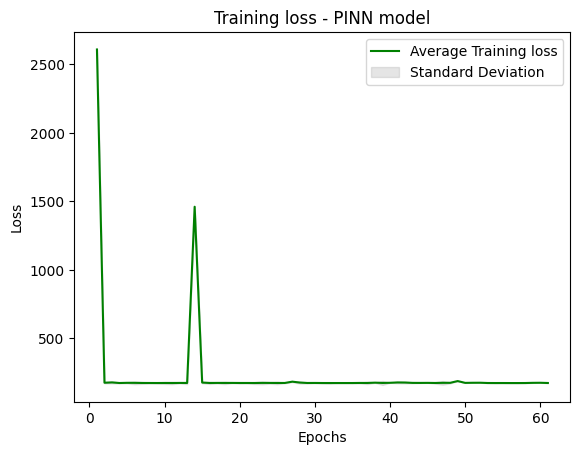

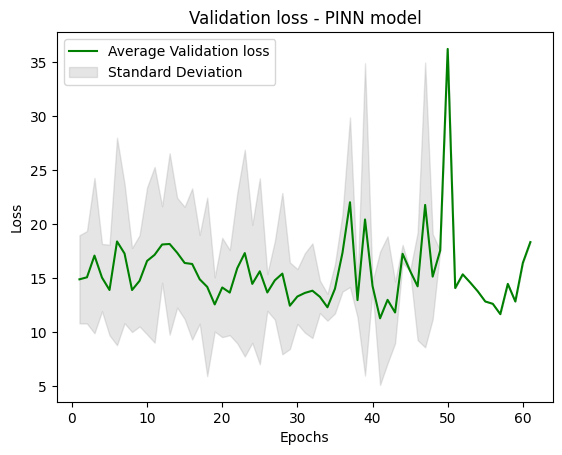

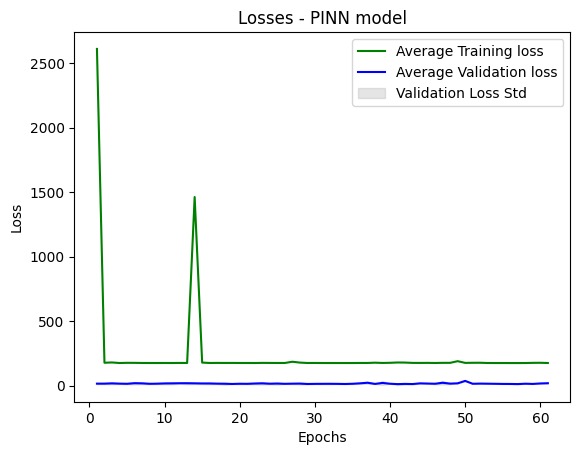

In [43]:
from itertools import zip_longest
import os

current_dir = os.getcwd()
results_dir = os.path.join(current_dir, 'PINN/321632/In2000_Out240/01/')
if not os.path.isdir(results_dir):
    os.makedirs(results_dir)

all_losses_training_in2000_out240_321632_01 = np.array(all_losses_training_in2000_out240_321632_01)
all_losses_validation_in2000_out240_321632_01 = np.array(all_losses_validation_in2000_out240_321632_01)

avg_loss_training = [np.mean([x[i] for x in all_losses_training_in2000_out240_321632_01 if len(x) > i]) for i in range(len(max(all_losses_training_in2000_out240_321632_01,key=len)))]
std_loss_training = np.nan_to_num(np.nanstd(np.array(list(zip_longest(*all_losses_training_in2000_out240_321632_01)),dtype=float),axis=1,ddof=1), copy=False)

avg_loss_validation = [np.mean([x[i] for x in all_losses_validation_in2000_out240_321632_01 if len(x) > i]) for i in range(len(max(all_losses_validation_in2000_out240_321632_01,key=len)))]
std_loss_validation = np.nan_to_num(np.nanstd(np.array(list(zip_longest(*all_losses_validation_in2000_out240_321632_01)),dtype=float),axis=1,ddof=1), copy=False)

# Plot the average losses with shaded standard deviation
#create vector of 1 to length of avg_loss_training for x-axis
epochNrs = np.arange(1, len(avg_loss_training)+1, 1)
plt.plot(epochNrs, avg_loss_training, 'g', label='Average Training loss')
plt.fill_between(epochNrs, avg_loss_training - std_loss_validation, avg_loss_training + std_loss_validation, color='gray', alpha=0.2, label='Standard Deviation')
plt.title('Training loss - PINN model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig(results_dir + 'pinn-training-loss-321632.pdf')  
plt.show()

epochNrs = np.arange(1, len(avg_loss_validation)+1, 1)
plt.plot(epochNrs, avg_loss_validation, 'g', label='Average Validation loss')
plt.fill_between(epochNrs, avg_loss_validation - std_loss_validation, avg_loss_validation + std_loss_validation, color='gray', alpha=0.2, label='Standard Deviation')
plt.title('Validation loss - PINN model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig(results_dir + 'pinn-validation-loss-321632.pdf')  
plt.show()

epochNrs = np.arange(1, len(avg_loss_validation)+1, 1)
plt.plot(epochNrs, avg_loss_training, 'g', label='Average Training loss')
plt.plot(epochNrs, avg_loss_validation, 'b', label='Average Validation loss')
plt.fill_between(epochNrs, avg_loss_validation - std_loss_validation, avg_loss_validation + std_loss_validation, color='gray', alpha=0.2, label='Validation Loss Std')
plt.title('Losses - PINN model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig(results_dir + 'dense-allLosses-321632.pdf')  
plt.show()

(32, 2000, 7)
(32, 240, 7)
(1794, 240, 7)


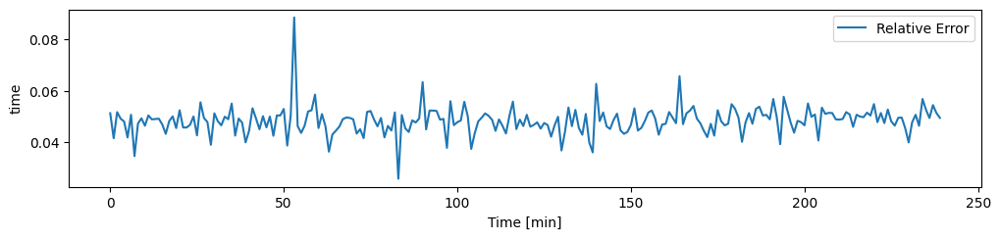

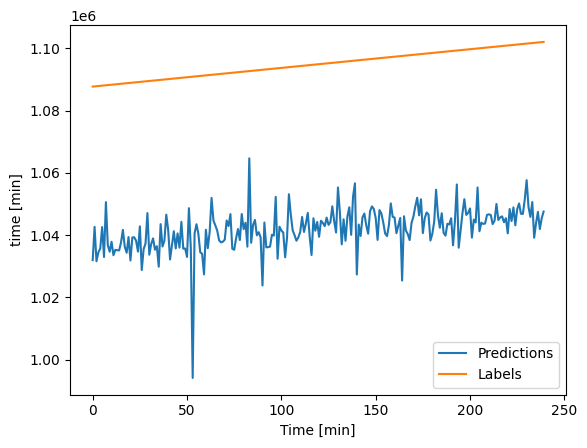

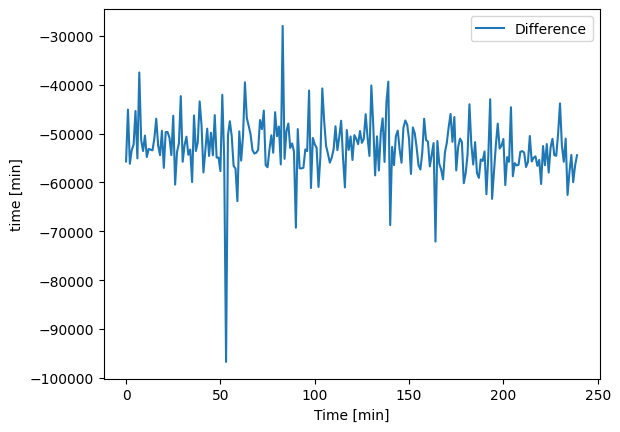

(32, 2000, 7)
(32, 240, 7)
(1794, 240, 7)


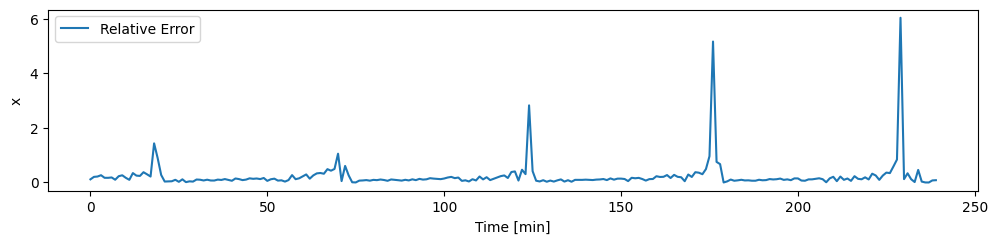

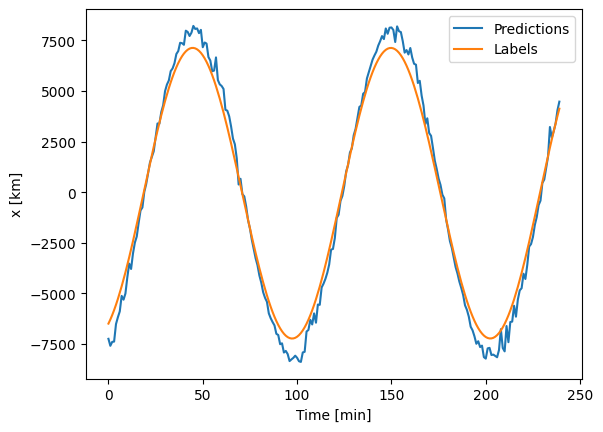

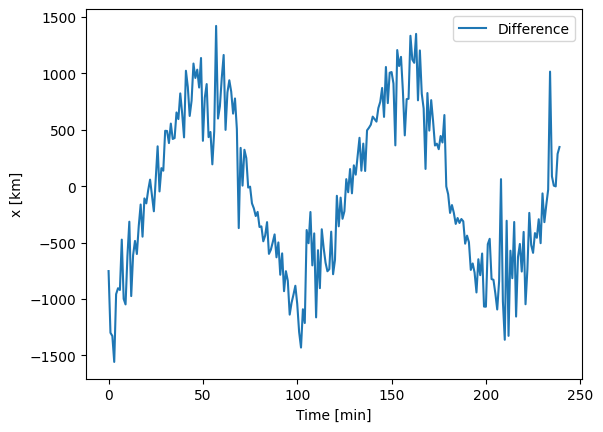

(32, 2000, 7)
(32, 240, 7)
(1794, 240, 7)


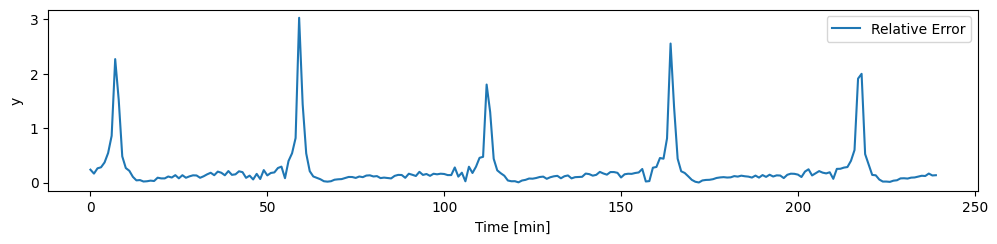

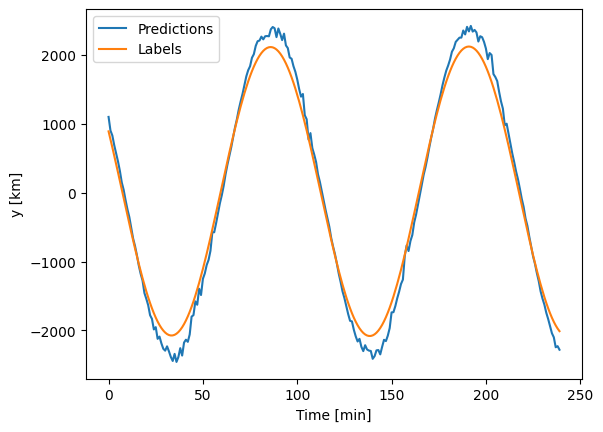

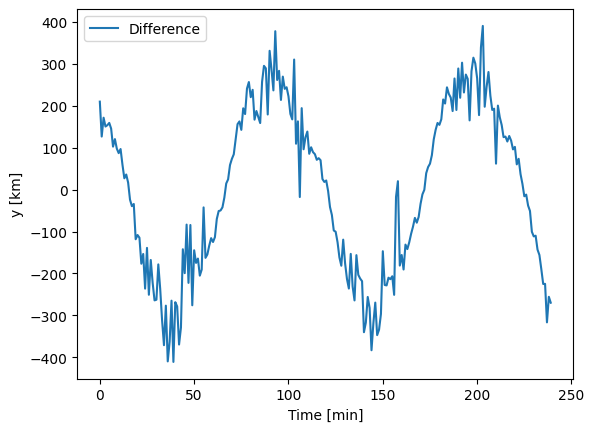

(32, 2000, 7)
(32, 240, 7)
(1794, 240, 7)


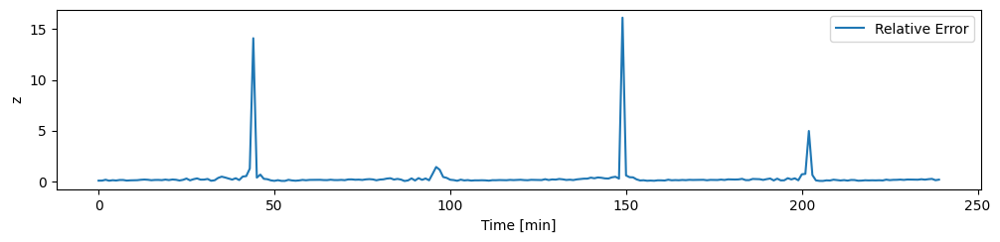

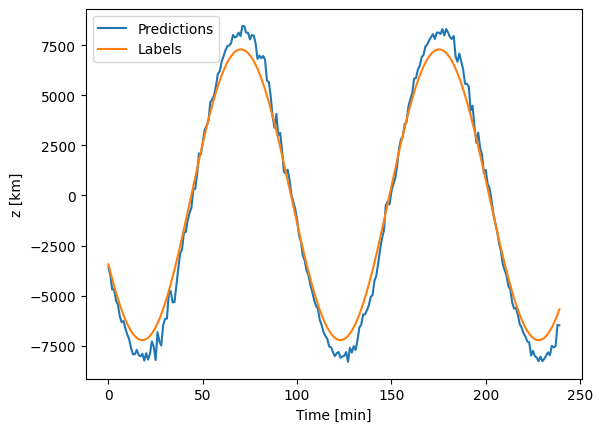

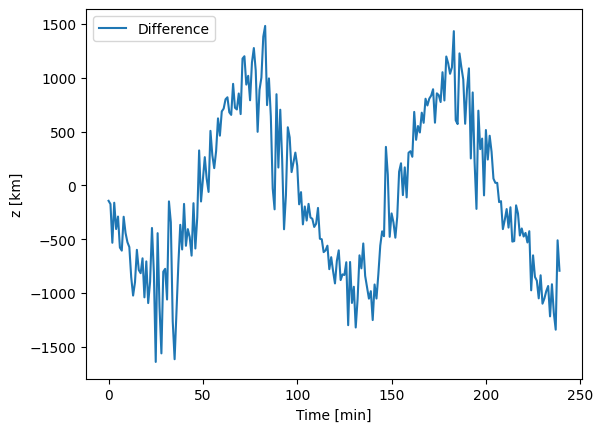

(32, 2000, 7)
(32, 240, 7)
(1794, 240, 7)


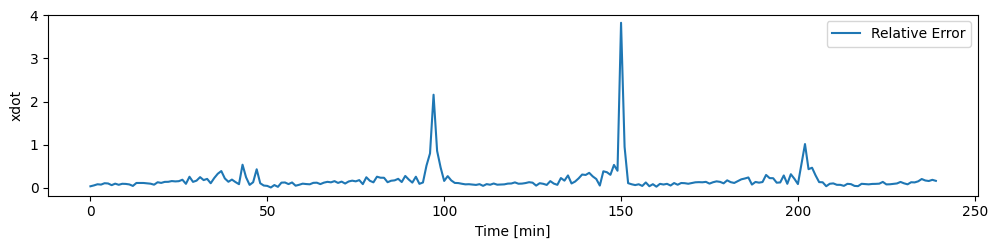

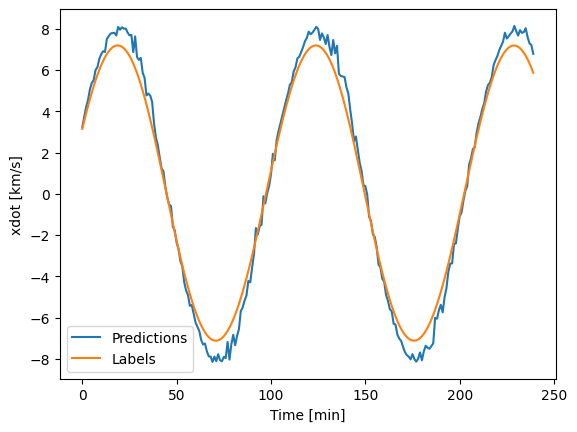

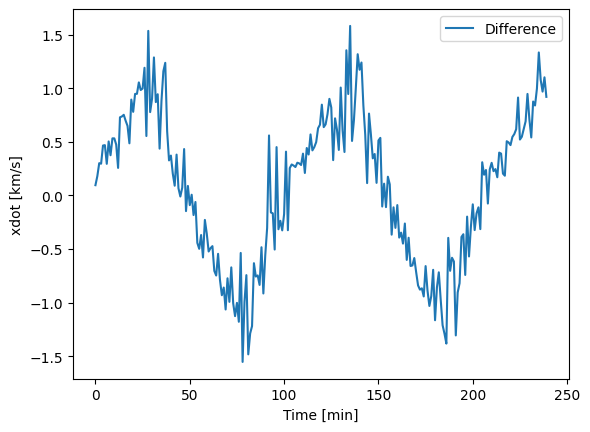

(32, 2000, 7)
(32, 240, 7)
(1794, 240, 7)


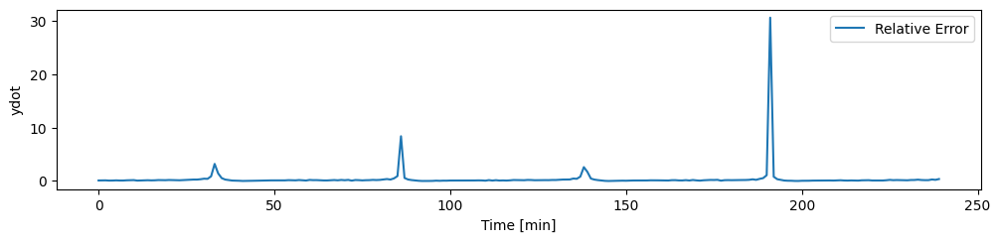

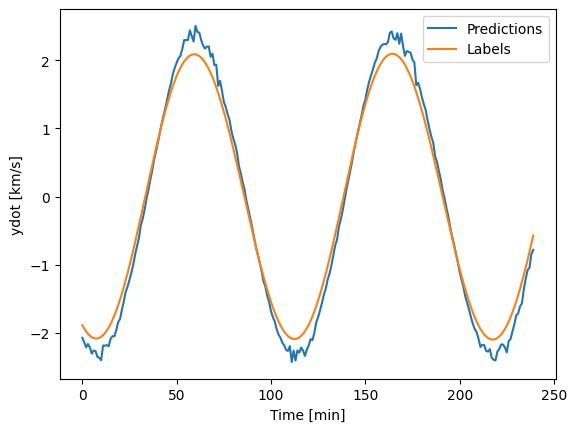

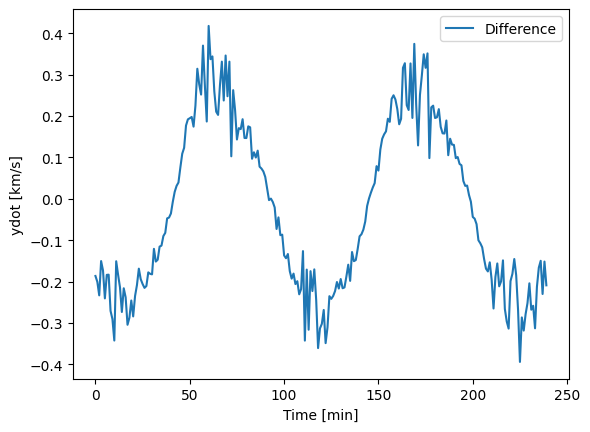

(32, 2000, 7)
(32, 240, 7)
(1794, 240, 7)


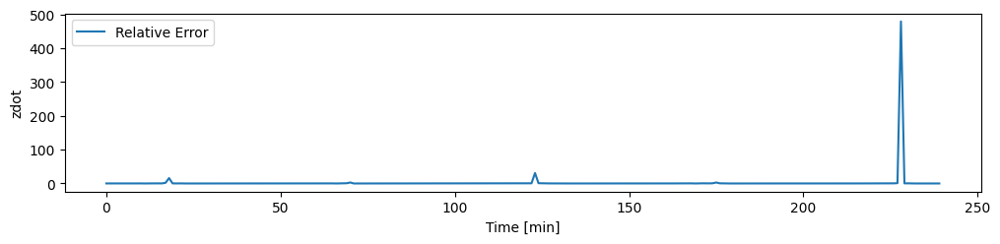

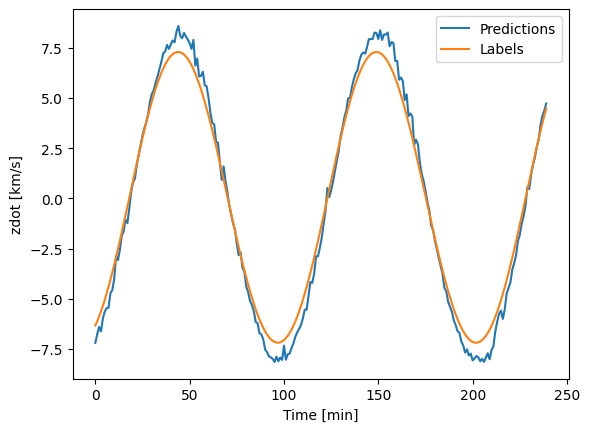

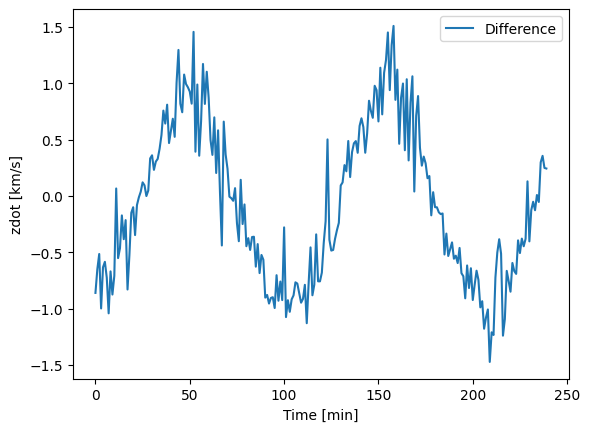

Mean Errors: 
X:  593.4152221679688
Y:  169.92764282226562
Z:  628.8485717773438
XDOT:  0.6006402969360352
YDOT:  0.1819656491279602
ZDOT:  0.5890697240829468


In [44]:
import IPython
import IPython.display
import os

#plot the difference between the real and the predicted values with the column as a parameter
def plot_diff_Dense(model, window, max_subplots=1, column=0, plot_col = "x", plot_units = "[km]"):
    
    #window.test?
    # print(window.test)
    inputs, labels = next(iter(window.test))
    
    inputs = inputs.numpy()
    labels = labels.numpy()
    predictions, physicalOutputs = model.predict(window.test)
    
    inputs = inputs * train_std_Dense[column] + train_mean_Dense[column]
    labels = labels * train_std_Dense[column] + train_mean_Dense[column]
    predictions  = predictions * train_std_Dense[column] + train_mean_Dense[column]
    
    print(inputs.shape)
    print(labels.shape)
    print(predictions.shape)

    plt.figure(figsize=(12, 8))
    max_n = min(max_subplots, len(inputs))


    for n in range(max_n):
            plt.subplot(3, 1, n+1)

            #fazer legendas diferentes para as velocidades
            plt.ylabel(plot_col)
            plt.plot(np.abs((predictions[n, :, column] - labels[n, :, column])/ labels[n, :, column]) ,label='Relative Error')
            plt.xlabel('Time [min]')
            plt.legend()
            plt.savefig(results_dir + 'pinn-training-relativeError-321632-' + plot_col + '.pdf')  
            plt.show()

            plt.ylabel(plot_col + ' ' + plot_units)
            plt.plot(predictions[n, :, column] ,label='Predictions')
            plt.plot(labels[n, :, column] ,label='Labels')
            plt.xlabel('Time [min]')
            plt.legend()
            plt.savefig(results_dir + 'pinn-training-PredictionsVSLabels-321632-' + plot_col + '.pdf')  
            plt.show()

            plt.ylabel(plot_col + ' ' + plot_units)
            plt.plot((predictions[n, :, column] - labels[n, :, column]) ,label='Difference')
            plt.xlabel('Time [min]')
            plt.legend()
            plt.savefig(results_dir + 'pinn-training-Difference-321632-' + plot_col + '.pdf')  
            plt.show()

plot_diff_Dense(modelTest_noInitialState_in2000_out240_321632_01, multi_window_Dense, column=0, plot_col = "time", plot_units = "[min]")
plot_diff_Dense(modelTest_noInitialState_in2000_out240_321632_01, multi_window_Dense, column=1, plot_col = "x", plot_units = "[km]")
plot_diff_Dense(modelTest_noInitialState_in2000_out240_321632_01, multi_window_Dense, column=2, plot_col = "y", plot_units = "[km]")
plot_diff_Dense(modelTest_noInitialState_in2000_out240_321632_01, multi_window_Dense, column=3, plot_col = "z", plot_units = "[km]")
plot_diff_Dense(modelTest_noInitialState_in2000_out240_321632_01, multi_window_Dense, column=4, plot_col = "xdot", plot_units = "[km/s]")
plot_diff_Dense(modelTest_noInitialState_in2000_out240_321632_01, multi_window_Dense, column=5, plot_col = "ydot", plot_units = "[km/s]")
plot_diff_Dense(modelTest_noInitialState_in2000_out240_321632_01, multi_window_Dense, column=6, plot_col = "zdot", plot_units = "[km/s]")



#calculate the mean absolute error for each column
def calculateMeanErrors(model, window, max_subplots=1, column=0):
    
    #repeat this for 10 trials and calculate the mean error
    meanError = 0
    nrTrials = 7
    for i in range(nrTrials):
        inputs, labels = next(iter(window.test))
        inputs = inputs.numpy()
        labels = labels.numpy()
        predictions, physicalOutputs = model.predict(window.test)
        
        inputs = inputs * train_std_Dense[column] + train_mean_Dense[column]
        labels = labels * train_std_Dense[column] + train_mean_Dense[column]
        predictions  = predictions * train_std_Dense[column] + train_mean_Dense[column]
        
        meanError += np.mean(np.abs(predictions[0, :, column] - labels[0, :, column]))
    meanError = meanError/nrTrials
    return meanError


    # inputs, labels = next(iter(window.test))
    
    # inputs = inputs.numpy()
    # labels = labels.numpy()
    # predictions, physicalOutputs = model.predict(window.test)
    
    # inputs = inputs * train_std_Dense[column] + train_mean_Dense[column]
    # labels = labels * train_std_Dense[column] + train_mean_Dense[column]
    # predictions  = predictions * train_std_Dense[column] + train_mean_Dense[column]
    
    
    # meanError = np.mean(np.abs(predictions[0, :, column] - labels[0, :, column]))
    # return meanError
    
    
meanErrorX = calculateMeanErrors(modelTest_noInitialState_in2000_out240_321632_01, multi_window_Dense, column=1)
meanErrorY = calculateMeanErrors(modelTest_noInitialState_in2000_out240_321632_01, multi_window_Dense, column=2)
meanErrorZ = calculateMeanErrors(modelTest_noInitialState_in2000_out240_321632_01, multi_window_Dense, column=3)
meanErrorXDOT = calculateMeanErrors(modelTest_noInitialState_in2000_out240_321632_01, multi_window_Dense, column=4)
meanErrorYDOT = calculateMeanErrors(modelTest_noInitialState_in2000_out240_321632_01, multi_window_Dense, column=5)
meanErrorZDOT = calculateMeanErrors(modelTest_noInitialState_in2000_out240_321632_01, multi_window_Dense, column=6)

print("Mean Errors: ")
print("X: ", meanErrorX)
print("Y: ", meanErrorY)
print("Z: ", meanErrorZ)
print("XDOT: ", meanErrorXDOT)
print("YDOT: ", meanErrorYDOT)
print("ZDOT: ", meanErrorZDOT)


### PINN (without initial state) IN 2000 OUT 240 32 16 32 0.5

In [45]:
class PhysicsInformedNN_noInitialState():
    def __init__(self, windowData, windowDataValidation):
        # data
        self.windowData = windowData
        self.windowDataValidation = windowDataValidation
        
        self.allLossesTraining = []
        self.allLossesValidation = []

        self.u_net_LossesTraining = []
        self.u_net_LossesValidation = []

        self.f_net_LossesTraining = []
        self.f_net_LossesValidation = []
        
        self.early_stopping_patience = 20 
        self.best_validation_loss = float('inf')

        # deep neural networks
        self.dnn = tf.keras.Sequential([
            # Shape [batch, time, features] => [batch, features]
            tf.keras.layers.Lambda(lambda x: x[:, -INPUT_STEPS:, :]),
            # tf.keras.layers.Flatten(input_shape=(1440, num_features)),
            
            # tf.keras.layers.Flatten(input_shape=(1440, 1)),
            
            tf.keras.layers.Dense(32, activation='LeakyReLU'),
            tf.keras.layers.Dense(16, activation='LeakyReLU'),
            tf.keras.layers.Dense(32, activation='LeakyReLU'),

            tf.keras.layers.Flatten(),
            # Shape => [batch, out_steps*num_outputs]
            tf.keras.layers.Dense(OUT_STEPS*num_features_Dense, kernel_initializer=tf.keras.initializers.HeNormal()),
            # Shape => [batch, out_steps, num_outputs]
            tf.keras.layers.Reshape([OUT_STEPS, num_features_Dense])
        ])
        
        # optimizers: using the same settings
        self.optimizer = tf.optimizers.Adam()
        
        self.iter = 0
        
    def net_u(self, windowData):  
        #remove the time
        # # windowData = windowData[:, :, :-1]
        # time = windowData[:, :, 0:1]
        # initial_state = windowData[:, :, 1:]
        #tf.concat([time, initial_state], axis=-1)
        u = self.dnn(windowData)
        # u = self.dnn(windowData)
        return u
    
    def net_f(self, time, data):
        """ The TensorFlow version of calculating residual """

        #change data to variable
        time = tf.Variable(time, dtype=tf.float32)
        data = tf.Variable(data, dtype=tf.float32)


        x = data[:, :, 0]
        y = data[:, :, 1]
        z = data[:, :, 2]
        xdot = data[:, :, 3]
        ydot = data[:, :, 4]
        zdot = data[:, :, 5]
        # xdotdot = data[:, :, 6]
        # ydotdot = data[:, :, 7]
        # zdotdot = data[:, :, 8]

        def calculate_velocity(positions, vel, t):
            with tf.GradientTape(persistent=True) as tape:
                tape.watch(t)
                output = (positions*t)/t # Perform computation involving positions tensor and time tensor
            
            velocity = tape.gradient(output, t)
            return velocity

        x_dot = calculate_velocity(x, xdot, time)
        y_dot = calculate_velocity(y, ydot, time)
        z_dot = calculate_velocity(z, zdot, time)
        x_dot_dot = calculate_velocity(x_dot, None, time)
        y_dot_dot = calculate_velocity(y_dot, None, time)
        z_dot_dot = calculate_velocity(z_dot, None, time)

        
        #call SINDy to get the equations
        # model = getSindyEquations(data[:, :, 1:], data[:, :, 0])

        #create a tuple with the residual for each axis
        res_px = x_dot - xdot
        res_py = y_dot - ydot
        res_pz = z_dot - zdot
        # standardGravitationalParameter = 3.986004418 * 10**(5), using standardized  
        r = tf.sqrt(x**2 + y**2 + z**2)
        res_vx = x_dot_dot + standardGravitationalParameter * x/(r**3) 
        res_vy = y_dot_dot + standardGravitationalParameter * y/(r**3) 
        res_vz = z_dot_dot + standardGravitationalParameter * z/(r**3) 

        # res_accX = x_dot_dot - xdotdot
        # res_accY = y_dot_dot - ydotdot
        # res_accZ = z_dot_dot - zdotdot


        #concatenate the residuals into a single tensor
        # res = tf.concat([res_px, res_py, res_pz, res_vx, res_vy, res_vz, res_accX, res_accY, res_accZ], axis=1)
        res = tf.concat([res_px, res_py, res_pz, res_vx, res_vy, res_vz], axis=1)

        return res
    
    def loss_func(self, inputs, labels, isTraining = True):
        with tf.GradientTape() as tape:
            tape.watch(self.dnn.trainable_variables)
            
            #separate the time from the rest of the data
            timeAux = tf.Variable(inputs[:, :, 0])
            # initial_state = inputs[:, 0, 1:]
            # inputs = inputs[:, :, 1:]
            # u_pred = self.net_u(timeAux)
            u_pred = self.net_u(inputs)
            #limit timeAux for each batch to the shape of the output of the neural network
            timeAux = timeAux[:, 0:labels.shape[1]]

            f_pred = self.net_f(timeAux, u_pred)

            #remove the time from the labels
            # labels = labels[:, :, 1:]
            loss_u = tf.reduce_mean(tf.square(labels - u_pred))
            loss_f = tf.reduce_mean(tf.square(f_pred))

            weightLoss = 0.5
            loss = (weightLoss * loss_u) + ((1-weightLoss) * loss_f)
        
        gradients = tape.gradient(loss, self.dnn.trainable_variables)
        self.optimizer.apply_gradients(zip(gradients, self.dnn.trainable_variables))
        
        self.iter += 1

        # if isTraining:
        #     self.allLossesTraining.append(loss.numpy())
        #     self.u_net_LossesTraining.append(loss_u.numpy())
        #     self.f_net_LossesTraining.append(loss_f.numpy())
        # else:
        #     self.allLossesValidation.append(loss.numpy())
        #     self.u_net_LossesValidation.append(loss_u.numpy())
        #     self.f_net_LossesValidation.append(loss_f.numpy())

        if self.iter % 100 == 0:
            print(
                'Iter %d, Loss: %.5e, Loss_u: %.5e, Loss_f: %.5e' % (self.iter, loss.numpy(), loss_u.numpy(), loss_f.numpy())
            )
            
        return loss.numpy(), loss_u.numpy(), loss_f.numpy()

    def validate(self):
        self.dnn.trainable = False
        loss_Aux = np.array([])
        lossU_Aux = np.array([])
        lossF_Aux = np.array([])
        for example_inputs, example_labels in self.windowDataValidation:
            loss, lossU, lossF = self.loss_func(example_inputs, example_labels, isTraining=False)
            
            loss_Aux = np.append(loss_Aux, loss)
            lossU_Aux = np.append(lossU_Aux, lossU)
            lossF_Aux = np.append(lossF_Aux, lossF)


        self.allLossesValidation.append(np.mean(loss_Aux))
        self.u_net_LossesValidation.append(np.mean(lossU_Aux))
        self.f_net_LossesValidation.append(np.mean(lossF_Aux))
    
    def build(self, input_shape):
        self.dnn.build(input_shape)

    def train(self):
        for epoch in range(200):
            print('EPOCH %d' % (epoch))
            print((np.array(self.windowData)))
            loss_Aux = np.array([])
            lossU_Aux = np.array([])
            lossF_Aux = np.array([])

            self.dnn.trainable = True
            for n, (example_inputs, example_labels) in enumerate(self.windowData):
                loss, lossU, lossF = self.loss_func(example_inputs, example_labels, isTraining=True)
                
                #store intermediate losses and then make mean to get the epoch loss
                loss_Aux = np.append(loss_Aux, loss)
                lossU_Aux = np.append(lossU_Aux, lossU)
                lossF_Aux = np.append(lossF_Aux, lossF)
            
            #first value was returning nan for the physical loss
            for i in range(0, len(loss_Aux)):
                if np.isnan(loss_Aux[i]):
                    loss_Aux[i] = loss_Aux[i + 1]
                if np.isnan(lossF_Aux[i]):
                    lossF_Aux[i] = lossF_Aux[i + 1]
                if np.isnan(lossU_Aux[i]):
                    lossU_Aux[i] = lossU_Aux[i + 1]
            
            self.allLossesTraining.append(np.mean(loss_Aux))
            self.u_net_LossesTraining.append(np.mean(lossU_Aux))
            self.f_net_LossesTraining.append(np.mean(lossF_Aux))
           
            self.validate()
            
            # Check if the validation loss has improved
            if self.allLossesValidation[-1] < self.best_validation_loss:
                self.best_validation_loss = self.allLossesValidation[-1]
                self.early_stopping_counter = 0
            else:
                self.early_stopping_counter += 1

            # Stop training if the validation loss hasn't improved for the specified patience
            if self.early_stopping_counter >= self.early_stopping_patience:
                print(f"Early stopping at epoch {epoch}")
                break

        self.dnn.trainable = False
                
    # def predict(self, X):
    #     self.dnn.trainable = False
    #     u = self.net_u(X)
    #     #select the time from the input
    #     time = X[:, :, 0]
    #     #60 = output steps da window
    #     time = time[:, 0:OUT_STEPS]
    #     f = self.net_f(time, u)
    #     u = u.numpy()
    #     f = f.numpy()
    #     return u, f

    def predict(self, X):
        self.dnn.trainable = False
        outputsU = []
        outputsF = []
        for inputs, labels in X:
            #separate the time from the rest of the data
            timeAux = tf.Variable(inputs[:, :, 0])
            u = self.net_u(inputs)
            time = timeAux[:, 0:OUT_STEPS]
            f = self.net_f(time, u)
            outputsU.append(u.numpy())
            outputsF.append(f.numpy())

        return np.concatenate(outputsU, axis=0), np.concatenate(outputsF, axis=0)

    def run_trial(self):
        self.allLossesTraining = []
        self.allLossesValidation = []
        self.best_validation_loss = float('inf')
        self.early_stopping_counter = 0
        self.build((32, INPUT_STEPS, 7))
        self.train()
        return self.allLossesTraining, self.allLossesValidation

    def plot_losses(self, graphics = "allLosses"):
        
        # allLossesTraining
        # u_net_LossesTraining
        # f_net_LossesTraining

        # allLossesValidation
        # u_net_LossesValidation
        # f_net_LossesValidation

        if graphics == "f_losses":
            plt.yscale('log')
            plt.plot(self.f_net_LossesTraining, label='Training Loss')
            plt.plot(self.f_net_LossesValidation, label='Validation Loss')
            plt.xlabel('Epoch')
            plt.ylabel('Loss')
            plt.title('Training and Validation Physical Loss')
            plt.legend()
            plt.show()
        elif graphics == "u_losses":
            plt.yscale('log')
            plt.plot(self.u_net_LossesTraining, label='Training Loss')
            plt.plot(self.u_net_LossesValidation, label='Validation Loss')
            plt.xlabel('Epoch')
            plt.ylabel('Loss')
            plt.title('Training and Validation Data Loss')
            plt.legend()
            plt.show()
        else:
            plt.yscale('log')
            plt.plot(self.allLossesTraining, label='Training Loss')
            plt.plot(self.allLossesValidation, label='Validation Loss')
            plt.xlabel('Epoch')
            plt.ylabel('Loss')
            plt.title('Training and Validation Total Loss')
            plt.legend()
            plt.show()

modelTest_noInitialState_in2000_out240_321632_05 = PhysicsInformedNN_noInitialState(multi_window_Dense.train, multi_window_Dense.val)
#build the model
#subtract one from the shape because the time is not an input
# modelTest.build(multi_window.example[0].shape)
# modelTest_noInitialState.build((32, INPUT_STEPS, 7))
# modelTest_noInitialState.train()


nrOfRuns = 7
all_losses_training_in2000_out240_321632_05 = []
all_losses_validation_in2000_out240_321632_05 = []
for _ in range(nrOfRuns):
    losses_training, losses_validation = modelTest_noInitialState_in2000_out240_321632_05.run_trial()
    all_losses_training_in2000_out240_321632_05.append(losses_training)
    all_losses_validation_in2000_out240_321632_05.append(losses_validation)

EPOCH 0
<MapDataset element_spec=(TensorSpec(shape=(None, 2000, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 240, 7), dtype=tf.float32, name=None))>
Iter 100, Loss: 1.58971e+02, Loss_u: 1.48788e-03, Loss_f: 3.17941e+02
Iter 200, Loss: 9.44720e+01, Loss_u: 2.33297e-04, Loss_f: 1.88944e+02
Iter 300, Loss: 2.28719e+01, Loss_u: 4.57454e-03, Loss_f: 4.57393e+01
EPOCH 1
<MapDataset element_spec=(TensorSpec(shape=(None, 2000, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 240, 7), dtype=tf.float32, name=None))>
Iter 400, Loss: 8.82038e+01, Loss_u: 2.48772e-03, Loss_f: 1.76405e+02
Iter 500, Loss: 1.63360e+02, Loss_u: 1.54649e-04, Loss_f: 3.26720e+02
Iter 600, Loss: 6.04472e+01, Loss_u: 5.50889e-05, Loss_f: 1.20894e+02
Iter 700, Loss: 7.00570e+00, Loss_u: 5.12117e-01, Loss_f: 1.34993e+01
EPOCH 2
<MapDataset element_spec=(TensorSpec(shape=(None, 2000, 7), dtype=tf.float32, name=None), TensorSpec(shape=(None, 240, 7), dtype=tf.float32, name=None))>
Iter 800, Loss: 1.20456e

C:\Users\jpfun\AppData\Local\Temp\ipykernel_50240\3626777898.py:9: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  all_losses_training_in2000_out240_321632_05 = np.array(all_losses_training_in2000_out240_321632_05)
C:\Users\jpfun\AppData\Local\Temp\ipykernel_50240\3626777898.py:10: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  all_losses_validation_in2000_out240_321632_05 = np.array(all_losses_validation_in2000_out240_321632_05)
c:\Users\jpfun\Desktop\Gitlab Neuraspace\joao-funenga\venv\lib\site-packages\numpy\lib\nanfunctions.py:1670: RuntimeWarning: 

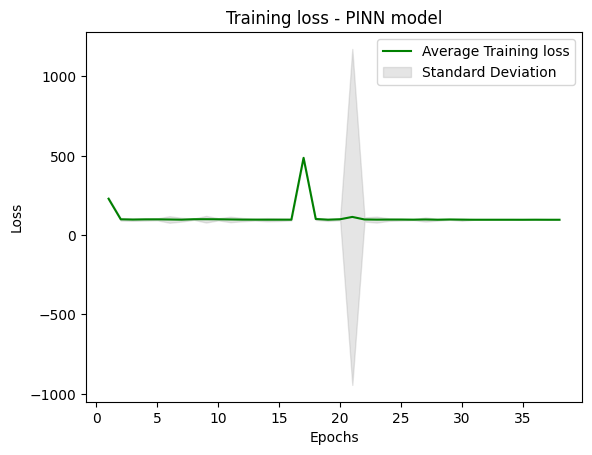

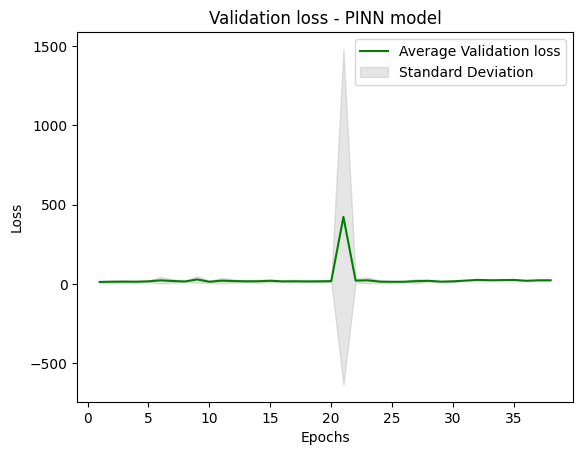

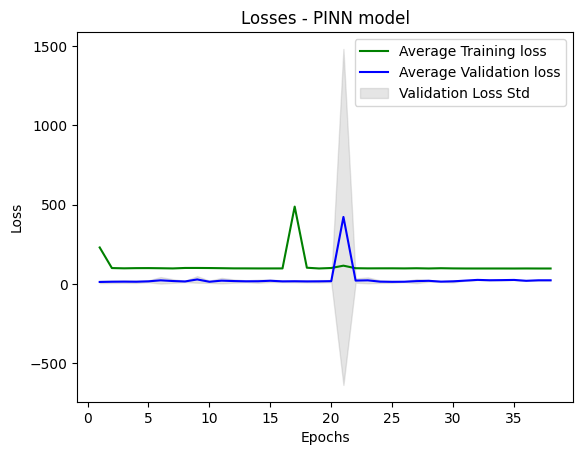

In [46]:
from itertools import zip_longest
import os

current_dir = os.getcwd()
results_dir = os.path.join(current_dir, 'PINN/321632/In2000_Out240/05/')
if not os.path.isdir(results_dir):
    os.makedirs(results_dir)

all_losses_training_in2000_out240_321632_05 = np.array(all_losses_training_in2000_out240_321632_05)
all_losses_validation_in2000_out240_321632_05 = np.array(all_losses_validation_in2000_out240_321632_05)

avg_loss_training = [np.mean([x[i] for x in all_losses_training_in2000_out240_321632_05 if len(x) > i]) for i in range(len(max(all_losses_training_in2000_out240_321632_05,key=len)))]
std_loss_training = np.nan_to_num(np.nanstd(np.array(list(zip_longest(*all_losses_training_in2000_out240_321632_05)),dtype=float),axis=1,ddof=1), copy=False)

avg_loss_validation = [np.mean([x[i] for x in all_losses_validation_in2000_out240_321632_05 if len(x) > i]) for i in range(len(max(all_losses_validation_in2000_out240_321632_05,key=len)))]
std_loss_validation = np.nan_to_num(np.nanstd(np.array(list(zip_longest(*all_losses_validation_in2000_out240_321632_05)),dtype=float),axis=1,ddof=1), copy=False)

# Plot the average losses with shaded standard deviation
#create vector of 1 to length of avg_loss_training for x-axis
epochNrs = np.arange(1, len(avg_loss_training)+1, 1)
plt.plot(epochNrs, avg_loss_training, 'g', label='Average Training loss')
plt.fill_between(epochNrs, avg_loss_training - std_loss_validation, avg_loss_training + std_loss_validation, color='gray', alpha=0.2, label='Standard Deviation')
plt.title('Training loss - PINN model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig(results_dir + 'pinn-training-loss-321632.pdf')  
plt.show()

epochNrs = np.arange(1, len(avg_loss_validation)+1, 1)
plt.plot(epochNrs, avg_loss_validation, 'g', label='Average Validation loss')
plt.fill_between(epochNrs, avg_loss_validation - std_loss_validation, avg_loss_validation + std_loss_validation, color='gray', alpha=0.2, label='Standard Deviation')
plt.title('Validation loss - PINN model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig(results_dir + 'pinn-validation-loss-321632.pdf')  
plt.show()

epochNrs = np.arange(1, len(avg_loss_validation)+1, 1)
plt.plot(epochNrs, avg_loss_training, 'g', label='Average Training loss')
plt.plot(epochNrs, avg_loss_validation, 'b', label='Average Validation loss')
plt.fill_between(epochNrs, avg_loss_validation - std_loss_validation, avg_loss_validation + std_loss_validation, color='gray', alpha=0.2, label='Validation Loss Std')
plt.title('Losses - PINN model')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig(results_dir + 'dense-allLosses-321632.pdf')  
plt.show()

(32, 2000, 7)
(32, 240, 7)
(1794, 240, 7)


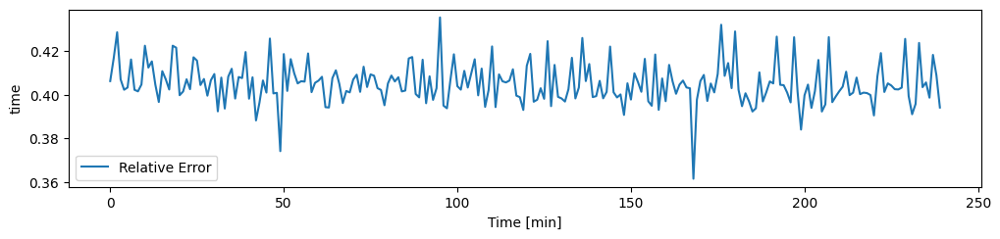

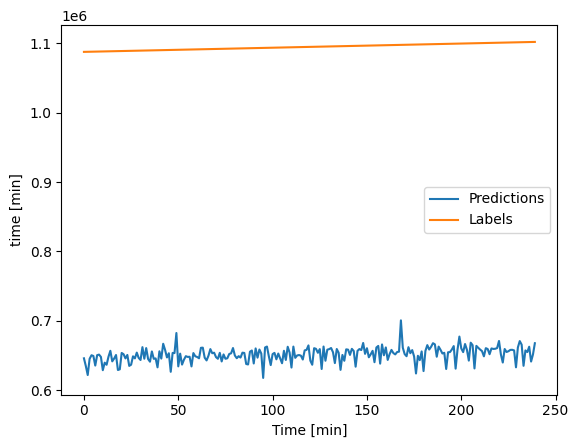

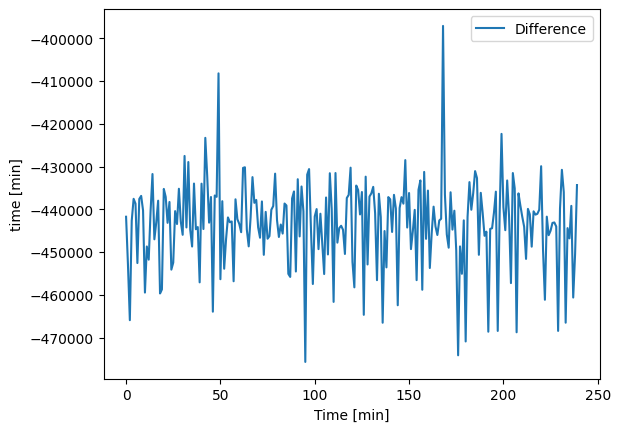

(32, 2000, 7)
(32, 240, 7)
(1794, 240, 7)


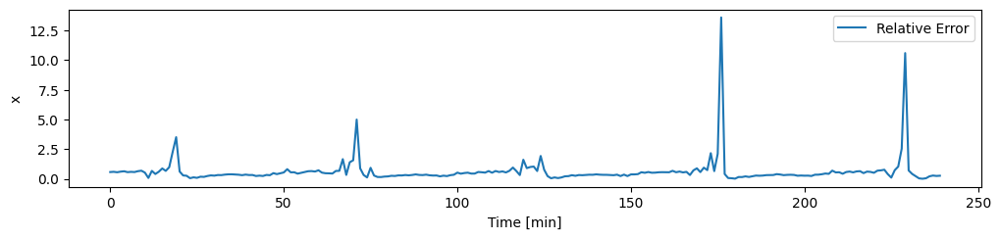

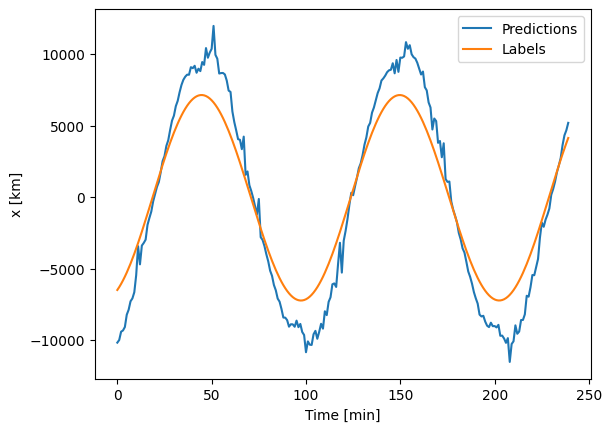

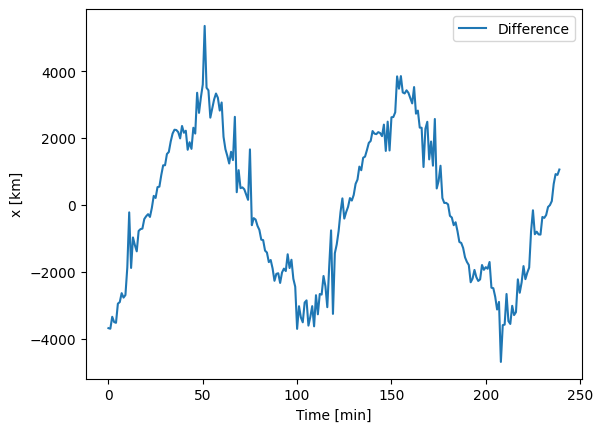

(32, 2000, 7)
(32, 240, 7)
(1794, 240, 7)


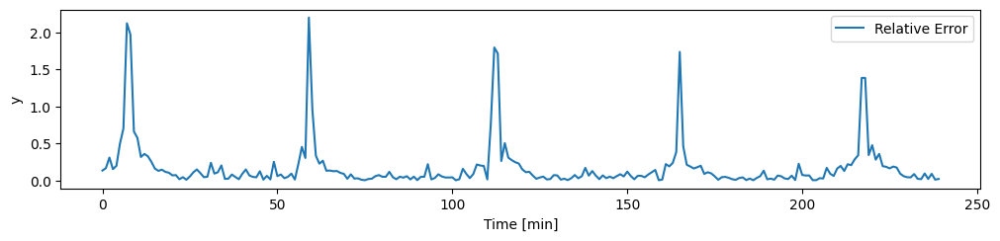

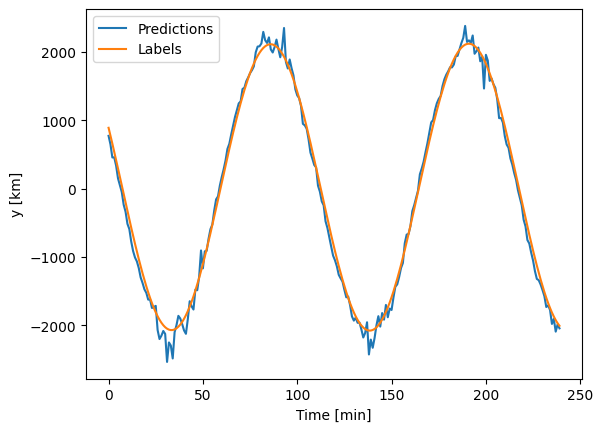

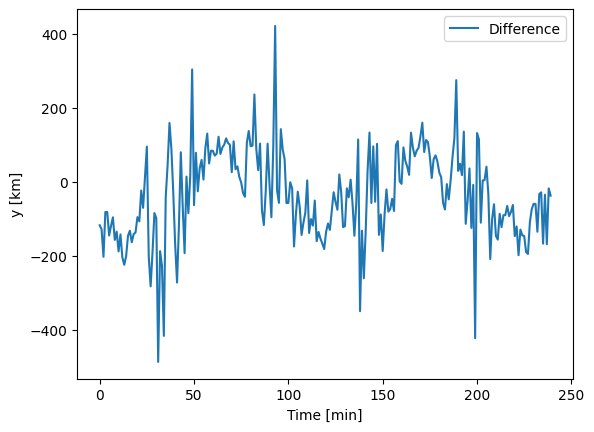

(32, 2000, 7)
(32, 240, 7)
(1794, 240, 7)


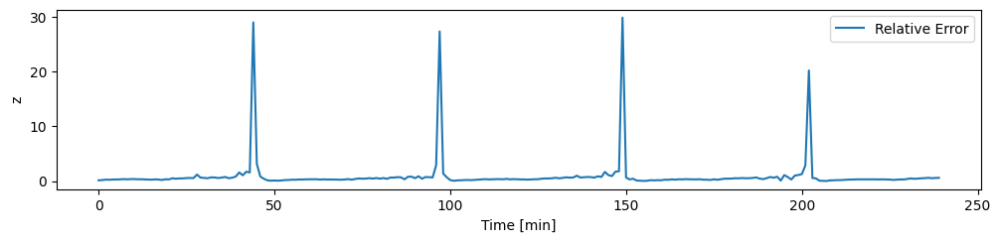

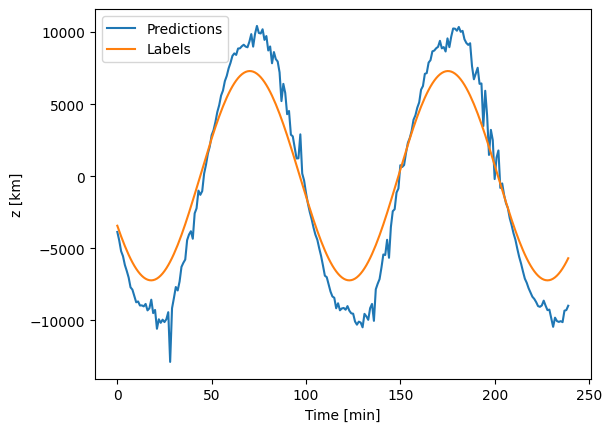

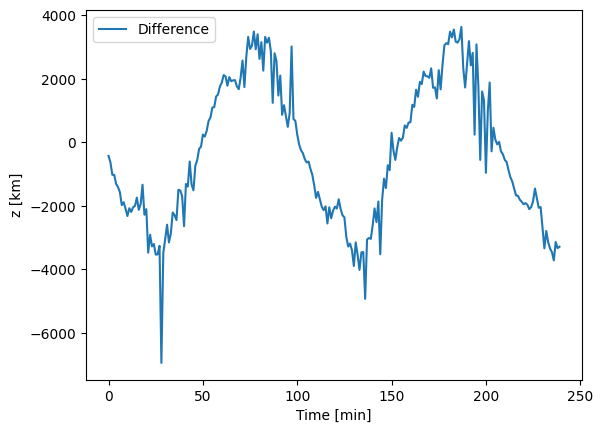

(32, 2000, 7)
(32, 240, 7)
(1794, 240, 7)


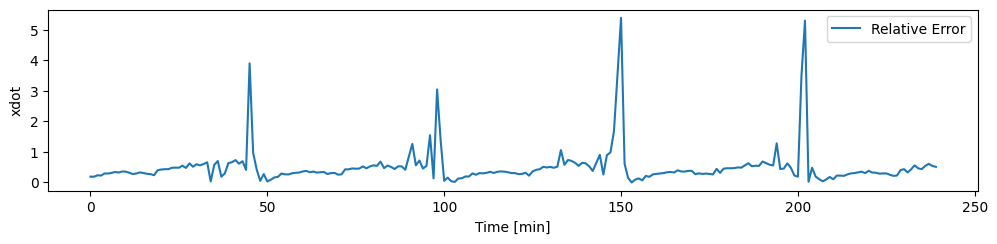

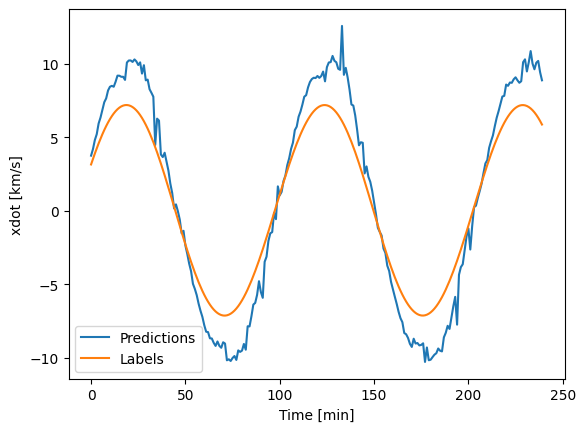

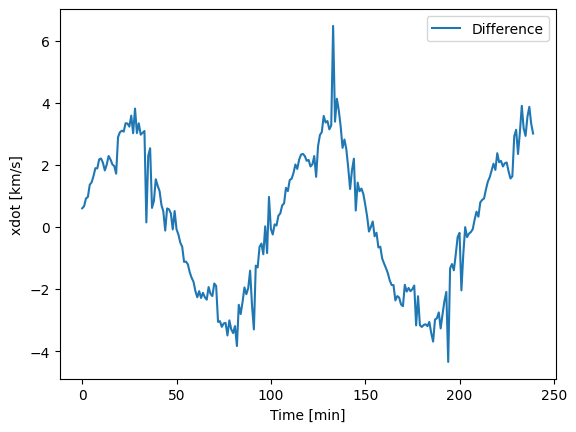

(32, 2000, 7)
(32, 240, 7)
(1794, 240, 7)


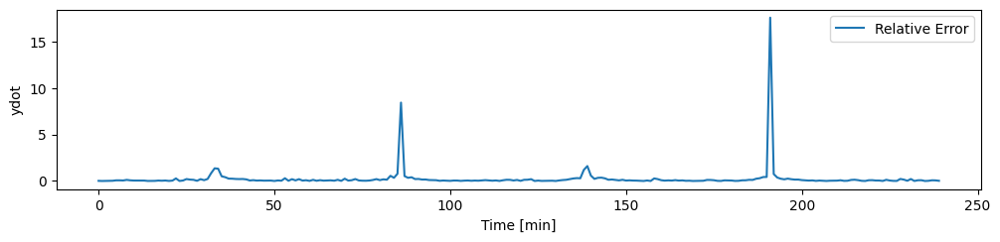

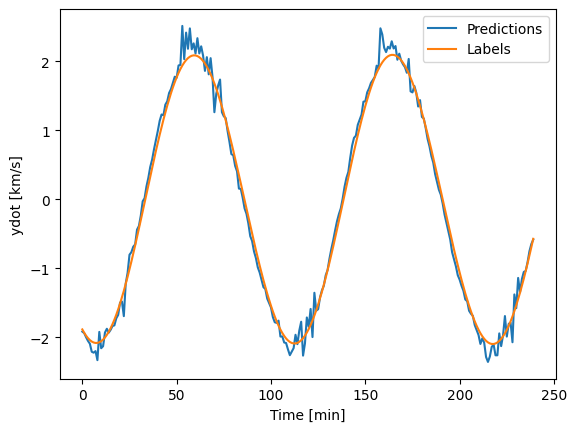

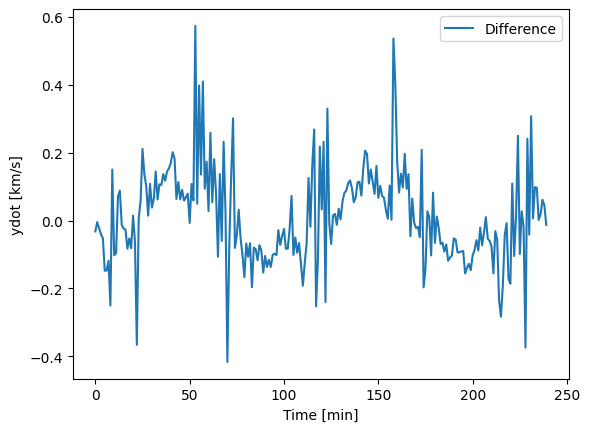

(32, 2000, 7)
(32, 240, 7)
(1794, 240, 7)


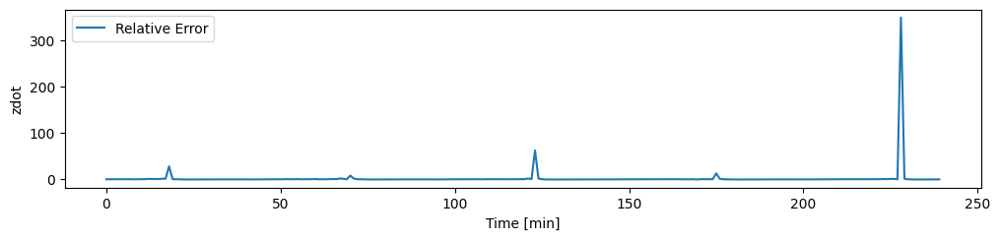

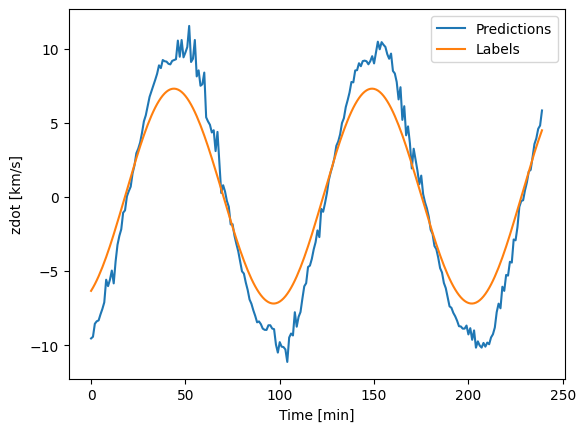

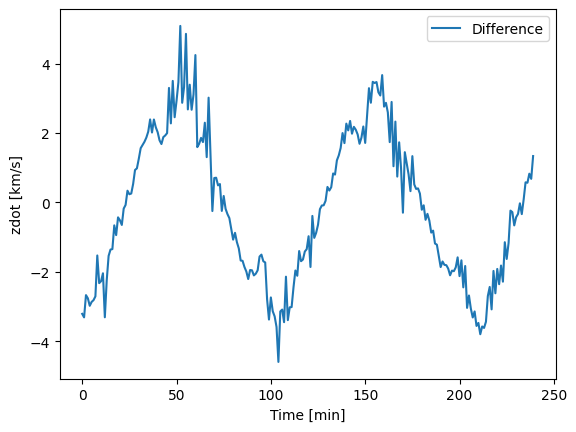

Mean Errors: 
X:  1861.706787109375
Y:  100.973388671875
Z:  1941.7713623046875
XDOT:  1.9240607023239136
YDOT:  0.10753787308931351
ZDOT:  1.8086227178573608


In [47]:
import IPython
import IPython.display
import os

#plot the difference between the real and the predicted values with the column as a parameter
def plot_diff_Dense(model, window, max_subplots=1, column=0, plot_col = "x", plot_units = "[km]"):
    
    #window.test?
    # print(window.test)
    inputs, labels = next(iter(window.test))
    
    inputs = inputs.numpy()
    labels = labels.numpy()
    predictions, physicalOutputs = model.predict(window.test)
    
    inputs = inputs * train_std_Dense[column] + train_mean_Dense[column]
    labels = labels * train_std_Dense[column] + train_mean_Dense[column]
    predictions  = predictions * train_std_Dense[column] + train_mean_Dense[column]
    
    print(inputs.shape)
    print(labels.shape)
    print(predictions.shape)

    plt.figure(figsize=(12, 8))
    max_n = min(max_subplots, len(inputs))


    for n in range(max_n):
            plt.subplot(3, 1, n+1)

            #fazer legendas diferentes para as velocidades
            plt.ylabel(plot_col)
            plt.plot(np.abs((predictions[n, :, column] - labels[n, :, column])/ labels[n, :, column]) ,label='Relative Error')
            plt.xlabel('Time [min]')
            plt.legend()
            plt.savefig(results_dir + 'pinn-training-relativeError-321632-' + plot_col + '.pdf')  
            plt.show()

            plt.ylabel(plot_col + ' ' + plot_units)
            plt.plot(predictions[n, :, column] ,label='Predictions')
            plt.plot(labels[n, :, column] ,label='Labels')
            plt.xlabel('Time [min]')
            plt.legend()
            plt.savefig(results_dir + 'pinn-training-PredictionsVSLabels-321632-' + plot_col + '.pdf')  
            plt.show()

            plt.ylabel(plot_col + ' ' + plot_units)
            plt.plot((predictions[n, :, column] - labels[n, :, column]) ,label='Difference')
            plt.xlabel('Time [min]')
            plt.legend()
            plt.savefig(results_dir + 'pinn-training-Difference-321632-' + plot_col + '.pdf')  
            plt.show()

plot_diff_Dense(modelTest_noInitialState_in2000_out240_321632_05, multi_window_Dense, column=0, plot_col = "time", plot_units = "[min]")
plot_diff_Dense(modelTest_noInitialState_in2000_out240_321632_05, multi_window_Dense, column=1, plot_col = "x", plot_units = "[km]")
plot_diff_Dense(modelTest_noInitialState_in2000_out240_321632_05, multi_window_Dense, column=2, plot_col = "y", plot_units = "[km]")
plot_diff_Dense(modelTest_noInitialState_in2000_out240_321632_05, multi_window_Dense, column=3, plot_col = "z", plot_units = "[km]")
plot_diff_Dense(modelTest_noInitialState_in2000_out240_321632_05, multi_window_Dense, column=4, plot_col = "xdot", plot_units = "[km/s]")
plot_diff_Dense(modelTest_noInitialState_in2000_out240_321632_05, multi_window_Dense, column=5, plot_col = "ydot", plot_units = "[km/s]")
plot_diff_Dense(modelTest_noInitialState_in2000_out240_321632_05, multi_window_Dense, column=6, plot_col = "zdot", plot_units = "[km/s]")



#calculate the mean absolute error for each column
def calculateMeanErrors(model, window, max_subplots=1, column=0):
    
    #repeat this for 10 trials and calculate the mean error
    meanError = 0
    nrTrials = 7
    for i in range(nrTrials):
        inputs, labels = next(iter(window.test))
        inputs = inputs.numpy()
        labels = labels.numpy()
        predictions, physicalOutputs = model.predict(window.test)
        
        inputs = inputs * train_std_Dense[column] + train_mean_Dense[column]
        labels = labels * train_std_Dense[column] + train_mean_Dense[column]
        predictions  = predictions * train_std_Dense[column] + train_mean_Dense[column]
        
        meanError += np.mean(np.abs(predictions[0, :, column] - labels[0, :, column]))
    meanError = meanError/nrTrials
    return meanError


    # inputs, labels = next(iter(window.test))
    
    # inputs = inputs.numpy()
    # labels = labels.numpy()
    # predictions, physicalOutputs = model.predict(window.test)
    
    # inputs = inputs * train_std_Dense[column] + train_mean_Dense[column]
    # labels = labels * train_std_Dense[column] + train_mean_Dense[column]
    # predictions  = predictions * train_std_Dense[column] + train_mean_Dense[column]
    
    
    # meanError = np.mean(np.abs(predictions[0, :, column] - labels[0, :, column]))
    # return meanError
    
    
meanErrorX = calculateMeanErrors(modelTest_noInitialState_in2000_out240_321632_05, multi_window_Dense, column=1)
meanErrorY = calculateMeanErrors(modelTest_noInitialState_in2000_out240_321632_05, multi_window_Dense, column=2)
meanErrorZ = calculateMeanErrors(modelTest_noInitialState_in2000_out240_321632_05, multi_window_Dense, column=3)
meanErrorXDOT = calculateMeanErrors(modelTest_noInitialState_in2000_out240_321632_05, multi_window_Dense, column=4)
meanErrorYDOT = calculateMeanErrors(modelTest_noInitialState_in2000_out240_321632_05, multi_window_Dense, column=5)
meanErrorZDOT = calculateMeanErrors(modelTest_noInitialState_in2000_out240_321632_05, multi_window_Dense, column=6)

print("Mean Errors: ")
print("X: ", meanErrorX)
print("Y: ", meanErrorY)
print("Z: ", meanErrorZ)
print("XDOT: ", meanErrorXDOT)
print("YDOT: ", meanErrorYDOT)
print("ZDOT: ", meanErrorZDOT)
